In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import time
import re
import nltk
import math
import os
import matplotlib.pyplot as plt
import sklearn.metrics
import json 
from datetime import datetime

from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import linear_model
from sklearn.linear_model import Perceptron

from sklearn import svm
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import linear_model
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import PassiveAggressiveClassifier

from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import roc_auc_score

import sklearn.metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import pickle

%matplotlib inline


In [2]:
# https://stackoverflow.com/questions/956867/how-to-get-string-objects-instead-of-unicode-from-json

def byteify(input):
    if isinstance(input, dict):
        return {byteify(key): byteify(value)
                for key, value in input.iteritems()}
    elif isinstance(input, list):
        return [byteify(element) for element in input]
    elif isinstance(input, unicode):
        return input.encode('utf-8')
    else:
        return input

In [3]:
# from https://pynative.com/python-json-load-and-loads-to-parse-json/

with open("logins.json", "r") as read_file:
    print("Converting JSON encoded data into Python dictionary")
    data_logins = json.load(read_file)
    data_logins_2 = byteify(data_logins)
    print("Decoded JSON Data From File")
    for key, value in data_logins_2.items():
        print(key, ":", value)
        print
    print("Done reading json file")

Converting JSON encoded data into Python dictionary
Decoded JSON Data From File
('login_time', ':', ['1970-01-01 20:13:18', '1970-01-01 20:16:10', '1970-01-01 20:16:37', '1970-01-01 20:16:36', '1970-01-01 20:26:21', '1970-01-01 20:21:41', '1970-01-01 20:12:16', '1970-01-01 20:35:47', '1970-01-01 20:35:38', '1970-01-01 20:47:52', '1970-01-01 20:26:05', '1970-01-01 20:31:03', '1970-01-01 20:34:46', '1970-01-01 20:36:34', '1970-01-01 20:39:25', '1970-01-01 20:40:37', '1970-01-01 20:34:58', '1970-01-01 20:43:59', '1970-01-01 20:47:46', '1970-01-01 20:46:34', '1970-01-01 20:56:07', '1970-01-01 20:49:12', '1970-01-01 20:59:06', '1970-01-01 20:59:59', '1970-01-01 21:15:01', '1970-01-01 21:09:24', '1970-01-01 21:19:24', '1970-01-01 21:20:53', '1970-01-01 21:29:19', '1970-01-01 21:58:05', '1970-01-01 21:51:51', '1970-01-01 21:59:40', '1970-01-01 22:08:34', '1970-01-01 22:02:51', '1970-01-01 21:58:32', '1970-01-01 22:02:31', '1970-01-01 22:05:32', '1970-01-01 22:02:46', '1970-01-01 22:10:28', '1


Done reading json file


In [4]:
my_logins = data_logins_2.values()


In [5]:
logins_all = []
for log in my_logins:
    logins_all.append(log)
    
print(len(logins_all))

1


In [6]:
#print(logins_all)

In [7]:
LOG_INS = []
for item in logins_all:
    for login in item:
        print(login)
        LOG_INS.append(login)
        print
        
print(len(LOG_INS))
print

1970-01-01 20:13:18

1970-01-01 20:16:10

1970-01-01 20:16:37

1970-01-01 20:16:36

1970-01-01 20:26:21

1970-01-01 20:21:41

1970-01-01 20:12:16

1970-01-01 20:35:47

1970-01-01 20:35:38

1970-01-01 20:47:52

1970-01-01 20:26:05

1970-01-01 20:31:03

1970-01-01 20:34:46

1970-01-01 20:36:34

1970-01-01 20:39:25

1970-01-01 20:40:37

1970-01-01 20:34:58

1970-01-01 20:43:59

1970-01-01 20:47:46

1970-01-01 20:46:34

1970-01-01 20:56:07

1970-01-01 20:49:12

1970-01-01 20:59:06

1970-01-01 20:59:59

1970-01-01 21:15:01

1970-01-01 21:09:24

1970-01-01 21:19:24

1970-01-01 21:20:53

1970-01-01 21:29:19

1970-01-01 21:58:05

1970-01-01 21:51:51

1970-01-01 21:59:40

1970-01-01 22:08:34

1970-01-01 22:02:51

1970-01-01 21:58:32

1970-01-01 22:02:31

1970-01-01 22:05:32

1970-01-01 22:02:46

1970-01-01 22:10:28

1970-01-01 22:11:58

1970-01-01 22:01:05

1970-01-01 22:19:10

1970-01-01 22:16:54

1970-01-01 22:17:32

1970-01-01 22:12:05

1970-01-01 22:23:03

1970-01-01 22:22:14

1970-01-01 22

1970-01-02 21:03:45

1970-01-02 21:09:53

1970-01-02 21:13:37

1970-01-02 21:06:31

1970-01-02 21:17:42

1970-01-02 21:07:43

1970-01-02 21:21:20

1970-01-02 21:11:42

1970-01-02 21:21:56

1970-01-02 21:24:07

1970-01-02 21:22:56

1970-01-02 21:17:13

1970-01-02 21:20:37

1970-01-02 21:29:54

1970-01-02 21:29:32

1970-01-02 21:30:19

1970-01-02 21:40:09

1970-01-02 21:25:56

1970-01-02 21:37:46

1970-01-02 21:35:09

1970-01-02 21:32:31

1970-01-02 21:35:41

1970-01-02 21:38:26

1970-01-02 21:48:22

1970-01-02 21:50:09

1970-01-02 21:45:29

1970-01-02 21:49:57

1970-01-02 21:47:52

1970-01-02 21:49:51

1970-01-02 21:42:46

1970-01-02 21:53:15

1970-01-02 21:41:41

1970-01-02 21:43:54

1970-01-02 21:43:58

1970-01-02 21:54:52

1970-01-02 21:59:25

1970-01-02 21:59:24

1970-01-02 21:59:52

1970-01-02 21:57:59

1970-01-02 22:03:36

1970-01-02 21:58:51

1970-01-02 22:07:13

1970-01-02 22:11:16

1970-01-02 21:55:15

1970-01-02 22:02:31

1970-01-02 22:03:36

1970-01-02 22:06:37

1970-01-02 22

1970-01-04 00:46:07

1970-01-04 00:46:52

1970-01-04 00:46:24

1970-01-04 00:52:46

1970-01-04 00:56:12

1970-01-04 00:41:37

1970-01-04 00:50:23

1970-01-04 00:50:58

1970-01-04 00:49:50

1970-01-04 01:08:30

1970-01-04 01:07:44

1970-01-04 01:03:30

1970-01-04 01:08:03

1970-01-04 01:12:07

1970-01-04 01:20:16

1970-01-04 01:21:32

1970-01-04 01:17:23

1970-01-04 01:13:56

1970-01-04 01:17:43

1970-01-04 01:11:38

1970-01-04 01:22:53

1970-01-04 01:17:52

1970-01-04 01:20:45

1970-01-04 01:15:55

1970-01-04 01:19:40

1970-01-04 01:23:26

1970-01-04 01:33:09

1970-01-04 01:17:02

1970-01-04 01:26:03

1970-01-04 01:18:07

1970-01-04 01:30:17

1970-01-04 01:33:39

1970-01-04 01:30:46

1970-01-04 01:30:28

1970-01-04 01:36:58

1970-01-04 01:30:54

1970-01-04 01:35:44

1970-01-04 01:34:56

1970-01-04 01:28:46

1970-01-04 01:31:31

1970-01-04 01:26:57

1970-01-04 01:41:58

1970-01-04 01:33:00

1970-01-04 01:34:22

1970-01-04 01:30:41

1970-01-04 01:34:51

1970-01-04 01:40:32

1970-01-04 01


1970-01-05 13:11:22

1970-01-05 13:11:31

1970-01-05 13:14:06

1970-01-05 13:14:56

1970-01-05 13:27:27

1970-01-05 13:36:15

1970-01-05 13:34:54

1970-01-05 13:31:07

1970-01-05 13:33:55

1970-01-05 13:28:06

1970-01-05 13:30:52

1970-01-05 13:28:43

1970-01-05 13:39:21

1970-01-05 13:42:11

1970-01-05 13:41:19

1970-01-05 13:40:27

1970-01-05 13:32:09

1970-01-05 13:46:09

1970-01-05 13:40:54

1970-01-05 13:46:55

1970-01-05 13:55:39

1970-01-05 13:51:01

1970-01-05 13:58:03

1970-01-05 14:04:27

1970-01-05 14:01:16

1970-01-05 14:13:59

1970-01-05 14:19:46

1970-01-05 14:11:56

1970-01-05 14:28:53

1970-01-05 14:29:00

1970-01-05 14:21:02

1970-01-05 14:21:55

1970-01-05 14:25:59

1970-01-05 14:41:06

1970-01-05 14:42:04

1970-01-05 14:40:12

1970-01-05 14:31:36

1970-01-05 14:38:47

1970-01-05 14:52:48

1970-01-05 14:58:27

1970-01-05 15:03:17

1970-01-05 15:13:38

1970-01-05 15:09:20

1970-01-05 15:11:17

1970-01-05 15:21:25

1970-01-05 15:21:37

1970-01-05 15:24:03

1970-01-05 1


1970-01-07 09:37:13

1970-01-07 09:40:01

1970-01-07 09:48:13

1970-01-07 09:52:38

1970-01-07 09:52:44

1970-01-07 10:01:09

1970-01-07 09:49:07

1970-01-07 09:56:45

1970-01-07 09:58:04

1970-01-07 10:03:05

1970-01-07 10:08:31

1970-01-07 10:04:15

1970-01-07 10:04:22

1970-01-07 10:04:13

1970-01-07 10:14:25

1970-01-07 10:17:27

1970-01-07 10:18:55

1970-01-07 10:21:13

1970-01-07 10:33:43

1970-01-07 10:36:06

1970-01-07 10:30:57

1970-01-07 10:31:57

1970-01-07 10:33:32

1970-01-07 10:32:33

1970-01-07 10:30:04

1970-01-07 10:34:06

1970-01-07 10:33:42

1970-01-07 10:39:06

1970-01-07 10:45:10

1970-01-07 10:35:45

1970-01-07 10:32:47

1970-01-07 10:40:55

1970-01-07 10:45:01

1970-01-07 10:41:47

1970-01-07 10:43:49

1970-01-07 10:34:55

1970-01-07 10:53:42

1970-01-07 10:50:11

1970-01-07 11:04:21

1970-01-07 10:59:25

1970-01-07 11:07:20

1970-01-07 11:07:53

1970-01-07 11:06:25

1970-01-07 11:08:16

1970-01-07 11:07:59

1970-01-07 11:01:58

1970-01-07 11:08:43

1970-01-07 1

1970-01-08 10:05:47

1970-01-08 10:15:02

1970-01-08 10:18:15

1970-01-08 10:21:53

1970-01-08 10:17:43

1970-01-08 10:28:55

1970-01-08 10:06:38

1970-01-08 10:25:54

1970-01-08 10:15:57

1970-01-08 10:23:26

1970-01-08 10:23:12

1970-01-08 10:30:29

1970-01-08 10:30:56

1970-01-08 10:37:12

1970-01-08 10:38:52

1970-01-08 10:37:01

1970-01-08 10:37:53

1970-01-08 10:39:14

1970-01-08 10:37:47

1970-01-08 10:49:09

1970-01-08 10:43:52

1970-01-08 10:44:24

1970-01-08 10:48:26

1970-01-08 10:44:38

1970-01-08 10:33:20

1970-01-08 10:41:31

1970-01-08 10:42:33

1970-01-08 10:46:56

1970-01-08 10:44:42

1970-01-08 10:48:10

1970-01-08 11:02:41

1970-01-08 11:04:00

1970-01-08 10:51:55

1970-01-08 11:06:35

1970-01-08 11:08:26

1970-01-08 11:00:45

1970-01-08 11:01:03

1970-01-08 11:15:00

1970-01-08 11:03:50

1970-01-08 11:11:15

1970-01-08 11:05:55

1970-01-08 11:05:42

1970-01-08 11:08:49

1970-01-08 11:12:19

1970-01-08 11:17:47

1970-01-08 11:20:15

1970-01-08 11:17:09

1970-01-08 11

1970-01-09 10:54:24

1970-01-09 10:50:15

1970-01-09 10:51:28

1970-01-09 11:00:31

1970-01-09 11:06:55

1970-01-09 10:56:07

1970-01-09 11:10:24

1970-01-09 11:14:18

1970-01-09 11:02:39

1970-01-09 11:15:31

1970-01-09 11:12:46

1970-01-09 11:08:09

1970-01-09 11:16:44

1970-01-09 11:27:47

1970-01-09 11:29:26

1970-01-09 11:23:35

1970-01-09 11:28:56

1970-01-09 11:28:36

1970-01-09 11:28:46

1970-01-09 11:32:20

1970-01-09 11:20:47

1970-01-09 11:27:56

1970-01-09 11:29:41

1970-01-09 11:29:44

1970-01-09 11:40:45

1970-01-09 11:39:12

1970-01-09 11:36:08

1970-01-09 11:39:56

1970-01-09 11:34:17

1970-01-09 11:40:43

1970-01-09 11:43:05

1970-01-09 11:38:44

1970-01-09 11:43:40

1970-01-09 11:43:47

1970-01-09 11:46:56

1970-01-09 11:45:43

1970-01-09 11:56:11

1970-01-09 11:46:45

1970-01-09 11:43:14

1970-01-09 11:43:01

1970-01-09 11:53:37

1970-01-09 11:55:52

1970-01-09 11:47:53

1970-01-09 11:56:02

1970-01-09 11:53:38

1970-01-09 11:48:56

1970-01-09 11:55:31

1970-01-09 11

1970-01-10 02:35:36

1970-01-10 02:27:08

1970-01-10 02:34:47

1970-01-10 02:34:29

1970-01-10 02:32:53

1970-01-10 02:39:59

1970-01-10 02:44:16

1970-01-10 02:40:07

1970-01-10 02:34:52

1970-01-10 02:40:32

1970-01-10 02:34:10

1970-01-10 02:37:45

1970-01-10 02:37:32

1970-01-10 02:41:02

1970-01-10 02:46:24

1970-01-10 02:46:54

1970-01-10 02:43:44

1970-01-10 02:40:41

1970-01-10 02:38:16

1970-01-10 02:27:26

1970-01-10 02:41:10

1970-01-10 02:35:55

1970-01-10 02:38:21

1970-01-10 02:46:54

1970-01-10 02:47:45

1970-01-10 02:43:51

1970-01-10 02:53:10

1970-01-10 02:50:44

1970-01-10 02:37:42

1970-01-10 02:56:04

1970-01-10 02:42:59

1970-01-10 02:46:04

1970-01-10 02:42:43

1970-01-10 02:33:42

1970-01-10 02:46:18

1970-01-10 02:50:45

1970-01-10 02:52:34

1970-01-10 02:58:15

1970-01-10 02:50:09

1970-01-10 02:49:06

1970-01-10 02:57:36

1970-01-10 03:04:01

1970-01-10 02:54:10

1970-01-10 02:54:30

1970-01-10 02:58:43

1970-01-10 02:55:12

1970-01-10 03:05:37

1970-01-10 02

1970-01-11 01:09:15

1970-01-11 00:56:59

1970-01-11 01:07:22

1970-01-11 00:59:31

1970-01-11 01:06:55

1970-01-11 01:03:13

1970-01-11 01:06:09

1970-01-11 00:59:09

1970-01-11 01:04:24

1970-01-11 00:58:05

1970-01-11 01:11:02

1970-01-11 01:09:55

1970-01-11 00:59:59

1970-01-11 01:11:36

1970-01-11 01:06:26

1970-01-11 01:07:15

1970-01-11 01:06:29

1970-01-11 01:15:27

1970-01-11 01:10:05

1970-01-11 01:18:04

1970-01-11 01:06:01

1970-01-11 01:05:27

1970-01-11 01:08:04

1970-01-11 01:10:14

1970-01-11 01:06:08

1970-01-11 01:10:23

1970-01-11 01:09:07

1970-01-11 01:16:03

1970-01-11 01:04:01

1970-01-11 01:11:46

1970-01-11 01:17:23

1970-01-11 01:12:19

1970-01-11 01:22:09

1970-01-11 01:24:15

1970-01-11 01:21:38

1970-01-11 01:23:50

1970-01-11 01:14:38

1970-01-11 01:20:18

1970-01-11 01:17:11

1970-01-11 01:25:37

1970-01-11 01:25:11

1970-01-11 01:13:02

1970-01-11 01:29:18

1970-01-11 01:21:46

1970-01-11 01:23:54

1970-01-11 01:14:23

1970-01-11 01:33:45

1970-01-11 01

1970-01-11 17:07:47

1970-01-11 17:13:37

1970-01-11 17:12:24

1970-01-11 17:11:51

1970-01-11 17:14:46

1970-01-11 17:11:47

1970-01-11 17:12:36

1970-01-11 17:12:33

1970-01-11 17:18:42

1970-01-11 17:11:02

1970-01-11 17:19:26

1970-01-11 17:19:30

1970-01-11 17:10:45

1970-01-11 17:24:50

1970-01-11 17:23:57

1970-01-11 17:17:00

1970-01-11 17:17:56

1970-01-11 17:25:34

1970-01-11 17:22:17

1970-01-11 17:27:33

1970-01-11 17:37:19

1970-01-11 17:22:48

1970-01-11 17:35:42

1970-01-11 17:26:40

1970-01-11 17:29:20

1970-01-11 17:24:58

1970-01-11 17:30:25

1970-01-11 17:30:41

1970-01-11 17:26:29

1970-01-11 17:22:00

1970-01-11 17:30:06

1970-01-11 17:32:11

1970-01-11 17:29:44

1970-01-11 17:37:42

1970-01-11 17:32:30

1970-01-11 17:27:05

1970-01-11 17:27:43

1970-01-11 17:43:02

1970-01-11 17:33:50

1970-01-11 17:42:05

1970-01-11 17:38:00

1970-01-11 17:46:11

1970-01-11 17:37:04

1970-01-11 17:38:46

1970-01-11 17:34:29

1970-01-11 17:38:29

1970-01-11 17:39:51

1970-01-11 17

1970-01-12 22:33:20

1970-01-12 22:51:01

1970-01-12 22:38:35

1970-01-12 22:44:00

1970-01-12 22:49:42

1970-01-12 22:44:22

1970-01-12 22:54:27

1970-01-12 22:50:59

1970-01-12 22:52:42

1970-01-12 23:04:55

1970-01-12 22:46:55

1970-01-12 22:58:13

1970-01-12 23:02:06

1970-01-12 23:09:41

1970-01-12 23:05:49

1970-01-12 23:08:01

1970-01-12 23:17:59

1970-01-12 23:18:05

1970-01-12 23:27:46

1970-01-12 23:21:43

1970-01-12 23:27:42

1970-01-12 23:29:04

1970-01-12 23:31:40

1970-01-12 23:35:38

1970-01-12 23:29:04

1970-01-12 23:41:40

1970-01-12 23:39:34

1970-01-12 23:37:48

1970-01-12 23:40:54

1970-01-12 23:42:58

1970-01-12 23:48:06

1970-01-12 23:49:09

1970-01-12 23:54:16

1970-01-13 00:03:46

1970-01-13 00:11:06

1970-01-13 00:00:30

1970-01-13 00:03:59

1970-01-13 00:05:01

1970-01-13 00:10:54

1970-01-13 00:22:30

1970-01-13 00:21:12

1970-01-13 00:27:33

1970-01-13 00:31:20

1970-01-13 00:29:24

1970-01-13 00:24:04

1970-01-13 00:31:56

1970-01-13 00:20:42

1970-01-13 00


1970-01-14 15:22:42

1970-01-14 15:11:00

1970-01-14 15:23:49

1970-01-14 15:33:21

1970-01-14 15:34:06

1970-01-14 15:28:49

1970-01-14 15:30:38

1970-01-14 15:49:07

1970-01-14 15:47:49

1970-01-14 15:49:00

1970-01-14 15:46:34

1970-01-14 16:04:20

1970-01-14 15:54:55

1970-01-14 15:52:25

1970-01-14 16:05:48

1970-01-14 16:00:32

1970-01-14 16:07:49

1970-01-14 16:04:52

1970-01-14 16:18:26

1970-01-14 16:13:43

1970-01-14 16:20:51

1970-01-14 16:18:20

1970-01-14 16:23:05

1970-01-14 16:48:39

1970-01-14 16:44:48

1970-01-14 16:58:32

1970-01-14 16:59:19

1970-01-14 16:59:46

1970-01-14 17:00:56

1970-01-14 17:08:48

1970-01-14 17:12:52

1970-01-14 17:20:16

1970-01-14 17:21:19

1970-01-14 17:39:59

1970-01-14 17:34:47

1970-01-14 17:42:16

1970-01-14 17:42:43

1970-01-14 17:48:16

1970-01-14 18:00:49

1970-01-14 18:02:33

1970-01-14 18:07:39

1970-01-14 18:10:22

1970-01-14 18:20:29

1970-01-14 18:27:24

1970-01-14 18:24:32

1970-01-14 18:34:54

1970-01-14 18:40:44

1970-01-14 1

1970-01-16 01:35:16

1970-01-16 01:47:38

1970-01-16 01:50:33

1970-01-16 01:59:18

1970-01-16 01:55:27

1970-01-16 01:56:15

1970-01-16 01:55:19

1970-01-16 02:03:44

1970-01-16 01:59:28

1970-01-16 01:55:52

1970-01-16 01:59:28

1970-01-16 02:07:07

1970-01-16 02:12:29

1970-01-16 02:08:56

1970-01-16 02:03:15

1970-01-16 02:07:39

1970-01-16 02:08:11

1970-01-16 02:07:58

1970-01-16 02:13:09

1970-01-16 02:11:59

1970-01-16 02:08:35

1970-01-16 02:02:51

1970-01-16 02:25:01

1970-01-16 02:27:59

1970-01-16 02:15:39

1970-01-16 02:18:12

1970-01-16 02:21:19

1970-01-16 02:33:45

1970-01-16 02:22:17

1970-01-16 02:34:20

1970-01-16 02:20:16

1970-01-16 02:29:12

1970-01-16 02:34:02

1970-01-16 02:40:55

1970-01-16 02:37:29

1970-01-16 02:48:53

1970-01-16 02:42:09

1970-01-16 02:46:26

1970-01-16 02:36:26

1970-01-16 02:43:00

1970-01-16 02:46:57

1970-01-16 02:49:39

1970-01-16 02:41:04

1970-01-16 02:47:53

1970-01-16 02:46:11

1970-01-16 02:50:35

1970-01-16 02:50:58

1970-01-16 02

1970-01-17 01:06:50

1970-01-17 01:21:15

1970-01-17 01:11:05

1970-01-17 01:12:19

1970-01-17 01:12:47

1970-01-17 01:17:53

1970-01-17 01:19:48

1970-01-17 01:23:07

1970-01-17 01:15:27

1970-01-17 01:16:37

1970-01-17 01:07:37

1970-01-17 01:27:32

1970-01-17 01:26:42

1970-01-17 01:25:06

1970-01-17 01:16:14

1970-01-17 01:22:55

1970-01-17 01:24:20

1970-01-17 01:25:14

1970-01-17 01:26:59

1970-01-17 01:29:31

1970-01-17 01:27:13

1970-01-17 01:27:59

1970-01-17 01:19:56

1970-01-17 01:23:58

1970-01-17 01:24:09

1970-01-17 01:39:18

1970-01-17 01:31:54

1970-01-17 01:37:55

1970-01-17 01:36:24

1970-01-17 01:30:46

1970-01-17 01:38:04

1970-01-17 01:37:57

1970-01-17 01:30:05

1970-01-17 01:37:14

1970-01-17 01:34:06

1970-01-17 01:45:26

1970-01-17 01:41:33

1970-01-17 01:40:03

1970-01-17 01:35:30

1970-01-17 01:30:32

1970-01-17 01:38:36

1970-01-17 01:40:48

1970-01-17 01:42:47

1970-01-17 01:46:34

1970-01-17 01:42:57

1970-01-17 01:41:14

1970-01-17 01:27:31

1970-01-17 01


1970-01-17 20:55:40

1970-01-17 20:48:33

1970-01-17 20:47:03

1970-01-17 20:50:19

1970-01-17 20:50:13

1970-01-17 20:48:44

1970-01-17 20:52:12

1970-01-17 20:47:16

1970-01-17 20:56:12

1970-01-17 20:45:28

1970-01-17 20:45:15

1970-01-17 20:53:31

1970-01-17 20:44:39

1970-01-17 20:50:54

1970-01-17 20:55:43

1970-01-17 20:59:58

1970-01-17 20:55:33

1970-01-17 20:58:06

1970-01-17 20:50:06

1970-01-17 21:04:27

1970-01-17 21:04:24

1970-01-17 21:11:53

1970-01-17 21:03:44

1970-01-17 21:13:13

1970-01-17 21:12:11

1970-01-17 21:10:44

1970-01-17 21:16:04

1970-01-17 21:17:19

1970-01-17 21:16:39

1970-01-17 21:24:06

1970-01-17 21:30:06

1970-01-17 21:22:21

1970-01-17 21:22:33

1970-01-17 21:20:17

1970-01-17 21:20:43

1970-01-17 21:32:50

1970-01-17 21:18:12

1970-01-17 21:22:19

1970-01-17 21:20:05

1970-01-17 21:34:28

1970-01-17 21:36:24

1970-01-17 21:23:44

1970-01-17 21:28:25

1970-01-17 21:31:35

1970-01-17 21:31:11

1970-01-17 21:38:04

1970-01-17 21:40:33

1970-01-17 2


1970-01-18 12:43:39

1970-01-18 12:46:15

1970-01-18 12:55:39

1970-01-18 13:00:15

1970-01-18 12:54:53

1970-01-18 13:05:00

1970-01-18 13:17:36

1970-01-18 13:13:39

1970-01-18 13:19:46

1970-01-18 13:13:08

1970-01-18 13:17:17

1970-01-18 13:21:37

1970-01-18 13:26:23

1970-01-18 13:36:55

1970-01-18 13:26:48

1970-01-18 13:40:49

1970-01-18 13:39:54

1970-01-18 13:27:48

1970-01-18 13:34:08

1970-01-18 13:43:30

1970-01-18 13:36:06

1970-01-18 13:40:14

1970-01-18 13:31:43

1970-01-18 13:39:24

1970-01-18 13:38:27

1970-01-18 13:45:43

1970-01-18 13:46:47

1970-01-18 13:48:28

1970-01-18 13:45:55

1970-01-18 13:49:00

1970-01-18 13:38:24

1970-01-18 13:39:31

1970-01-18 13:38:29

1970-01-18 13:37:51

1970-01-18 13:51:58

1970-01-18 13:50:38

1970-01-18 13:49:02

1970-01-18 13:54:53

1970-01-18 14:02:17

1970-01-18 13:59:22

1970-01-18 14:09:15

1970-01-18 13:58:35

1970-01-18 14:01:26

1970-01-18 14:00:59

1970-01-18 14:16:39

1970-01-18 14:14:22

1970-01-18 14:21:32

1970-01-18 1

1970-01-19 21:08:24

1970-01-19 21:17:01

1970-01-19 21:00:12

1970-01-19 21:07:55

1970-01-19 21:23:13

1970-01-19 20:58:48

1970-01-19 21:05:45

1970-01-19 21:05:46

1970-01-19 21:13:55

1970-01-19 21:18:10

1970-01-19 21:11:56

1970-01-19 21:15:07

1970-01-19 21:26:05

1970-01-19 21:22:40

1970-01-19 21:17:17

1970-01-19 21:15:11

1970-01-19 21:22:52

1970-01-19 21:23:40

1970-01-19 21:28:43

1970-01-19 21:27:57

1970-01-19 21:34:00

1970-01-19 21:26:10

1970-01-19 21:31:12

1970-01-19 21:44:19

1970-01-19 21:39:02

1970-01-19 21:49:52

1970-01-19 21:42:42

1970-01-19 21:47:51

1970-01-19 21:47:54

1970-01-19 21:46:26

1970-01-19 21:43:36

1970-01-19 21:44:25

1970-01-19 21:41:17

1970-01-19 21:51:32

1970-01-19 21:43:11

1970-01-19 22:01:18

1970-01-19 22:00:09

1970-01-19 21:54:33

1970-01-19 22:02:00

1970-01-19 22:09:46

1970-01-19 22:02:45

1970-01-19 22:24:49

1970-01-19 22:17:04

1970-01-19 22:17:14

1970-01-19 22:21:52

1970-01-19 22:15:04

1970-01-19 22:18:46

1970-01-19 22


1970-01-21 15:37:05

1970-01-21 15:37:14

1970-01-21 15:41:58

1970-01-21 15:54:56

1970-01-21 16:15:59

1970-01-21 16:22:17

1970-01-21 16:30:29

1970-01-21 16:37:18

1970-01-21 16:37:06

1970-01-21 16:40:26

1970-01-21 16:54:53

1970-01-21 16:50:30

1970-01-21 16:46:37

1970-01-21 17:04:37

1970-01-21 17:01:07

1970-01-21 17:16:30

1970-01-21 17:13:38

1970-01-21 17:28:34

1970-01-21 17:16:28

1970-01-21 17:32:22

1970-01-21 17:26:37

1970-01-21 17:41:40

1970-01-21 17:38:37

1970-01-21 17:44:19

1970-01-21 17:56:54

1970-01-21 18:12:07

1970-01-21 18:14:23

1970-01-21 18:13:34

1970-01-21 18:38:25

1970-01-21 18:53:12

1970-01-21 18:46:24

1970-01-21 18:54:34

1970-01-21 18:57:46

1970-01-21 19:03:40

1970-01-21 19:04:14

1970-01-21 19:38:04

1970-01-21 19:32:38

1970-01-21 19:20:35

1970-01-21 19:35:21

1970-01-21 19:22:25

1970-01-21 19:37:25

1970-01-21 19:45:06

1970-01-21 20:19:49

1970-01-21 20:08:40

1970-01-21 20:14:43

1970-01-21 20:11:29

1970-01-21 20:09:35

1970-01-21 2

1970-01-23 01:26:17

1970-01-23 01:18:44

1970-01-23 01:32:10

1970-01-23 01:28:08

1970-01-23 01:22:44

1970-01-23 01:25:06

1970-01-23 01:38:13

1970-01-23 01:34:03

1970-01-23 01:27:26

1970-01-23 01:20:44

1970-01-23 01:30:11

1970-01-23 01:27:39

1970-01-23 01:28:53

1970-01-23 01:40:54

1970-01-23 01:34:51

1970-01-23 01:38:30

1970-01-23 01:36:22

1970-01-23 01:37:43

1970-01-23 01:42:14

1970-01-23 01:46:45

1970-01-23 01:51:56

1970-01-23 01:38:02

1970-01-23 01:37:31

1970-01-23 01:44:27

1970-01-23 01:46:33

1970-01-23 01:40:53

1970-01-23 01:41:21

1970-01-23 01:42:20

1970-01-23 01:54:07

1970-01-23 01:35:02

1970-01-23 01:50:28

1970-01-23 01:44:53

1970-01-23 01:50:28

1970-01-23 01:39:34

1970-01-23 01:52:56

1970-01-23 01:42:41

1970-01-23 01:50:53

1970-01-23 01:51:26

1970-01-23 01:51:37

1970-01-23 01:58:33

1970-01-23 01:58:03

1970-01-23 01:52:26

1970-01-23 01:54:05

1970-01-23 01:50:40

1970-01-23 01:54:08

1970-01-23 01:55:00

1970-01-23 02:11:12

1970-01-23 02

1970-01-23 23:42:31

1970-01-23 23:55:05

1970-01-23 23:48:54

1970-01-23 23:43:03

1970-01-23 23:43:36

1970-01-23 23:38:26

1970-01-24 00:00:28

1970-01-23 23:59:58

1970-01-23 23:57:20

1970-01-23 23:55:49

1970-01-23 23:55:19

1970-01-23 23:58:43

1970-01-23 23:59:57

1970-01-23 23:52:51

1970-01-24 00:00:28

1970-01-24 00:01:38

1970-01-23 23:59:08

1970-01-24 00:02:19

1970-01-24 00:07:26

1970-01-24 00:07:40

1970-01-24 00:09:55

1970-01-24 00:15:46

1970-01-24 00:06:21

1970-01-24 00:11:15

1970-01-24 00:02:17

1970-01-24 00:13:34

1970-01-24 00:04:38

1970-01-24 00:06:00

1970-01-24 00:09:36

1970-01-24 00:19:42

1970-01-24 00:13:16

1970-01-24 00:19:39

1970-01-24 00:14:11

1970-01-24 00:17:22

1970-01-24 00:09:26

1970-01-24 00:20:12

1970-01-24 00:26:13

1970-01-24 00:18:54

1970-01-24 00:25:45

1970-01-24 00:16:22

1970-01-24 00:22:49

1970-01-24 00:28:16

1970-01-24 00:21:47

1970-01-24 00:25:28

1970-01-24 00:33:26

1970-01-24 00:28:56

1970-01-24 00:30:55

1970-01-24 00

1970-01-24 22:28:57

1970-01-24 22:33:00

1970-01-24 22:30:13

1970-01-24 22:38:34

1970-01-24 22:37:48

1970-01-24 22:35:52

1970-01-24 22:32:40

1970-01-24 22:40:55

1970-01-24 22:36:12

1970-01-24 22:37:38

1970-01-24 22:34:31

1970-01-24 22:50:25

1970-01-24 22:40:38

1970-01-24 22:40:04

1970-01-24 22:37:59

1970-01-24 22:39:13

1970-01-24 22:50:17

1970-01-24 22:40:20

1970-01-24 22:46:03

1970-01-24 22:55:00

1970-01-24 22:50:11

1970-01-24 22:57:39

1970-01-24 22:54:04

1970-01-24 22:44:10

1970-01-24 23:06:41

1970-01-24 22:52:17

1970-01-24 23:00:16

1970-01-24 22:59:08

1970-01-24 22:59:51

1970-01-24 23:03:27

1970-01-24 22:46:42

1970-01-24 22:52:10

1970-01-24 22:57:01

1970-01-24 22:59:41

1970-01-24 23:03:04

1970-01-24 22:57:02

1970-01-24 22:50:16

1970-01-24 23:10:35

1970-01-24 23:03:25

1970-01-24 23:13:14

1970-01-24 23:09:42

1970-01-24 23:04:02

1970-01-24 23:07:02

1970-01-24 23:07:53

1970-01-24 23:06:19

1970-01-24 23:13:46

1970-01-24 23:10:56

1970-01-24 23

1970-01-25 16:37:26

1970-01-25 16:41:10

1970-01-25 16:44:21

1970-01-25 16:45:13

1970-01-25 16:50:23

1970-01-25 16:49:53

1970-01-25 16:50:45

1970-01-25 16:49:54

1970-01-25 17:00:09

1970-01-25 16:57:05

1970-01-25 17:01:40

1970-01-25 17:13:31

1970-01-25 17:08:44

1970-01-25 17:18:10

1970-01-25 17:13:17

1970-01-25 17:16:25

1970-01-25 17:12:43

1970-01-25 17:15:57

1970-01-25 17:21:55

1970-01-25 17:26:06

1970-01-25 17:31:20

1970-01-25 17:28:38

1970-01-25 17:40:53

1970-01-25 17:29:46

1970-01-25 17:55:34

1970-01-25 18:00:05

1970-01-25 17:41:48

1970-01-25 17:58:07

1970-01-25 17:56:06

1970-01-25 18:07:10

1970-01-25 18:09:58

1970-01-25 18:01:36

1970-01-25 18:09:15

1970-01-25 18:06:45

1970-01-25 18:06:53

1970-01-25 18:21:19

1970-01-25 18:10:24

1970-01-25 18:24:34

1970-01-25 18:35:54

1970-01-25 18:34:44

1970-01-25 18:28:28

1970-01-25 18:44:15

1970-01-25 18:42:56

1970-01-25 18:40:22

1970-01-25 18:46:01

1970-01-25 18:30:53

1970-01-25 18:38:32

1970-01-25 18

1970-01-27 11:56:05

1970-01-27 11:43:29

1970-01-27 11:42:02

1970-01-27 11:49:33

1970-01-27 11:54:05

1970-01-27 11:59:41

1970-01-27 11:57:46

1970-01-27 11:57:07

1970-01-27 12:03:20

1970-01-27 11:54:32

1970-01-27 12:00:27

1970-01-27 11:57:53

1970-01-27 12:01:06

1970-01-27 12:02:38

1970-01-27 12:08:34

1970-01-27 12:09:27

1970-01-27 12:14:28

1970-01-27 12:12:34

1970-01-27 12:12:17

1970-01-27 12:01:57

1970-01-27 12:06:37

1970-01-27 12:06:27

1970-01-27 12:09:11

1970-01-27 12:19:19

1970-01-27 12:20:18

1970-01-27 12:20:44

1970-01-27 12:12:01

1970-01-27 12:25:30

1970-01-27 12:23:55

1970-01-27 12:14:39

1970-01-27 12:20:01

1970-01-27 12:16:55

1970-01-27 12:21:43

1970-01-27 12:18:55

1970-01-27 12:26:15

1970-01-27 12:19:06

1970-01-27 12:21:46

1970-01-27 12:26:40

1970-01-27 12:33:33

1970-01-27 12:27:10

1970-01-27 12:37:49

1970-01-27 12:38:36

1970-01-27 12:36:04

1970-01-27 12:39:25

1970-01-27 12:32:25

1970-01-27 12:40:44

1970-01-27 12:37:45

1970-01-27 12

1970-01-28 14:37:44

1970-01-28 14:43:47

1970-01-28 14:33:12

1970-01-28 14:46:57

1970-01-28 14:46:00

1970-01-28 14:58:29

1970-01-28 14:55:38

1970-01-28 14:55:46

1970-01-28 14:47:28

1970-01-28 14:50:07

1970-01-28 14:53:33

1970-01-28 15:03:51

1970-01-28 15:00:25

1970-01-28 15:07:32

1970-01-28 15:12:17

1970-01-28 15:12:10

1970-01-28 15:08:32

1970-01-28 15:24:20

1970-01-28 15:26:39

1970-01-28 15:23:04

1970-01-28 15:24:44

1970-01-28 15:40:46

1970-01-28 15:40:47

1970-01-28 15:38:51

1970-01-28 15:36:42

1970-01-28 15:38:02

1970-01-28 15:46:07

1970-01-28 15:51:01

1970-01-28 15:47:03

1970-01-28 15:42:36

1970-01-28 15:53:37

1970-01-28 16:01:58

1970-01-28 16:13:04

1970-01-28 16:05:19

1970-01-28 15:59:37

1970-01-28 16:21:50

1970-01-28 16:12:14

1970-01-28 16:32:39

1970-01-28 16:39:47

1970-01-28 16:48:11

1970-01-28 16:59:00

1970-01-28 17:00:58

1970-01-28 16:58:11

1970-01-28 17:23:30

1970-01-28 17:33:10

1970-01-28 17:47:26

1970-01-28 17:41:02

1970-01-28 17

1970-01-29 22:10:22

1970-01-29 22:22:08

1970-01-29 22:22:45

1970-01-29 22:11:13

1970-01-29 22:22:33

1970-01-29 22:15:51

1970-01-29 22:23:42

1970-01-29 22:32:43

1970-01-29 22:29:20

1970-01-29 22:33:34

1970-01-29 22:22:52

1970-01-29 22:24:25

1970-01-29 22:22:06

1970-01-29 22:23:34

1970-01-29 22:31:48

1970-01-29 22:33:42

1970-01-29 22:35:10

1970-01-29 22:37:22

1970-01-29 22:41:22

1970-01-29 22:31:34

1970-01-29 22:33:11

1970-01-29 22:38:48

1970-01-29 22:33:19

1970-01-29 22:41:36

1970-01-29 22:35:06

1970-01-29 22:47:10

1970-01-29 22:43:28

1970-01-29 22:37:04

1970-01-29 22:34:10

1970-01-29 22:48:10

1970-01-29 22:34:57

1970-01-29 22:48:28

1970-01-29 22:45:48

1970-01-29 22:42:55

1970-01-29 22:49:09

1970-01-29 22:48:01

1970-01-29 22:43:36

1970-01-29 22:49:17

1970-01-29 22:57:20

1970-01-29 22:46:32

1970-01-29 22:51:03

1970-01-29 22:52:03

1970-01-29 22:58:58

1970-01-29 22:48:19

1970-01-29 23:00:48

1970-01-29 23:01:29

1970-01-29 22:56:53

1970-01-29 22


1970-01-31 00:32:05

1970-01-31 00:41:52

1970-01-31 00:41:18

1970-01-31 00:34:01

1970-01-31 00:33:02

1970-01-31 00:32:40

1970-01-31 00:41:57

1970-01-31 00:42:45

1970-01-31 00:41:25

1970-01-31 00:46:00

1970-01-31 00:48:57

1970-01-31 00:43:09

1970-01-31 00:51:46

1970-01-31 00:50:46

1970-01-31 00:56:40

1970-01-31 00:55:11

1970-01-31 00:47:41

1970-01-31 00:52:39

1970-01-31 00:57:45

1970-01-31 00:57:30

1970-01-31 00:59:51

1970-01-31 00:58:32

1970-01-31 00:51:54

1970-01-31 00:54:41

1970-01-31 00:43:15

1970-01-31 00:57:23

1970-01-31 01:07:33

1970-01-31 01:04:20

1970-01-31 01:03:13

1970-01-31 01:10:08

1970-01-31 01:24:54

1970-01-31 01:12:09

1970-01-31 01:17:49

1970-01-31 01:13:29

1970-01-31 01:08:30

1970-01-31 01:17:27

1970-01-31 01:13:29

1970-01-31 01:22:04

1970-01-31 01:21:11

1970-01-31 01:15:23

1970-01-31 01:23:21

1970-01-31 01:13:23

1970-01-31 01:10:24

1970-01-31 01:22:39

1970-01-31 01:29:25

1970-01-31 01:26:44

1970-01-31 01:25:16

1970-01-31 0

1970-02-01 01:37:51

1970-02-01 01:36:19

1970-02-01 01:38:17

1970-02-01 01:40:59

1970-02-01 01:44:06

1970-02-01 01:42:52

1970-02-01 01:42:23

1970-02-01 01:46:24

1970-02-01 01:37:26

1970-02-01 01:49:49

1970-02-01 01:47:03

1970-02-01 01:49:34

1970-02-01 01:55:09

1970-02-01 01:47:04

1970-02-01 01:57:46

1970-02-01 01:44:09

1970-02-01 01:54:45

1970-02-01 01:58:17

1970-02-01 01:56:44

1970-02-01 01:54:10

1970-02-01 01:54:06

1970-02-01 01:57:33

1970-02-01 01:59:24

1970-02-01 02:02:49

1970-02-01 02:08:31

1970-02-01 02:02:14

1970-02-01 02:02:01

1970-02-01 02:04:16

1970-02-01 02:00:41

1970-02-01 02:04:47

1970-02-01 02:09:31

1970-02-01 02:04:03

1970-02-01 02:04:02

1970-02-01 02:07:33

1970-02-01 02:09:50

1970-02-01 02:10:50

1970-02-01 02:11:01

1970-02-01 02:17:16

1970-02-01 02:17:41

1970-02-01 02:10:02

1970-02-01 02:16:22

1970-02-01 02:16:08

1970-02-01 02:17:08

1970-02-01 02:22:11

1970-02-01 02:10:49

1970-02-01 02:13:01

1970-02-01 02:22:14

1970-02-01 02

1970-02-02 00:57:41

1970-02-02 01:04:02

1970-02-02 01:08:47

1970-02-02 01:07:38

1970-02-02 01:02:41

1970-02-02 01:14:11

1970-02-02 01:15:36

1970-02-02 01:13:14

1970-02-02 01:19:37

1970-02-02 01:13:39

1970-02-02 01:12:22

1970-02-02 01:16:30

1970-02-02 01:28:20

1970-02-02 01:10:50

1970-02-02 01:06:33

1970-02-02 01:20:32

1970-02-02 01:25:31

1970-02-02 01:13:22

1970-02-02 01:13:24

1970-02-02 01:18:44

1970-02-02 01:15:39

1970-02-02 01:27:09

1970-02-02 01:20:22

1970-02-02 01:29:18

1970-02-02 01:21:12

1970-02-02 01:24:25

1970-02-02 01:21:30

1970-02-02 01:38:21

1970-02-02 01:28:28

1970-02-02 01:37:26

1970-02-02 01:32:46

1970-02-02 01:24:02

1970-02-02 01:31:54

1970-02-02 01:38:24

1970-02-02 01:36:37

1970-02-02 01:42:11

1970-02-02 01:37:51

1970-02-02 01:40:03

1970-02-02 01:45:19

1970-02-02 01:46:01

1970-02-02 01:58:13

1970-02-02 01:42:02

1970-02-02 02:07:43

1970-02-02 01:51:44

1970-02-02 02:01:47

1970-02-02 01:55:23

1970-02-02 01:54:32

1970-02-02 02


1970-02-03 13:59:55

1970-02-03 14:02:06

1970-02-03 14:09:43

1970-02-03 14:18:06

1970-02-03 14:18:20

1970-02-03 14:22:38

1970-02-03 14:30:39

1970-02-03 14:28:12

1970-02-03 14:27:50

1970-02-03 14:30:44

1970-02-03 14:40:36

1970-02-03 14:38:16

1970-02-03 14:41:31

1970-02-03 14:31:41

1970-02-03 14:48:21

1970-02-03 14:54:47

1970-02-03 14:47:43

1970-02-03 14:57:13

1970-02-03 14:54:19

1970-02-03 14:59:21

1970-02-03 15:07:45

1970-02-03 15:14:01

1970-02-03 15:39:41

1970-02-03 15:39:49

1970-02-03 15:48:08

1970-02-03 15:45:53

1970-02-03 15:45:38

1970-02-03 16:05:17

1970-02-03 16:12:56

1970-02-03 16:12:35

1970-02-03 16:22:39

1970-02-03 16:26:06

1970-02-03 16:21:03

1970-02-03 16:25:05

1970-02-03 16:27:38

1970-02-03 16:33:28

1970-02-03 16:28:19

1970-02-03 16:38:20

1970-02-03 16:51:15

1970-02-03 16:53:17

1970-02-03 17:01:25

1970-02-03 16:49:49

1970-02-03 16:54:30

1970-02-03 17:00:43

1970-02-03 16:54:00

1970-02-03 17:15:22

1970-02-03 17:29:02

1970-02-03 1

1970-02-05 11:09:37

1970-02-05 11:24:12

1970-02-05 11:15:38

1970-02-05 11:23:07

1970-02-05 11:23:07

1970-02-05 11:26:59

1970-02-05 11:10:28

1970-02-05 11:21:35

1970-02-05 11:34:07

1970-02-05 11:36:01

1970-02-05 11:28:03

1970-02-05 11:23:42

1970-02-05 11:18:51

1970-02-05 11:22:02

1970-02-05 11:25:08

1970-02-05 11:22:25

1970-02-05 11:29:40

1970-02-05 11:30:27

1970-02-05 11:33:40

1970-02-05 11:36:24

1970-02-05 11:42:45

1970-02-05 11:33:10

1970-02-05 11:30:50

1970-02-05 11:38:28

1970-02-05 11:40:13

1970-02-05 11:39:05

1970-02-05 11:29:48

1970-02-05 11:46:27

1970-02-05 11:36:16

1970-02-05 11:46:03

1970-02-05 11:45:35

1970-02-05 11:55:21

1970-02-05 11:48:24

1970-02-05 11:43:23

1970-02-05 11:50:53

1970-02-05 11:50:55

1970-02-05 11:46:21

1970-02-05 11:47:00

1970-02-05 11:39:07

1970-02-05 11:44:46

1970-02-05 11:35:40

1970-02-05 11:42:40

1970-02-05 11:46:24

1970-02-05 11:51:59

1970-02-05 11:41:31

1970-02-05 11:47:44

1970-02-05 11:54:42

1970-02-05 11


1970-02-06 11:23:58

1970-02-06 11:28:09

1970-02-06 11:27:20

1970-02-06 11:23:39

1970-02-06 11:33:19

1970-02-06 11:31:55

1970-02-06 11:40:22

1970-02-06 11:39:12

1970-02-06 11:36:27

1970-02-06 11:36:41

1970-02-06 11:36:27

1970-02-06 11:40:02

1970-02-06 11:43:30

1970-02-06 11:38:49

1970-02-06 11:37:34

1970-02-06 11:38:40

1970-02-06 11:42:18

1970-02-06 11:42:39

1970-02-06 11:37:27

1970-02-06 11:43:44

1970-02-06 11:48:16

1970-02-06 11:38:31

1970-02-06 11:49:37

1970-02-06 11:42:42

1970-02-06 11:40:05

1970-02-06 11:48:30

1970-02-06 11:42:56

1970-02-06 11:49:31

1970-02-06 11:39:17

1970-02-06 11:39:39

1970-02-06 11:44:44

1970-02-06 11:52:26

1970-02-06 11:35:39

1970-02-06 11:48:18

1970-02-06 11:47:27

1970-02-06 11:53:36

1970-02-06 11:47:02

1970-02-06 11:48:13

1970-02-06 11:49:33

1970-02-06 11:57:59

1970-02-06 11:58:43

1970-02-06 11:59:25

1970-02-06 11:53:30

1970-02-06 11:48:55

1970-02-06 12:06:56

1970-02-06 11:57:48

1970-02-06 12:09:29

1970-02-06 1

1970-02-07 01:45:51

1970-02-07 01:52:21

1970-02-07 01:57:17

1970-02-07 01:50:26

1970-02-07 01:48:45

1970-02-07 01:50:46

1970-02-07 01:53:29

1970-02-07 01:49:15

1970-02-07 01:51:36

1970-02-07 01:55:44

1970-02-07 01:45:32

1970-02-07 01:55:10

1970-02-07 02:00:23

1970-02-07 02:01:43

1970-02-07 02:01:48

1970-02-07 01:59:14

1970-02-07 02:03:40

1970-02-07 02:05:50

1970-02-07 02:02:24

1970-02-07 02:03:23

1970-02-07 01:56:33

1970-02-07 02:15:22

1970-02-07 02:08:25

1970-02-07 02:08:53

1970-02-07 02:00:32

1970-02-07 02:10:32

1970-02-07 01:55:06

1970-02-07 02:04:37

1970-02-07 02:03:06

1970-02-07 02:10:41

1970-02-07 02:09:29

1970-02-07 02:14:11

1970-02-07 02:22:56

1970-02-07 02:20:19

1970-02-07 02:08:25

1970-02-07 02:14:58

1970-02-07 02:05:36

1970-02-07 02:06:01

1970-02-07 02:18:31

1970-02-07 02:08:07

1970-02-07 02:12:55

1970-02-07 02:23:18

1970-02-07 02:23:34

1970-02-07 02:22:42

1970-02-07 02:29:34

1970-02-07 02:17:01

1970-02-07 02:27:28

1970-02-07 02


1970-02-07 20:50:51

1970-02-07 20:57:34

1970-02-07 21:01:24

1970-02-07 20:52:02

1970-02-07 20:57:19

1970-02-07 20:48:35

1970-02-07 20:58:17

1970-02-07 20:54:44

1970-02-07 20:59:55

1970-02-07 21:02:58

1970-02-07 20:59:53

1970-02-07 21:08:35

1970-02-07 20:50:05

1970-02-07 21:03:25

1970-02-07 21:08:33

1970-02-07 21:01:30

1970-02-07 21:10:28

1970-02-07 21:05:23

1970-02-07 21:04:11

1970-02-07 20:55:48

1970-02-07 21:07:22

1970-02-07 21:16:35

1970-02-07 21:18:41

1970-02-07 21:12:37

1970-02-07 21:15:44

1970-02-07 21:24:11

1970-02-07 21:22:50

1970-02-07 21:32:44

1970-02-07 21:35:43

1970-02-07 21:27:54

1970-02-07 21:19:45

1970-02-07 21:40:23

1970-02-07 21:14:14

1970-02-07 21:31:09

1970-02-07 21:31:05

1970-02-07 21:39:56

1970-02-07 21:39:04

1970-02-07 21:33:41

1970-02-07 21:38:29

1970-02-07 21:36:09

1970-02-07 21:32:58

1970-02-07 21:53:17

1970-02-07 21:48:23

1970-02-07 21:51:11

1970-02-07 21:54:01

1970-02-07 21:49:54

1970-02-07 21:49:17

1970-02-07 2

1970-02-08 09:37:21

1970-02-08 09:43:32

1970-02-08 09:43:51

1970-02-08 09:51:04

1970-02-08 09:53:56

1970-02-08 10:02:06

1970-02-08 10:08:53

1970-02-08 10:10:49

1970-02-08 10:19:30

1970-02-08 10:21:46

1970-02-08 10:24:53

1970-02-08 10:21:46

1970-02-08 10:43:02

1970-02-08 10:34:09

1970-02-08 10:34:28

1970-02-08 10:42:51

1970-02-08 10:46:09

1970-02-08 11:03:19

1970-02-08 11:05:41

1970-02-08 11:06:13

1970-02-08 11:19:25

1970-02-08 11:38:35

1970-02-08 11:33:38

1970-02-08 11:39:05

1970-02-08 11:44:33

1970-02-08 11:53:29

1970-02-08 11:57:08

1970-02-08 11:58:16

1970-02-08 12:00:17

1970-02-08 12:12:28

1970-02-08 12:07:55

1970-02-08 12:16:22

1970-02-08 12:18:36

1970-02-08 12:24:46

1970-02-08 12:29:43

1970-02-08 12:30:01

1970-02-08 12:27:45

1970-02-08 12:39:07

1970-02-08 12:32:25

1970-02-08 12:33:58

1970-02-08 12:37:14

1970-02-08 12:41:04

1970-02-08 12:36:49

1970-02-08 12:40:10

1970-02-08 12:37:23

1970-02-08 12:45:15

1970-02-08 12:46:16

1970-02-08 12

1970-02-09 02:04:26

1970-02-09 02:11:12

1970-02-09 02:12:12

1970-02-09 02:10:24

1970-02-09 02:20:24

1970-02-09 02:13:17

1970-02-09 02:18:49

1970-02-09 02:31:48

1970-02-09 02:38:27

1970-02-09 02:29:09

1970-02-09 02:44:13

1970-02-09 02:52:22

1970-02-09 02:58:43

1970-02-09 03:17:25

1970-02-09 03:06:18

1970-02-09 03:21:03

1970-02-09 03:20:37

1970-02-09 03:25:14

1970-02-09 03:24:56

1970-02-09 03:32:13

1970-02-09 03:38:06

1970-02-09 03:39:25

1970-02-09 03:53:37

1970-02-09 03:58:56

1970-02-09 04:03:29

1970-02-09 04:13:19

1970-02-09 04:19:47

1970-02-09 04:31:04

1970-02-09 04:33:13

1970-02-09 04:34:18

1970-02-09 04:36:52

1970-02-09 04:41:01

1970-02-09 04:47:35

1970-02-09 04:57:50

1970-02-09 04:49:25

1970-02-09 04:55:43

1970-02-09 04:59:24

1970-02-09 04:55:42

1970-02-09 05:19:06

1970-02-09 05:14:45

1970-02-09 05:30:02

1970-02-09 05:46:06

1970-02-09 06:14:11

1970-02-09 06:14:45

1970-02-09 06:53:38

1970-02-09 06:53:38

1970-02-09 06:54:49

1970-02-09 06


1970-02-10 20:58:42

1970-02-10 20:54:27

1970-02-10 20:56:00

1970-02-10 20:52:49

1970-02-10 21:05:14

1970-02-10 21:01:36

1970-02-10 21:05:14

1970-02-10 21:05:49

1970-02-10 20:58:30

1970-02-10 21:03:22

1970-02-10 21:06:05

1970-02-10 21:03:24

1970-02-10 21:11:31

1970-02-10 21:10:21

1970-02-10 21:06:17

1970-02-10 21:10:49

1970-02-10 21:09:34

1970-02-10 21:20:29

1970-02-10 21:10:20

1970-02-10 21:07:53

1970-02-10 21:18:11

1970-02-10 21:16:10

1970-02-10 21:14:09

1970-02-10 21:12:23

1970-02-10 21:20:02

1970-02-10 21:30:08

1970-02-10 21:17:23

1970-02-10 21:25:09

1970-02-10 21:26:06

1970-02-10 21:29:24

1970-02-10 21:25:21

1970-02-10 21:36:21

1970-02-10 21:21:16

1970-02-10 21:24:30

1970-02-10 21:32:00

1970-02-10 21:31:14

1970-02-10 21:32:03

1970-02-10 21:33:33

1970-02-10 21:34:07

1970-02-10 21:30:15

1970-02-10 21:35:01

1970-02-10 21:35:13

1970-02-10 21:31:06

1970-02-10 21:29:48

1970-02-10 21:32:34

1970-02-10 21:35:57

1970-02-10 21:38:24

1970-02-10 2

1970-02-11 22:32:47

1970-02-11 22:35:38

1970-02-11 22:31:43

1970-02-11 22:33:10

1970-02-11 22:48:33

1970-02-11 22:30:55

1970-02-11 22:41:05

1970-02-11 22:46:31

1970-02-11 22:29:47

1970-02-11 22:40:52

1970-02-11 22:51:48

1970-02-11 22:44:35

1970-02-11 22:52:35

1970-02-11 22:41:12

1970-02-11 22:46:52

1970-02-11 22:46:42

1970-02-11 22:53:13

1970-02-11 22:39:04

1970-02-11 22:52:05

1970-02-11 22:56:41

1970-02-11 22:49:24

1970-02-11 22:58:07

1970-02-11 22:54:50

1970-02-11 22:51:48

1970-02-11 22:47:54

1970-02-11 22:53:44

1970-02-11 23:00:08

1970-02-11 22:57:44

1970-02-11 23:05:54

1970-02-11 23:06:52

1970-02-11 22:59:03

1970-02-11 23:05:07

1970-02-11 23:07:16

1970-02-11 23:04:55

1970-02-11 23:13:47

1970-02-11 23:10:20

1970-02-11 23:09:41

1970-02-11 23:14:39

1970-02-11 23:12:46

1970-02-11 23:28:50

1970-02-11 23:29:46

1970-02-11 23:31:25

1970-02-11 23:28:14

1970-02-11 23:23:05

1970-02-11 23:21:45

1970-02-11 23:36:24

1970-02-11 23:26:34

1970-02-11 23


1970-02-12 23:06:50

1970-02-12 23:07:55

1970-02-12 22:57:49

1970-02-12 23:09:56

1970-02-12 23:12:08

1970-02-12 23:02:36

1970-02-12 23:14:00

1970-02-12 23:09:52

1970-02-12 23:16:25

1970-02-12 23:03:57

1970-02-12 23:18:36

1970-02-12 23:18:59

1970-02-12 23:15:04

1970-02-12 23:20:55

1970-02-12 23:15:32

1970-02-12 23:20:21

1970-02-12 23:16:29

1970-02-12 23:16:32

1970-02-12 23:20:11

1970-02-12 23:12:09

1970-02-12 23:20:44

1970-02-12 23:24:05

1970-02-12 23:26:22

1970-02-12 23:25:52

1970-02-12 23:20:50

1970-02-12 23:19:43

1970-02-12 23:32:44

1970-02-12 23:26:10

1970-02-12 23:35:19

1970-02-12 23:30:07

1970-02-12 23:28:09

1970-02-12 23:29:59

1970-02-12 23:27:26

1970-02-12 23:27:47

1970-02-12 23:29:44

1970-02-12 23:29:57

1970-02-12 23:32:28

1970-02-12 23:40:25

1970-02-12 23:36:02

1970-02-12 23:38:39

1970-02-12 23:37:07

1970-02-12 23:36:37

1970-02-12 23:35:55

1970-02-12 23:38:43

1970-02-12 23:39:49

1970-02-12 23:44:28

1970-02-12 23:47:36

1970-02-12 2

1970-02-13 22:04:37

1970-02-13 21:55:23

1970-02-13 22:05:30

1970-02-13 22:02:18

1970-02-13 21:59:49

1970-02-13 22:09:43

1970-02-13 22:07:11

1970-02-13 22:03:49

1970-02-13 22:06:17

1970-02-13 22:10:48

1970-02-13 22:05:26

1970-02-13 22:06:48

1970-02-13 22:13:27

1970-02-13 22:04:50

1970-02-13 22:10:23

1970-02-13 22:14:08

1970-02-13 22:10:59

1970-02-13 22:15:57

1970-02-13 22:08:26

1970-02-13 22:12:53

1970-02-13 22:15:43

1970-02-13 22:24:18

1970-02-13 22:14:46

1970-02-13 22:14:21

1970-02-13 22:24:47

1970-02-13 22:17:35

1970-02-13 22:18:53

1970-02-13 22:32:43

1970-02-13 22:21:34

1970-02-13 22:26:16

1970-02-13 22:27:18

1970-02-13 22:12:43

1970-02-13 22:34:02

1970-02-13 22:29:24

1970-02-13 22:27:00

1970-02-13 22:31:32

1970-02-13 22:18:34

1970-02-13 22:26:12

1970-02-13 22:35:12

1970-02-13 22:38:12

1970-02-13 22:34:31

1970-02-13 22:31:31

1970-02-13 22:34:30

1970-02-13 22:36:24

1970-02-13 22:32:58

1970-02-13 22:27:19

1970-02-13 22:37:05

1970-02-13 22

1970-02-14 14:19:33

1970-02-14 14:13:35

1970-02-14 14:18:48

1970-02-14 14:20:48

1970-02-14 14:22:11

1970-02-14 14:23:50

1970-02-14 14:31:22

1970-02-14 14:17:16

1970-02-14 14:23:08

1970-02-14 14:23:12

1970-02-14 14:26:34

1970-02-14 14:30:43

1970-02-14 14:33:43

1970-02-14 14:29:49

1970-02-14 14:31:19

1970-02-14 14:33:28

1970-02-14 14:25:54

1970-02-14 14:43:27

1970-02-14 14:42:32

1970-02-14 14:39:43

1970-02-14 14:41:25

1970-02-14 14:32:47

1970-02-14 14:36:59

1970-02-14 14:42:48

1970-02-14 14:35:53

1970-02-14 14:46:28

1970-02-14 14:43:48

1970-02-14 14:40:06

1970-02-14 14:42:16

1970-02-14 14:42:41

1970-02-14 14:37:36

1970-02-14 14:42:45

1970-02-14 14:48:52

1970-02-14 14:42:45

1970-02-14 14:55:48

1970-02-14 14:54:02

1970-02-14 15:06:07

1970-02-14 14:55:23

1970-02-14 15:10:40

1970-02-14 15:04:37

1970-02-14 15:15:37

1970-02-14 15:17:33

1970-02-14 15:18:56

1970-02-14 15:17:30

1970-02-14 15:15:12

1970-02-14 15:15:24

1970-02-14 15:22:28

1970-02-14 15


1970-02-15 04:19:34

1970-02-15 04:16:44

1970-02-15 04:11:47

1970-02-15 04:10:38

1970-02-15 04:29:45

1970-02-15 04:09:35

1970-02-15 04:19:13

1970-02-15 04:21:43

1970-02-15 04:21:01

1970-02-15 04:19:17

1970-02-15 04:21:18

1970-02-15 04:25:53

1970-02-15 04:30:48

1970-02-15 04:16:08

1970-02-15 04:31:50

1970-02-15 04:24:11

1970-02-15 04:22:46

1970-02-15 04:19:40

1970-02-15 04:28:32

1970-02-15 04:27:38

1970-02-15 04:25:36

1970-02-15 04:26:33

1970-02-15 04:28:26

1970-02-15 04:30:27

1970-02-15 04:29:11

1970-02-15 04:27:44

1970-02-15 04:29:02

1970-02-15 04:32:19

1970-02-15 04:23:16

1970-02-15 04:32:23

1970-02-15 04:18:45

1970-02-15 04:34:25

1970-02-15 04:24:35

1970-02-15 04:36:48

1970-02-15 04:32:53

1970-02-15 04:30:13

1970-02-15 04:29:28

1970-02-15 04:35:21

1970-02-15 04:32:46

1970-02-15 04:35:09

1970-02-15 04:38:03

1970-02-15 04:33:39

1970-02-15 04:25:40

1970-02-15 04:35:28

1970-02-15 04:34:06

1970-02-15 04:31:36

1970-02-15 04:38:46

1970-02-15 0

1970-02-15 23:52:20

1970-02-15 23:47:30

1970-02-15 23:46:53

1970-02-15 23:49:28

1970-02-15 23:44:08

1970-02-15 23:57:40

1970-02-15 23:46:47

1970-02-15 23:59:19

1970-02-15 23:46:03

1970-02-15 23:53:59

1970-02-16 00:00:46

1970-02-16 00:00:09

1970-02-15 23:56:30

1970-02-15 23:52:15

1970-02-16 00:02:14

1970-02-16 00:02:23

1970-02-15 23:53:20

1970-02-16 00:02:10

1970-02-16 00:03:35

1970-02-15 23:57:57

1970-02-16 00:02:58

1970-02-16 00:10:57

1970-02-16 00:12:33

1970-02-16 00:16:48

1970-02-16 00:26:13

1970-02-16 00:30:34

1970-02-16 00:18:50

1970-02-16 00:23:01

1970-02-16 00:23:26

1970-02-16 00:36:53

1970-02-16 00:26:21

1970-02-16 00:28:42

1970-02-16 00:34:51

1970-02-16 00:29:09

1970-02-16 00:28:52

1970-02-16 00:40:14

1970-02-16 00:40:35

1970-02-16 00:47:02

1970-02-16 00:33:07

1970-02-16 00:55:23

1970-02-16 00:41:01

1970-02-16 00:43:59

1970-02-16 00:41:14

1970-02-16 00:43:24

1970-02-16 00:41:15

1970-02-16 00:51:50

1970-02-16 00:59:25

1970-02-16 01


1970-02-17 10:27:55

1970-02-17 10:26:37

1970-02-17 10:36:53

1970-02-17 10:38:18

1970-02-17 10:38:49

1970-02-17 10:56:50

1970-02-17 10:50:40

1970-02-17 10:39:27

1970-02-17 10:50:12

1970-02-17 10:41:15

1970-02-17 10:58:23

1970-02-17 10:57:59

1970-02-17 10:55:10

1970-02-17 10:55:44

1970-02-17 10:55:09

1970-02-17 10:45:22

1970-02-17 10:56:11

1970-02-17 10:54:30

1970-02-17 11:04:20

1970-02-17 10:48:34

1970-02-17 10:53:29

1970-02-17 11:01:37

1970-02-17 10:57:55

1970-02-17 11:06:17

1970-02-17 11:00:04

1970-02-17 11:01:52

1970-02-17 10:56:35

1970-02-17 11:06:35

1970-02-17 11:10:48

1970-02-17 11:10:24

1970-02-17 11:01:44

1970-02-17 11:08:57

1970-02-17 11:15:41

1970-02-17 11:08:15

1970-02-17 11:09:09

1970-02-17 11:19:59

1970-02-17 11:19:45

1970-02-17 11:20:52

1970-02-17 11:15:44

1970-02-17 11:28:54

1970-02-17 11:35:20

1970-02-17 11:19:51

1970-02-17 11:36:19

1970-02-17 11:21:14

1970-02-17 11:24:41

1970-02-17 11:38:25

1970-02-17 11:27:56

1970-02-17 1

1970-02-18 11:04:38

1970-02-18 11:06:52

1970-02-18 11:03:39

1970-02-18 11:06:28

1970-02-18 11:04:53

1970-02-18 11:10:05

1970-02-18 11:06:12

1970-02-18 11:06:46

1970-02-18 11:00:47

1970-02-18 11:11:32

1970-02-18 11:19:04

1970-02-18 11:08:20

1970-02-18 11:09:05

1970-02-18 11:22:20

1970-02-18 11:10:19

1970-02-18 11:15:42

1970-02-18 11:25:36

1970-02-18 11:15:02

1970-02-18 11:08:26

1970-02-18 11:26:47

1970-02-18 11:20:47

1970-02-18 11:16:01

1970-02-18 11:23:09

1970-02-18 11:27:51

1970-02-18 11:34:44

1970-02-18 11:25:43

1970-02-18 11:19:32

1970-02-18 11:31:09

1970-02-18 11:27:26

1970-02-18 11:24:43

1970-02-18 11:26:33

1970-02-18 11:38:08

1970-02-18 11:41:59

1970-02-18 11:29:04

1970-02-18 11:34:59

1970-02-18 11:43:13

1970-02-18 11:25:06

1970-02-18 11:48:32

1970-02-18 11:35:57

1970-02-18 11:39:45

1970-02-18 11:35:14

1970-02-18 11:34:33

1970-02-18 11:33:10

1970-02-18 11:37:27

1970-02-18 11:26:17

1970-02-18 11:28:44

1970-02-18 11:31:39

1970-02-18 11

1970-02-19 13:32:09

1970-02-19 13:21:06

1970-02-19 13:16:57

1970-02-19 13:11:14

1970-02-19 13:18:08

1970-02-19 13:41:14

1970-02-19 13:29:16

1970-02-19 13:30:41

1970-02-19 13:35:39

1970-02-19 13:35:02

1970-02-19 13:33:31

1970-02-19 13:33:50

1970-02-19 13:40:34

1970-02-19 13:41:34

1970-02-19 13:31:53

1970-02-19 13:47:41

1970-02-19 13:47:53

1970-02-19 13:36:03

1970-02-19 13:48:51

1970-02-19 13:43:46

1970-02-19 13:53:01

1970-02-19 13:47:29

1970-02-19 13:47:50

1970-02-19 13:49:43

1970-02-19 13:55:38

1970-02-19 13:57:03

1970-02-19 13:52:32

1970-02-19 14:01:25

1970-02-19 14:09:42

1970-02-19 14:17:53

1970-02-19 14:09:53

1970-02-19 14:17:08

1970-02-19 14:23:59

1970-02-19 14:17:07

1970-02-19 14:25:01

1970-02-19 14:28:43

1970-02-19 14:33:53

1970-02-19 14:31:03

1970-02-19 14:36:10

1970-02-19 14:30:17

1970-02-19 14:36:54

1970-02-19 14:35:02

1970-02-19 14:40:17

1970-02-19 14:34:46

1970-02-19 14:49:03

1970-02-19 14:43:41

1970-02-19 14:38:58

1970-02-19 14

1970-02-20 10:31:08

1970-02-20 10:33:03

1970-02-20 10:29:23

1970-02-20 10:35:35

1970-02-20 10:35:05

1970-02-20 10:29:30

1970-02-20 10:47:41

1970-02-20 10:34:54

1970-02-20 10:47:53

1970-02-20 10:39:17

1970-02-20 10:58:30

1970-02-20 10:46:18

1970-02-20 10:48:12

1970-02-20 10:51:09

1970-02-20 10:38:47

1970-02-20 10:44:14

1970-02-20 10:48:34

1970-02-20 10:46:26

1970-02-20 10:49:54

1970-02-20 10:46:09

1970-02-20 10:45:57

1970-02-20 10:51:54

1970-02-20 10:51:56

1970-02-20 10:53:34

1970-02-20 10:57:03

1970-02-20 10:53:56

1970-02-20 10:53:23

1970-02-20 10:59:15

1970-02-20 10:58:00

1970-02-20 11:07:49

1970-02-20 11:03:14

1970-02-20 11:01:12

1970-02-20 11:02:04

1970-02-20 11:04:09

1970-02-20 11:06:17

1970-02-20 11:12:29

1970-02-20 11:13:50

1970-02-20 11:02:27

1970-02-20 10:59:41

1970-02-20 11:05:25

1970-02-20 11:20:58

1970-02-20 11:16:52

1970-02-20 11:17:17

1970-02-20 11:08:05

1970-02-20 11:15:34

1970-02-20 11:14:33

1970-02-20 11:19:20

1970-02-20 11

1970-02-21 00:24:59

1970-02-21 00:18:51

1970-02-21 00:25:31

1970-02-21 00:26:35

1970-02-21 00:26:41

1970-02-21 00:22:45

1970-02-21 00:22:06

1970-02-21 00:26:07

1970-02-21 00:31:42

1970-02-21 00:31:23

1970-02-21 00:20:54

1970-02-21 00:21:18

1970-02-21 00:24:13

1970-02-21 00:22:59

1970-02-21 00:28:52

1970-02-21 00:37:44

1970-02-21 00:29:08

1970-02-21 00:24:44

1970-02-21 00:29:26

1970-02-21 00:27:40

1970-02-21 00:27:06

1970-02-21 00:27:40

1970-02-21 00:27:41

1970-02-21 00:49:25

1970-02-21 00:36:53

1970-02-21 00:39:00

1970-02-21 00:39:22

1970-02-21 00:35:06

1970-02-21 00:35:52

1970-02-21 00:34:25

1970-02-21 00:40:38

1970-02-21 00:38:00

1970-02-21 00:31:41

1970-02-21 00:35:36

1970-02-21 00:37:31

1970-02-21 00:44:42

1970-02-21 00:44:29

1970-02-21 00:41:35

1970-02-21 00:38:33

1970-02-21 00:51:10

1970-02-21 00:48:18

1970-02-21 00:40:42

1970-02-21 00:41:46

1970-02-21 00:55:22

1970-02-21 00:41:26

1970-02-21 00:45:41

1970-02-21 00:47:25

1970-02-21 00

1970-02-21 11:38:52

1970-02-21 11:29:07

1970-02-21 11:34:02

1970-02-21 11:23:26

1970-02-21 11:36:49

1970-02-21 11:36:42

1970-02-21 11:41:25

1970-02-21 11:41:33

1970-02-21 11:34:47

1970-02-21 11:39:26

1970-02-21 11:47:22

1970-02-21 11:35:37

1970-02-21 11:46:09

1970-02-21 11:35:26

1970-02-21 11:55:37

1970-02-21 11:46:59

1970-02-21 11:42:20

1970-02-21 11:48:36

1970-02-21 11:59:13

1970-02-21 11:51:22

1970-02-21 11:48:26

1970-02-21 11:57:41

1970-02-21 11:59:02

1970-02-21 11:56:48

1970-02-21 11:58:36

1970-02-21 11:57:04

1970-02-21 12:03:45

1970-02-21 12:01:52

1970-02-21 12:04:18

1970-02-21 12:08:27

1970-02-21 12:07:29

1970-02-21 11:54:17

1970-02-21 12:06:10

1970-02-21 12:06:27

1970-02-21 12:20:48

1970-02-21 12:18:11

1970-02-21 12:16:44

1970-02-21 12:22:07

1970-02-21 12:33:07

1970-02-21 12:25:10

1970-02-21 12:31:47

1970-02-21 12:22:46

1970-02-21 12:34:07

1970-02-21 12:18:58

1970-02-21 12:29:34

1970-02-21 12:27:58

1970-02-21 12:49:50

1970-02-21 12

1970-02-22 02:30:23

1970-02-22 02:27:21

1970-02-22 02:21:46

1970-02-22 02:36:07

1970-02-22 02:35:19

1970-02-22 02:31:07

1970-02-22 02:31:46

1970-02-22 02:35:54

1970-02-22 02:31:20

1970-02-22 02:32:21

1970-02-22 02:26:35

1970-02-22 02:28:50

1970-02-22 02:32:04

1970-02-22 02:35:29

1970-02-22 02:41:59

1970-02-22 02:33:50

1970-02-22 02:36:22

1970-02-22 02:25:37

1970-02-22 02:40:40

1970-02-22 02:32:58

1970-02-22 02:37:58

1970-02-22 02:36:39

1970-02-22 02:42:46

1970-02-22 02:34:27

1970-02-22 02:34:35

1970-02-22 02:29:31

1970-02-22 02:33:20

1970-02-22 02:41:31

1970-02-22 02:49:45

1970-02-22 02:34:34

1970-02-22 02:43:49

1970-02-22 02:39:36

1970-02-22 02:49:57

1970-02-22 02:42:16

1970-02-22 02:36:55

1970-02-22 02:41:39

1970-02-22 02:42:32

1970-02-22 02:47:18

1970-02-22 02:43:43

1970-02-22 02:43:04

1970-02-22 02:49:41

1970-02-22 02:44:46

1970-02-22 02:54:53

1970-02-22 02:58:29

1970-02-22 02:43:31

1970-02-22 02:47:18

1970-02-22 02:51:53

1970-02-22 02


1970-02-22 15:22:34

1970-02-22 15:23:04

1970-02-22 15:28:16

1970-02-22 15:30:16

1970-02-22 15:21:06

1970-02-22 15:24:53

1970-02-22 15:27:40

1970-02-22 15:27:11

1970-02-22 15:42:12

1970-02-22 15:39:06

1970-02-22 15:36:12

1970-02-22 15:43:57

1970-02-22 15:37:09

1970-02-22 15:43:25

1970-02-22 15:39:12

1970-02-22 15:43:18

1970-02-22 15:39:51

1970-02-22 15:42:31

1970-02-22 15:36:43

1970-02-22 15:50:14

1970-02-22 15:44:51

1970-02-22 15:45:38

1970-02-22 15:50:14

1970-02-22 15:39:44

1970-02-22 15:44:15

1970-02-22 15:45:29

1970-02-22 15:47:32

1970-02-22 15:50:07

1970-02-22 15:46:43

1970-02-22 15:45:23

1970-02-22 15:43:32

1970-02-22 15:49:57

1970-02-22 15:41:39

1970-02-22 15:55:11

1970-02-22 15:44:42

1970-02-22 15:52:49

1970-02-22 15:52:49

1970-02-22 15:50:32

1970-02-22 15:46:53

1970-02-22 15:48:45

1970-02-22 15:58:21

1970-02-22 16:01:03

1970-02-22 16:02:30

1970-02-22 15:57:12

1970-02-22 15:51:06

1970-02-22 15:48:26

1970-02-22 16:02:29

1970-02-22 1


1970-02-23 12:38:29

1970-02-23 12:50:22

1970-02-23 12:49:34

1970-02-23 12:53:56

1970-02-23 12:53:11

1970-02-23 12:57:17

1970-02-23 12:55:05

1970-02-23 12:54:44

1970-02-23 13:07:09

1970-02-23 13:01:43

1970-02-23 13:17:55

1970-02-23 13:11:25

1970-02-23 13:28:37

1970-02-23 13:32:23

1970-02-23 13:32:34

1970-02-23 13:34:30

1970-02-23 13:29:54

1970-02-23 13:33:55

1970-02-23 13:33:28

1970-02-23 13:28:47

1970-02-23 13:46:17

1970-02-23 13:51:45

1970-02-23 13:51:01

1970-02-23 13:40:24

1970-02-23 13:53:42

1970-02-23 13:50:55

1970-02-23 13:56:41

1970-02-23 13:55:45

1970-02-23 14:04:42

1970-02-23 13:59:08

1970-02-23 14:07:26

1970-02-23 14:12:58

1970-02-23 14:30:53

1970-02-23 14:25:33

1970-02-23 14:23:34

1970-02-23 14:33:18

1970-02-23 14:30:30

1970-02-23 14:29:00

1970-02-23 14:32:27

1970-02-23 14:32:43

1970-02-23 14:36:31

1970-02-23 14:31:35

1970-02-23 14:45:13

1970-02-23 14:44:09

1970-02-23 14:49:30

1970-02-23 14:45:09

1970-02-23 14:53:02

1970-02-23 1


1970-02-24 22:26:35

1970-02-24 22:30:32

1970-02-24 22:31:07

1970-02-24 22:27:57

1970-02-24 22:24:25

1970-02-24 22:35:17

1970-02-24 22:29:35

1970-02-24 22:31:38

1970-02-24 22:37:14

1970-02-24 22:34:24

1970-02-24 22:30:42

1970-02-24 22:42:13

1970-02-24 22:34:27

1970-02-24 22:28:53

1970-02-24 22:42:31

1970-02-24 22:40:33

1970-02-24 22:51:49

1970-02-24 22:41:43

1970-02-24 22:50:37

1970-02-24 22:47:08

1970-02-24 22:52:11

1970-02-24 22:55:35

1970-02-24 22:54:50

1970-02-24 22:56:27

1970-02-24 23:00:54

1970-02-24 22:55:27

1970-02-24 23:02:58

1970-02-24 23:00:51

1970-02-24 22:54:57

1970-02-24 22:52:58

1970-02-24 22:59:41

1970-02-24 23:09:57

1970-02-24 23:06:47

1970-02-24 23:09:41

1970-02-24 23:09:57

1970-02-24 23:05:39

1970-02-24 23:17:51

1970-02-24 23:10:29

1970-02-24 23:15:16

1970-02-24 23:17:05

1970-02-24 23:09:57

1970-02-24 23:14:18

1970-02-24 23:09:51

1970-02-24 23:11:54

1970-02-24 23:13:36

1970-02-24 23:17:05

1970-02-24 23:19:06

1970-02-24 2

1970-02-25 22:40:52

1970-02-25 22:37:04

1970-02-25 22:42:24

1970-02-25 22:41:57

1970-02-25 22:44:04

1970-02-25 22:38:32

1970-02-25 22:35:49

1970-02-25 22:46:32

1970-02-25 22:46:21

1970-02-25 22:48:50

1970-02-25 22:44:57

1970-02-25 22:36:41

1970-02-25 22:48:10

1970-02-25 22:53:52

1970-02-25 22:42:39

1970-02-25 22:45:00

1970-02-25 22:50:41

1970-02-25 22:49:56

1970-02-25 22:53:36

1970-02-25 22:55:51

1970-02-25 22:57:56

1970-02-25 22:58:27

1970-02-25 22:57:28

1970-02-25 23:01:56

1970-02-25 22:53:47

1970-02-25 23:04:35

1970-02-25 23:05:03

1970-02-25 22:55:07

1970-02-25 22:53:22

1970-02-25 23:06:04

1970-02-25 23:05:11

1970-02-25 23:12:45

1970-02-25 23:09:39

1970-02-25 23:06:35

1970-02-25 23:15:57

1970-02-25 23:11:25

1970-02-25 23:12:13

1970-02-25 23:14:35

1970-02-25 23:10:14

1970-02-25 23:18:22

1970-02-25 23:20:51

1970-02-25 23:12:01

1970-02-25 23:25:56

1970-02-25 23:27:24

1970-02-25 23:11:39

1970-02-25 23:17:34

1970-02-25 23:25:54

1970-02-25 23

1970-02-26 23:39:16

1970-02-26 23:30:33

1970-02-26 23:37:12

1970-02-26 23:37:40

1970-02-26 23:39:53

1970-02-26 23:30:33

1970-02-26 23:35:11

1970-02-26 23:32:03

1970-02-26 23:28:41

1970-02-26 23:35:21

1970-02-26 23:35:21

1970-02-26 23:39:34

1970-02-26 23:35:38

1970-02-26 23:40:04

1970-02-26 23:42:03

1970-02-26 23:36:52

1970-02-26 23:46:22

1970-02-26 23:35:41

1970-02-26 23:33:59

1970-02-26 23:45:08

1970-02-26 23:46:00

1970-02-26 23:48:00

1970-02-26 23:47:38

1970-02-26 23:44:54

1970-02-26 23:54:05

1970-02-26 23:54:51

1970-02-26 23:53:57

1970-02-26 23:51:34

1970-02-26 23:48:48

1970-02-27 00:01:08

1970-02-26 23:49:09

1970-02-26 23:52:57

1970-02-27 00:05:58

1970-02-26 23:56:25

1970-02-27 00:05:22

1970-02-27 00:09:58

1970-02-27 00:03:35

1970-02-27 00:16:59

1970-02-27 00:07:07

1970-02-26 23:59:41

1970-02-27 00:17:40

1970-02-27 00:03:05

1970-02-27 00:14:04

1970-02-27 00:15:21

1970-02-27 00:10:29

1970-02-27 00:12:12

1970-02-27 00:10:38

1970-02-27 00

1970-02-27 21:58:40

1970-02-27 21:57:37

1970-02-27 22:01:02

1970-02-27 21:55:51

1970-02-27 21:50:10

1970-02-27 21:59:22

1970-02-27 21:58:34

1970-02-27 21:49:18

1970-02-27 21:58:38

1970-02-27 21:56:44

1970-02-27 22:05:58

1970-02-27 21:57:04

1970-02-27 22:10:35

1970-02-27 21:55:58

1970-02-27 22:07:14

1970-02-27 22:02:53

1970-02-27 22:01:24

1970-02-27 21:59:22

1970-02-27 22:01:48

1970-02-27 21:56:02

1970-02-27 22:06:05

1970-02-27 22:02:51

1970-02-27 22:06:20

1970-02-27 21:57:46

1970-02-27 22:02:04

1970-02-27 21:57:27

1970-02-27 22:06:52

1970-02-27 22:03:17

1970-02-27 22:15:16

1970-02-27 22:05:38

1970-02-27 22:07:23

1970-02-27 22:13:49

1970-02-27 22:05:48

1970-02-27 22:05:59

1970-02-27 22:16:47

1970-02-27 22:14:07

1970-02-27 22:13:27

1970-02-27 22:17:19

1970-02-27 22:11:04

1970-02-27 22:18:58

1970-02-27 22:18:33

1970-02-27 22:16:59

1970-02-27 22:17:08

1970-02-27 22:24:06

1970-02-27 22:20:20

1970-02-27 22:17:04

1970-02-27 22:17:31

1970-02-27 22

1970-02-28 04:31:01

1970-02-28 04:30:23

1970-02-28 04:34:45

1970-02-28 04:42:30

1970-02-28 04:34:55

1970-02-28 04:41:45

1970-02-28 04:42:36

1970-02-28 04:44:41

1970-02-28 04:52:06

1970-02-28 04:39:56

1970-02-28 04:42:28

1970-02-28 04:44:25

1970-02-28 04:48:32

1970-02-28 04:42:06

1970-02-28 04:40:37

1970-02-28 04:40:15

1970-02-28 04:40:32

1970-02-28 04:53:35

1970-02-28 04:39:55

1970-02-28 04:43:25

1970-02-28 04:45:40

1970-02-28 04:52:22

1970-02-28 04:39:31

1970-02-28 04:49:16

1970-02-28 04:48:21

1970-02-28 04:50:57

1970-02-28 04:49:43

1970-02-28 04:44:26

1970-02-28 04:51:55

1970-02-28 04:44:50

1970-02-28 04:49:28

1970-02-28 04:42:53

1970-02-28 04:43:12

1970-02-28 04:53:38

1970-02-28 04:46:39

1970-02-28 04:49:24

1970-02-28 04:53:58

1970-02-28 04:49:32

1970-02-28 04:54:45

1970-02-28 04:51:21

1970-02-28 04:43:05

1970-02-28 04:57:31

1970-02-28 04:45:26

1970-02-28 04:59:24

1970-02-28 04:52:23

1970-02-28 04:55:37

1970-02-28 04:46:26

1970-02-28 05

1970-03-01 00:07:22

1970-03-01 00:13:37

1970-03-01 00:05:24

1970-03-01 00:02:31

1970-03-01 00:06:48

1970-03-01 00:11:03

1970-03-01 00:16:17

1970-03-01 00:13:33

1970-03-01 00:14:22

1970-03-01 00:13:07

1970-03-01 00:11:32

1970-03-01 00:20:32

1970-03-01 00:18:21

1970-03-01 00:17:29

1970-03-01 00:18:06

1970-03-01 00:12:10

1970-03-01 00:17:50

1970-03-01 00:18:52

1970-03-01 00:22:53

1970-03-01 00:18:04

1970-03-01 00:18:37

1970-03-01 00:10:46

1970-03-01 00:30:11

1970-03-01 00:19:54

1970-03-01 00:26:26

1970-03-01 00:17:45

1970-03-01 00:20:35

1970-03-01 00:19:14

1970-03-01 00:21:45

1970-03-01 00:34:24

1970-03-01 00:30:02

1970-03-01 00:28:04

1970-03-01 00:33:55

1970-03-01 00:32:22

1970-03-01 00:23:58

1970-03-01 00:24:33

1970-03-01 00:33:04

1970-03-01 00:37:15

1970-03-01 00:37:30

1970-03-01 00:38:32

1970-03-01 00:43:18

1970-03-01 00:49:51

1970-03-01 00:39:17

1970-03-01 00:42:21

1970-03-01 00:39:26

1970-03-01 00:42:12

1970-03-01 00:35:04

1970-03-01 00

1970-03-01 13:36:58

1970-03-01 13:28:12

1970-03-01 13:28:52

1970-03-01 13:28:33

1970-03-01 13:43:28

1970-03-01 13:39:08

1970-03-01 13:38:16

1970-03-01 13:41:42

1970-03-01 13:50:12

1970-03-01 13:49:00

1970-03-01 13:47:53

1970-03-01 13:40:56

1970-03-01 13:47:21

1970-03-01 13:50:09

1970-03-01 13:48:15

1970-03-01 13:44:00

1970-03-01 13:49:45

1970-03-01 13:50:26

1970-03-01 13:54:41

1970-03-01 13:50:24

1970-03-01 13:52:15

1970-03-01 13:56:52

1970-03-01 13:59:23

1970-03-01 13:55:17

1970-03-01 13:48:58

1970-03-01 14:05:49

1970-03-01 13:55:36

1970-03-01 14:06:58

1970-03-01 14:08:27

1970-03-01 14:03:37

1970-03-01 14:01:16

1970-03-01 14:10:53

1970-03-01 14:09:57

1970-03-01 14:19:08

1970-03-01 14:10:25

1970-03-01 14:17:32

1970-03-01 14:21:17

1970-03-01 14:21:46

1970-03-01 14:23:46

1970-03-01 14:18:16

1970-03-01 14:29:46

1970-03-01 14:24:25

1970-03-01 14:25:22

1970-03-01 14:33:30

1970-03-01 14:31:56

1970-03-01 14:29:20

1970-03-01 14:32:32

1970-03-01 14


1970-03-02 10:59:03

1970-03-02 11:02:28

1970-03-02 11:06:11

1970-03-02 11:15:34

1970-03-02 11:05:25

1970-03-02 11:04:13

1970-03-02 11:17:28

1970-03-02 11:14:51

1970-03-02 11:19:18

1970-03-02 11:12:41

1970-03-02 11:12:44

1970-03-02 11:08:25

1970-03-02 11:14:16

1970-03-02 11:18:42

1970-03-02 11:12:19

1970-03-02 11:19:57

1970-03-02 11:25:48

1970-03-02 11:19:44

1970-03-02 11:27:12

1970-03-02 11:11:11

1970-03-02 11:23:11

1970-03-02 11:24:11

1970-03-02 11:28:03

1970-03-02 11:13:31

1970-03-02 11:13:21

1970-03-02 11:17:03

1970-03-02 11:22:25

1970-03-02 11:21:31

1970-03-02 11:28:57

1970-03-02 11:29:56

1970-03-02 11:23:19

1970-03-02 11:18:54

1970-03-02 11:24:00

1970-03-02 11:23:54

1970-03-02 11:25:50

1970-03-02 11:26:45

1970-03-02 11:34:44

1970-03-02 11:29:24

1970-03-02 11:42:15

1970-03-02 11:31:05

1970-03-02 11:44:15

1970-03-02 11:42:43

1970-03-02 11:36:36

1970-03-02 11:45:08

1970-03-02 11:42:34

1970-03-02 11:41:58

1970-03-02 11:53:36

1970-03-02 1

1970-03-03 21:32:23

1970-03-03 21:24:12

1970-03-03 21:33:07

1970-03-03 21:32:53

1970-03-03 21:40:55

1970-03-03 21:34:20

1970-03-03 21:34:43

1970-03-03 21:40:09

1970-03-03 21:41:26

1970-03-03 21:44:37

1970-03-03 21:40:11

1970-03-03 21:46:30

1970-03-03 21:49:18

1970-03-03 21:47:43

1970-03-03 21:49:52

1970-03-03 21:52:12

1970-03-03 21:49:16

1970-03-03 21:49:25

1970-03-03 21:55:42

1970-03-03 21:57:09

1970-03-03 21:51:52

1970-03-03 21:43:43

1970-03-03 21:58:41

1970-03-03 22:02:00

1970-03-03 21:54:22

1970-03-03 22:00:47

1970-03-03 22:01:57

1970-03-03 21:58:53

1970-03-03 21:57:23

1970-03-03 21:57:09

1970-03-03 22:16:44

1970-03-03 22:10:31

1970-03-03 22:08:57

1970-03-03 22:05:52

1970-03-03 22:12:15

1970-03-03 22:02:47

1970-03-03 22:03:47

1970-03-03 22:05:24

1970-03-03 22:14:50

1970-03-03 22:11:40

1970-03-03 22:10:36

1970-03-03 22:17:16

1970-03-03 22:09:46

1970-03-03 22:12:25

1970-03-03 22:06:55

1970-03-03 22:16:10

1970-03-03 22:17:45

1970-03-03 22

1970-03-04 19:58:51

1970-03-04 20:12:13

1970-03-04 19:59:38

1970-03-04 20:01:46

1970-03-04 19:53:32

1970-03-04 20:05:21

1970-03-04 20:07:40

1970-03-04 20:11:48

1970-03-04 20:14:18

1970-03-04 20:13:29

1970-03-04 20:14:36

1970-03-04 20:17:57

1970-03-04 20:31:27

1970-03-04 20:20:07

1970-03-04 20:18:18

1970-03-04 20:22:58

1970-03-04 20:26:03

1970-03-04 20:29:32

1970-03-04 20:25:02

1970-03-04 20:27:12

1970-03-04 20:27:37

1970-03-04 20:36:33

1970-03-04 20:29:32

1970-03-04 20:27:36

1970-03-04 20:23:25

1970-03-04 20:26:52

1970-03-04 20:26:33

1970-03-04 20:36:59

1970-03-04 20:33:13

1970-03-04 20:34:54

1970-03-04 20:25:51

1970-03-04 20:32:45

1970-03-04 20:41:02

1970-03-04 20:33:59

1970-03-04 20:40:07

1970-03-04 20:47:49

1970-03-04 20:41:13

1970-03-04 20:39:23

1970-03-04 20:41:04

1970-03-04 20:39:27

1970-03-04 20:32:07

1970-03-04 20:52:41

1970-03-04 20:46:11

1970-03-04 20:51:37

1970-03-04 20:43:21

1970-03-04 20:45:13

1970-03-04 20:53:10

1970-03-04 20

1970-03-05 22:58:44

1970-03-05 23:07:07

1970-03-05 23:02:37

1970-03-05 23:13:55

1970-03-05 23:10:47

1970-03-05 23:10:02

1970-03-05 23:04:30

1970-03-05 23:07:54

1970-03-05 23:00:47

1970-03-05 23:05:29

1970-03-05 23:05:54

1970-03-05 23:09:18

1970-03-05 23:13:13

1970-03-05 23:06:25

1970-03-05 23:14:07

1970-03-05 23:20:42

1970-03-05 23:20:07

1970-03-05 23:20:41

1970-03-05 23:23:14

1970-03-05 23:18:52

1970-03-05 23:14:18

1970-03-05 23:17:37

1970-03-05 23:18:50

1970-03-05 23:24:02

1970-03-05 23:13:43

1970-03-05 23:21:06

1970-03-05 23:24:02

1970-03-05 23:25:57

1970-03-05 23:27:26

1970-03-05 23:32:30

1970-03-05 23:20:22

1970-03-05 23:30:44

1970-03-05 23:30:15

1970-03-05 23:29:13

1970-03-05 23:36:36

1970-03-05 23:33:17

1970-03-05 23:39:53

1970-03-05 23:39:52

1970-03-05 23:33:55

1970-03-05 23:40:02

1970-03-05 23:48:25

1970-03-05 23:50:58

1970-03-05 23:36:30

1970-03-05 23:45:41

1970-03-05 23:33:06

1970-03-05 23:34:42

1970-03-05 23:37:57

1970-03-05 23

1970-03-06 22:10:35

1970-03-06 22:05:41

1970-03-06 22:16:51

1970-03-06 22:09:42

1970-03-06 22:09:21

1970-03-06 22:18:39

1970-03-06 22:12:27

1970-03-06 22:21:11

1970-03-06 22:14:45

1970-03-06 22:17:39

1970-03-06 22:20:37

1970-03-06 22:11:25

1970-03-06 22:17:35

1970-03-06 22:17:13

1970-03-06 22:21:22

1970-03-06 22:29:38

1970-03-06 22:26:16

1970-03-06 22:23:25

1970-03-06 22:30:22

1970-03-06 22:14:06

1970-03-06 22:18:27

1970-03-06 22:19:11

1970-03-06 22:25:20

1970-03-06 22:26:57

1970-03-06 22:26:00

1970-03-06 22:29:27

1970-03-06 22:28:55

1970-03-06 22:16:23

1970-03-06 22:35:45

1970-03-06 22:28:04

1970-03-06 22:37:52

1970-03-06 22:22:52

1970-03-06 22:26:44

1970-03-06 22:28:44

1970-03-06 22:40:36

1970-03-06 22:32:49

1970-03-06 22:39:11

1970-03-06 22:28:11

1970-03-06 22:35:31

1970-03-06 22:31:24

1970-03-06 22:45:13

1970-03-06 22:40:05

1970-03-06 22:32:34

1970-03-06 22:32:17

1970-03-06 22:35:30

1970-03-06 22:34:35

1970-03-06 22:26:22

1970-03-06 22


1970-03-07 11:14:48

1970-03-07 11:14:02

1970-03-07 11:15:58

1970-03-07 11:18:02

1970-03-07 11:21:52

1970-03-07 11:26:01

1970-03-07 11:24:25

1970-03-07 11:27:15

1970-03-07 11:32:46

1970-03-07 11:26:18

1970-03-07 11:28:00

1970-03-07 11:32:10

1970-03-07 11:44:46

1970-03-07 11:43:21

1970-03-07 11:42:10

1970-03-07 11:48:17

1970-03-07 11:44:38

1970-03-07 11:52:53

1970-03-07 11:54:24

1970-03-07 12:01:55

1970-03-07 12:09:07

1970-03-07 12:08:46

1970-03-07 12:15:30

1970-03-07 12:15:59

1970-03-07 12:13:00

1970-03-07 12:30:32

1970-03-07 12:29:51

1970-03-07 12:33:59

1970-03-07 12:27:53

1970-03-07 12:28:40

1970-03-07 12:30:03

1970-03-07 12:43:30

1970-03-07 12:38:55

1970-03-07 12:41:53

1970-03-07 12:46:31

1970-03-07 12:41:46

1970-03-07 12:48:32

1970-03-07 12:41:59

1970-03-07 12:40:10

1970-03-07 12:45:39

1970-03-07 12:50:45

1970-03-07 12:52:16

1970-03-07 12:50:09

1970-03-07 12:50:51

1970-03-07 12:49:37

1970-03-07 12:56:39

1970-03-07 12:51:44

1970-03-07 1

1970-03-08 01:28:57

1970-03-08 01:29:10

1970-03-08 01:14:45

1970-03-08 01:23:03

1970-03-08 01:11:29

1970-03-08 01:27:03

1970-03-08 01:21:20

1970-03-08 01:33:50

1970-03-08 01:29:32

1970-03-08 01:28:57

1970-03-08 01:28:15

1970-03-08 01:31:09

1970-03-08 01:40:16

1970-03-08 01:33:51

1970-03-08 01:28:52

1970-03-08 01:31:59

1970-03-08 01:40:59

1970-03-08 01:45:28

1970-03-08 01:32:29

1970-03-08 01:30:34

1970-03-08 01:33:09

1970-03-08 01:39:45

1970-03-08 01:41:13

1970-03-08 01:40:22

1970-03-08 01:45:02

1970-03-08 01:34:05

1970-03-08 01:45:52

1970-03-08 01:33:12

1970-03-08 01:44:23

1970-03-08 01:37:21

1970-03-08 01:40:50

1970-03-08 01:45:56

1970-03-08 01:42:22

1970-03-08 01:45:29

1970-03-08 01:38:13

1970-03-08 01:49:36

1970-03-08 01:42:51

1970-03-08 01:57:05

1970-03-08 01:55:26

1970-03-08 01:44:01

1970-03-08 01:36:22

1970-03-08 01:44:44

1970-03-08 01:49:40

1970-03-08 01:46:45

1970-03-08 01:54:04

1970-03-08 01:54:09

1970-03-08 02:01:41

1970-03-08 01

1970-03-08 17:05:24

1970-03-08 17:13:14

1970-03-08 17:24:25

1970-03-08 17:24:10

1970-03-08 17:20:44

1970-03-08 17:23:44

1970-03-08 17:24:36

1970-03-08 17:26:29

1970-03-08 17:28:57

1970-03-08 17:29:16

1970-03-08 17:27:36

1970-03-08 17:30:13

1970-03-08 17:37:00

1970-03-08 17:20:39

1970-03-08 17:31:21

1970-03-08 17:28:54

1970-03-08 17:29:14

1970-03-08 17:24:39

1970-03-08 17:41:44

1970-03-08 17:41:18

1970-03-08 17:45:32

1970-03-08 17:41:44

1970-03-08 17:39:15

1970-03-08 17:39:25

1970-03-08 17:33:34

1970-03-08 17:33:01

1970-03-08 17:38:13

1970-03-08 17:51:24

1970-03-08 17:44:58

1970-03-08 17:39:48

1970-03-08 17:37:11

1970-03-08 17:45:28

1970-03-08 17:46:52

1970-03-08 18:01:50

1970-03-08 17:50:37

1970-03-08 17:52:35

1970-03-08 17:52:22

1970-03-08 17:51:56

1970-03-08 17:47:48

1970-03-08 17:59:51

1970-03-08 17:52:44

1970-03-08 18:06:35

1970-03-08 18:00:33

1970-03-08 17:58:15

1970-03-08 18:14:17

1970-03-08 18:08:17

1970-03-08 17:56:53

1970-03-08 17


1970-03-10 02:56:13

1970-03-10 03:06:18

1970-03-10 03:03:37

1970-03-10 03:07:13

1970-03-10 03:08:48

1970-03-10 03:20:46

1970-03-10 03:31:54

1970-03-10 03:47:37

1970-03-10 03:59:59

1970-03-10 03:58:18

1970-03-10 04:24:51

1970-03-10 04:35:26

1970-03-10 04:38:35

1970-03-10 04:43:23

1970-03-10 04:43:54

1970-03-10 04:48:02

1970-03-10 04:58:18

1970-03-10 05:01:47

1970-03-10 04:59:31

1970-03-10 04:59:39

1970-03-10 05:01:02

1970-03-10 05:09:21

1970-03-10 05:07:19

1970-03-10 05:21:06

1970-03-10 05:29:03

1970-03-10 05:30:22

1970-03-10 05:39:07

1970-03-10 05:43:03

1970-03-10 06:08:47

1970-03-10 06:15:02

1970-03-10 06:17:40

1970-03-10 06:39:36

1970-03-10 06:40:49

1970-03-10 06:51:54

1970-03-10 07:07:51

1970-03-10 07:19:32

1970-03-10 07:12:50

1970-03-10 07:34:01

1970-03-10 07:44:55

1970-03-10 07:43:00

1970-03-10 07:49:31

1970-03-10 08:17:32

1970-03-10 08:35:00

1970-03-10 08:35:20

1970-03-10 08:41:51

1970-03-10 08:48:26

1970-03-10 09:02:42

1970-03-10 0

1970-03-11 14:13:35

1970-03-11 14:16:54

1970-03-11 14:14:29

1970-03-11 14:18:32

1970-03-11 14:14:57

1970-03-11 14:20:21

1970-03-11 14:22:24

1970-03-11 14:17:14

1970-03-11 14:25:15

1970-03-11 14:36:39

1970-03-11 14:40:31

1970-03-11 14:40:05

1970-03-11 14:38:48

1970-03-11 14:44:45

1970-03-11 14:45:09

1970-03-11 14:36:39

1970-03-11 14:45:05

1970-03-11 14:54:58

1970-03-11 14:47:04

1970-03-11 14:54:07

1970-03-11 15:04:44

1970-03-11 14:59:00

1970-03-11 15:07:53

1970-03-11 15:15:28

1970-03-11 15:14:18

1970-03-11 15:01:56

1970-03-11 15:27:18

1970-03-11 15:19:18

1970-03-11 15:22:12

1970-03-11 15:20:47

1970-03-11 15:30:47

1970-03-11 15:21:22

1970-03-11 15:25:33

1970-03-11 15:28:22

1970-03-11 15:27:35

1970-03-11 15:32:25

1970-03-11 15:35:33

1970-03-11 15:37:06

1970-03-11 15:45:39

1970-03-11 15:53:41

1970-03-11 15:45:15

1970-03-11 15:54:09

1970-03-11 15:55:06

1970-03-11 15:51:41

1970-03-11 16:06:51

1970-03-11 16:15:27

1970-03-11 16:04:53

1970-03-11 16

1970-03-12 21:08:13

1970-03-12 21:00:44

1970-03-12 21:11:54

1970-03-12 21:07:06

1970-03-12 21:08:42

1970-03-12 21:13:09

1970-03-12 21:10:09

1970-03-12 21:11:35

1970-03-12 21:17:42

1970-03-12 21:07:08

1970-03-12 21:08:02

1970-03-12 21:16:39

1970-03-12 21:20:41

1970-03-12 21:19:32

1970-03-12 21:19:56

1970-03-12 21:22:55

1970-03-12 21:14:16

1970-03-12 21:24:57

1970-03-12 21:16:28

1970-03-12 21:18:20

1970-03-12 21:18:56

1970-03-12 21:22:51

1970-03-12 21:32:12

1970-03-12 21:26:52

1970-03-12 21:38:18

1970-03-12 21:36:53

1970-03-12 21:37:11

1970-03-12 21:27:07

1970-03-12 21:35:20

1970-03-12 21:33:32

1970-03-12 21:41:32

1970-03-12 21:45:24

1970-03-12 21:41:45

1970-03-12 21:39:47

1970-03-12 21:45:11

1970-03-12 21:43:41

1970-03-12 21:53:01

1970-03-12 21:44:56

1970-03-12 21:47:49

1970-03-12 21:40:20

1970-03-12 21:54:03

1970-03-12 21:55:14

1970-03-12 21:43:29

1970-03-12 21:51:12

1970-03-12 21:57:27

1970-03-12 21:57:47

1970-03-12 22:03:50

1970-03-12 21


1970-03-13 21:27:31

1970-03-13 21:25:08

1970-03-13 21:26:21

1970-03-13 21:30:40

1970-03-13 21:23:29

1970-03-13 21:24:50

1970-03-13 21:32:31

1970-03-13 21:25:01

1970-03-13 21:29:48

1970-03-13 21:37:03

1970-03-13 21:33:20

1970-03-13 21:28:58

1970-03-13 21:25:06

1970-03-13 21:21:50

1970-03-13 21:31:25

1970-03-13 21:36:44

1970-03-13 21:20:01

1970-03-13 21:35:18

1970-03-13 21:34:17

1970-03-13 21:33:37

1970-03-13 21:28:19

1970-03-13 21:36:16

1970-03-13 21:29:45

1970-03-13 21:25:56

1970-03-13 21:33:44

1970-03-13 21:32:25

1970-03-13 21:35:56

1970-03-13 21:37:55

1970-03-13 21:40:36

1970-03-13 21:32:23

1970-03-13 21:31:34

1970-03-13 21:34:02

1970-03-13 21:46:36

1970-03-13 21:35:01

1970-03-13 21:44:02

1970-03-13 21:39:17

1970-03-13 21:31:39

1970-03-13 21:40:27

1970-03-13 21:45:41

1970-03-13 21:36:03

1970-03-13 21:33:22

1970-03-13 21:33:37

1970-03-13 21:38:18

1970-03-13 21:38:49

1970-03-13 21:37:38

1970-03-13 21:30:20

1970-03-13 21:40:05

1970-03-13 2

1970-03-14 05:07:55

1970-03-14 05:10:47

1970-03-14 05:05:55

1970-03-14 05:01:06

1970-03-14 05:01:07

1970-03-14 05:11:10

1970-03-14 05:07:22

1970-03-14 05:08:17

1970-03-14 05:09:53

1970-03-14 05:06:20

1970-03-14 05:11:41

1970-03-14 05:14:07

1970-03-14 05:09:17

1970-03-14 05:05:21

1970-03-14 05:16:52

1970-03-14 05:10:06

1970-03-14 05:18:52

1970-03-14 05:14:09

1970-03-14 05:13:34

1970-03-14 05:19:33

1970-03-14 05:08:05

1970-03-14 05:14:33

1970-03-14 05:13:26

1970-03-14 05:07:09

1970-03-14 05:24:21

1970-03-14 05:11:03

1970-03-14 05:14:06

1970-03-14 05:11:40

1970-03-14 05:15:17

1970-03-14 05:22:59

1970-03-14 05:11:57

1970-03-14 05:21:28

1970-03-14 05:11:24

1970-03-14 05:22:20

1970-03-14 05:18:39

1970-03-14 05:34:58

1970-03-14 05:24:36

1970-03-14 05:16:50

1970-03-14 05:22:38

1970-03-14 05:19:31

1970-03-14 05:21:40

1970-03-14 05:28:29

1970-03-14 05:26:40

1970-03-14 05:29:05

1970-03-14 05:38:20

1970-03-14 05:33:19

1970-03-14 05:34:46

1970-03-14 05

1970-03-14 23:11:19

1970-03-14 23:19:04

1970-03-14 23:22:12

1970-03-14 23:15:16

1970-03-14 23:15:14

1970-03-14 23:21:30

1970-03-14 23:16:48

1970-03-14 23:09:36

1970-03-14 23:14:16

1970-03-14 23:26:50

1970-03-14 23:10:45

1970-03-14 23:14:29

1970-03-14 23:15:53

1970-03-14 23:18:57

1970-03-14 23:20:11

1970-03-14 23:20:43

1970-03-14 23:22:38

1970-03-14 23:14:31

1970-03-14 23:15:37

1970-03-14 23:17:02

1970-03-14 23:18:56

1970-03-14 23:21:51

1970-03-14 23:28:28

1970-03-14 23:26:31

1970-03-14 23:15:48

1970-03-14 23:14:08

1970-03-14 23:21:55

1970-03-14 23:26:00

1970-03-14 23:29:37

1970-03-14 23:40:12

1970-03-14 23:24:29

1970-03-14 23:32:02

1970-03-14 23:32:03

1970-03-14 23:29:45

1970-03-14 23:30:07

1970-03-14 23:28:04

1970-03-14 23:25:04

1970-03-14 23:32:03

1970-03-14 23:33:56

1970-03-14 23:39:29

1970-03-14 23:21:47

1970-03-14 23:26:15

1970-03-14 23:28:23

1970-03-14 23:29:12

1970-03-14 23:35:19

1970-03-14 23:35:40

1970-03-14 23:38:32

1970-03-14 23


1970-03-15 14:38:31

1970-03-15 14:31:38

1970-03-15 14:40:55

1970-03-15 14:46:25

1970-03-15 14:33:01

1970-03-15 14:44:44

1970-03-15 14:45:25

1970-03-15 14:42:05

1970-03-15 14:47:05

1970-03-15 14:37:50

1970-03-15 14:46:24

1970-03-15 14:40:56

1970-03-15 14:44:53

1970-03-15 14:28:39

1970-03-15 14:42:36

1970-03-15 14:55:13

1970-03-15 14:49:28

1970-03-15 14:56:43

1970-03-15 14:37:40

1970-03-15 14:59:34

1970-03-15 14:51:49

1970-03-15 14:58:15

1970-03-15 14:52:49

1970-03-15 14:54:28

1970-03-15 14:52:40

1970-03-15 14:52:36

1970-03-15 14:54:18

1970-03-15 14:54:04

1970-03-15 14:58:08

1970-03-15 14:54:59

1970-03-15 15:02:37

1970-03-15 14:55:32

1970-03-15 14:55:39

1970-03-15 14:56:02

1970-03-15 15:01:03

1970-03-15 15:01:42

1970-03-15 15:05:03

1970-03-15 15:08:12

1970-03-15 14:59:38

1970-03-15 15:14:06

1970-03-15 15:04:05

1970-03-15 15:09:53

1970-03-15 15:15:57

1970-03-15 15:04:01

1970-03-15 15:12:02

1970-03-15 15:06:50

1970-03-15 15:01:08

1970-03-15 1

1970-03-16 12:19:45

1970-03-16 12:29:49

1970-03-16 12:36:18

1970-03-16 12:34:42

1970-03-16 12:35:24

1970-03-16 12:38:45

1970-03-16 12:40:11

1970-03-16 12:36:53

1970-03-16 12:48:30

1970-03-16 12:40:02

1970-03-16 12:34:59

1970-03-16 12:44:12

1970-03-16 12:34:18

1970-03-16 12:55:01

1970-03-16 12:48:23

1970-03-16 12:43:38

1970-03-16 12:31:58

1970-03-16 12:39:53

1970-03-16 12:34:43

1970-03-16 12:38:49

1970-03-16 12:56:05

1970-03-16 12:40:33

1970-03-16 12:53:14

1970-03-16 12:52:58

1970-03-16 13:07:59

1970-03-16 12:55:18

1970-03-16 13:02:00

1970-03-16 13:04:19

1970-03-16 13:09:31

1970-03-16 13:12:27

1970-03-16 13:05:14

1970-03-16 13:09:42

1970-03-16 13:13:04

1970-03-16 13:07:59

1970-03-16 13:11:48

1970-03-16 13:09:08

1970-03-16 13:14:49

1970-03-16 13:09:48

1970-03-16 13:17:56

1970-03-16 13:20:56

1970-03-16 13:22:12

1970-03-16 13:20:59

1970-03-16 13:20:18

1970-03-16 13:22:25

1970-03-16 13:24:32

1970-03-16 13:23:40

1970-03-16 13:34:10

1970-03-16 13


1970-03-17 09:36:27

1970-03-17 09:29:41

1970-03-17 09:30:10

1970-03-17 09:42:40

1970-03-17 09:43:16

1970-03-17 09:45:23

1970-03-17 09:49:25

1970-03-17 09:49:55

1970-03-17 09:59:48

1970-03-17 09:54:01

1970-03-17 09:49:25

1970-03-17 09:49:12

1970-03-17 09:56:20

1970-03-17 09:56:31

1970-03-17 09:57:42

1970-03-17 09:54:30

1970-03-17 09:59:48

1970-03-17 09:55:08

1970-03-17 09:57:13

1970-03-17 10:15:22

1970-03-17 10:06:01

1970-03-17 10:00:56

1970-03-17 10:09:08

1970-03-17 10:01:56

1970-03-17 10:14:28

1970-03-17 10:16:30

1970-03-17 10:13:48

1970-03-17 10:14:30

1970-03-17 10:17:48

1970-03-17 10:13:18

1970-03-17 10:17:17

1970-03-17 10:22:58

1970-03-17 10:25:54

1970-03-17 10:22:11

1970-03-17 10:16:30

1970-03-17 10:14:36

1970-03-17 10:21:37

1970-03-17 10:31:27

1970-03-17 10:32:36

1970-03-17 10:27:30

1970-03-17 10:34:33

1970-03-17 10:26:25

1970-03-17 10:38:21

1970-03-17 10:25:02

1970-03-17 10:35:03

1970-03-17 10:42:00

1970-03-17 10:34:43

1970-03-17 1


1970-03-17 22:46:15

1970-03-17 22:46:36

1970-03-17 22:42:24

1970-03-17 22:45:45

1970-03-17 22:44:11

1970-03-17 22:40:20

1970-03-17 22:49:55

1970-03-17 22:42:55

1970-03-17 22:50:42

1970-03-17 22:48:30

1970-03-17 22:54:12

1970-03-17 22:43:02

1970-03-17 22:54:00

1970-03-17 23:01:01

1970-03-17 22:58:19

1970-03-17 22:50:37

1970-03-17 22:52:19

1970-03-17 22:50:27

1970-03-17 22:56:48

1970-03-17 22:51:55

1970-03-17 22:51:10

1970-03-17 22:59:44

1970-03-17 22:51:07

1970-03-17 22:53:37

1970-03-17 22:56:04

1970-03-17 22:55:21

1970-03-17 22:56:17

1970-03-17 23:01:37

1970-03-17 23:01:44

1970-03-17 23:05:13

1970-03-17 23:00:57

1970-03-17 22:55:08

1970-03-17 23:11:30

1970-03-17 22:59:49

1970-03-17 23:07:02

1970-03-17 22:56:44

1970-03-17 23:02:44

1970-03-17 23:08:27

1970-03-17 22:57:44

1970-03-17 23:05:44

1970-03-17 23:11:54

1970-03-17 23:19:43

1970-03-17 23:15:45

1970-03-17 23:21:04

1970-03-17 23:17:29

1970-03-17 23:06:44

1970-03-17 23:25:05

1970-03-17 2

1970-03-18 19:27:37

1970-03-18 19:29:45

1970-03-18 19:35:14

1970-03-18 19:25:10

1970-03-18 19:24:21

1970-03-18 19:38:29

1970-03-18 19:33:23

1970-03-18 19:34:08

1970-03-18 19:30:50

1970-03-18 19:31:21

1970-03-18 19:40:03

1970-03-18 19:31:31

1970-03-18 19:31:56

1970-03-18 19:46:37

1970-03-18 19:42:13

1970-03-18 19:40:34

1970-03-18 19:44:18

1970-03-18 19:31:59

1970-03-18 19:47:38

1970-03-18 19:40:56

1970-03-18 19:46:03

1970-03-18 19:46:07

1970-03-18 19:36:20

1970-03-18 19:48:26

1970-03-18 19:55:15

1970-03-18 19:45:28

1970-03-18 19:56:12

1970-03-18 20:03:29

1970-03-18 20:00:56

1970-03-18 19:51:59

1970-03-18 19:58:05

1970-03-18 19:53:04

1970-03-18 20:08:11

1970-03-18 19:56:11

1970-03-18 19:55:06

1970-03-18 20:10:22

1970-03-18 20:04:31

1970-03-18 20:02:51

1970-03-18 20:06:47

1970-03-18 19:57:47

1970-03-18 20:05:03

1970-03-18 20:02:58

1970-03-18 20:02:37

1970-03-18 20:12:06

1970-03-18 20:01:43

1970-03-18 19:55:17

1970-03-18 20:05:28

1970-03-18 19

1970-03-19 05:33:36

1970-03-19 05:45:27

1970-03-19 05:48:47

1970-03-19 05:36:53

1970-03-19 05:54:44

1970-03-19 05:55:57

1970-03-19 05:59:16

1970-03-19 06:03:56

1970-03-19 05:55:50

1970-03-19 06:05:27

1970-03-19 06:11:05

1970-03-19 06:46:37

1970-03-19 06:45:45

1970-03-19 06:55:41

1970-03-19 07:11:11

1970-03-19 07:14:26

1970-03-19 07:27:48

1970-03-19 07:40:21

1970-03-19 07:28:43

1970-03-19 07:31:30

1970-03-19 07:48:35

1970-03-19 07:48:27

1970-03-19 07:42:38

1970-03-19 07:52:59

1970-03-19 08:30:59

1970-03-19 08:35:46

1970-03-19 08:42:17

1970-03-19 08:40:14

1970-03-19 08:40:52

1970-03-19 08:49:59

1970-03-19 08:49:29

1970-03-19 08:48:30

1970-03-19 08:55:08

1970-03-19 08:55:12

1970-03-19 09:09:53

1970-03-19 09:06:29

1970-03-19 09:21:41

1970-03-19 09:12:13

1970-03-19 09:15:41

1970-03-19 09:23:09

1970-03-19 09:28:47

1970-03-19 09:29:35

1970-03-19 09:25:02

1970-03-19 09:34:23

1970-03-19 09:37:42

1970-03-19 09:41:56

1970-03-19 09:29:18

1970-03-19 09


1970-03-19 22:05:55

1970-03-19 22:17:02

1970-03-19 22:23:30

1970-03-19 22:13:00

1970-03-19 22:16:18

1970-03-19 22:22:52

1970-03-19 22:19:36

1970-03-19 22:20:30

1970-03-19 22:20:25

1970-03-19 22:17:35

1970-03-19 22:18:54

1970-03-19 22:17:25

1970-03-19 22:24:12

1970-03-19 22:18:44

1970-03-19 22:18:02

1970-03-19 22:24:37

1970-03-19 22:16:40

1970-03-19 22:25:26

1970-03-19 22:12:13

1970-03-19 22:20:09

1970-03-19 22:25:23

1970-03-19 22:25:49

1970-03-19 22:24:17

1970-03-19 22:31:19

1970-03-19 22:23:36

1970-03-19 22:27:25

1970-03-19 22:30:59

1970-03-19 22:28:45

1970-03-19 22:21:49

1970-03-19 22:24:59

1970-03-19 22:27:31

1970-03-19 22:28:13

1970-03-19 22:32:57

1970-03-19 22:25:40

1970-03-19 22:30:53

1970-03-19 22:30:54

1970-03-19 22:27:57

1970-03-19 22:33:40

1970-03-19 22:34:05

1970-03-19 22:34:09

1970-03-19 22:44:13

1970-03-19 22:33:36

1970-03-19 22:30:12

1970-03-19 22:32:51

1970-03-19 22:35:08

1970-03-19 22:40:31

1970-03-19 22:40:02

1970-03-19 2


1970-03-20 12:48:28

1970-03-20 12:44:36

1970-03-20 12:52:35

1970-03-20 12:49:27

1970-03-20 12:47:24

1970-03-20 12:52:57

1970-03-20 12:49:11

1970-03-20 12:45:58

1970-03-20 12:56:09

1970-03-20 12:53:16

1970-03-20 13:01:00

1970-03-20 12:55:44

1970-03-20 12:48:24

1970-03-20 12:42:58

1970-03-20 13:08:33

1970-03-20 12:58:35

1970-03-20 13:02:14

1970-03-20 13:13:21

1970-03-20 13:02:05

1970-03-20 13:04:18

1970-03-20 13:15:57

1970-03-20 13:08:54

1970-03-20 13:12:57

1970-03-20 13:13:09

1970-03-20 13:22:03

1970-03-20 13:27:08

1970-03-20 13:24:38

1970-03-20 13:19:27

1970-03-20 13:21:13

1970-03-20 13:18:21

1970-03-20 13:32:32

1970-03-20 13:27:42

1970-03-20 13:29:33

1970-03-20 13:31:58

1970-03-20 13:23:41

1970-03-20 13:28:41

1970-03-20 13:31:36

1970-03-20 13:47:49

1970-03-20 13:42:12

1970-03-20 13:37:54

1970-03-20 13:40:20

1970-03-20 13:50:05

1970-03-20 13:38:14

1970-03-20 13:48:24

1970-03-20 13:42:29

1970-03-20 13:47:26

1970-03-20 13:50:55

1970-03-20 1


1970-03-21 02:21:21

1970-03-21 02:07:00

1970-03-21 02:08:34

1970-03-21 02:09:31

1970-03-21 02:08:19

1970-03-21 02:16:09

1970-03-21 02:09:47

1970-03-21 02:07:34

1970-03-21 02:06:15

1970-03-21 02:16:17

1970-03-21 02:21:06

1970-03-21 02:16:50

1970-03-21 02:07:30

1970-03-21 02:02:30

1970-03-21 02:20:23

1970-03-21 02:16:09

1970-03-21 02:12:52

1970-03-21 02:17:34

1970-03-21 02:13:35

1970-03-21 02:07:02

1970-03-21 02:17:13

1970-03-21 02:16:05

1970-03-21 02:16:17

1970-03-21 02:16:57

1970-03-21 02:17:56

1970-03-21 02:15:44

1970-03-21 02:09:35

1970-03-21 02:18:08

1970-03-21 02:22:27

1970-03-21 02:15:40

1970-03-21 02:22:52

1970-03-21 02:24:18

1970-03-21 02:19:20

1970-03-21 02:27:29

1970-03-21 02:33:51

1970-03-21 02:18:56

1970-03-21 02:20:32

1970-03-21 02:27:24

1970-03-21 02:25:45

1970-03-21 02:19:17

1970-03-21 02:23:31

1970-03-21 02:16:43

1970-03-21 02:25:11

1970-03-21 02:17:52

1970-03-21 02:20:14

1970-03-21 02:28:08

1970-03-21 02:20:38

1970-03-21 0

1970-03-21 16:16:44

1970-03-21 16:06:32

1970-03-21 16:14:20

1970-03-21 16:21:18

1970-03-21 16:13:31

1970-03-21 16:16:11

1970-03-21 16:16:10

1970-03-21 16:11:02

1970-03-21 16:19:37

1970-03-21 16:09:44

1970-03-21 16:17:49

1970-03-21 16:17:35

1970-03-21 16:33:02

1970-03-21 16:03:48

1970-03-21 16:23:48

1970-03-21 16:14:54

1970-03-21 16:24:03

1970-03-21 16:35:17

1970-03-21 16:28:34

1970-03-21 16:28:15

1970-03-21 16:33:38

1970-03-21 16:48:51

1970-03-21 16:36:21

1970-03-21 16:34:45

1970-03-21 16:34:36

1970-03-21 16:37:02

1970-03-21 16:46:18

1970-03-21 16:43:07

1970-03-21 16:42:34

1970-03-21 16:44:42

1970-03-21 16:40:19

1970-03-21 16:54:54

1970-03-21 16:42:27

1970-03-21 16:50:58

1970-03-21 16:53:53

1970-03-21 16:47:16

1970-03-21 16:59:01

1970-03-21 16:51:19

1970-03-21 16:52:05

1970-03-21 16:55:58

1970-03-21 16:44:37

1970-03-21 16:59:24

1970-03-21 16:42:49

1970-03-21 16:54:19

1970-03-21 16:57:28

1970-03-21 16:59:11

1970-03-21 16:58:47

1970-03-21 17


1970-03-22 03:29:23

1970-03-22 03:44:20

1970-03-22 03:35:51

1970-03-22 03:42:14

1970-03-22 03:37:51

1970-03-22 03:40:43

1970-03-22 03:40:40

1970-03-22 03:39:41

1970-03-22 03:38:15

1970-03-22 03:42:49

1970-03-22 03:36:25

1970-03-22 03:39:06

1970-03-22 03:39:37

1970-03-22 03:40:25

1970-03-22 03:40:35

1970-03-22 03:38:26

1970-03-22 03:36:43

1970-03-22 03:38:37

1970-03-22 03:47:50

1970-03-22 03:44:41

1970-03-22 03:51:39

1970-03-22 03:49:04

1970-03-22 03:45:17

1970-03-22 03:50:56

1970-03-22 03:40:26

1970-03-22 03:40:07

1970-03-22 03:45:06

1970-03-22 03:46:59

1970-03-22 03:51:07

1970-03-22 03:48:33

1970-03-22 03:44:42

1970-03-22 03:53:59

1970-03-22 03:45:08

1970-03-22 03:55:05

1970-03-22 03:49:24

1970-03-22 03:52:18

1970-03-22 03:56:51

1970-03-22 03:47:50

1970-03-22 03:55:16

1970-03-22 03:49:32

1970-03-22 04:03:19

1970-03-22 03:47:45

1970-03-22 03:50:23

1970-03-22 03:53:18

1970-03-22 03:51:03

1970-03-22 04:07:39

1970-03-22 04:01:56

1970-03-22 0

1970-03-22 17:19:04

1970-03-22 17:15:47

1970-03-22 17:13:11

1970-03-22 17:21:22

1970-03-22 17:21:23

1970-03-22 17:30:13

1970-03-22 17:26:14

1970-03-22 17:26:09

1970-03-22 17:28:58

1970-03-22 17:25:22

1970-03-22 17:34:52

1970-03-22 17:31:38

1970-03-22 17:32:28

1970-03-22 17:25:45

1970-03-22 17:41:43

1970-03-22 17:40:06

1970-03-22 17:30:49

1970-03-22 17:48:50

1970-03-22 17:46:13

1970-03-22 17:48:50

1970-03-22 17:52:50

1970-03-22 17:52:41

1970-03-22 17:51:45

1970-03-22 17:52:35

1970-03-22 17:42:01

1970-03-22 17:48:36

1970-03-22 17:55:07

1970-03-22 17:53:29

1970-03-22 18:09:01

1970-03-22 18:00:51

1970-03-22 18:05:28

1970-03-22 18:14:22

1970-03-22 18:06:30

1970-03-22 18:18:33

1970-03-22 18:26:19

1970-03-22 18:08:44

1970-03-22 18:20:23

1970-03-22 18:15:03

1970-03-22 18:20:22

1970-03-22 18:18:40

1970-03-22 18:24:17

1970-03-22 18:24:56

1970-03-22 18:38:05

1970-03-22 18:31:38

1970-03-22 18:39:15

1970-03-22 18:43:04

1970-03-22 18:33:55

1970-03-22 18

1970-03-23 19:00:04

1970-03-23 19:05:09

1970-03-23 19:04:04

1970-03-23 19:13:51

1970-03-23 19:27:07

1970-03-23 19:33:33

1970-03-23 19:31:45

1970-03-23 19:28:43

1970-03-23 19:22:41

1970-03-23 19:24:25

1970-03-23 19:32:31

1970-03-23 19:36:41

1970-03-23 19:40:55

1970-03-23 19:52:40

1970-03-23 19:46:51

1970-03-23 19:42:49

1970-03-23 19:44:26

1970-03-23 20:05:13

1970-03-23 20:02:00

1970-03-23 19:53:44

1970-03-23 19:56:57

1970-03-23 19:49:12

1970-03-23 20:01:27

1970-03-23 20:04:30

1970-03-23 19:59:14

1970-03-23 20:10:31

1970-03-23 20:05:43

1970-03-23 20:05:07

1970-03-23 20:07:00

1970-03-23 20:04:13

1970-03-23 20:07:32

1970-03-23 20:12:47

1970-03-23 20:18:15

1970-03-23 20:20:00

1970-03-23 20:28:35

1970-03-23 20:30:54

1970-03-23 20:17:49

1970-03-23 20:24:35

1970-03-23 20:29:27

1970-03-23 20:44:26

1970-03-23 20:40:49

1970-03-23 20:45:25

1970-03-23 20:48:40

1970-03-23 20:49:38

1970-03-23 20:51:52

1970-03-23 20:45:20

1970-03-23 20:46:56

1970-03-23 20

1970-03-24 22:41:21

1970-03-24 22:54:07

1970-03-24 22:37:59

1970-03-24 22:49:22

1970-03-24 22:45:34

1970-03-24 22:43:23

1970-03-24 22:32:43

1970-03-24 22:47:33

1970-03-24 22:46:19

1970-03-24 22:54:26

1970-03-24 22:49:46

1970-03-24 22:50:37

1970-03-24 23:02:17

1970-03-24 22:58:14

1970-03-24 22:56:40

1970-03-24 23:00:00

1970-03-24 23:02:36

1970-03-24 23:00:02

1970-03-24 23:04:50

1970-03-24 23:08:56

1970-03-24 23:06:32

1970-03-24 22:55:28

1970-03-24 23:02:56

1970-03-24 23:08:38

1970-03-24 23:09:23

1970-03-24 23:02:31

1970-03-24 23:05:44

1970-03-24 23:16:31

1970-03-24 23:18:37

1970-03-24 23:15:50

1970-03-24 23:15:03

1970-03-24 23:14:03

1970-03-24 23:09:33

1970-03-24 23:08:51

1970-03-24 23:10:20

1970-03-24 23:21:48

1970-03-24 23:19:57

1970-03-24 23:21:50

1970-03-24 23:19:29

1970-03-24 23:18:07

1970-03-24 23:22:59

1970-03-24 23:27:33

1970-03-24 23:12:55

1970-03-24 23:20:21

1970-03-24 23:21:47

1970-03-24 23:25:06

1970-03-24 23:22:00

1970-03-24 23


1970-03-26 00:01:37

1970-03-26 00:03:18

1970-03-26 00:00:27

1970-03-26 00:01:44

1970-03-25 23:59:41

1970-03-26 00:15:29

1970-03-26 00:13:21

1970-03-26 00:16:17

1970-03-26 00:06:05

1970-03-26 00:09:51

1970-03-26 00:17:00

1970-03-26 00:23:44

1970-03-26 00:21:19

1970-03-26 00:20:10

1970-03-26 00:22:48

1970-03-26 00:33:48

1970-03-26 00:31:18

1970-03-26 00:34:19

1970-03-26 00:25:29

1970-03-26 00:31:54

1970-03-26 00:22:10

1970-03-26 00:27:58

1970-03-26 00:23:10

1970-03-26 00:35:03

1970-03-26 00:24:57

1970-03-26 00:28:38

1970-03-26 00:34:26

1970-03-26 00:38:43

1970-03-26 00:30:29

1970-03-26 00:32:31

1970-03-26 00:42:08

1970-03-26 00:43:09

1970-03-26 00:36:38

1970-03-26 00:51:11

1970-03-26 00:44:33

1970-03-26 00:43:49

1970-03-26 00:37:13

1970-03-26 00:55:31

1970-03-26 00:51:34

1970-03-26 00:51:15

1970-03-26 00:52:10

1970-03-26 00:54:14

1970-03-26 00:36:29

1970-03-26 00:42:00

1970-03-26 00:58:06

1970-03-26 00:48:20

1970-03-26 00:51:51

1970-03-26 0

1970-03-26 22:35:17

1970-03-26 22:29:51

1970-03-26 22:28:21

1970-03-26 22:34:29

1970-03-26 22:35:39

1970-03-26 22:30:38

1970-03-26 22:32:49

1970-03-26 22:28:48

1970-03-26 22:30:21

1970-03-26 22:33:05

1970-03-26 22:33:58

1970-03-26 22:33:17

1970-03-26 22:33:49

1970-03-26 22:27:57

1970-03-26 22:41:42

1970-03-26 22:35:31

1970-03-26 22:34:04

1970-03-26 22:49:51

1970-03-26 22:44:41

1970-03-26 22:33:12

1970-03-26 22:41:16

1970-03-26 22:44:42

1970-03-26 22:37:52

1970-03-26 22:32:22

1970-03-26 22:37:21

1970-03-26 22:46:24

1970-03-26 22:42:31

1970-03-26 22:39:07

1970-03-26 22:45:43

1970-03-26 22:44:43

1970-03-26 22:53:33

1970-03-26 22:50:58

1970-03-26 22:49:17

1970-03-26 22:49:48

1970-03-26 22:53:40

1970-03-26 22:52:22

1970-03-26 22:49:27

1970-03-26 22:43:48

1970-03-26 22:58:16

1970-03-26 22:54:55

1970-03-26 22:55:45

1970-03-26 22:52:39

1970-03-26 22:46:27

1970-03-26 22:54:36

1970-03-26 23:05:06

1970-03-26 22:50:14

1970-03-26 22:52:14

1970-03-26 23

1970-03-27 18:34:31

1970-03-27 18:38:23

1970-03-27 18:27:36

1970-03-27 18:25:24

1970-03-27 18:25:37

1970-03-27 18:28:08

1970-03-27 18:29:02

1970-03-27 18:24:52

1970-03-27 18:35:34

1970-03-27 18:32:58

1970-03-27 18:31:54

1970-03-27 18:31:37

1970-03-27 18:30:54

1970-03-27 18:42:40

1970-03-27 18:37:10

1970-03-27 18:41:10

1970-03-27 18:41:01

1970-03-27 18:42:26

1970-03-27 18:40:54

1970-03-27 18:42:02

1970-03-27 18:44:02

1970-03-27 18:43:01

1970-03-27 18:49:01

1970-03-27 18:44:43

1970-03-27 18:49:41

1970-03-27 18:53:48

1970-03-27 18:49:28

1970-03-27 18:53:19

1970-03-27 18:53:31

1970-03-27 18:56:42

1970-03-27 18:57:40

1970-03-27 18:51:05

1970-03-27 18:56:35

1970-03-27 18:53:56

1970-03-27 19:00:48

1970-03-27 18:58:38

1970-03-27 18:50:34

1970-03-27 18:55:36

1970-03-27 18:56:17

1970-03-27 18:58:23

1970-03-27 19:06:29

1970-03-27 18:58:19

1970-03-27 19:07:08

1970-03-27 19:10:31

1970-03-27 19:06:43

1970-03-27 19:05:55

1970-03-27 19:07:13

1970-03-27 19

1970-03-28 03:33:46

1970-03-28 03:33:54

1970-03-28 03:29:35

1970-03-28 03:34:24

1970-03-28 03:26:04

1970-03-28 03:31:22

1970-03-28 03:28:16

1970-03-28 03:31:03

1970-03-28 03:37:36

1970-03-28 03:31:01

1970-03-28 03:33:27

1970-03-28 03:31:49

1970-03-28 03:35:51

1970-03-28 03:37:54

1970-03-28 03:26:09

1970-03-28 03:36:46

1970-03-28 03:32:19

1970-03-28 03:36:32

1970-03-28 03:31:48

1970-03-28 03:32:35

1970-03-28 03:37:10

1970-03-28 03:33:42

1970-03-28 03:39:12

1970-03-28 03:31:16

1970-03-28 03:38:46

1970-03-28 03:34:54

1970-03-28 03:36:36

1970-03-28 03:41:48

1970-03-28 03:42:15

1970-03-28 03:39:02

1970-03-28 03:43:38

1970-03-28 03:40:00

1970-03-28 03:35:47

1970-03-28 03:44:33

1970-03-28 03:35:50

1970-03-28 03:30:15

1970-03-28 03:45:25

1970-03-28 03:41:32

1970-03-28 03:48:59

1970-03-28 03:46:00

1970-03-28 03:42:16

1970-03-28 03:48:00

1970-03-28 03:44:50

1970-03-28 03:49:40

1970-03-28 03:44:22

1970-03-28 03:54:33

1970-03-28 03:48:30

1970-03-28 03

1970-03-28 20:29:00

1970-03-28 20:38:34

1970-03-28 20:36:49

1970-03-28 20:34:20

1970-03-28 20:41:20

1970-03-28 20:36:25

1970-03-28 20:45:45

1970-03-28 20:37:08

1970-03-28 20:45:49

1970-03-28 20:34:06

1970-03-28 20:49:57

1970-03-28 20:43:04

1970-03-28 20:47:08

1970-03-28 20:44:59

1970-03-28 20:43:31

1970-03-28 20:54:35

1970-03-28 21:02:59

1970-03-28 20:45:52

1970-03-28 20:52:58

1970-03-28 21:09:48

1970-03-28 20:53:49

1970-03-28 21:10:48

1970-03-28 21:10:08

1970-03-28 21:11:07

1970-03-28 21:05:14

1970-03-28 21:15:50

1970-03-28 21:04:55

1970-03-28 21:14:40

1970-03-28 21:15:51

1970-03-28 21:16:57

1970-03-28 21:04:37

1970-03-28 21:22:08

1970-03-28 21:23:45

1970-03-28 21:17:57

1970-03-28 21:22:09

1970-03-28 21:19:48

1970-03-28 21:29:17

1970-03-28 21:25:49

1970-03-28 21:28:38

1970-03-28 21:26:34

1970-03-28 21:28:33

1970-03-28 21:35:56

1970-03-28 21:29:39

1970-03-28 21:22:33

1970-03-28 21:33:48

1970-03-28 21:37:14

1970-03-28 21:32:56

1970-03-28 21

1970-03-29 03:05:40

1970-03-29 02:56:06

1970-03-29 03:07:56

1970-03-29 03:11:24

1970-03-29 03:03:10

1970-03-29 03:07:56

1970-03-29 03:07:02

1970-03-29 03:17:45

1970-03-29 03:11:45

1970-03-29 03:13:04

1970-03-29 03:02:27

1970-03-29 03:15:39

1970-03-29 03:16:26

1970-03-29 03:12:18

1970-03-29 03:16:40

1970-03-29 03:09:18

1970-03-29 03:15:47

1970-03-29 03:12:58

1970-03-29 03:11:33

1970-03-29 03:19:02

1970-03-29 03:13:57

1970-03-29 03:13:33

1970-03-29 03:24:19

1970-03-29 03:21:32

1970-03-29 03:17:01

1970-03-29 03:18:21

1970-03-29 03:19:52

1970-03-29 03:10:30

1970-03-29 03:17:24

1970-03-29 03:10:04

1970-03-29 03:12:30

1970-03-29 03:15:35

1970-03-29 03:19:51

1970-03-29 03:24:57

1970-03-29 03:27:21

1970-03-29 03:22:47

1970-03-29 03:27:25

1970-03-29 03:15:20

1970-03-29 03:28:02

1970-03-29 03:23:37

1970-03-29 03:24:39

1970-03-29 03:27:15

1970-03-29 03:21:13

1970-03-29 03:30:15

1970-03-29 03:27:33

1970-03-29 03:32:13

1970-03-29 03:26:59

1970-03-29 03


1970-03-29 13:47:39

1970-03-29 13:55:39

1970-03-29 13:58:36

1970-03-29 13:59:41

1970-03-29 13:45:32

1970-03-29 13:55:35

1970-03-29 13:59:26

1970-03-29 14:10:48

1970-03-29 13:59:02

1970-03-29 13:54:06

1970-03-29 14:04:38

1970-03-29 13:56:13

1970-03-29 14:02:08

1970-03-29 14:08:55

1970-03-29 14:10:08

1970-03-29 14:03:47

1970-03-29 14:07:55

1970-03-29 14:09:01

1970-03-29 14:08:44

1970-03-29 14:10:06

1970-03-29 14:04:18

1970-03-29 14:15:31

1970-03-29 14:12:29

1970-03-29 14:22:18

1970-03-29 14:23:57

1970-03-29 14:22:02

1970-03-29 14:08:58

1970-03-29 14:19:21

1970-03-29 14:17:29

1970-03-29 14:27:21

1970-03-29 14:17:47

1970-03-29 14:16:58

1970-03-29 14:28:30

1970-03-29 14:26:25

1970-03-29 14:30:56

1970-03-29 14:22:38

1970-03-29 14:33:42

1970-03-29 14:31:14

1970-03-29 14:15:01

1970-03-29 14:34:57

1970-03-29 14:32:18

1970-03-29 14:31:59

1970-03-29 14:31:42

1970-03-29 14:34:38

1970-03-29 14:34:54

1970-03-29 14:38:18

1970-03-29 14:38:56

1970-03-29 1

1970-03-30 05:02:38

1970-03-30 04:57:18

1970-03-30 05:11:32

1970-03-30 05:23:47

1970-03-30 05:27:03

1970-03-30 05:34:08

1970-03-30 05:44:02

1970-03-30 06:41:11

1970-03-30 07:04:17

1970-03-30 06:57:28

1970-03-30 07:21:50

1970-03-30 07:29:51

1970-03-30 07:30:12

1970-03-30 07:38:53

1970-03-30 07:43:34

1970-03-30 08:00:03

1970-03-30 07:53:49

1970-03-30 07:59:03

1970-03-30 07:58:34

1970-03-30 08:06:59

1970-03-30 08:03:54

1970-03-30 08:15:28

1970-03-30 08:03:51

1970-03-30 08:14:12

1970-03-30 08:35:49

1970-03-30 08:43:50

1970-03-30 08:47:52

1970-03-30 08:49:59

1970-03-30 08:53:10

1970-03-30 08:47:02

1970-03-30 08:57:39

1970-03-30 09:12:14

1970-03-30 09:28:26

1970-03-30 09:31:03

1970-03-30 09:28:22

1970-03-30 09:25:42

1970-03-30 09:32:29

1970-03-30 09:38:16

1970-03-30 09:33:01

1970-03-30 09:32:56

1970-03-30 09:41:37

1970-03-30 09:40:53

1970-03-30 09:42:20

1970-03-30 09:44:35

1970-03-30 09:55:40

1970-03-30 09:48:46

1970-03-30 09:56:35

1970-03-30 09


1970-03-31 19:35:07

1970-03-31 19:41:43

1970-03-31 19:43:10

1970-03-31 19:35:27

1970-03-31 19:37:28

1970-03-31 19:51:37

1970-03-31 19:44:32

1970-03-31 19:36:30

1970-03-31 19:41:59

1970-03-31 19:58:03

1970-03-31 19:52:07

1970-03-31 19:46:39

1970-03-31 19:43:52

1970-03-31 19:46:23

1970-03-31 19:54:37

1970-03-31 19:49:33

1970-03-31 19:45:08

1970-03-31 19:47:18

1970-03-31 19:50:35

1970-03-31 19:51:44

1970-03-31 19:42:29

1970-03-31 20:00:11

1970-03-31 20:04:08

1970-03-31 19:51:46

1970-03-31 20:02:58

1970-03-31 20:03:50

1970-03-31 19:53:15

1970-03-31 19:59:19

1970-03-31 20:04:57

1970-03-31 20:05:25

1970-03-31 20:11:32

1970-03-31 20:12:00

1970-03-31 20:09:48

1970-03-31 20:15:17

1970-03-31 20:20:23

1970-03-31 20:23:55

1970-03-31 20:19:28

1970-03-31 20:12:20

1970-03-31 20:21:14

1970-03-31 20:17:35

1970-03-31 20:21:38

1970-03-31 20:26:36

1970-03-31 20:27:03

1970-03-31 20:28:33

1970-03-31 20:13:43

1970-03-31 20:26:23

1970-03-31 20:31:39

1970-03-31 2

1970-04-01 18:17:08

1970-04-01 18:13:39

1970-04-01 18:22:58

1970-04-01 18:09:00

1970-04-01 18:13:31

1970-04-01 18:07:40

1970-04-01 18:20:51

1970-04-01 18:17:52

1970-04-01 18:26:26

1970-04-01 18:27:03

1970-04-01 18:27:13

1970-04-01 18:24:56

1970-04-01 18:33:15

1970-04-01 18:27:59

1970-04-01 18:30:30

1970-04-01 18:40:46

1970-04-01 18:43:05

1970-04-01 18:44:41

1970-04-01 18:54:02

1970-04-01 18:51:58

1970-04-01 18:50:10

1970-04-01 18:50:38

1970-04-01 18:57:20

1970-04-01 18:54:07

1970-04-01 18:50:39

1970-04-01 18:45:29

1970-04-01 18:56:20

1970-04-01 19:00:48

1970-04-01 19:00:46

1970-04-01 19:00:54

1970-04-01 18:53:57

1970-04-01 19:05:02

1970-04-01 19:11:33

1970-04-01 19:03:22

1970-04-01 19:06:42

1970-04-01 19:02:09

1970-04-01 19:09:04

1970-04-01 19:07:47

1970-04-01 19:14:42

1970-04-01 19:13:39

1970-04-01 19:16:32

1970-04-01 19:15:41

1970-04-01 19:18:29

1970-04-01 19:23:52

1970-04-01 19:26:46

1970-04-01 19:29:09

1970-04-01 19:25:36

1970-04-01 19

1970-04-02 06:27:45

1970-04-02 06:28:15

1970-04-02 06:23:11

1970-04-02 06:34:20

1970-04-02 06:36:39

1970-04-02 06:49:58

1970-04-02 06:52:02

1970-04-02 07:07:20

1970-04-02 07:02:33

1970-04-02 07:21:13

1970-04-02 07:26:34

1970-04-02 07:37:45

1970-04-02 07:39:20

1970-04-02 07:48:15

1970-04-02 07:46:57

1970-04-02 07:49:43

1970-04-02 07:48:36

1970-04-02 08:15:09

1970-04-02 08:24:59

1970-04-02 08:40:39

1970-04-02 08:35:37

1970-04-02 08:50:23

1970-04-02 08:56:27

1970-04-02 09:10:00

1970-04-02 09:18:19

1970-04-02 09:20:58

1970-04-02 09:17:56

1970-04-02 09:29:50

1970-04-02 09:24:08

1970-04-02 09:38:13

1970-04-02 09:25:04

1970-04-02 09:41:12

1970-04-02 09:43:12

1970-04-02 09:48:39

1970-04-02 09:42:46

1970-04-02 09:54:09

1970-04-02 09:41:43

1970-04-02 09:45:53

1970-04-02 09:51:01

1970-04-02 09:59:11

1970-04-02 10:01:32

1970-04-02 10:12:03

1970-04-02 10:04:04

1970-04-02 10:13:09

1970-04-02 10:15:52

1970-04-02 10:13:58

1970-04-02 10:20:25

1970-04-02 10


1970-04-03 00:31:41

1970-04-03 00:24:46

1970-04-03 00:20:54

1970-04-03 00:26:37

1970-04-03 00:29:36

1970-04-03 00:29:16

1970-04-03 00:32:34

1970-04-03 00:32:33

1970-04-03 00:36:11

1970-04-03 00:40:14

1970-04-03 00:38:10

1970-04-03 00:42:28

1970-04-03 00:40:17

1970-04-03 00:37:08

1970-04-03 00:47:39

1970-04-03 00:42:13

1970-04-03 00:47:34

1970-04-03 00:48:34

1970-04-03 00:40:04

1970-04-03 00:41:58

1970-04-03 01:08:11

1970-04-03 00:52:38

1970-04-03 00:50:04

1970-04-03 00:58:31

1970-04-03 01:15:39

1970-04-03 01:02:43

1970-04-03 01:09:56

1970-04-03 01:07:20

1970-04-03 01:06:58

1970-04-03 01:12:04

1970-04-03 01:18:52

1970-04-03 01:09:29

1970-04-03 01:17:22

1970-04-03 01:06:25

1970-04-03 01:25:38

1970-04-03 01:16:39

1970-04-03 01:23:09

1970-04-03 01:17:24

1970-04-03 01:13:24

1970-04-03 01:12:23

1970-04-03 01:16:35

1970-04-03 01:25:44

1970-04-03 01:30:16

1970-04-03 01:22:35

1970-04-03 01:14:42

1970-04-03 01:16:11

1970-04-03 01:19:27

1970-04-03 0

1970-04-03 17:42:30

1970-04-03 17:40:15

1970-04-03 17:39:32

1970-04-03 17:52:13

1970-04-03 17:47:01

1970-04-03 17:45:16

1970-04-03 17:49:35

1970-04-03 17:49:42

1970-04-03 17:47:43

1970-04-03 17:40:43

1970-04-03 17:40:01

1970-04-03 17:43:13

1970-04-03 17:45:38

1970-04-03 17:45:20

1970-04-03 17:52:33

1970-04-03 17:42:01

1970-04-03 17:44:46

1970-04-03 17:51:14

1970-04-03 17:59:27

1970-04-03 17:40:23

1970-04-03 17:51:26

1970-04-03 17:55:00

1970-04-03 17:52:04

1970-04-03 18:00:58

1970-04-03 17:58:44

1970-04-03 17:51:04

1970-04-03 17:59:15

1970-04-03 18:05:08

1970-04-03 17:54:43

1970-04-03 17:47:47

1970-04-03 18:00:36

1970-04-03 18:00:58

1970-04-03 17:50:35

1970-04-03 18:08:29

1970-04-03 17:51:03

1970-04-03 17:59:55

1970-04-03 18:05:05

1970-04-03 18:03:19

1970-04-03 18:05:34

1970-04-03 18:10:41

1970-04-03 18:16:07

1970-04-03 18:07:35

1970-04-03 18:17:41

1970-04-03 17:56:41

1970-04-03 18:19:02

1970-04-03 18:11:03

1970-04-03 18:12:16

1970-04-03 18


1970-04-04 00:59:59

1970-04-04 00:59:36

1970-04-04 01:00:43

1970-04-04 01:00:31

1970-04-04 01:02:45

1970-04-04 01:05:27

1970-04-04 01:07:02

1970-04-04 01:05:54

1970-04-04 01:07:47

1970-04-04 01:06:03

1970-04-04 01:13:05

1970-04-04 01:05:11

1970-04-04 01:01:31

1970-04-04 01:05:31

1970-04-04 01:07:55

1970-04-04 01:12:39

1970-04-04 01:01:04

1970-04-04 01:02:10

1970-04-04 01:11:00

1970-04-04 01:08:29

1970-04-04 01:02:55

1970-04-04 01:08:12

1970-04-04 01:11:28

1970-04-04 01:03:41

1970-04-04 01:12:56

1970-04-04 01:02:28

1970-04-04 01:05:08

1970-04-04 01:15:29

1970-04-04 01:08:58

1970-04-04 01:09:30

1970-04-04 01:06:08

1970-04-04 01:06:41

1970-04-04 00:58:34

1970-04-04 01:08:34

1970-04-04 01:13:28

1970-04-04 01:17:40

1970-04-04 01:18:02

1970-04-04 01:16:12

1970-04-04 01:15:15

1970-04-04 01:17:48

1970-04-04 01:09:06

1970-04-04 01:00:19

1970-04-04 01:09:51

1970-04-04 01:11:22

1970-04-04 01:08:56

1970-04-04 01:23:02

1970-04-04 01:23:52

1970-04-04 0

1970-04-04 04:57:35

1970-04-04 04:51:01

1970-04-04 04:57:40

1970-04-04 04:57:27

1970-04-04 04:58:10

1970-04-04 04:51:59

1970-04-04 05:02:38

1970-04-04 04:48:41

1970-04-04 05:00:34

1970-04-04 05:00:38

1970-04-04 04:56:28

1970-04-04 04:53:20

1970-04-04 04:51:33

1970-04-04 05:00:16

1970-04-04 05:02:31

1970-04-04 05:06:24

1970-04-04 05:00:16

1970-04-04 04:57:25

1970-04-04 04:58:28

1970-04-04 04:52:55

1970-04-04 04:57:35

1970-04-04 05:01:51

1970-04-04 05:03:44

1970-04-04 04:55:52

1970-04-04 05:05:19

1970-04-04 04:55:58

1970-04-04 04:59:54

1970-04-04 05:04:50

1970-04-04 05:00:15

1970-04-04 05:07:19

1970-04-04 04:58:49

1970-04-04 04:56:05

1970-04-04 05:02:22

1970-04-04 05:03:07

1970-04-04 05:11:15

1970-04-04 05:00:20

1970-04-04 05:10:37

1970-04-04 05:04:08

1970-04-04 05:09:17

1970-04-04 04:58:14

1970-04-04 05:08:55

1970-04-04 05:05:51

1970-04-04 05:01:54

1970-04-04 05:13:00

1970-04-04 05:06:31

1970-04-04 05:04:22

1970-04-04 05:09:53

1970-04-04 05


1970-04-04 20:50:34

1970-04-04 20:55:24

1970-04-04 20:52:17

1970-04-04 20:52:53

1970-04-04 20:51:21

1970-04-04 20:53:55

1970-04-04 20:49:43

1970-04-04 20:55:58

1970-04-04 20:57:56

1970-04-04 21:09:21

1970-04-04 21:08:29

1970-04-04 21:12:23

1970-04-04 21:08:59

1970-04-04 21:11:16

1970-04-04 21:15:32

1970-04-04 21:08:03

1970-04-04 21:17:58

1970-04-04 21:23:05

1970-04-04 21:15:27

1970-04-04 21:11:56

1970-04-04 21:12:05

1970-04-04 21:12:07

1970-04-04 21:15:34

1970-04-04 21:19:11

1970-04-04 21:15:12

1970-04-04 21:18:15

1970-04-04 21:16:41

1970-04-04 21:21:59

1970-04-04 21:29:39

1970-04-04 21:34:31

1970-04-04 21:28:11

1970-04-04 21:37:42

1970-04-04 21:33:41

1970-04-04 21:47:43

1970-04-04 21:34:53

1970-04-04 21:29:53

1970-04-04 21:49:14

1970-04-04 21:37:07

1970-04-04 21:40:22

1970-04-04 21:46:19

1970-04-04 21:42:00

1970-04-04 21:42:24

1970-04-04 21:45:49

1970-04-04 21:44:10

1970-04-04 21:47:00

1970-04-04 21:53:12

1970-04-04 21:53:01

1970-04-04 2

1970-04-05 13:34:01

1970-04-05 13:42:21

1970-04-05 13:40:07

1970-04-05 13:50:31

1970-04-05 13:31:18

1970-04-05 13:44:23

1970-04-05 13:40:17

1970-04-05 13:33:58

1970-04-05 13:42:12

1970-04-05 13:39:12

1970-04-05 13:44:54

1970-04-05 13:49:20

1970-04-05 13:46:04

1970-04-05 13:52:29

1970-04-05 13:52:28

1970-04-05 13:49:55

1970-04-05 13:52:13

1970-04-05 13:56:00

1970-04-05 13:57:05

1970-04-05 13:58:34

1970-04-05 14:00:47

1970-04-05 13:56:51

1970-04-05 13:54:15

1970-04-05 13:59:28

1970-04-05 14:00:46

1970-04-05 13:46:01

1970-04-05 13:57:30

1970-04-05 14:10:44

1970-04-05 14:10:15

1970-04-05 14:06:38

1970-04-05 14:12:52

1970-04-05 14:09:42

1970-04-05 14:08:00

1970-04-05 14:12:54

1970-04-05 14:21:21

1970-04-05 14:25:39

1970-04-05 14:23:59

1970-04-05 14:12:49

1970-04-05 14:26:16

1970-04-05 14:19:21

1970-04-05 14:33:03

1970-04-05 14:24:46

1970-04-05 14:20:45

1970-04-05 14:33:32

1970-04-05 14:29:38

1970-04-05 14:39:02

1970-04-05 14:35:22

1970-04-05 14


1970-04-06 12:06:10

1970-04-06 12:14:04

1970-04-06 12:07:49

1970-04-06 12:10:04

1970-04-06 12:19:05

1970-04-06 12:21:19

1970-04-06 12:17:34

1970-04-06 12:12:43

1970-04-06 12:20:48

1970-04-06 12:19:26

1970-04-06 12:27:44

1970-04-06 12:22:00

1970-04-06 12:29:21

1970-04-06 12:32:27

1970-04-06 12:25:34

1970-04-06 12:31:06

1970-04-06 12:31:38

1970-04-06 12:34:04

1970-04-06 12:28:50

1970-04-06 12:33:51

1970-04-06 12:39:38

1970-04-06 12:41:36

1970-04-06 12:41:58

1970-04-06 12:45:55

1970-04-06 12:35:28

1970-04-06 12:30:33

1970-04-06 12:52:23

1970-04-06 12:52:51

1970-04-06 12:53:44

1970-04-06 12:54:32

1970-04-06 12:51:46

1970-04-06 12:50:06

1970-04-06 12:52:55

1970-04-06 12:54:11

1970-04-06 12:59:18

1970-04-06 13:06:44

1970-04-06 12:58:14

1970-04-06 13:04:35

1970-04-06 12:55:21

1970-04-06 13:05:55

1970-04-06 13:06:49

1970-04-06 13:10:36

1970-04-06 13:17:27

1970-04-06 13:19:59

1970-04-06 13:28:29

1970-04-06 13:31:10

1970-04-06 13:28:01

1970-04-06 1

1970-04-07 22:19:29

1970-04-07 22:23:35

1970-04-07 22:30:00

1970-04-07 22:23:47

1970-04-07 22:30:28

1970-04-07 22:24:56

1970-04-07 22:20:43

1970-04-07 22:35:10

1970-04-07 22:29:51

1970-04-07 22:15:04

1970-04-07 22:34:26

1970-04-07 22:27:47

1970-04-07 22:38:45

1970-04-07 22:33:59

1970-04-07 22:34:20

1970-04-07 22:37:47

1970-04-07 22:35:04

1970-04-07 22:41:17

1970-04-07 22:32:52

1970-04-07 22:37:47

1970-04-07 22:41:55

1970-04-07 22:33:55

1970-04-07 22:53:37

1970-04-07 22:42:46

1970-04-07 22:34:21

1970-04-07 22:42:10

1970-04-07 22:50:51

1970-04-07 22:47:37

1970-04-07 22:52:48

1970-04-07 22:51:42

1970-04-07 22:49:25

1970-04-07 22:59:24

1970-04-07 22:55:09

1970-04-07 22:51:04

1970-04-07 23:01:01

1970-04-07 22:57:34

1970-04-07 23:08:32

1970-04-07 22:52:27

1970-04-07 23:08:48

1970-04-07 23:07:52

1970-04-07 23:09:35

1970-04-07 23:14:02

1970-04-07 23:06:16

1970-04-07 22:59:09

1970-04-07 23:14:52

1970-04-07 23:20:45

1970-04-07 23:26:44

1970-04-07 23

1970-04-09 01:16:38

1970-04-09 01:22:12

1970-04-09 01:01:16

1970-04-09 01:02:01

1970-04-09 01:12:44

1970-04-09 01:17:10

1970-04-09 01:05:01

1970-04-09 01:16:55

1970-04-09 01:21:13

1970-04-09 01:19:14

1970-04-09 01:17:09

1970-04-09 01:25:58

1970-04-09 01:16:40

1970-04-09 01:24:22

1970-04-09 01:24:58

1970-04-09 01:26:43

1970-04-09 01:34:09

1970-04-09 01:33:14

1970-04-09 01:34:14

1970-04-09 01:37:34

1970-04-09 01:28:38

1970-04-09 01:34:49

1970-04-09 01:38:59

1970-04-09 01:33:58

1970-04-09 01:33:23

1970-04-09 01:49:06

1970-04-09 01:45:36

1970-04-09 01:39:06

1970-04-09 01:41:56

1970-04-09 01:46:14

1970-04-09 01:52:33

1970-04-09 01:50:26

1970-04-09 01:47:41

1970-04-09 01:51:05

1970-04-09 01:46:24

1970-04-09 01:53:51

1970-04-09 01:48:59

1970-04-09 01:56:16

1970-04-09 01:46:35

1970-04-09 01:58:02

1970-04-09 02:01:14

1970-04-09 01:54:55

1970-04-09 02:00:33

1970-04-09 01:56:21

1970-04-09 02:11:54

1970-04-09 02:04:39

1970-04-09 02:05:38

1970-04-09 02


1970-04-10 00:29:40

1970-04-10 00:29:12

1970-04-10 00:35:48

1970-04-10 00:33:32

1970-04-10 00:35:06

1970-04-10 00:33:19

1970-04-10 00:40:27

1970-04-10 00:44:02

1970-04-10 00:30:55

1970-04-10 00:40:57

1970-04-10 00:53:00

1970-04-10 00:45:21

1970-04-10 00:32:46

1970-04-10 00:35:07

1970-04-10 00:46:22

1970-04-10 00:39:33

1970-04-10 00:37:16

1970-04-10 00:47:55

1970-04-10 00:36:30

1970-04-10 00:42:48

1970-04-10 00:40:39

1970-04-10 00:43:25

1970-04-10 00:50:50

1970-04-10 00:49:29

1970-04-10 00:52:31

1970-04-10 00:46:49

1970-04-10 00:43:45

1970-04-10 00:55:18

1970-04-10 00:58:52

1970-04-10 01:05:35

1970-04-10 00:48:03

1970-04-10 01:00:17

1970-04-10 00:54:37

1970-04-10 00:52:36

1970-04-10 00:50:25

1970-04-10 00:56:52

1970-04-10 01:05:51

1970-04-10 00:55:25

1970-04-10 01:02:32

1970-04-10 01:02:53

1970-04-10 00:50:26

1970-04-10 00:56:21

1970-04-10 01:00:52

1970-04-10 01:04:59

1970-04-10 00:54:37

1970-04-10 00:57:39

1970-04-10 01:02:16

1970-04-10 0

1970-04-10 22:46:36

1970-04-10 22:42:10

1970-04-10 22:47:22

1970-04-10 22:51:02

1970-04-10 22:39:29

1970-04-10 22:43:04

1970-04-10 22:53:08

1970-04-10 22:43:18

1970-04-10 22:37:08

1970-04-10 22:40:03

1970-04-10 22:48:33

1970-04-10 22:44:03

1970-04-10 22:49:58

1970-04-10 22:55:37

1970-04-10 22:45:06

1970-04-10 22:55:26

1970-04-10 22:57:02

1970-04-10 22:55:48

1970-04-10 23:00:28

1970-04-10 23:02:21

1970-04-10 23:00:20

1970-04-10 22:58:24

1970-04-10 22:49:56

1970-04-10 22:52:11

1970-04-10 22:56:41

1970-04-10 22:59:36

1970-04-10 22:51:15

1970-04-10 22:56:43

1970-04-10 23:05:14

1970-04-10 22:50:27

1970-04-10 23:03:36

1970-04-10 22:56:06

1970-04-10 23:06:12

1970-04-10 22:59:37

1970-04-10 23:04:17

1970-04-10 23:06:26

1970-04-10 23:08:50

1970-04-10 23:06:02

1970-04-10 23:03:27

1970-04-10 23:15:44

1970-04-10 22:57:00

1970-04-10 23:04:15

1970-04-10 23:15:22

1970-04-10 23:11:28

1970-04-10 23:05:42

1970-04-10 23:08:03

1970-04-10 23:09:30

1970-04-10 23

1970-04-11 05:46:39

1970-04-11 05:40:19

1970-04-11 05:48:30

1970-04-11 05:46:45

1970-04-11 05:45:48

1970-04-11 05:44:19

1970-04-11 05:46:52

1970-04-11 05:55:15

1970-04-11 05:58:15

1970-04-11 05:49:24

1970-04-11 06:01:34

1970-04-11 06:04:23

1970-04-11 05:56:50

1970-04-11 05:58:27

1970-04-11 06:01:50

1970-04-11 06:09:14

1970-04-11 06:09:28

1970-04-11 06:08:32

1970-04-11 06:18:13

1970-04-11 06:18:28

1970-04-11 06:16:07

1970-04-11 06:11:14

1970-04-11 06:20:42

1970-04-11 06:23:44

1970-04-11 06:14:54

1970-04-11 06:18:36

1970-04-11 06:14:56

1970-04-11 06:23:36

1970-04-11 06:26:32

1970-04-11 06:32:23

1970-04-11 06:37:00

1970-04-11 06:36:20

1970-04-11 06:53:03

1970-04-11 07:00:10

1970-04-11 06:52:43

1970-04-11 07:01:35

1970-04-11 07:13:49

1970-04-11 07:14:52

1970-04-11 07:17:16

1970-04-11 07:28:47

1970-04-11 07:40:28

1970-04-11 07:47:57

1970-04-11 07:39:19

1970-04-11 07:49:29

1970-04-11 08:12:49

1970-04-11 08:23:29

1970-04-11 09:02:36

1970-04-11 09

1970-04-12 00:27:40

1970-04-12 00:20:13

1970-04-12 00:32:04

1970-04-12 00:24:27

1970-04-12 00:27:05

1970-04-12 00:27:45

1970-04-12 00:21:35

1970-04-12 00:25:30

1970-04-12 00:29:15

1970-04-12 00:32:12

1970-04-12 00:34:19

1970-04-12 00:27:41

1970-04-12 00:27:37

1970-04-12 00:30:20

1970-04-12 00:32:21

1970-04-12 00:36:17

1970-04-12 00:38:07

1970-04-12 00:36:34

1970-04-12 00:40:35

1970-04-12 00:33:08

1970-04-12 00:38:53

1970-04-12 00:30:36

1970-04-12 00:38:14

1970-04-12 00:34:22

1970-04-12 00:36:22

1970-04-12 00:35:39

1970-04-12 00:38:11

1970-04-12 00:43:04

1970-04-12 00:30:59

1970-04-12 00:36:44

1970-04-12 00:42:10

1970-04-12 00:46:12

1970-04-12 00:48:57

1970-04-12 00:41:42

1970-04-12 00:39:42

1970-04-12 00:45:26

1970-04-12 00:40:10

1970-04-12 00:39:48

1970-04-12 00:39:44

1970-04-12 00:49:20

1970-04-12 00:44:48

1970-04-12 00:43:37

1970-04-12 00:41:32

1970-04-12 00:38:20

1970-04-12 00:41:43

1970-04-12 00:36:22

1970-04-12 00:42:58

1970-04-12 00

1970-04-12 13:09:00

1970-04-12 13:03:43

1970-04-12 13:16:30

1970-04-12 13:04:43

1970-04-12 13:11:29

1970-04-12 13:14:14

1970-04-12 13:06:17

1970-04-12 13:15:37

1970-04-12 13:16:06

1970-04-12 13:24:49

1970-04-12 13:24:40

1970-04-12 13:15:47

1970-04-12 13:20:20

1970-04-12 13:32:28

1970-04-12 13:27:45

1970-04-12 13:29:39

1970-04-12 13:27:41

1970-04-12 13:32:00

1970-04-12 13:29:53

1970-04-12 13:31:25

1970-04-12 13:26:58

1970-04-12 13:23:58

1970-04-12 13:27:31

1970-04-12 13:35:08

1970-04-12 13:36:14

1970-04-12 13:41:48

1970-04-12 13:35:41

1970-04-12 13:33:09

1970-04-12 13:38:05

1970-04-12 13:34:53

1970-04-12 13:39:02

1970-04-12 13:31:49

1970-04-12 13:33:49

1970-04-12 13:41:43

1970-04-12 13:47:13

1970-04-12 13:43:16

1970-04-12 13:39:01

1970-04-12 13:56:27

1970-04-12 13:50:22

1970-04-12 13:43:13

1970-04-12 13:52:12

1970-04-12 14:02:13

1970-04-12 14:04:54

1970-04-12 14:08:04

1970-04-12 14:06:55

1970-04-12 14:07:42

1970-04-12 14:11:29

1970-04-12 14

1970-04-13 12:19:18

1970-04-13 12:21:40

1970-04-13 12:15:09

1970-04-13 12:23:06

1970-04-13 12:28:52

1970-04-13 12:28:51

1970-04-13 12:23:46

1970-04-13 12:27:53

1970-04-13 12:23:46

1970-04-13 12:42:56

1970-04-13 12:29:06

1970-04-13 12:37:04

1970-04-13 12:38:14

1970-04-13 12:38:41

1970-04-13 12:40:08

1970-04-13 12:43:04

1970-04-13 12:49:22

1970-04-13 12:51:00

1970-04-13 12:37:40

1970-04-13 12:39:46

1970-04-13 12:45:38

1970-04-13 12:52:21

1970-04-13 12:50:02

1970-04-13 12:46:31

1970-04-13 12:53:43

1970-04-13 12:51:29

1970-04-13 12:53:32

1970-04-13 13:00:43

1970-04-13 12:58:10

1970-04-13 12:53:56

1970-04-13 13:07:20

1970-04-13 13:09:47

1970-04-13 13:17:05

1970-04-13 13:14:30

1970-04-13 13:21:55

1970-04-13 13:14:59

1970-04-13 13:19:30

1970-04-13 13:32:30

1970-04-13 13:16:03

1970-04-13 13:39:48

1970-04-13 13:36:48

1970-04-13 13:40:54

1970-04-13 13:49:46

1970-04-13 13:44:18

1970-04-13 13:44:18

1970-04-13 13:47:06

1970-04-13 13:51:52

1970-04-13 13

In [8]:
logins_1970 = []
for log in LOG_INS:

    date_object = datetime.strptime(log, '%Y-%m-%d %H:%M:%S')
    logins_1970.append(date_object)
    print(date_object.month, date_object.day,date_object.hour ,date_object.minute)
    #print(type(log))
    print

(1, 1, 20, 13)

(1, 1, 20, 16)

(1, 1, 20, 16)

(1, 1, 20, 16)

(1, 1, 20, 26)

(1, 1, 20, 21)

(1, 1, 20, 12)

(1, 1, 20, 35)

(1, 1, 20, 35)

(1, 1, 20, 47)

(1, 1, 20, 26)

(1, 1, 20, 31)

(1, 1, 20, 34)

(1, 1, 20, 36)

(1, 1, 20, 39)

(1, 1, 20, 40)

(1, 1, 20, 34)

(1, 1, 20, 43)

(1, 1, 20, 47)

(1, 1, 20, 46)

(1, 1, 20, 56)

(1, 1, 20, 49)

(1, 1, 20, 59)

(1, 1, 20, 59)

(1, 1, 21, 15)

(1, 1, 21, 9)

(1, 1, 21, 19)

(1, 1, 21, 20)

(1, 1, 21, 29)

(1, 1, 21, 58)

(1, 1, 21, 51)

(1, 1, 21, 59)

(1, 1, 22, 8)

(1, 1, 22, 2)

(1, 1, 21, 58)

(1, 1, 22, 2)

(1, 1, 22, 5)

(1, 1, 22, 2)

(1, 1, 22, 10)

(1, 1, 22, 11)

(1, 1, 22, 1)

(1, 1, 22, 19)

(1, 1, 22, 16)

(1, 1, 22, 17)

(1, 1, 22, 12)

(1, 1, 22, 23)

(1, 1, 22, 22)

(1, 1, 22, 25)

(1, 1, 22, 24)

(1, 1, 22, 19)

(1, 1, 22, 31)

(1, 1, 23, 6)

(1, 1, 22, 55)

(1, 1, 23, 7)

(1, 1, 23, 11)

(1, 1, 23, 4)

(1, 1, 23, 4)

(1, 1, 23, 12)

(1, 1, 23, 8)

(1, 1, 23, 11)

(1, 1, 23, 9)

(1, 1, 22, 57)

(1, 1, 23, 14)

(1, 1

(1, 2, 17, 26)

(1, 2, 17, 22)

(1, 2, 17, 38)

(1, 2, 17, 30)

(1, 2, 17, 47)

(1, 2, 17, 55)

(1, 2, 17, 59)

(1, 2, 17, 55)

(1, 2, 18, 23)

(1, 2, 18, 31)

(1, 2, 18, 27)

(1, 2, 18, 29)

(1, 2, 18, 37)

(1, 2, 18, 42)

(1, 2, 18, 49)

(1, 2, 18, 49)

(1, 2, 18, 53)

(1, 2, 19, 1)

(1, 2, 19, 0)

(1, 2, 19, 10)

(1, 2, 19, 7)

(1, 2, 18, 59)

(1, 2, 19, 10)

(1, 2, 19, 6)

(1, 2, 19, 10)

(1, 2, 19, 2)

(1, 2, 19, 15)

(1, 2, 19, 18)

(1, 2, 19, 31)

(1, 2, 19, 31)

(1, 2, 19, 29)

(1, 2, 19, 30)

(1, 2, 19, 23)

(1, 2, 19, 25)

(1, 2, 19, 30)

(1, 2, 19, 40)

(1, 2, 19, 46)

(1, 2, 19, 49)

(1, 2, 19, 54)

(1, 2, 19, 45)

(1, 2, 19, 55)

(1, 2, 20, 4)

(1, 2, 19, 47)

(1, 2, 20, 4)

(1, 2, 20, 8)

(1, 2, 20, 9)

(1, 2, 20, 17)

(1, 2, 20, 5)

(1, 2, 20, 10)

(1, 2, 20, 15)

(1, 2, 20, 23)

(1, 2, 20, 18)

(1, 2, 20, 33)

(1, 2, 20, 21)

(1, 2, 20, 12)

(1, 2, 20, 33)

(1, 2, 20, 22)

(1, 2, 20, 29)

(1, 2, 20, 35)

(1, 2, 20, 34)

(1, 2, 20, 28)

(1, 2, 20, 31)

(1, 2, 20, 28)

(1

(1, 3, 5, 48)

(1, 3, 5, 44)

(1, 3, 5, 46)

(1, 3, 5, 50)

(1, 3, 5, 50)

(1, 3, 5, 56)

(1, 3, 5, 58)

(1, 3, 5, 53)

(1, 3, 6, 1)

(1, 3, 5, 59)

(1, 3, 5, 59)

(1, 3, 6, 5)

(1, 3, 6, 20)

(1, 3, 6, 15)

(1, 3, 6, 26)

(1, 3, 6, 42)

(1, 3, 6, 32)

(1, 3, 6, 36)

(1, 3, 6, 54)

(1, 3, 6, 43)

(1, 3, 6, 50)

(1, 3, 7, 3)

(1, 3, 7, 20)

(1, 3, 7, 28)

(1, 3, 7, 44)

(1, 3, 7, 38)

(1, 3, 7, 46)

(1, 3, 7, 56)

(1, 3, 8, 1)

(1, 3, 8, 8)

(1, 3, 8, 6)

(1, 3, 8, 20)

(1, 3, 8, 24)

(1, 3, 8, 32)

(1, 3, 8, 40)

(1, 3, 8, 38)

(1, 3, 9, 6)

(1, 3, 9, 10)

(1, 3, 9, 22)

(1, 3, 9, 20)

(1, 3, 9, 28)

(1, 3, 9, 23)

(1, 3, 9, 41)

(1, 3, 9, 40)

(1, 3, 9, 52)

(1, 3, 9, 49)

(1, 3, 9, 58)

(1, 3, 10, 31)

(1, 3, 10, 41)

(1, 3, 10, 40)

(1, 3, 10, 47)

(1, 3, 10, 46)

(1, 3, 10, 49)

(1, 3, 10, 52)

(1, 3, 11, 7)

(1, 3, 11, 18)

(1, 3, 11, 27)

(1, 3, 11, 27)

(1, 3, 11, 33)

(1, 3, 11, 34)

(1, 3, 11, 35)

(1, 3, 11, 38)

(1, 3, 11, 49)

(1, 3, 11, 50)

(1, 3, 11, 54)

(1, 3, 11, 58)


(1, 4, 2, 6)

(1, 4, 2, 11)

(1, 4, 2, 12)

(1, 4, 2, 11)

(1, 4, 2, 22)

(1, 4, 2, 13)

(1, 4, 2, 16)

(1, 4, 2, 17)

(1, 4, 2, 22)

(1, 4, 2, 23)

(1, 4, 2, 16)

(1, 4, 2, 26)

(1, 4, 2, 23)

(1, 4, 2, 22)

(1, 4, 2, 33)

(1, 4, 2, 18)

(1, 4, 2, 21)

(1, 4, 2, 23)

(1, 4, 2, 28)

(1, 4, 2, 21)

(1, 4, 2, 16)

(1, 4, 2, 14)

(1, 4, 2, 21)

(1, 4, 2, 28)

(1, 4, 2, 17)

(1, 4, 2, 28)

(1, 4, 2, 30)

(1, 4, 2, 27)

(1, 4, 2, 25)

(1, 4, 2, 29)

(1, 4, 2, 23)

(1, 4, 2, 31)

(1, 4, 2, 24)

(1, 4, 2, 22)

(1, 4, 2, 23)

(1, 4, 2, 21)

(1, 4, 2, 31)

(1, 4, 2, 34)

(1, 4, 2, 32)

(1, 4, 2, 23)

(1, 4, 2, 27)

(1, 4, 2, 35)

(1, 4, 2, 29)

(1, 4, 2, 35)

(1, 4, 2, 33)

(1, 4, 2, 31)

(1, 4, 2, 38)

(1, 4, 2, 29)

(1, 4, 2, 37)

(1, 4, 2, 36)

(1, 4, 2, 36)

(1, 4, 2, 37)

(1, 4, 2, 40)

(1, 4, 2, 43)

(1, 4, 2, 43)

(1, 4, 2, 46)

(1, 4, 2, 38)

(1, 4, 2, 40)

(1, 4, 2, 42)

(1, 4, 2, 53)

(1, 4, 2, 47)

(1, 4, 2, 36)

(1, 4, 2, 45)

(1, 4, 2, 38)

(1, 4, 2, 40)

(1, 4, 2, 33)

(1, 4, 2, 5

(1, 5, 21, 29)

(1, 5, 21, 38)

(1, 5, 21, 41)

(1, 5, 21, 49)

(1, 5, 21, 44)

(1, 5, 21, 49)

(1, 5, 21, 54)

(1, 5, 22, 2)

(1, 5, 21, 59)

(1, 5, 22, 0)

(1, 5, 22, 7)

(1, 5, 22, 20)

(1, 5, 22, 19)

(1, 5, 22, 24)

(1, 5, 22, 18)

(1, 5, 22, 14)

(1, 5, 22, 28)

(1, 5, 22, 29)

(1, 5, 22, 24)

(1, 5, 22, 25)

(1, 5, 22, 31)

(1, 5, 22, 46)

(1, 5, 22, 38)

(1, 5, 22, 36)

(1, 5, 22, 45)

(1, 5, 22, 50)

(1, 5, 22, 47)

(1, 5, 22, 51)

(1, 5, 22, 57)

(1, 5, 22, 59)

(1, 5, 22, 57)

(1, 5, 23, 0)

(1, 5, 22, 56)

(1, 5, 22, 56)

(1, 5, 23, 10)

(1, 5, 23, 5)

(1, 5, 23, 8)

(1, 5, 23, 6)

(1, 5, 23, 11)

(1, 5, 23, 1)

(1, 5, 23, 20)

(1, 5, 23, 22)

(1, 5, 23, 22)

(1, 5, 23, 25)

(1, 5, 23, 27)

(1, 5, 23, 26)

(1, 5, 23, 34)

(1, 5, 23, 31)

(1, 5, 23, 41)

(1, 5, 23, 35)

(1, 5, 23, 35)

(1, 5, 23, 30)

(1, 5, 23, 45)

(1, 5, 23, 47)

(1, 5, 23, 37)

(1, 5, 23, 49)

(1, 5, 23, 53)

(1, 6, 0, 0)

(1, 5, 23, 56)

(1, 6, 0, 9)

(1, 6, 0, 8)

(1, 6, 0, 12)

(1, 6, 0, 3)

(1, 6, 0,

(1, 7, 4, 34)

(1, 7, 4, 42)

(1, 7, 4, 45)

(1, 7, 4, 49)

(1, 7, 4, 47)

(1, 7, 4, 49)

(1, 7, 4, 50)

(1, 7, 5, 0)

(1, 7, 4, 59)

(1, 7, 5, 9)

(1, 7, 5, 13)

(1, 7, 5, 29)

(1, 7, 5, 25)

(1, 7, 5, 31)

(1, 7, 5, 37)

(1, 7, 5, 48)

(1, 7, 5, 49)

(1, 7, 6, 10)

(1, 7, 6, 0)

(1, 7, 6, 15)

(1, 7, 6, 30)

(1, 7, 6, 36)

(1, 7, 6, 45)

(1, 7, 7, 1)

(1, 7, 7, 10)

(1, 7, 7, 18)

(1, 7, 7, 29)

(1, 7, 7, 25)

(1, 7, 7, 32)

(1, 7, 7, 59)

(1, 7, 8, 5)

(1, 7, 8, 9)

(1, 7, 8, 16)

(1, 7, 8, 37)

(1, 7, 8, 36)

(1, 7, 8, 48)

(1, 7, 8, 59)

(1, 7, 8, 58)

(1, 7, 9, 24)

(1, 7, 9, 26)

(1, 7, 9, 37)

(1, 7, 9, 40)

(1, 7, 9, 48)

(1, 7, 9, 52)

(1, 7, 9, 52)

(1, 7, 10, 1)

(1, 7, 9, 49)

(1, 7, 9, 56)

(1, 7, 9, 58)

(1, 7, 10, 3)

(1, 7, 10, 8)

(1, 7, 10, 4)

(1, 7, 10, 4)

(1, 7, 10, 4)

(1, 7, 10, 14)

(1, 7, 10, 17)

(1, 7, 10, 18)

(1, 7, 10, 21)

(1, 7, 10, 33)

(1, 7, 10, 36)

(1, 7, 10, 30)

(1, 7, 10, 31)

(1, 7, 10, 33)

(1, 7, 10, 32)

(1, 7, 10, 30)

(1, 7, 10, 34)

(1, 

(1, 8, 2, 8)

(1, 8, 2, 12)

(1, 8, 2, 3)

(1, 8, 2, 17)

(1, 8, 2, 14)

(1, 8, 2, 10)

(1, 8, 2, 3)

(1, 8, 2, 12)

(1, 8, 2, 10)

(1, 8, 2, 20)

(1, 8, 2, 14)

(1, 8, 2, 25)

(1, 8, 2, 22)

(1, 8, 2, 25)

(1, 8, 2, 26)

(1, 8, 2, 29)

(1, 8, 2, 31)

(1, 8, 2, 39)

(1, 8, 2, 25)

(1, 8, 2, 26)

(1, 8, 2, 23)

(1, 8, 2, 38)

(1, 8, 2, 34)

(1, 8, 2, 33)

(1, 8, 2, 45)

(1, 8, 2, 42)

(1, 8, 2, 43)

(1, 8, 2, 40)

(1, 8, 2, 38)

(1, 8, 2, 36)

(1, 8, 2, 38)

(1, 8, 2, 39)

(1, 8, 2, 37)

(1, 8, 2, 50)

(1, 8, 2, 51)

(1, 8, 3, 2)

(1, 8, 3, 1)

(1, 8, 3, 9)

(1, 8, 3, 6)

(1, 8, 3, 0)

(1, 8, 3, 4)

(1, 8, 3, 19)

(1, 8, 3, 10)

(1, 8, 3, 21)

(1, 8, 3, 19)

(1, 8, 3, 23)

(1, 8, 3, 27)

(1, 8, 3, 23)

(1, 8, 3, 34)

(1, 8, 3, 40)

(1, 8, 3, 42)

(1, 8, 3, 37)

(1, 8, 3, 47)

(1, 8, 3, 48)

(1, 8, 3, 40)

(1, 8, 3, 39)

(1, 8, 3, 59)

(1, 8, 3, 55)

(1, 8, 4, 3)

(1, 8, 3, 58)

(1, 8, 3, 57)

(1, 8, 3, 58)

(1, 8, 4, 0)

(1, 8, 4, 2)

(1, 8, 4, 6)

(1, 8, 4, 9)

(1, 8, 4, 7)

(1, 8, 4, 

(1, 9, 2, 51)

(1, 9, 2, 58)

(1, 9, 2, 59)

(1, 9, 2, 58)

(1, 9, 2, 55)

(1, 9, 3, 3)

(1, 9, 3, 8)

(1, 9, 3, 7)

(1, 9, 3, 0)

(1, 9, 2, 58)

(1, 9, 3, 8)

(1, 9, 2, 56)

(1, 9, 3, 6)

(1, 9, 3, 5)

(1, 9, 3, 5)

(1, 9, 3, 9)

(1, 9, 3, 5)

(1, 9, 3, 16)

(1, 9, 3, 12)

(1, 9, 3, 19)

(1, 9, 3, 23)

(1, 9, 3, 18)

(1, 9, 3, 22)

(1, 9, 3, 11)

(1, 9, 3, 24)

(1, 9, 3, 29)

(1, 9, 3, 26)

(1, 9, 3, 27)

(1, 9, 3, 27)

(1, 9, 3, 32)

(1, 9, 3, 38)

(1, 9, 3, 41)

(1, 9, 3, 41)

(1, 9, 3, 39)

(1, 9, 3, 47)

(1, 9, 3, 42)

(1, 9, 3, 41)

(1, 9, 3, 49)

(1, 9, 3, 58)

(1, 9, 4, 8)

(1, 9, 3, 57)

(1, 9, 4, 7)

(1, 9, 4, 7)

(1, 9, 4, 6)

(1, 9, 4, 5)

(1, 9, 4, 20)

(1, 9, 4, 16)

(1, 9, 4, 17)

(1, 9, 4, 23)

(1, 9, 4, 9)

(1, 9, 4, 33)

(1, 9, 4, 45)

(1, 9, 4, 43)

(1, 9, 4, 40)

(1, 9, 4, 48)

(1, 9, 4, 44)

(1, 9, 4, 44)

(1, 9, 4, 55)

(1, 9, 4, 53)

(1, 9, 4, 56)

(1, 9, 5, 1)

(1, 9, 5, 1)

(1, 9, 5, 8)

(1, 9, 5, 6)

(1, 9, 5, 12)

(1, 9, 5, 11)

(1, 9, 5, 29)

(1, 9, 5, 29)



(1, 10, 1, 1)

(1, 10, 1, 7)

(1, 10, 1, 2)

(1, 10, 1, 5)

(1, 10, 1, 9)

(1, 10, 1, 8)

(1, 10, 1, 6)

(1, 10, 1, 11)

(1, 10, 1, 6)

(1, 10, 1, 5)

(1, 10, 1, 15)

(1, 10, 1, 3)

(1, 10, 1, 15)

(1, 10, 1, 15)

(1, 10, 1, 12)

(1, 10, 1, 11)

(1, 10, 1, 26)

(1, 10, 1, 17)

(1, 10, 1, 18)

(1, 10, 1, 15)

(1, 10, 1, 16)

(1, 10, 1, 17)

(1, 10, 1, 28)

(1, 10, 1, 16)

(1, 10, 1, 10)

(1, 10, 1, 31)

(1, 10, 1, 20)

(1, 10, 1, 20)

(1, 10, 1, 23)

(1, 10, 1, 26)

(1, 10, 1, 29)

(1, 10, 1, 17)

(1, 10, 1, 13)

(1, 10, 1, 23)

(1, 10, 1, 24)

(1, 10, 1, 20)

(1, 10, 1, 30)

(1, 10, 1, 32)

(1, 10, 1, 30)

(1, 10, 1, 32)

(1, 10, 1, 32)

(1, 10, 1, 43)

(1, 10, 1, 43)

(1, 10, 1, 33)

(1, 10, 1, 38)

(1, 10, 1, 44)

(1, 10, 1, 34)

(1, 10, 1, 47)

(1, 10, 1, 41)

(1, 10, 1, 52)

(1, 10, 1, 47)

(1, 10, 1, 50)

(1, 10, 1, 51)

(1, 10, 1, 48)

(1, 10, 1, 46)

(1, 10, 1, 51)

(1, 10, 1, 58)

(1, 10, 1, 55)

(1, 10, 1, 57)

(1, 10, 1, 57)

(1, 10, 2, 2)

(1, 10, 2, 8)

(1, 10, 2, 0)

(1, 1

(1, 10, 16, 46)

(1, 10, 16, 41)

(1, 10, 16, 50)

(1, 10, 16, 50)

(1, 10, 16, 45)

(1, 10, 16, 50)

(1, 10, 16, 54)

(1, 10, 16, 46)

(1, 10, 16, 50)

(1, 10, 16, 54)

(1, 10, 16, 55)

(1, 10, 16, 59)

(1, 10, 16, 58)

(1, 10, 16, 55)

(1, 10, 17, 1)

(1, 10, 17, 4)

(1, 10, 17, 12)

(1, 10, 17, 7)

(1, 10, 17, 8)

(1, 10, 16, 59)

(1, 10, 17, 3)

(1, 10, 17, 10)

(1, 10, 17, 5)

(1, 10, 17, 11)

(1, 10, 17, 16)

(1, 10, 17, 18)

(1, 10, 17, 13)

(1, 10, 17, 20)

(1, 10, 17, 19)

(1, 10, 17, 26)

(1, 10, 17, 13)

(1, 10, 17, 31)

(1, 10, 17, 27)

(1, 10, 17, 19)

(1, 10, 17, 38)

(1, 10, 17, 36)

(1, 10, 17, 32)

(1, 10, 17, 26)

(1, 10, 17, 34)

(1, 10, 17, 36)

(1, 10, 17, 35)

(1, 10, 17, 30)

(1, 10, 17, 48)

(1, 10, 17, 44)

(1, 10, 17, 45)

(1, 10, 17, 47)

(1, 10, 17, 53)

(1, 10, 17, 39)

(1, 10, 17, 38)

(1, 10, 17, 48)

(1, 10, 17, 44)

(1, 10, 17, 54)

(1, 10, 17, 45)

(1, 10, 17, 48)

(1, 10, 17, 54)

(1, 10, 17, 54)

(1, 10, 17, 52)

(1, 10, 17, 57)

(1, 10, 18, 1)

(1, 

(1, 11, 6, 32)

(1, 11, 6, 35)

(1, 11, 6, 32)

(1, 11, 6, 36)

(1, 11, 6, 49)

(1, 11, 6, 59)

(1, 11, 6, 46)

(1, 11, 7, 5)

(1, 11, 7, 7)

(1, 11, 7, 11)

(1, 11, 7, 13)

(1, 11, 7, 3)

(1, 11, 7, 21)

(1, 11, 7, 18)

(1, 11, 7, 32)

(1, 11, 7, 35)

(1, 11, 7, 57)

(1, 11, 8, 15)

(1, 11, 8, 17)

(1, 11, 8, 17)

(1, 11, 8, 14)

(1, 11, 8, 33)

(1, 11, 8, 29)

(1, 11, 8, 23)

(1, 11, 8, 51)

(1, 11, 9, 22)

(1, 11, 10, 7)

(1, 11, 10, 19)

(1, 11, 10, 24)

(1, 11, 10, 28)

(1, 11, 10, 25)

(1, 11, 10, 32)

(1, 11, 10, 31)

(1, 11, 10, 59)

(1, 11, 11, 0)

(1, 11, 11, 1)

(1, 11, 11, 16)

(1, 11, 11, 21)

(1, 11, 11, 26)

(1, 11, 11, 38)

(1, 11, 11, 35)

(1, 11, 11, 33)

(1, 11, 11, 45)

(1, 11, 11, 51)

(1, 11, 11, 53)

(1, 11, 11, 56)

(1, 11, 11, 59)

(1, 11, 11, 58)

(1, 11, 12, 11)

(1, 11, 12, 13)

(1, 11, 12, 11)

(1, 11, 12, 12)

(1, 11, 12, 23)

(1, 11, 12, 17)

(1, 11, 12, 40)

(1, 11, 12, 33)

(1, 11, 12, 38)

(1, 11, 12, 40)

(1, 11, 12, 41)

(1, 11, 12, 43)

(1, 11, 12, 

(1, 12, 6, 28)

(1, 12, 6, 34)

(1, 12, 6, 47)

(1, 12, 7, 2)

(1, 12, 7, 3)

(1, 12, 7, 13)

(1, 12, 7, 26)

(1, 12, 7, 35)

(1, 12, 7, 53)

(1, 12, 7, 47)

(1, 12, 8, 31)

(1, 12, 8, 32)

(1, 12, 8, 47)

(1, 12, 8, 29)

(1, 12, 8, 43)

(1, 12, 8, 41)

(1, 12, 8, 49)

(1, 12, 8, 57)

(1, 12, 8, 49)

(1, 12, 8, 58)

(1, 12, 8, 58)

(1, 12, 9, 11)

(1, 12, 9, 14)

(1, 12, 9, 20)

(1, 12, 9, 23)

(1, 12, 9, 20)

(1, 12, 9, 30)

(1, 12, 9, 30)

(1, 12, 9, 36)

(1, 12, 9, 34)

(1, 12, 9, 31)

(1, 12, 9, 27)

(1, 12, 9, 44)

(1, 12, 9, 45)

(1, 12, 9, 48)

(1, 12, 9, 43)

(1, 12, 9, 52)

(1, 12, 9, 50)

(1, 12, 9, 57)

(1, 12, 9, 53)

(1, 12, 9, 57)

(1, 12, 9, 49)

(1, 12, 9, 43)

(1, 12, 9, 56)

(1, 12, 10, 2)

(1, 12, 10, 5)

(1, 12, 9, 56)

(1, 12, 10, 4)

(1, 12, 10, 7)

(1, 12, 10, 8)

(1, 12, 10, 17)

(1, 12, 10, 10)

(1, 12, 10, 6)

(1, 12, 10, 23)

(1, 12, 10, 28)

(1, 12, 10, 17)

(1, 12, 10, 32)

(1, 12, 10, 26)

(1, 12, 10, 31)

(1, 12, 10, 39)

(1, 12, 10, 42)

(1, 12, 10, 51)


(1, 13, 14, 28)

(1, 13, 14, 30)

(1, 13, 14, 30)

(1, 13, 14, 28)

(1, 13, 14, 40)

(1, 13, 14, 31)

(1, 13, 14, 44)

(1, 13, 14, 38)

(1, 13, 14, 59)

(1, 13, 15, 9)

(1, 13, 15, 4)

(1, 13, 15, 9)

(1, 13, 15, 22)

(1, 13, 15, 20)

(1, 13, 15, 42)

(1, 13, 15, 37)

(1, 13, 15, 54)

(1, 13, 15, 45)

(1, 13, 15, 47)

(1, 13, 15, 47)

(1, 13, 15, 40)

(1, 13, 16, 0)

(1, 13, 16, 6)

(1, 13, 16, 1)

(1, 13, 16, 8)

(1, 13, 16, 13)

(1, 13, 16, 33)

(1, 13, 16, 21)

(1, 13, 16, 37)

(1, 13, 16, 32)

(1, 13, 16, 43)

(1, 13, 16, 41)

(1, 13, 16, 39)

(1, 13, 16, 48)

(1, 13, 16, 56)

(1, 13, 16, 58)

(1, 13, 17, 0)

(1, 13, 17, 12)

(1, 13, 17, 33)

(1, 13, 17, 32)

(1, 13, 17, 30)

(1, 13, 17, 29)

(1, 13, 17, 35)

(1, 13, 17, 38)

(1, 13, 17, 53)

(1, 13, 17, 55)

(1, 13, 17, 58)

(1, 13, 18, 17)

(1, 13, 18, 6)

(1, 13, 18, 43)

(1, 13, 18, 58)

(1, 13, 18, 59)

(1, 13, 18, 52)

(1, 13, 19, 5)

(1, 13, 19, 10)

(1, 13, 19, 17)

(1, 13, 19, 9)

(1, 13, 19, 8)

(1, 13, 19, 30)

(1, 13, 1


(1, 14, 21, 22)

(1, 14, 21, 34)

(1, 14, 21, 32)

(1, 14, 21, 40)

(1, 14, 21, 40)

(1, 14, 21, 45)

(1, 14, 21, 48)

(1, 14, 21, 49)

(1, 14, 21, 48)

(1, 14, 21, 47)

(1, 14, 21, 46)

(1, 14, 21, 59)

(1, 14, 21, 57)

(1, 14, 21, 53)

(1, 14, 21, 59)

(1, 14, 22, 6)

(1, 14, 22, 10)

(1, 14, 22, 0)

(1, 14, 21, 58)

(1, 14, 22, 1)

(1, 14, 22, 7)

(1, 14, 22, 2)

(1, 14, 22, 15)

(1, 14, 22, 6)

(1, 14, 22, 2)

(1, 14, 22, 19)

(1, 14, 22, 14)

(1, 14, 22, 8)

(1, 14, 22, 8)

(1, 14, 22, 17)

(1, 14, 22, 11)

(1, 14, 22, 17)

(1, 14, 22, 11)

(1, 14, 22, 15)

(1, 14, 22, 26)

(1, 14, 22, 18)

(1, 14, 22, 13)

(1, 14, 22, 20)

(1, 14, 22, 29)

(1, 14, 22, 31)

(1, 14, 22, 29)

(1, 14, 22, 32)

(1, 14, 22, 30)

(1, 14, 22, 30)

(1, 14, 22, 33)

(1, 14, 22, 34)

(1, 14, 22, 40)

(1, 14, 22, 36)

(1, 14, 22, 36)

(1, 14, 22, 40)

(1, 14, 22, 30)

(1, 14, 22, 39)

(1, 14, 22, 35)

(1, 14, 22, 40)

(1, 14, 22, 47)

(1, 14, 22, 51)

(1, 14, 22, 35)

(1, 14, 22, 41)

(1, 14, 22, 49)

(1, 1

(1, 15, 23, 19)

(1, 15, 23, 19)

(1, 15, 23, 31)

(1, 15, 23, 30)

(1, 15, 23, 34)

(1, 15, 23, 26)

(1, 15, 23, 38)

(1, 15, 23, 31)

(1, 15, 23, 45)

(1, 15, 23, 40)

(1, 15, 23, 41)

(1, 15, 23, 47)

(1, 15, 23, 51)

(1, 15, 23, 49)

(1, 15, 23, 56)

(1, 15, 23, 41)

(1, 15, 23, 50)

(1, 15, 23, 52)

(1, 15, 23, 44)

(1, 15, 23, 57)

(1, 15, 23, 50)

(1, 15, 23, 53)

(1, 15, 23, 54)

(1, 15, 23, 53)

(1, 15, 23, 50)

(1, 16, 0, 0)

(1, 15, 23, 57)

(1, 15, 23, 57)

(1, 16, 0, 4)

(1, 16, 0, 8)

(1, 16, 0, 3)

(1, 16, 0, 4)

(1, 16, 0, 10)

(1, 16, 0, 14)

(1, 16, 0, 10)

(1, 16, 0, 9)

(1, 16, 0, 18)

(1, 16, 0, 13)

(1, 16, 0, 9)

(1, 16, 0, 24)

(1, 16, 0, 25)

(1, 16, 0, 25)

(1, 16, 0, 27)

(1, 16, 0, 17)

(1, 16, 0, 21)

(1, 16, 0, 34)

(1, 16, 0, 23)

(1, 16, 0, 23)

(1, 16, 0, 33)

(1, 16, 0, 45)

(1, 16, 0, 30)

(1, 16, 0, 31)

(1, 16, 0, 34)

(1, 16, 0, 38)

(1, 16, 0, 45)

(1, 16, 0, 41)

(1, 16, 0, 34)

(1, 16, 0, 43)

(1, 16, 0, 34)

(1, 16, 0, 36)

(1, 16, 0, 39)

(1, 


(1, 16, 21, 59)

(1, 16, 21, 57)

(1, 16, 22, 10)

(1, 16, 22, 0)

(1, 16, 22, 5)

(1, 16, 22, 2)

(1, 16, 22, 9)

(1, 16, 22, 19)

(1, 16, 22, 10)

(1, 16, 22, 6)

(1, 16, 22, 8)

(1, 16, 22, 12)

(1, 16, 22, 5)

(1, 16, 22, 3)

(1, 16, 22, 9)

(1, 16, 22, 18)

(1, 16, 22, 16)

(1, 16, 22, 14)

(1, 16, 22, 17)

(1, 16, 22, 18)

(1, 16, 22, 11)

(1, 16, 22, 7)

(1, 16, 22, 13)

(1, 16, 22, 8)

(1, 16, 22, 21)

(1, 16, 22, 27)

(1, 16, 22, 12)

(1, 16, 22, 12)

(1, 16, 22, 18)

(1, 16, 22, 21)

(1, 16, 22, 26)

(1, 16, 22, 22)

(1, 16, 22, 23)

(1, 16, 22, 25)

(1, 16, 22, 21)

(1, 16, 22, 20)

(1, 16, 22, 31)

(1, 16, 22, 30)

(1, 16, 22, 21)

(1, 16, 22, 26)

(1, 16, 22, 27)

(1, 16, 22, 25)

(1, 16, 22, 43)

(1, 16, 22, 33)

(1, 16, 22, 23)

(1, 16, 22, 24)

(1, 16, 22, 38)

(1, 16, 22, 22)

(1, 16, 22, 30)

(1, 16, 22, 32)

(1, 16, 22, 34)

(1, 16, 22, 38)

(1, 16, 22, 45)

(1, 16, 22, 25)

(1, 16, 22, 34)

(1, 16, 22, 40)

(1, 16, 22, 41)

(1, 16, 22, 45)

(1, 16, 22, 36)

(1, 16,

(1, 17, 12, 41)

(1, 17, 12, 34)

(1, 17, 12, 41)

(1, 17, 12, 44)

(1, 17, 12, 44)

(1, 17, 12, 38)

(1, 17, 12, 40)

(1, 17, 12, 46)

(1, 17, 12, 46)

(1, 17, 12, 47)

(1, 17, 12, 50)

(1, 17, 12, 43)

(1, 17, 12, 48)

(1, 17, 12, 54)

(1, 17, 12, 44)

(1, 17, 12, 52)

(1, 17, 13, 0)

(1, 17, 13, 4)

(1, 17, 13, 11)

(1, 17, 13, 16)

(1, 17, 13, 11)

(1, 17, 13, 8)

(1, 17, 13, 8)

(1, 17, 13, 22)

(1, 17, 13, 26)

(1, 17, 13, 28)

(1, 17, 13, 25)

(1, 17, 13, 28)

(1, 17, 13, 27)

(1, 17, 13, 24)

(1, 17, 13, 24)

(1, 17, 13, 31)

(1, 17, 13, 32)

(1, 17, 13, 26)

(1, 17, 13, 42)

(1, 17, 13, 37)

(1, 17, 13, 32)

(1, 17, 13, 38)

(1, 17, 13, 36)

(1, 17, 13, 36)

(1, 17, 13, 35)

(1, 17, 13, 41)

(1, 17, 13, 45)

(1, 17, 13, 41)

(1, 17, 13, 48)

(1, 17, 13, 36)

(1, 17, 13, 51)

(1, 17, 13, 42)

(1, 17, 13, 41)

(1, 17, 13, 50)

(1, 17, 14, 2)

(1, 17, 13, 49)

(1, 17, 13, 54)

(1, 17, 13, 58)

(1, 17, 13, 55)

(1, 17, 13, 56)

(1, 17, 13, 53)

(1, 17, 14, 4)

(1, 17, 14, 3)

(1, 

(1, 18, 2, 23)

(1, 18, 2, 26)

(1, 18, 2, 28)

(1, 18, 2, 24)

(1, 18, 2, 27)

(1, 18, 2, 25)

(1, 18, 2, 35)

(1, 18, 2, 37)

(1, 18, 2, 32)

(1, 18, 2, 30)

(1, 18, 2, 34)

(1, 18, 2, 28)

(1, 18, 2, 31)

(1, 18, 2, 28)

(1, 18, 2, 36)

(1, 18, 2, 43)

(1, 18, 2, 31)

(1, 18, 2, 31)

(1, 18, 2, 47)

(1, 18, 2, 32)

(1, 18, 2, 44)

(1, 18, 2, 35)

(1, 18, 2, 37)

(1, 18, 2, 42)

(1, 18, 2, 38)

(1, 18, 2, 34)

(1, 18, 2, 38)

(1, 18, 2, 40)

(1, 18, 2, 41)

(1, 18, 2, 51)

(1, 18, 2, 43)

(1, 18, 2, 44)

(1, 18, 2, 39)

(1, 18, 2, 47)

(1, 18, 2, 46)

(1, 18, 2, 45)

(1, 18, 2, 41)

(1, 18, 2, 50)

(1, 18, 2, 46)

(1, 18, 2, 49)

(1, 18, 2, 45)

(1, 18, 2, 42)

(1, 18, 2, 58)

(1, 18, 2, 52)

(1, 18, 2, 41)

(1, 18, 3, 1)

(1, 18, 2, 56)

(1, 18, 2, 47)

(1, 18, 2, 50)

(1, 18, 2, 52)

(1, 18, 2, 47)

(1, 18, 2, 59)

(1, 18, 2, 49)

(1, 18, 2, 48)

(1, 18, 2, 47)

(1, 18, 3, 0)

(1, 18, 3, 3)

(1, 18, 2, 55)

(1, 18, 3, 5)

(1, 18, 2, 57)

(1, 18, 3, 1)

(1, 18, 2, 59)

(1, 18, 2, 57

(1, 18, 19, 55)

(1, 18, 20, 9)

(1, 18, 20, 2)

(1, 18, 20, 4)

(1, 18, 20, 10)

(1, 18, 20, 8)

(1, 18, 20, 16)

(1, 18, 20, 11)

(1, 18, 20, 15)

(1, 18, 20, 17)

(1, 18, 20, 17)

(1, 18, 20, 36)

(1, 18, 20, 31)

(1, 18, 20, 28)

(1, 18, 20, 32)

(1, 18, 20, 26)

(1, 18, 20, 30)

(1, 18, 20, 38)

(1, 18, 20, 36)

(1, 18, 20, 43)

(1, 18, 20, 38)

(1, 18, 20, 37)

(1, 18, 20, 50)

(1, 18, 20, 48)

(1, 18, 20, 51)

(1, 18, 20, 54)

(1, 18, 20, 59)

(1, 18, 20, 55)

(1, 18, 21, 10)

(1, 18, 21, 0)

(1, 18, 21, 6)

(1, 18, 21, 12)

(1, 18, 21, 4)

(1, 18, 21, 4)

(1, 18, 21, 7)

(1, 18, 21, 13)

(1, 18, 21, 19)

(1, 18, 21, 13)

(1, 18, 21, 15)

(1, 18, 21, 11)

(1, 18, 21, 19)

(1, 18, 21, 18)

(1, 18, 21, 34)

(1, 18, 21, 31)

(1, 18, 21, 41)

(1, 18, 21, 34)

(1, 18, 21, 45)

(1, 18, 21, 39)

(1, 18, 21, 29)

(1, 18, 21, 46)

(1, 18, 21, 49)

(1, 18, 21, 42)

(1, 18, 21, 41)

(1, 18, 21, 50)

(1, 18, 21, 45)

(1, 18, 22, 2)

(1, 18, 21, 57)

(1, 18, 21, 58)

(1, 18, 22, 8)

(1, 18, 

(1, 20, 7, 52)

(1, 20, 8, 12)

(1, 20, 8, 14)

(1, 20, 8, 41)

(1, 20, 8, 40)

(1, 20, 8, 57)

(1, 20, 9, 6)

(1, 20, 9, 11)

(1, 20, 9, 2)

(1, 20, 9, 19)

(1, 20, 9, 40)

(1, 20, 9, 45)

(1, 20, 9, 58)

(1, 20, 10, 5)

(1, 20, 10, 3)

(1, 20, 10, 28)

(1, 20, 10, 22)

(1, 20, 10, 18)

(1, 20, 10, 19)

(1, 20, 10, 23)

(1, 20, 10, 16)

(1, 20, 10, 23)

(1, 20, 10, 30)

(1, 20, 10, 26)

(1, 20, 10, 36)

(1, 20, 10, 36)

(1, 20, 10, 32)

(1, 20, 10, 44)

(1, 20, 10, 35)

(1, 20, 10, 31)

(1, 20, 10, 42)

(1, 20, 10, 33)

(1, 20, 10, 43)

(1, 20, 10, 37)

(1, 20, 10, 49)

(1, 20, 10, 59)

(1, 20, 10, 55)

(1, 20, 10, 49)

(1, 20, 10, 55)

(1, 20, 10, 59)

(1, 20, 11, 0)

(1, 20, 10, 59)

(1, 20, 10, 56)

(1, 20, 11, 13)

(1, 20, 11, 6)

(1, 20, 11, 3)

(1, 20, 11, 11)

(1, 20, 10, 57)

(1, 20, 11, 8)

(1, 20, 11, 8)

(1, 20, 10, 59)

(1, 20, 11, 10)

(1, 20, 11, 9)

(1, 20, 11, 2)

(1, 20, 11, 9)

(1, 20, 11, 7)

(1, 20, 11, 13)

(1, 20, 11, 9)

(1, 20, 11, 7)

(1, 20, 11, 13)

(1, 20, 


(1, 21, 12, 0)

(1, 21, 12, 9)

(1, 21, 12, 9)

(1, 21, 12, 10)

(1, 21, 12, 11)

(1, 21, 12, 20)

(1, 21, 12, 6)

(1, 21, 12, 10)

(1, 21, 12, 15)

(1, 21, 12, 23)

(1, 21, 12, 16)

(1, 21, 12, 20)

(1, 21, 12, 26)

(1, 21, 12, 20)

(1, 21, 12, 16)

(1, 21, 12, 23)

(1, 21, 12, 14)

(1, 21, 12, 19)

(1, 21, 12, 16)

(1, 21, 12, 22)

(1, 21, 12, 18)

(1, 21, 12, 22)

(1, 21, 12, 23)

(1, 21, 12, 34)

(1, 21, 12, 24)

(1, 21, 12, 32)

(1, 21, 12, 37)

(1, 21, 12, 39)

(1, 21, 12, 34)

(1, 21, 12, 41)

(1, 21, 12, 39)

(1, 21, 12, 47)

(1, 21, 12, 39)

(1, 21, 12, 50)

(1, 21, 12, 42)

(1, 21, 12, 34)

(1, 21, 12, 51)

(1, 21, 12, 41)

(1, 21, 12, 55)

(1, 21, 12, 46)

(1, 21, 13, 0)

(1, 21, 12, 45)

(1, 21, 12, 47)

(1, 21, 12, 51)

(1, 21, 13, 7)

(1, 21, 13, 1)

(1, 21, 13, 12)

(1, 21, 13, 8)

(1, 21, 13, 20)

(1, 21, 13, 34)

(1, 21, 13, 21)

(1, 21, 13, 25)

(1, 21, 13, 23)

(1, 21, 13, 27)

(1, 21, 13, 28)

(1, 21, 13, 25)

(1, 21, 13, 35)

(1, 21, 13, 34)

(1, 21, 13, 43)

(1, 

(1, 22, 19, 27)

(1, 22, 19, 18)

(1, 22, 19, 27)

(1, 22, 19, 28)

(1, 22, 19, 21)

(1, 22, 19, 27)

(1, 22, 19, 37)

(1, 22, 19, 40)

(1, 22, 19, 51)

(1, 22, 20, 15)

(1, 22, 20, 19)

(1, 22, 20, 18)

(1, 22, 20, 17)

(1, 22, 20, 15)

(1, 22, 20, 28)

(1, 22, 20, 33)

(1, 22, 20, 33)

(1, 22, 20, 32)

(1, 22, 20, 32)

(1, 22, 20, 37)

(1, 22, 20, 26)

(1, 22, 20, 47)

(1, 22, 20, 33)

(1, 22, 20, 40)

(1, 22, 20, 51)

(1, 22, 20, 45)

(1, 22, 20, 37)

(1, 22, 20, 44)

(1, 22, 20, 46)

(1, 22, 20, 52)

(1, 22, 20, 48)

(1, 22, 20, 49)

(1, 22, 20, 48)

(1, 22, 21, 1)

(1, 22, 20, 58)

(1, 22, 20, 55)

(1, 22, 21, 2)

(1, 22, 21, 13)

(1, 22, 21, 6)

(1, 22, 21, 2)

(1, 22, 21, 7)

(1, 22, 21, 6)

(1, 22, 21, 5)

(1, 22, 21, 10)

(1, 22, 21, 12)

(1, 22, 21, 25)

(1, 22, 21, 8)

(1, 22, 21, 13)

(1, 22, 21, 8)

(1, 22, 21, 29)

(1, 22, 21, 22)

(1, 22, 21, 21)

(1, 22, 21, 29)

(1, 22, 21, 24)

(1, 22, 21, 35)

(1, 22, 21, 22)

(1, 22, 21, 33)

(1, 22, 21, 31)

(1, 22, 21, 24)

(1, 22

(1, 23, 14, 5)

(1, 23, 14, 14)

(1, 23, 14, 10)

(1, 23, 14, 9)

(1, 23, 14, 18)

(1, 23, 14, 23)

(1, 23, 14, 15)

(1, 23, 14, 19)

(1, 23, 14, 24)

(1, 23, 14, 31)

(1, 23, 14, 25)

(1, 23, 14, 29)

(1, 23, 14, 36)

(1, 23, 14, 25)

(1, 23, 14, 38)

(1, 23, 14, 48)

(1, 23, 14, 44)

(1, 23, 14, 49)

(1, 23, 15, 8)

(1, 23, 14, 55)

(1, 23, 15, 10)

(1, 23, 15, 11)

(1, 23, 15, 14)

(1, 23, 15, 15)

(1, 23, 15, 11)

(1, 23, 15, 18)

(1, 23, 15, 25)

(1, 23, 15, 32)

(1, 23, 15, 32)

(1, 23, 15, 32)

(1, 23, 15, 34)

(1, 23, 15, 35)

(1, 23, 15, 39)

(1, 23, 15, 44)

(1, 23, 15, 44)

(1, 23, 15, 42)

(1, 23, 15, 37)

(1, 23, 15, 50)

(1, 23, 15, 47)

(1, 23, 15, 50)

(1, 23, 15, 53)

(1, 23, 15, 59)

(1, 23, 16, 7)

(1, 23, 16, 0)

(1, 23, 16, 13)

(1, 23, 16, 16)

(1, 23, 16, 14)

(1, 23, 16, 13)

(1, 23, 16, 17)

(1, 23, 16, 22)

(1, 23, 16, 22)

(1, 23, 16, 24)

(1, 23, 16, 27)

(1, 23, 16, 31)

(1, 23, 16, 38)

(1, 23, 16, 35)

(1, 23, 16, 49)

(1, 23, 16, 41)

(1, 23, 16, 48)

(1

(1, 24, 4, 3)

(1, 24, 4, 1)

(1, 24, 4, 10)

(1, 24, 4, 2)

(1, 24, 4, 10)

(1, 24, 4, 10)

(1, 24, 4, 8)

(1, 24, 4, 4)

(1, 24, 4, 11)

(1, 24, 4, 9)

(1, 24, 4, 12)

(1, 24, 4, 12)

(1, 24, 4, 11)

(1, 24, 4, 14)

(1, 24, 4, 28)

(1, 24, 4, 10)

(1, 24, 4, 22)

(1, 24, 4, 17)

(1, 24, 4, 24)

(1, 24, 4, 24)

(1, 24, 4, 18)

(1, 24, 4, 27)

(1, 24, 4, 17)

(1, 24, 4, 24)

(1, 24, 4, 20)

(1, 24, 4, 10)

(1, 24, 4, 24)

(1, 24, 4, 18)

(1, 24, 4, 19)

(1, 24, 4, 26)

(1, 24, 4, 25)

(1, 24, 4, 16)

(1, 24, 4, 32)

(1, 24, 4, 30)

(1, 24, 4, 26)

(1, 24, 4, 24)

(1, 24, 4, 35)

(1, 24, 4, 39)

(1, 24, 4, 26)

(1, 24, 4, 33)

(1, 24, 4, 28)

(1, 24, 4, 34)

(1, 24, 4, 28)

(1, 24, 4, 25)

(1, 24, 4, 33)

(1, 24, 4, 36)

(1, 24, 4, 43)

(1, 24, 4, 33)

(1, 24, 4, 33)

(1, 24, 4, 37)

(1, 24, 4, 47)

(1, 24, 4, 43)

(1, 24, 4, 45)

(1, 24, 4, 41)

(1, 24, 4, 35)

(1, 24, 4, 49)

(1, 24, 4, 37)

(1, 24, 4, 34)

(1, 24, 4, 35)

(1, 24, 4, 45)

(1, 24, 4, 35)

(1, 24, 4, 38)

(1, 24, 4, 46)


(1, 25, 0, 20)

(1, 25, 0, 32)

(1, 25, 0, 25)

(1, 25, 0, 27)

(1, 25, 0, 30)

(1, 25, 0, 43)

(1, 25, 0, 33)

(1, 25, 0, 29)

(1, 25, 0, 33)

(1, 25, 0, 28)

(1, 25, 0, 37)

(1, 25, 0, 39)

(1, 25, 0, 34)

(1, 25, 0, 38)

(1, 25, 0, 37)

(1, 25, 0, 38)

(1, 25, 0, 40)

(1, 25, 0, 37)

(1, 25, 0, 44)

(1, 25, 0, 49)

(1, 25, 0, 46)

(1, 25, 0, 48)

(1, 25, 0, 49)

(1, 25, 0, 55)

(1, 25, 0, 46)

(1, 25, 0, 47)

(1, 25, 0, 57)

(1, 25, 0, 54)

(1, 25, 0, 51)

(1, 25, 0, 49)

(1, 25, 0, 50)

(1, 25, 0, 54)

(1, 25, 0, 47)

(1, 25, 1, 5)

(1, 25, 0, 57)

(1, 25, 0, 57)

(1, 25, 1, 4)

(1, 25, 0, 59)

(1, 25, 1, 0)

(1, 25, 0, 49)

(1, 25, 1, 7)

(1, 25, 1, 3)

(1, 25, 1, 1)

(1, 25, 1, 0)

(1, 25, 1, 9)

(1, 25, 1, 8)

(1, 25, 1, 4)

(1, 25, 1, 4)

(1, 25, 1, 7)

(1, 25, 1, 16)

(1, 25, 1, 15)

(1, 25, 1, 2)

(1, 25, 1, 24)

(1, 25, 1, 14)

(1, 25, 1, 14)

(1, 25, 1, 11)

(1, 25, 1, 15)

(1, 25, 1, 22)

(1, 25, 1, 19)

(1, 25, 1, 25)

(1, 25, 1, 28)

(1, 25, 1, 25)

(1, 25, 1, 25)

(1, 

(1, 25, 17, 41)

(1, 25, 17, 58)

(1, 25, 17, 56)

(1, 25, 18, 7)

(1, 25, 18, 9)

(1, 25, 18, 1)

(1, 25, 18, 9)

(1, 25, 18, 6)

(1, 25, 18, 6)

(1, 25, 18, 21)

(1, 25, 18, 10)

(1, 25, 18, 24)

(1, 25, 18, 35)

(1, 25, 18, 34)

(1, 25, 18, 28)

(1, 25, 18, 44)

(1, 25, 18, 42)

(1, 25, 18, 40)

(1, 25, 18, 46)

(1, 25, 18, 30)

(1, 25, 18, 38)

(1, 25, 18, 45)

(1, 25, 18, 47)

(1, 25, 18, 40)

(1, 25, 18, 47)

(1, 25, 18, 54)

(1, 25, 18, 48)

(1, 25, 19, 8)

(1, 25, 18, 54)

(1, 25, 19, 7)

(1, 25, 19, 2)

(1, 25, 18, 58)

(1, 25, 19, 5)

(1, 25, 19, 4)

(1, 25, 19, 4)

(1, 25, 19, 11)

(1, 25, 19, 10)

(1, 25, 19, 22)

(1, 25, 19, 17)

(1, 25, 19, 32)

(1, 25, 19, 18)

(1, 25, 19, 20)

(1, 25, 19, 23)

(1, 25, 19, 28)

(1, 25, 19, 38)

(1, 25, 19, 34)

(1, 25, 19, 33)

(1, 25, 19, 47)

(1, 25, 19, 51)

(1, 25, 19, 53)

(1, 25, 19, 55)

(1, 25, 19, 57)

(1, 25, 20, 3)

(1, 25, 20, 9)

(1, 25, 20, 6)

(1, 25, 20, 4)

(1, 25, 20, 2)

(1, 25, 20, 2)

(1, 25, 20, 8)

(1, 25, 20, 15)



(1, 27, 2, 11)

(1, 27, 2, 7)

(1, 27, 2, 6)

(1, 27, 2, 1)

(1, 27, 2, 0)

(1, 27, 2, 15)

(1, 27, 2, 21)

(1, 27, 2, 12)

(1, 27, 2, 15)

(1, 27, 2, 26)

(1, 27, 2, 31)

(1, 27, 2, 23)

(1, 27, 2, 26)

(1, 27, 2, 30)

(1, 27, 2, 32)

(1, 27, 2, 33)

(1, 27, 2, 41)

(1, 27, 2, 34)

(1, 27, 2, 42)

(1, 27, 2, 47)

(1, 27, 2, 39)

(1, 27, 2, 46)

(1, 27, 2, 57)

(1, 27, 2, 57)

(1, 27, 2, 56)

(1, 27, 3, 0)

(1, 27, 2, 57)

(1, 27, 2, 58)

(1, 27, 2, 59)

(1, 27, 3, 9)

(1, 27, 3, 3)

(1, 27, 3, 11)

(1, 27, 3, 11)

(1, 27, 3, 24)

(1, 27, 3, 21)

(1, 27, 3, 15)

(1, 27, 3, 24)

(1, 27, 3, 36)

(1, 27, 3, 32)

(1, 27, 3, 19)

(1, 27, 3, 32)

(1, 27, 3, 40)

(1, 27, 3, 47)

(1, 27, 3, 41)

(1, 27, 3, 55)

(1, 27, 3, 52)

(1, 27, 3, 51)

(1, 27, 4, 10)

(1, 27, 4, 10)

(1, 27, 4, 19)

(1, 27, 4, 33)

(1, 27, 4, 28)

(1, 27, 4, 43)

(1, 27, 4, 44)

(1, 27, 5, 3)

(1, 27, 5, 22)

(1, 27, 5, 25)

(1, 27, 5, 45)

(1, 27, 6, 10)

(1, 27, 6, 12)

(1, 27, 6, 16)

(1, 27, 6, 38)

(1, 27, 7, 26)


(1, 28, 4, 10)

(1, 28, 4, 11)

(1, 28, 4, 12)

(1, 28, 4, 11)

(1, 28, 4, 2)

(1, 28, 4, 7)

(1, 28, 4, 12)

(1, 28, 4, 13)

(1, 28, 4, 10)

(1, 28, 4, 26)

(1, 28, 4, 20)

(1, 28, 4, 21)

(1, 28, 4, 30)

(1, 28, 4, 26)

(1, 28, 4, 31)

(1, 28, 4, 31)

(1, 28, 4, 33)

(1, 28, 4, 34)

(1, 28, 4, 43)

(1, 28, 4, 50)

(1, 28, 4, 41)

(1, 28, 4, 51)

(1, 28, 4, 49)

(1, 28, 4, 52)

(1, 28, 4, 58)

(1, 28, 4, 56)

(1, 28, 4, 54)

(1, 28, 4, 58)

(1, 28, 4, 52)

(1, 28, 4, 59)

(1, 28, 5, 2)

(1, 28, 5, 9)

(1, 28, 5, 2)

(1, 28, 4, 58)

(1, 28, 5, 9)

(1, 28, 5, 3)

(1, 28, 5, 6)

(1, 28, 5, 4)

(1, 28, 5, 13)

(1, 28, 5, 14)

(1, 28, 5, 9)

(1, 28, 5, 13)

(1, 28, 5, 15)

(1, 28, 5, 22)

(1, 28, 5, 23)

(1, 28, 5, 32)

(1, 28, 5, 20)

(1, 28, 5, 39)

(1, 28, 5, 30)

(1, 28, 5, 36)

(1, 28, 5, 47)

(1, 28, 5, 53)

(1, 28, 6, 6)

(1, 28, 6, 19)

(1, 28, 6, 50)

(1, 28, 6, 46)

(1, 28, 7, 3)

(1, 28, 7, 36)

(1, 28, 7, 48)

(1, 28, 7, 52)

(1, 28, 7, 48)

(1, 28, 8, 20)

(1, 28, 8, 24)

(1, 


(1, 29, 10, 5)

(1, 29, 10, 13)

(1, 29, 10, 9)

(1, 29, 10, 15)

(1, 29, 10, 12)

(1, 29, 10, 8)

(1, 29, 10, 24)

(1, 29, 10, 12)

(1, 29, 10, 24)

(1, 29, 10, 23)

(1, 29, 10, 24)

(1, 29, 10, 29)

(1, 29, 10, 22)

(1, 29, 10, 22)

(1, 29, 10, 34)

(1, 29, 10, 37)

(1, 29, 10, 36)

(1, 29, 10, 43)

(1, 29, 10, 41)

(1, 29, 10, 35)

(1, 29, 10, 47)

(1, 29, 10, 36)

(1, 29, 10, 41)

(1, 29, 10, 47)

(1, 29, 10, 53)

(1, 29, 10, 57)

(1, 29, 10, 54)

(1, 29, 10, 55)

(1, 29, 10, 41)

(1, 29, 10, 55)

(1, 29, 10, 51)

(1, 29, 11, 2)

(1, 29, 11, 4)

(1, 29, 11, 6)

(1, 29, 11, 8)

(1, 29, 11, 8)

(1, 29, 11, 4)

(1, 29, 11, 10)

(1, 29, 11, 7)

(1, 29, 11, 4)

(1, 29, 11, 15)

(1, 29, 11, 18)

(1, 29, 11, 10)

(1, 29, 11, 16)

(1, 29, 11, 7)

(1, 29, 11, 18)

(1, 29, 11, 29)

(1, 29, 11, 19)

(1, 29, 11, 18)

(1, 29, 11, 18)

(1, 29, 11, 29)

(1, 29, 11, 24)

(1, 29, 11, 22)

(1, 29, 11, 26)

(1, 29, 11, 25)

(1, 29, 11, 31)

(1, 29, 11, 16)

(1, 29, 11, 31)

(1, 29, 11, 29)

(1, 29, 


(1, 30, 12, 29)

(1, 30, 12, 38)

(1, 30, 12, 45)

(1, 30, 12, 34)

(1, 30, 12, 42)

(1, 30, 12, 47)

(1, 30, 12, 57)

(1, 30, 12, 47)

(1, 30, 12, 53)

(1, 30, 12, 55)

(1, 30, 12, 51)

(1, 30, 12, 47)

(1, 30, 13, 1)

(1, 30, 12, 57)

(1, 30, 13, 4)

(1, 30, 13, 8)

(1, 30, 13, 3)

(1, 30, 13, 11)

(1, 30, 13, 13)

(1, 30, 13, 21)

(1, 30, 13, 10)

(1, 30, 13, 18)

(1, 30, 13, 15)

(1, 30, 13, 21)

(1, 30, 13, 23)

(1, 30, 13, 13)

(1, 30, 13, 23)

(1, 30, 13, 19)

(1, 30, 13, 9)

(1, 30, 13, 27)

(1, 30, 13, 28)

(1, 30, 13, 30)

(1, 30, 13, 26)

(1, 30, 13, 23)

(1, 30, 13, 35)

(1, 30, 13, 25)

(1, 30, 13, 36)

(1, 30, 13, 32)

(1, 30, 13, 30)

(1, 30, 13, 38)

(1, 30, 13, 36)

(1, 30, 13, 41)

(1, 30, 13, 49)

(1, 30, 13, 45)

(1, 30, 14, 0)

(1, 30, 14, 5)

(1, 30, 14, 3)

(1, 30, 14, 9)

(1, 30, 14, 15)

(1, 30, 14, 4)

(1, 30, 14, 3)

(1, 30, 14, 7)

(1, 30, 14, 16)

(1, 30, 14, 7)

(1, 30, 14, 17)

(1, 30, 14, 11)

(1, 30, 14, 19)

(1, 30, 14, 21)

(1, 30, 14, 19)

(1, 30, 1

(1, 31, 5, 20)

(1, 31, 5, 19)

(1, 31, 5, 22)

(1, 31, 5, 24)

(1, 31, 5, 29)

(1, 31, 5, 24)

(1, 31, 5, 27)

(1, 31, 5, 35)

(1, 31, 5, 31)

(1, 31, 5, 24)

(1, 31, 5, 26)

(1, 31, 5, 20)

(1, 31, 5, 26)

(1, 31, 5, 22)

(1, 31, 5, 31)

(1, 31, 5, 36)

(1, 31, 5, 43)

(1, 31, 5, 36)

(1, 31, 5, 46)

(1, 31, 5, 36)

(1, 31, 5, 42)

(1, 31, 5, 33)

(1, 31, 5, 46)

(1, 31, 5, 49)

(1, 31, 5, 46)

(1, 31, 5, 54)

(1, 31, 5, 48)

(1, 31, 5, 52)

(1, 31, 6, 3)

(1, 31, 6, 3)

(1, 31, 6, 20)

(1, 31, 6, 13)

(1, 31, 6, 13)

(1, 31, 6, 9)

(1, 31, 6, 30)

(1, 31, 6, 19)

(1, 31, 6, 23)

(1, 31, 6, 28)

(1, 31, 6, 37)

(1, 31, 6, 40)

(1, 31, 6, 40)

(1, 31, 6, 46)

(1, 31, 6, 53)

(1, 31, 6, 47)

(1, 31, 6, 51)

(1, 31, 6, 58)

(1, 31, 7, 5)

(1, 31, 7, 11)

(1, 31, 7, 25)

(1, 31, 7, 26)

(1, 31, 7, 35)

(1, 31, 8, 6)

(1, 31, 8, 16)

(1, 31, 8, 21)

(1, 31, 8, 19)

(1, 31, 8, 14)

(1, 31, 8, 13)

(1, 31, 8, 40)

(1, 31, 8, 54)

(1, 31, 9, 3)

(1, 31, 9, 6)

(1, 31, 9, 19)

(1, 31, 9, 22)


(2, 1, 3, 37)

(2, 1, 3, 39)

(2, 1, 3, 39)

(2, 1, 3, 36)

(2, 1, 3, 36)

(2, 1, 3, 47)

(2, 1, 3, 44)

(2, 1, 3, 43)

(2, 1, 3, 54)

(2, 1, 3, 57)

(2, 1, 3, 45)

(2, 1, 3, 50)

(2, 1, 3, 58)

(2, 1, 3, 51)

(2, 1, 3, 43)

(2, 1, 3, 55)

(2, 1, 3, 54)

(2, 1, 3, 59)

(2, 1, 3, 50)

(2, 1, 3, 53)

(2, 1, 4, 2)

(2, 1, 3, 57)

(2, 1, 3, 59)

(2, 1, 3, 49)

(2, 1, 3, 57)

(2, 1, 4, 9)

(2, 1, 4, 4)

(2, 1, 4, 13)

(2, 1, 4, 4)

(2, 1, 4, 4)

(2, 1, 4, 12)

(2, 1, 4, 8)

(2, 1, 4, 6)

(2, 1, 4, 5)

(2, 1, 4, 9)

(2, 1, 4, 17)

(2, 1, 4, 10)

(2, 1, 4, 7)

(2, 1, 4, 6)

(2, 1, 4, 13)

(2, 1, 4, 9)

(2, 1, 4, 8)

(2, 1, 4, 9)

(2, 1, 4, 17)

(2, 1, 4, 21)

(2, 1, 4, 22)

(2, 1, 4, 17)

(2, 1, 4, 24)

(2, 1, 4, 12)

(2, 1, 4, 10)

(2, 1, 4, 19)

(2, 1, 4, 10)

(2, 1, 4, 21)

(2, 1, 4, 19)

(2, 1, 4, 27)

(2, 1, 4, 27)

(2, 1, 4, 21)

(2, 1, 4, 22)

(2, 1, 4, 27)

(2, 1, 4, 15)

(2, 1, 4, 27)

(2, 1, 4, 25)

(2, 1, 4, 19)

(2, 1, 4, 22)

(2, 1, 4, 17)

(2, 1, 4, 21)

(2, 1, 4, 27)

(2, 1, 4,

(2, 2, 0, 35)

(2, 2, 0, 30)

(2, 2, 0, 29)

(2, 2, 0, 37)

(2, 2, 0, 35)

(2, 2, 0, 42)

(2, 2, 0, 41)

(2, 2, 0, 37)

(2, 2, 0, 48)

(2, 2, 0, 47)

(2, 2, 0, 44)

(2, 2, 0, 42)

(2, 2, 0, 39)

(2, 2, 0, 47)

(2, 2, 0, 50)

(2, 2, 0, 53)

(2, 2, 0, 44)

(2, 2, 0, 50)

(2, 2, 0, 54)

(2, 2, 0, 58)

(2, 2, 0, 57)

(2, 2, 0, 54)

(2, 2, 0, 54)

(2, 2, 0, 52)

(2, 2, 0, 51)

(2, 2, 0, 47)

(2, 2, 0, 58)

(2, 2, 0, 52)

(2, 2, 0, 57)

(2, 2, 1, 4)

(2, 2, 1, 8)

(2, 2, 1, 7)

(2, 2, 1, 2)

(2, 2, 1, 14)

(2, 2, 1, 15)

(2, 2, 1, 13)

(2, 2, 1, 19)

(2, 2, 1, 13)

(2, 2, 1, 12)

(2, 2, 1, 16)

(2, 2, 1, 28)

(2, 2, 1, 10)

(2, 2, 1, 6)

(2, 2, 1, 20)

(2, 2, 1, 25)

(2, 2, 1, 13)

(2, 2, 1, 13)

(2, 2, 1, 18)

(2, 2, 1, 15)

(2, 2, 1, 27)

(2, 2, 1, 20)

(2, 2, 1, 29)

(2, 2, 1, 21)

(2, 2, 1, 24)

(2, 2, 1, 21)

(2, 2, 1, 38)

(2, 2, 1, 28)

(2, 2, 1, 37)

(2, 2, 1, 32)

(2, 2, 1, 24)

(2, 2, 1, 31)

(2, 2, 1, 38)

(2, 2, 1, 36)

(2, 2, 1, 42)

(2, 2, 1, 37)

(2, 2, 1, 40)

(2, 2, 1, 45)



(2, 3, 9, 12)

(2, 3, 9, 14)

(2, 3, 9, 24)

(2, 3, 9, 26)

(2, 3, 9, 30)

(2, 3, 9, 29)

(2, 3, 9, 21)

(2, 3, 9, 33)

(2, 3, 9, 22)

(2, 3, 9, 22)

(2, 3, 9, 31)

(2, 3, 9, 29)

(2, 3, 9, 33)

(2, 3, 9, 39)

(2, 3, 9, 45)

(2, 3, 9, 44)

(2, 3, 9, 49)

(2, 3, 9, 45)

(2, 3, 9, 51)

(2, 3, 9, 59)

(2, 3, 10, 6)

(2, 3, 10, 9)

(2, 3, 10, 13)

(2, 3, 10, 3)

(2, 3, 10, 24)

(2, 3, 10, 17)

(2, 3, 10, 21)

(2, 3, 10, 11)

(2, 3, 10, 20)

(2, 3, 10, 31)

(2, 3, 10, 32)

(2, 3, 10, 33)

(2, 3, 10, 34)

(2, 3, 10, 34)

(2, 3, 10, 32)

(2, 3, 10, 36)

(2, 3, 10, 36)

(2, 3, 10, 39)

(2, 3, 10, 46)

(2, 3, 10, 48)

(2, 3, 10, 51)

(2, 3, 10, 45)

(2, 3, 10, 52)

(2, 3, 10, 52)

(2, 3, 10, 59)

(2, 3, 11, 0)

(2, 3, 10, 57)

(2, 3, 11, 6)

(2, 3, 11, 0)

(2, 3, 11, 3)

(2, 3, 11, 21)

(2, 3, 11, 6)

(2, 3, 11, 6)

(2, 3, 11, 10)

(2, 3, 11, 14)

(2, 3, 11, 11)

(2, 3, 11, 11)

(2, 3, 11, 3)

(2, 3, 11, 29)

(2, 3, 11, 11)

(2, 3, 11, 21)

(2, 3, 11, 14)

(2, 3, 11, 19)

(2, 3, 11, 16)

(2, 3,

(2, 4, 18, 39)

(2, 4, 18, 36)

(2, 4, 18, 40)

(2, 4, 18, 46)

(2, 4, 18, 51)

(2, 4, 18, 42)

(2, 4, 18, 54)

(2, 4, 18, 51)

(2, 4, 19, 17)

(2, 4, 19, 4)

(2, 4, 19, 21)

(2, 4, 19, 27)

(2, 4, 19, 48)

(2, 4, 19, 50)

(2, 4, 19, 53)

(2, 4, 19, 56)

(2, 4, 19, 57)

(2, 4, 20, 4)

(2, 4, 20, 1)

(2, 4, 20, 0)

(2, 4, 19, 56)

(2, 4, 20, 11)

(2, 4, 20, 12)

(2, 4, 20, 17)

(2, 4, 20, 16)

(2, 4, 20, 23)

(2, 4, 20, 17)

(2, 4, 20, 22)

(2, 4, 20, 29)

(2, 4, 20, 21)

(2, 4, 20, 31)

(2, 4, 20, 36)

(2, 4, 20, 43)

(2, 4, 20, 37)

(2, 4, 20, 33)

(2, 4, 20, 40)

(2, 4, 20, 41)

(2, 4, 20, 38)

(2, 4, 20, 55)

(2, 4, 20, 51)

(2, 4, 20, 51)

(2, 4, 20, 46)

(2, 4, 20, 52)

(2, 4, 20, 57)

(2, 4, 21, 1)

(2, 4, 20, 58)

(2, 4, 20, 47)

(2, 4, 21, 7)

(2, 4, 21, 10)

(2, 4, 21, 18)

(2, 4, 21, 8)

(2, 4, 21, 12)

(2, 4, 21, 14)

(2, 4, 21, 8)

(2, 4, 21, 25)

(2, 4, 21, 15)

(2, 4, 21, 21)

(2, 4, 21, 26)

(2, 4, 21, 22)

(2, 4, 21, 27)

(2, 4, 21, 20)

(2, 4, 21, 36)

(2, 4, 21, 30)



(2, 5, 21, 56)

(2, 5, 21, 51)

(2, 5, 21, 53)

(2, 5, 21, 50)

(2, 5, 21, 48)

(2, 5, 22, 2)

(2, 5, 21, 59)

(2, 5, 21, 54)

(2, 5, 21, 54)

(2, 5, 22, 4)

(2, 5, 21, 56)

(2, 5, 21, 56)

(2, 5, 22, 14)

(2, 5, 22, 4)

(2, 5, 21, 56)

(2, 5, 22, 9)

(2, 5, 22, 17)

(2, 5, 22, 8)

(2, 5, 22, 4)

(2, 5, 22, 11)

(2, 5, 22, 10)

(2, 5, 22, 5)

(2, 5, 22, 10)

(2, 5, 22, 5)

(2, 5, 22, 14)

(2, 5, 22, 11)

(2, 5, 22, 25)

(2, 5, 22, 20)

(2, 5, 22, 11)

(2, 5, 22, 18)

(2, 5, 22, 17)

(2, 5, 22, 13)

(2, 5, 22, 11)

(2, 5, 22, 29)

(2, 5, 22, 21)

(2, 5, 22, 22)

(2, 5, 22, 26)

(2, 5, 22, 27)

(2, 5, 22, 28)

(2, 5, 22, 32)

(2, 5, 22, 31)

(2, 5, 22, 31)

(2, 5, 22, 34)

(2, 5, 22, 32)

(2, 5, 22, 34)

(2, 5, 22, 38)

(2, 5, 22, 34)

(2, 5, 22, 36)

(2, 5, 22, 39)

(2, 5, 22, 47)

(2, 5, 22, 45)

(2, 5, 22, 50)

(2, 5, 22, 34)

(2, 5, 22, 52)

(2, 5, 22, 47)

(2, 5, 22, 38)

(2, 5, 22, 59)

(2, 5, 23, 4)

(2, 5, 22, 51)

(2, 5, 22, 52)

(2, 5, 22, 50)

(2, 5, 22, 43)

(2, 5, 22, 45)

(

(2, 6, 15, 54)

(2, 6, 15, 58)

(2, 6, 16, 11)

(2, 6, 16, 10)

(2, 6, 16, 17)

(2, 6, 16, 18)

(2, 6, 16, 22)

(2, 6, 16, 25)

(2, 6, 16, 28)

(2, 6, 16, 28)

(2, 6, 16, 29)

(2, 6, 16, 28)

(2, 6, 16, 29)

(2, 6, 16, 32)

(2, 6, 16, 37)

(2, 6, 16, 40)

(2, 6, 16, 44)

(2, 6, 16, 46)

(2, 6, 16, 42)

(2, 6, 17, 0)

(2, 6, 17, 8)

(2, 6, 16, 46)

(2, 6, 17, 6)

(2, 6, 17, 0)

(2, 6, 16, 49)

(2, 6, 17, 18)

(2, 6, 17, 2)

(2, 6, 17, 9)

(2, 6, 17, 16)

(2, 6, 17, 17)

(2, 6, 17, 24)

(2, 6, 17, 30)

(2, 6, 17, 33)

(2, 6, 17, 23)

(2, 6, 17, 25)

(2, 6, 17, 37)

(2, 6, 17, 48)

(2, 6, 17, 53)

(2, 6, 17, 51)

(2, 6, 17, 46)

(2, 6, 17, 57)

(2, 6, 17, 53)

(2, 6, 17, 58)

(2, 6, 17, 55)

(2, 6, 18, 8)

(2, 6, 18, 11)

(2, 6, 18, 11)

(2, 6, 18, 13)

(2, 6, 18, 19)

(2, 6, 18, 17)

(2, 6, 18, 21)

(2, 6, 18, 13)

(2, 6, 18, 28)

(2, 6, 18, 27)

(2, 6, 18, 36)

(2, 6, 18, 38)

(2, 6, 18, 42)

(2, 6, 18, 44)

(2, 6, 18, 52)

(2, 6, 19, 2)

(2, 6, 18, 53)

(2, 6, 18, 56)

(2, 6, 18, 54)



(2, 7, 2, 58)

(2, 7, 2, 49)

(2, 7, 2, 58)

(2, 7, 2, 56)

(2, 7, 2, 58)

(2, 7, 3, 3)

(2, 7, 2, 58)

(2, 7, 2, 57)

(2, 7, 2, 56)

(2, 7, 3, 6)

(2, 7, 3, 3)

(2, 7, 2, 58)

(2, 7, 3, 5)

(2, 7, 3, 14)

(2, 7, 3, 6)

(2, 7, 3, 3)

(2, 7, 3, 8)

(2, 7, 3, 5)

(2, 7, 3, 7)

(2, 7, 3, 5)

(2, 7, 3, 8)

(2, 7, 3, 7)

(2, 7, 3, 20)

(2, 7, 3, 23)

(2, 7, 3, 7)

(2, 7, 3, 13)

(2, 7, 3, 7)

(2, 7, 3, 26)

(2, 7, 3, 11)

(2, 7, 3, 10)

(2, 7, 3, 17)

(2, 7, 3, 22)

(2, 7, 3, 12)

(2, 7, 3, 9)

(2, 7, 3, 19)

(2, 7, 3, 15)

(2, 7, 3, 16)

(2, 7, 3, 17)

(2, 7, 3, 25)

(2, 7, 3, 22)

(2, 7, 3, 22)

(2, 7, 3, 30)

(2, 7, 3, 23)

(2, 7, 3, 28)

(2, 7, 3, 20)

(2, 7, 3, 35)

(2, 7, 3, 33)

(2, 7, 3, 34)

(2, 7, 3, 28)

(2, 7, 3, 23)

(2, 7, 3, 30)

(2, 7, 3, 11)

(2, 7, 3, 24)

(2, 7, 3, 36)

(2, 7, 3, 35)

(2, 7, 3, 27)

(2, 7, 3, 33)

(2, 7, 3, 20)

(2, 7, 3, 32)

(2, 7, 3, 33)

(2, 7, 3, 38)

(2, 7, 3, 33)

(2, 7, 3, 33)

(2, 7, 3, 31)

(2, 7, 3, 40)

(2, 7, 3, 39)

(2, 7, 3, 33)

(2, 7, 3, 

(2, 7, 20, 44)

(2, 7, 20, 44)

(2, 7, 20, 39)

(2, 7, 20, 52)

(2, 7, 20, 53)

(2, 7, 20, 56)

(2, 7, 20, 51)

(2, 7, 20, 58)

(2, 7, 21, 6)

(2, 7, 20, 52)

(2, 7, 20, 56)

(2, 7, 20, 50)

(2, 7, 20, 57)

(2, 7, 21, 1)

(2, 7, 20, 52)

(2, 7, 20, 57)

(2, 7, 20, 48)

(2, 7, 20, 58)

(2, 7, 20, 54)

(2, 7, 20, 59)

(2, 7, 21, 2)

(2, 7, 20, 59)

(2, 7, 21, 8)

(2, 7, 20, 50)

(2, 7, 21, 3)

(2, 7, 21, 8)

(2, 7, 21, 1)

(2, 7, 21, 10)

(2, 7, 21, 5)

(2, 7, 21, 4)

(2, 7, 20, 55)

(2, 7, 21, 7)

(2, 7, 21, 16)

(2, 7, 21, 18)

(2, 7, 21, 12)

(2, 7, 21, 15)

(2, 7, 21, 24)

(2, 7, 21, 22)

(2, 7, 21, 32)

(2, 7, 21, 35)

(2, 7, 21, 27)

(2, 7, 21, 19)

(2, 7, 21, 40)

(2, 7, 21, 14)

(2, 7, 21, 31)

(2, 7, 21, 31)

(2, 7, 21, 39)

(2, 7, 21, 39)

(2, 7, 21, 33)

(2, 7, 21, 38)

(2, 7, 21, 36)

(2, 7, 21, 32)

(2, 7, 21, 53)

(2, 7, 21, 48)

(2, 7, 21, 51)

(2, 7, 21, 54)

(2, 7, 21, 49)

(2, 7, 21, 49)

(2, 7, 21, 43)

(2, 7, 21, 57)

(2, 7, 21, 55)

(2, 7, 21, 54)

(2, 7, 22, 4)

(2,

(2, 8, 4, 39)

(2, 8, 4, 43)

(2, 8, 4, 39)

(2, 8, 4, 37)

(2, 8, 4, 45)

(2, 8, 4, 41)

(2, 8, 4, 50)

(2, 8, 4, 38)

(2, 8, 4, 44)

(2, 8, 4, 51)

(2, 8, 4, 43)

(2, 8, 4, 42)

(2, 8, 4, 45)

(2, 8, 4, 45)

(2, 8, 4, 47)

(2, 8, 4, 48)

(2, 8, 4, 36)

(2, 8, 4, 47)

(2, 8, 4, 46)

(2, 8, 4, 40)

(2, 8, 4, 45)

(2, 8, 4, 48)

(2, 8, 4, 51)

(2, 8, 4, 39)

(2, 8, 4, 44)

(2, 8, 4, 47)

(2, 8, 4, 44)

(2, 8, 4, 53)

(2, 8, 4, 51)

(2, 8, 4, 47)

(2, 8, 4, 51)

(2, 8, 4, 52)

(2, 8, 4, 56)

(2, 8, 4, 49)

(2, 8, 4, 50)

(2, 8, 4, 50)

(2, 8, 4, 57)

(2, 8, 4, 50)

(2, 8, 4, 57)

(2, 8, 5, 3)

(2, 8, 4, 55)

(2, 8, 5, 9)

(2, 8, 5, 0)

(2, 8, 4, 56)

(2, 8, 4, 57)

(2, 8, 4, 48)

(2, 8, 4, 54)

(2, 8, 4, 53)

(2, 8, 4, 55)

(2, 8, 5, 0)

(2, 8, 4, 55)

(2, 8, 4, 51)

(2, 8, 5, 1)

(2, 8, 4, 53)

(2, 8, 5, 3)

(2, 8, 5, 6)

(2, 8, 4, 56)

(2, 8, 4, 53)

(2, 8, 5, 1)

(2, 8, 5, 4)

(2, 8, 4, 58)

(2, 8, 4, 58)

(2, 8, 5, 9)

(2, 8, 5, 3)

(2, 8, 4, 58)

(2, 8, 5, 7)

(2, 8, 5, 7)

(2, 8, 5

(2, 8, 19, 29)

(2, 8, 19, 39)

(2, 8, 19, 33)

(2, 8, 19, 47)

(2, 8, 19, 44)

(2, 8, 19, 36)

(2, 8, 19, 42)

(2, 8, 19, 46)

(2, 8, 19, 35)

(2, 8, 19, 41)

(2, 8, 19, 53)

(2, 8, 19, 49)

(2, 8, 19, 52)

(2, 8, 20, 1)

(2, 8, 19, 52)

(2, 8, 19, 57)

(2, 8, 19, 59)

(2, 8, 19, 56)

(2, 8, 19, 59)

(2, 8, 20, 4)

(2, 8, 20, 4)

(2, 8, 20, 13)

(2, 8, 20, 10)

(2, 8, 20, 9)

(2, 8, 20, 7)

(2, 8, 20, 14)

(2, 8, 20, 11)

(2, 8, 20, 2)

(2, 8, 20, 16)

(2, 8, 20, 13)

(2, 8, 20, 13)

(2, 8, 20, 24)

(2, 8, 20, 19)

(2, 8, 20, 21)

(2, 8, 20, 16)

(2, 8, 20, 25)

(2, 8, 20, 23)

(2, 8, 20, 24)

(2, 8, 20, 25)

(2, 8, 20, 32)

(2, 8, 20, 34)

(2, 8, 20, 19)

(2, 8, 20, 35)

(2, 8, 20, 29)

(2, 8, 20, 40)

(2, 8, 20, 50)

(2, 8, 20, 48)

(2, 8, 20, 38)

(2, 8, 20, 49)

(2, 8, 20, 47)

(2, 8, 21, 7)

(2, 8, 20, 56)

(2, 8, 21, 2)

(2, 8, 21, 6)

(2, 8, 21, 3)

(2, 8, 21, 10)

(2, 8, 21, 0)

(2, 8, 21, 5)

(2, 8, 21, 3)

(2, 8, 21, 1)

(2, 8, 21, 4)

(2, 8, 21, 3)

(2, 8, 21, 8)

(2, 8, 21

(2, 10, 2, 41)

(2, 10, 2, 39)

(2, 10, 2, 39)

(2, 10, 2, 57)

(2, 10, 2, 55)

(2, 10, 2, 56)

(2, 10, 3, 12)

(2, 10, 3, 11)

(2, 10, 3, 14)

(2, 10, 3, 19)

(2, 10, 3, 35)

(2, 10, 3, 29)

(2, 10, 3, 34)

(2, 10, 3, 34)

(2, 10, 3, 31)

(2, 10, 3, 50)

(2, 10, 4, 11)

(2, 10, 4, 2)

(2, 10, 4, 28)

(2, 10, 4, 32)

(2, 10, 4, 45)

(2, 10, 4, 41)

(2, 10, 4, 37)

(2, 10, 4, 49)

(2, 10, 5, 10)

(2, 10, 5, 16)

(2, 10, 5, 26)

(2, 10, 5, 26)

(2, 10, 5, 35)

(2, 10, 5, 51)

(2, 10, 5, 51)

(2, 10, 6, 22)

(2, 10, 7, 27)

(2, 10, 7, 31)

(2, 10, 7, 41)

(2, 10, 8, 11)

(2, 10, 8, 49)

(2, 10, 8, 47)

(2, 10, 8, 48)

(2, 10, 9, 12)

(2, 10, 9, 9)

(2, 10, 9, 11)

(2, 10, 9, 17)

(2, 10, 9, 28)

(2, 10, 9, 23)

(2, 10, 9, 27)

(2, 10, 9, 32)

(2, 10, 9, 32)

(2, 10, 9, 36)

(2, 10, 9, 35)

(2, 10, 9, 43)

(2, 10, 9, 41)

(2, 10, 9, 36)

(2, 10, 9, 52)

(2, 10, 9, 37)

(2, 10, 9, 55)

(2, 10, 9, 52)

(2, 10, 10, 0)

(2, 10, 9, 47)

(2, 10, 10, 6)

(2, 10, 10, 14)

(2, 10, 10, 0)

(2, 10, 1

(2, 11, 4, 18)

(2, 11, 4, 17)

(2, 11, 4, 29)

(2, 11, 4, 43)

(2, 11, 4, 39)

(2, 11, 4, 57)

(2, 11, 5, 14)

(2, 11, 5, 26)

(2, 11, 5, 25)

(2, 11, 5, 16)

(2, 11, 5, 23)

(2, 11, 5, 23)

(2, 11, 5, 31)

(2, 11, 5, 47)

(2, 11, 5, 46)

(2, 11, 6, 15)

(2, 11, 6, 22)

(2, 11, 6, 25)

(2, 11, 6, 32)

(2, 11, 7, 3)

(2, 11, 7, 9)

(2, 11, 7, 3)

(2, 11, 7, 16)

(2, 11, 7, 24)

(2, 11, 7, 41)

(2, 11, 7, 48)

(2, 11, 7, 56)

(2, 11, 7, 59)

(2, 11, 8, 14)

(2, 11, 8, 23)

(2, 11, 8, 30)

(2, 11, 8, 29)

(2, 11, 8, 38)

(2, 11, 8, 59)

(2, 11, 9, 12)

(2, 11, 9, 28)

(2, 11, 9, 22)

(2, 11, 9, 33)

(2, 11, 9, 27)

(2, 11, 9, 26)

(2, 11, 9, 34)

(2, 11, 9, 39)

(2, 11, 9, 47)

(2, 11, 9, 52)

(2, 11, 9, 56)

(2, 11, 9, 51)

(2, 11, 9, 50)

(2, 11, 9, 48)

(2, 11, 9, 59)

(2, 11, 10, 2)

(2, 11, 10, 10)

(2, 11, 10, 13)

(2, 11, 10, 9)

(2, 11, 10, 11)

(2, 11, 10, 12)

(2, 11, 10, 21)

(2, 11, 10, 26)

(2, 11, 10, 20)

(2, 11, 10, 28)

(2, 11, 10, 11)

(2, 11, 10, 30)

(2, 11, 10, 30)



(2, 12, 0, 34)

(2, 12, 0, 38)

(2, 12, 0, 31)

(2, 12, 0, 39)

(2, 12, 0, 40)

(2, 12, 0, 40)

(2, 12, 0, 41)

(2, 12, 0, 44)

(2, 12, 0, 51)

(2, 12, 0, 54)

(2, 12, 0, 51)

(2, 12, 0, 46)

(2, 12, 0, 57)

(2, 12, 0, 57)

(2, 12, 0, 56)

(2, 12, 0, 58)

(2, 12, 1, 1)

(2, 12, 0, 55)

(2, 12, 0, 52)

(2, 12, 1, 1)

(2, 12, 1, 4)

(2, 12, 1, 5)

(2, 12, 1, 5)

(2, 12, 1, 3)

(2, 12, 1, 3)

(2, 12, 1, 16)

(2, 12, 1, 13)

(2, 12, 1, 11)

(2, 12, 1, 13)

(2, 12, 1, 21)

(2, 12, 1, 17)

(2, 12, 1, 25)

(2, 12, 1, 18)

(2, 12, 1, 21)

(2, 12, 1, 17)

(2, 12, 1, 18)

(2, 12, 1, 21)

(2, 12, 1, 19)

(2, 12, 1, 16)

(2, 12, 1, 16)

(2, 12, 1, 19)

(2, 12, 1, 12)

(2, 12, 1, 25)

(2, 12, 1, 23)

(2, 12, 1, 24)

(2, 12, 1, 19)

(2, 12, 1, 36)

(2, 12, 1, 20)

(2, 12, 1, 36)

(2, 12, 1, 34)

(2, 12, 1, 41)

(2, 12, 1, 44)

(2, 12, 1, 40)

(2, 12, 1, 41)

(2, 12, 1, 43)

(2, 12, 1, 46)

(2, 12, 1, 54)

(2, 12, 1, 56)

(2, 12, 2, 2)

(2, 12, 1, 45)

(2, 12, 1, 48)

(2, 12, 1, 51)

(2, 12, 1, 58)



(2, 12, 22, 50)

(2, 12, 23, 0)

(2, 12, 22, 51)

(2, 12, 23, 0)

(2, 12, 22, 44)

(2, 12, 23, 1)

(2, 12, 23, 3)

(2, 12, 22, 55)

(2, 12, 22, 52)

(2, 12, 23, 0)

(2, 12, 23, 6)

(2, 12, 23, 6)

(2, 12, 23, 1)

(2, 12, 23, 7)

(2, 12, 23, 10)

(2, 12, 23, 14)

(2, 12, 23, 1)

(2, 12, 23, 6)

(2, 12, 23, 7)

(2, 12, 22, 57)

(2, 12, 23, 9)

(2, 12, 23, 12)

(2, 12, 23, 2)

(2, 12, 23, 14)

(2, 12, 23, 9)

(2, 12, 23, 16)

(2, 12, 23, 3)

(2, 12, 23, 18)

(2, 12, 23, 18)

(2, 12, 23, 15)

(2, 12, 23, 20)

(2, 12, 23, 15)

(2, 12, 23, 20)

(2, 12, 23, 16)

(2, 12, 23, 16)

(2, 12, 23, 20)

(2, 12, 23, 12)

(2, 12, 23, 20)

(2, 12, 23, 24)

(2, 12, 23, 26)

(2, 12, 23, 25)

(2, 12, 23, 20)

(2, 12, 23, 19)

(2, 12, 23, 32)

(2, 12, 23, 26)

(2, 12, 23, 35)

(2, 12, 23, 30)

(2, 12, 23, 28)

(2, 12, 23, 29)

(2, 12, 23, 27)

(2, 12, 23, 27)

(2, 12, 23, 29)

(2, 12, 23, 29)

(2, 12, 23, 32)

(2, 12, 23, 40)

(2, 12, 23, 36)

(2, 12, 23, 38)

(2, 12, 23, 37)

(2, 12, 23, 36)

(2, 12, 23, 3


(2, 13, 20, 8)

(2, 13, 20, 6)

(2, 13, 20, 8)

(2, 13, 20, 17)

(2, 13, 20, 12)

(2, 13, 20, 12)

(2, 13, 20, 11)

(2, 13, 20, 14)

(2, 13, 20, 27)

(2, 13, 20, 21)

(2, 13, 20, 29)

(2, 13, 20, 22)

(2, 13, 20, 24)

(2, 13, 20, 28)

(2, 13, 20, 24)

(2, 13, 20, 22)

(2, 13, 20, 25)

(2, 13, 20, 24)

(2, 13, 20, 35)

(2, 13, 20, 29)

(2, 13, 20, 36)

(2, 13, 20, 35)

(2, 13, 20, 42)

(2, 13, 20, 35)

(2, 13, 20, 41)

(2, 13, 20, 42)

(2, 13, 20, 40)

(2, 13, 20, 46)

(2, 13, 20, 47)

(2, 13, 20, 57)

(2, 13, 20, 43)

(2, 13, 20, 36)

(2, 13, 20, 50)

(2, 13, 20, 43)

(2, 13, 20, 51)

(2, 13, 20, 48)

(2, 13, 20, 54)

(2, 13, 20, 56)

(2, 13, 20, 59)

(2, 13, 20, 54)

(2, 13, 20, 49)

(2, 13, 20, 59)

(2, 13, 21, 4)

(2, 13, 21, 4)

(2, 13, 21, 2)

(2, 13, 21, 2)

(2, 13, 20, 54)

(2, 13, 21, 6)

(2, 13, 21, 3)

(2, 13, 20, 59)

(2, 13, 21, 9)

(2, 13, 21, 2)

(2, 13, 20, 58)

(2, 13, 21, 8)

(2, 13, 21, 4)

(2, 13, 21, 13)

(2, 13, 21, 8)

(2, 13, 21, 12)

(2, 13, 21, 12)

(2, 13, 21

(2, 14, 3, 58)

(2, 14, 4, 5)

(2, 14, 4, 1)

(2, 14, 4, 0)

(2, 14, 3, 56)

(2, 14, 4, 3)

(2, 14, 4, 11)

(2, 14, 3, 57)

(2, 14, 4, 1)

(2, 14, 4, 0)

(2, 14, 4, 5)

(2, 14, 4, 6)

(2, 14, 4, 8)

(2, 14, 4, 5)

(2, 14, 4, 6)

(2, 14, 4, 9)

(2, 14, 4, 10)

(2, 14, 4, 7)

(2, 14, 4, 6)

(2, 14, 4, 13)

(2, 14, 4, 21)

(2, 14, 4, 15)

(2, 14, 4, 6)

(2, 14, 4, 2)

(2, 14, 4, 7)

(2, 14, 4, 8)

(2, 14, 4, 8)

(2, 14, 4, 15)

(2, 14, 4, 15)

(2, 14, 4, 26)

(2, 14, 4, 24)

(2, 14, 4, 17)

(2, 14, 4, 21)

(2, 14, 4, 22)

(2, 14, 4, 16)

(2, 14, 4, 22)

(2, 14, 4, 28)

(2, 14, 4, 26)

(2, 14, 4, 20)

(2, 14, 4, 18)

(2, 14, 4, 23)

(2, 14, 4, 30)

(2, 14, 4, 19)

(2, 14, 4, 23)

(2, 14, 4, 26)

(2, 14, 4, 30)

(2, 14, 4, 21)

(2, 14, 4, 32)

(2, 14, 4, 24)

(2, 14, 4, 29)

(2, 14, 4, 23)

(2, 14, 4, 26)

(2, 14, 4, 21)

(2, 14, 4, 37)

(2, 14, 4, 35)

(2, 14, 4, 35)

(2, 14, 4, 32)

(2, 14, 4, 24)

(2, 14, 4, 35)

(2, 14, 4, 35)

(2, 14, 4, 38)

(2, 14, 4, 32)

(2, 14, 4, 50)

(2, 14, 4, 

(2, 14, 20, 27)

(2, 14, 20, 25)

(2, 14, 20, 35)

(2, 14, 20, 26)

(2, 14, 20, 33)

(2, 14, 20, 28)

(2, 14, 20, 30)

(2, 14, 20, 31)

(2, 14, 20, 35)

(2, 14, 20, 37)

(2, 14, 20, 37)

(2, 14, 20, 34)

(2, 14, 20, 35)

(2, 14, 20, 40)

(2, 14, 20, 48)

(2, 14, 20, 39)

(2, 14, 20, 49)

(2, 14, 20, 48)

(2, 14, 20, 41)

(2, 14, 20, 50)

(2, 14, 20, 49)

(2, 14, 20, 47)

(2, 14, 20, 53)

(2, 14, 20, 46)

(2, 14, 20, 53)

(2, 14, 20, 51)

(2, 14, 20, 56)

(2, 14, 20, 59)

(2, 14, 20, 49)

(2, 14, 20, 42)

(2, 14, 20, 49)

(2, 14, 20, 59)

(2, 14, 21, 6)

(2, 14, 21, 7)

(2, 14, 21, 5)

(2, 14, 20, 56)

(2, 14, 21, 3)

(2, 14, 21, 5)

(2, 14, 21, 2)

(2, 14, 20, 57)

(2, 14, 21, 6)

(2, 14, 21, 4)

(2, 14, 21, 11)

(2, 14, 21, 7)

(2, 14, 21, 11)

(2, 14, 21, 18)

(2, 14, 21, 18)

(2, 14, 21, 26)

(2, 14, 21, 20)

(2, 14, 21, 22)

(2, 14, 21, 27)

(2, 14, 21, 30)

(2, 14, 21, 30)

(2, 14, 21, 25)

(2, 14, 21, 25)

(2, 14, 21, 26)

(2, 14, 21, 21)

(2, 14, 21, 31)

(2, 14, 21, 31)

(2, 14

(2, 15, 4, 30)

(2, 15, 4, 29)

(2, 15, 4, 35)

(2, 15, 4, 32)

(2, 15, 4, 35)

(2, 15, 4, 38)

(2, 15, 4, 33)

(2, 15, 4, 25)

(2, 15, 4, 35)

(2, 15, 4, 34)

(2, 15, 4, 31)

(2, 15, 4, 38)

(2, 15, 4, 40)

(2, 15, 4, 31)

(2, 15, 4, 39)

(2, 15, 4, 39)

(2, 15, 4, 37)

(2, 15, 4, 34)

(2, 15, 4, 38)

(2, 15, 4, 31)

(2, 15, 4, 35)

(2, 15, 4, 46)

(2, 15, 4, 40)

(2, 15, 4, 46)

(2, 15, 4, 42)

(2, 15, 4, 41)

(2, 15, 4, 51)

(2, 15, 4, 42)

(2, 15, 4, 39)

(2, 15, 4, 40)

(2, 15, 4, 33)

(2, 15, 4, 43)

(2, 15, 4, 43)

(2, 15, 4, 49)

(2, 15, 4, 49)

(2, 15, 4, 39)

(2, 15, 4, 48)

(2, 15, 4, 46)

(2, 15, 4, 52)

(2, 15, 4, 49)

(2, 15, 4, 53)

(2, 15, 4, 46)

(2, 15, 4, 47)

(2, 15, 4, 46)

(2, 15, 4, 52)

(2, 15, 4, 51)

(2, 15, 4, 54)

(2, 15, 4, 46)

(2, 15, 4, 44)

(2, 15, 4, 53)

(2, 15, 4, 50)

(2, 15, 4, 53)

(2, 15, 4, 55)

(2, 15, 4, 40)

(2, 15, 4, 42)

(2, 15, 4, 55)

(2, 15, 4, 53)

(2, 15, 4, 51)

(2, 15, 4, 48)

(2, 15, 4, 52)

(2, 15, 4, 52)

(2, 15, 4, 51)

(2, 15, 

(2, 15, 20, 3)

(2, 15, 20, 14)

(2, 15, 19, 56)

(2, 15, 20, 10)

(2, 15, 20, 11)

(2, 15, 20, 19)

(2, 15, 20, 6)

(2, 15, 20, 19)

(2, 15, 20, 25)

(2, 15, 20, 17)

(2, 15, 20, 16)

(2, 15, 20, 25)

(2, 15, 20, 24)

(2, 15, 20, 17)

(2, 15, 20, 27)

(2, 15, 20, 12)

(2, 15, 20, 29)

(2, 15, 20, 19)

(2, 15, 20, 28)

(2, 15, 20, 28)

(2, 15, 20, 33)

(2, 15, 20, 39)

(2, 15, 20, 32)

(2, 15, 20, 31)

(2, 15, 20, 41)

(2, 15, 20, 45)

(2, 15, 20, 35)

(2, 15, 20, 46)

(2, 15, 20, 45)

(2, 15, 20, 49)

(2, 15, 20, 46)

(2, 15, 20, 56)

(2, 15, 20, 59)

(2, 15, 20, 52)

(2, 15, 20, 55)

(2, 15, 20, 54)

(2, 15, 20, 49)

(2, 15, 21, 3)

(2, 15, 20, 57)

(2, 15, 20, 59)

(2, 15, 20, 56)

(2, 15, 21, 0)

(2, 15, 21, 4)

(2, 15, 21, 6)

(2, 15, 21, 6)

(2, 15, 21, 11)

(2, 15, 21, 21)

(2, 15, 21, 19)

(2, 15, 21, 12)

(2, 15, 21, 14)

(2, 15, 21, 21)

(2, 15, 21, 12)

(2, 15, 21, 23)

(2, 15, 21, 31)

(2, 15, 21, 30)

(2, 15, 21, 28)

(2, 15, 21, 27)

(2, 15, 21, 17)

(2, 15, 21, 31)

(2, 

(2, 17, 11, 15)

(2, 17, 11, 28)

(2, 17, 11, 35)

(2, 17, 11, 19)

(2, 17, 11, 36)

(2, 17, 11, 21)

(2, 17, 11, 24)

(2, 17, 11, 38)

(2, 17, 11, 27)

(2, 17, 11, 27)

(2, 17, 11, 31)

(2, 17, 11, 33)

(2, 17, 11, 28)

(2, 17, 11, 30)

(2, 17, 11, 31)

(2, 17, 11, 48)

(2, 17, 11, 39)

(2, 17, 11, 28)

(2, 17, 11, 25)

(2, 17, 11, 36)

(2, 17, 11, 29)

(2, 17, 11, 29)

(2, 17, 11, 40)

(2, 17, 11, 33)

(2, 17, 11, 41)

(2, 17, 11, 32)

(2, 17, 11, 48)

(2, 17, 11, 51)

(2, 17, 11, 48)

(2, 17, 11, 37)

(2, 17, 11, 32)

(2, 17, 11, 44)

(2, 17, 11, 42)

(2, 17, 11, 43)

(2, 17, 11, 41)

(2, 17, 11, 50)

(2, 17, 11, 30)

(2, 17, 11, 58)

(2, 17, 11, 45)

(2, 17, 11, 52)

(2, 17, 11, 51)

(2, 17, 11, 44)

(2, 17, 11, 47)

(2, 17, 11, 49)

(2, 17, 11, 50)

(2, 17, 11, 58)

(2, 17, 11, 55)

(2, 17, 11, 56)

(2, 17, 11, 54)

(2, 17, 11, 58)

(2, 17, 11, 59)

(2, 17, 11, 56)

(2, 17, 11, 55)

(2, 17, 12, 5)

(2, 17, 11, 59)

(2, 17, 12, 0)

(2, 17, 12, 5)

(2, 17, 12, 1)

(2, 17, 11, 58)

(

(2, 18, 10, 56)

(2, 18, 11, 4)

(2, 18, 11, 6)

(2, 18, 11, 3)

(2, 18, 11, 6)

(2, 18, 11, 4)

(2, 18, 11, 10)

(2, 18, 11, 6)

(2, 18, 11, 6)

(2, 18, 11, 0)

(2, 18, 11, 11)

(2, 18, 11, 19)

(2, 18, 11, 8)

(2, 18, 11, 9)

(2, 18, 11, 22)

(2, 18, 11, 10)

(2, 18, 11, 15)

(2, 18, 11, 25)

(2, 18, 11, 15)

(2, 18, 11, 8)

(2, 18, 11, 26)

(2, 18, 11, 20)

(2, 18, 11, 16)

(2, 18, 11, 23)

(2, 18, 11, 27)

(2, 18, 11, 34)

(2, 18, 11, 25)

(2, 18, 11, 19)

(2, 18, 11, 31)

(2, 18, 11, 27)

(2, 18, 11, 24)

(2, 18, 11, 26)

(2, 18, 11, 38)

(2, 18, 11, 41)

(2, 18, 11, 29)

(2, 18, 11, 34)

(2, 18, 11, 43)

(2, 18, 11, 25)

(2, 18, 11, 48)

(2, 18, 11, 35)

(2, 18, 11, 39)

(2, 18, 11, 35)

(2, 18, 11, 34)

(2, 18, 11, 33)

(2, 18, 11, 37)

(2, 18, 11, 26)

(2, 18, 11, 28)

(2, 18, 11, 31)

(2, 18, 11, 33)

(2, 18, 11, 33)

(2, 18, 11, 39)

(2, 18, 11, 40)

(2, 18, 11, 34)

(2, 18, 11, 43)

(2, 18, 11, 42)

(2, 18, 11, 38)

(2, 18, 11, 42)

(2, 18, 11, 45)

(2, 18, 11, 41)

(2, 18, 

(2, 19, 4, 11)

(2, 19, 4, 9)

(2, 19, 4, 23)

(2, 19, 4, 23)

(2, 19, 4, 15)

(2, 19, 4, 27)

(2, 19, 4, 28)

(2, 19, 4, 53)

(2, 19, 4, 48)

(2, 19, 4, 46)

(2, 19, 4, 40)

(2, 19, 4, 49)

(2, 19, 4, 50)

(2, 19, 4, 47)

(2, 19, 4, 58)

(2, 19, 4, 58)

(2, 19, 5, 26)

(2, 19, 5, 25)

(2, 19, 5, 35)

(2, 19, 5, 28)

(2, 19, 5, 28)

(2, 19, 5, 36)

(2, 19, 6, 5)

(2, 19, 6, 12)

(2, 19, 6, 5)

(2, 19, 6, 13)

(2, 19, 6, 32)

(2, 19, 6, 34)

(2, 19, 7, 9)

(2, 19, 7, 14)

(2, 19, 7, 14)

(2, 19, 7, 34)

(2, 19, 7, 48)

(2, 19, 7, 52)

(2, 19, 9, 17)

(2, 19, 9, 18)

(2, 19, 9, 19)

(2, 19, 9, 12)

(2, 19, 9, 24)

(2, 19, 9, 28)

(2, 19, 9, 28)

(2, 19, 9, 30)

(2, 19, 9, 27)

(2, 19, 9, 27)

(2, 19, 9, 34)

(2, 19, 9, 36)

(2, 19, 9, 27)

(2, 19, 9, 39)

(2, 19, 9, 39)

(2, 19, 9, 34)

(2, 19, 9, 51)

(2, 19, 9, 51)

(2, 19, 9, 49)

(2, 19, 9, 45)

(2, 19, 9, 54)

(2, 19, 9, 49)

(2, 19, 9, 54)

(2, 19, 9, 54)

(2, 19, 9, 58)

(2, 19, 10, 2)

(2, 19, 10, 8)

(2, 19, 10, 7)

(2, 19, 10, 

(2, 19, 23, 23)

(2, 19, 23, 19)

(2, 19, 23, 15)

(2, 19, 23, 14)

(2, 19, 23, 21)

(2, 19, 23, 22)

(2, 19, 23, 26)

(2, 19, 23, 18)

(2, 19, 23, 28)

(2, 19, 23, 30)

(2, 19, 23, 30)

(2, 19, 23, 24)

(2, 19, 23, 41)

(2, 19, 23, 30)

(2, 19, 23, 32)

(2, 19, 23, 36)

(2, 19, 23, 27)

(2, 19, 23, 38)

(2, 19, 23, 35)

(2, 19, 23, 41)

(2, 19, 23, 46)

(2, 19, 23, 33)

(2, 19, 23, 35)

(2, 19, 23, 38)

(2, 19, 23, 36)

(2, 19, 23, 46)

(2, 19, 23, 46)

(2, 19, 23, 39)

(2, 19, 23, 45)

(2, 19, 23, 51)

(2, 19, 23, 43)

(2, 19, 23, 48)

(2, 19, 23, 52)

(2, 19, 23, 47)

(2, 19, 23, 50)

(2, 19, 23, 47)

(2, 19, 23, 54)

(2, 20, 0, 2)

(2, 20, 0, 0)

(2, 20, 0, 3)

(2, 19, 23, 52)

(2, 19, 23, 55)

(2, 20, 0, 0)

(2, 19, 23, 57)

(2, 19, 23, 52)

(2, 20, 0, 3)

(2, 20, 0, 2)

(2, 20, 0, 10)

(2, 19, 23, 54)

(2, 20, 0, 2)

(2, 20, 0, 7)

(2, 20, 0, 0)

(2, 20, 0, 0)

(2, 19, 23, 59)

(2, 20, 0, 7)

(2, 20, 0, 5)

(2, 20, 0, 9)

(2, 20, 0, 12)

(2, 20, 0, 17)

(2, 20, 0, 27)

(2, 20, 0,

(2, 20, 16, 23)

(2, 20, 16, 36)

(2, 20, 16, 52)

(2, 20, 16, 51)

(2, 20, 16, 35)

(2, 20, 16, 45)

(2, 20, 16, 45)

(2, 20, 16, 49)

(2, 20, 17, 1)

(2, 20, 16, 45)

(2, 20, 17, 7)

(2, 20, 16, 59)

(2, 20, 17, 2)

(2, 20, 17, 0)

(2, 20, 17, 7)

(2, 20, 17, 18)

(2, 20, 17, 15)

(2, 20, 17, 24)

(2, 20, 17, 17)

(2, 20, 17, 15)

(2, 20, 17, 19)

(2, 20, 17, 26)

(2, 20, 17, 32)

(2, 20, 17, 28)

(2, 20, 17, 40)

(2, 20, 17, 30)

(2, 20, 17, 35)

(2, 20, 17, 34)

(2, 20, 17, 40)

(2, 20, 17, 40)

(2, 20, 17, 43)

(2, 20, 17, 46)

(2, 20, 17, 43)

(2, 20, 17, 48)

(2, 20, 17, 32)

(2, 20, 17, 51)

(2, 20, 17, 50)

(2, 20, 17, 59)

(2, 20, 18, 6)

(2, 20, 17, 54)

(2, 20, 17, 54)

(2, 20, 18, 2)

(2, 20, 17, 56)

(2, 20, 18, 4)

(2, 20, 18, 11)

(2, 20, 18, 13)

(2, 20, 18, 8)

(2, 20, 18, 4)

(2, 20, 18, 17)

(2, 20, 18, 23)

(2, 20, 18, 23)

(2, 20, 18, 17)

(2, 20, 18, 26)

(2, 20, 18, 35)

(2, 20, 18, 28)

(2, 20, 18, 38)

(2, 20, 18, 32)

(2, 20, 18, 28)

(2, 20, 18, 44)

(2, 20,

(2, 21, 1, 6)

(2, 21, 1, 3)

(2, 21, 1, 20)

(2, 21, 1, 11)

(2, 21, 1, 15)

(2, 21, 1, 7)

(2, 21, 1, 12)

(2, 21, 1, 14)

(2, 21, 1, 17)

(2, 21, 1, 11)

(2, 21, 1, 20)

(2, 21, 1, 11)

(2, 21, 1, 15)

(2, 21, 1, 24)

(2, 21, 1, 18)

(2, 21, 1, 13)

(2, 21, 1, 10)

(2, 21, 1, 10)

(2, 21, 1, 15)

(2, 21, 1, 16)

(2, 21, 1, 16)

(2, 21, 1, 24)

(2, 21, 1, 13)

(2, 21, 1, 18)

(2, 21, 1, 19)

(2, 21, 1, 24)

(2, 21, 1, 27)

(2, 21, 1, 7)

(2, 21, 1, 15)

(2, 21, 1, 24)

(2, 21, 1, 22)

(2, 21, 1, 16)

(2, 21, 1, 23)

(2, 21, 1, 23)

(2, 21, 1, 18)

(2, 21, 1, 19)

(2, 21, 1, 26)

(2, 21, 1, 30)

(2, 21, 1, 32)

(2, 21, 1, 33)

(2, 21, 1, 24)

(2, 21, 1, 24)

(2, 21, 1, 23)

(2, 21, 1, 29)

(2, 21, 1, 27)

(2, 21, 1, 27)

(2, 21, 1, 27)

(2, 21, 1, 15)

(2, 21, 1, 38)

(2, 21, 1, 28)

(2, 21, 1, 29)

(2, 21, 1, 46)

(2, 21, 1, 32)

(2, 21, 1, 40)

(2, 21, 1, 25)

(2, 21, 1, 30)

(2, 21, 1, 27)

(2, 21, 1, 24)

(2, 21, 1, 30)

(2, 21, 1, 24)

(2, 21, 1, 33)

(2, 21, 1, 42)

(2, 21, 1, 3

(2, 21, 11, 3)

(2, 21, 10, 58)

(2, 21, 10, 59)

(2, 21, 11, 10)

(2, 21, 10, 57)

(2, 21, 11, 6)

(2, 21, 11, 10)

(2, 21, 11, 9)

(2, 21, 11, 18)

(2, 21, 11, 20)

(2, 21, 11, 26)

(2, 21, 11, 16)

(2, 21, 11, 28)

(2, 21, 11, 30)

(2, 21, 11, 24)

(2, 21, 11, 38)

(2, 21, 11, 29)

(2, 21, 11, 34)

(2, 21, 11, 23)

(2, 21, 11, 36)

(2, 21, 11, 36)

(2, 21, 11, 41)

(2, 21, 11, 41)

(2, 21, 11, 34)

(2, 21, 11, 39)

(2, 21, 11, 47)

(2, 21, 11, 35)

(2, 21, 11, 46)

(2, 21, 11, 35)

(2, 21, 11, 55)

(2, 21, 11, 46)

(2, 21, 11, 42)

(2, 21, 11, 48)

(2, 21, 11, 59)

(2, 21, 11, 51)

(2, 21, 11, 48)

(2, 21, 11, 57)

(2, 21, 11, 59)

(2, 21, 11, 56)

(2, 21, 11, 58)

(2, 21, 11, 57)

(2, 21, 12, 3)

(2, 21, 12, 1)

(2, 21, 12, 4)

(2, 21, 12, 8)

(2, 21, 12, 7)

(2, 21, 11, 54)

(2, 21, 12, 6)

(2, 21, 12, 6)

(2, 21, 12, 20)

(2, 21, 12, 18)

(2, 21, 12, 16)

(2, 21, 12, 22)

(2, 21, 12, 33)

(2, 21, 12, 25)

(2, 21, 12, 31)

(2, 21, 12, 22)

(2, 21, 12, 34)

(2, 21, 12, 18)

(2, 21,

(2, 21, 23, 59)

(2, 21, 23, 50)

(2, 22, 0, 3)

(2, 21, 23, 48)

(2, 22, 0, 1)

(2, 21, 23, 52)

(2, 21, 23, 59)

(2, 21, 23, 58)

(2, 22, 0, 5)

(2, 21, 23, 52)

(2, 21, 23, 53)

(2, 21, 23, 58)

(2, 21, 23, 55)

(2, 21, 23, 57)

(2, 21, 23, 58)

(2, 21, 23, 56)

(2, 22, 0, 7)

(2, 21, 23, 52)

(2, 22, 0, 5)

(2, 22, 0, 5)

(2, 22, 0, 1)

(2, 22, 0, 7)

(2, 22, 0, 5)

(2, 22, 0, 14)

(2, 22, 0, 6)

(2, 22, 0, 11)

(2, 22, 0, 1)

(2, 22, 0, 5)

(2, 22, 0, 5)

(2, 22, 0, 14)

(2, 22, 0, 13)

(2, 22, 0, 10)

(2, 22, 0, 4)

(2, 22, 0, 19)

(2, 22, 0, 13)

(2, 22, 0, 22)

(2, 22, 0, 17)

(2, 22, 0, 23)

(2, 22, 0, 22)

(2, 22, 0, 21)

(2, 22, 0, 17)

(2, 22, 0, 18)

(2, 22, 0, 23)

(2, 22, 0, 23)

(2, 22, 0, 17)

(2, 22, 0, 15)

(2, 22, 0, 21)

(2, 22, 0, 22)

(2, 22, 0, 25)

(2, 22, 0, 27)

(2, 22, 0, 18)

(2, 22, 0, 14)

(2, 22, 0, 24)

(2, 22, 0, 26)

(2, 22, 0, 24)

(2, 22, 0, 22)

(2, 22, 0, 29)

(2, 22, 0, 27)

(2, 22, 0, 34)

(2, 22, 0, 34)

(2, 22, 0, 36)

(2, 22, 0, 35)

(2, 22, 

(2, 22, 6, 3)

(2, 22, 6, 3)

(2, 22, 6, 0)

(2, 22, 5, 58)

(2, 22, 6, 0)

(2, 22, 6, 1)

(2, 22, 6, 12)

(2, 22, 6, 15)

(2, 22, 6, 11)

(2, 22, 6, 11)

(2, 22, 6, 10)

(2, 22, 6, 12)

(2, 22, 6, 20)

(2, 22, 6, 19)

(2, 22, 6, 22)

(2, 22, 6, 28)

(2, 22, 6, 23)

(2, 22, 6, 22)

(2, 22, 6, 29)

(2, 22, 6, 30)

(2, 22, 6, 33)

(2, 22, 6, 38)

(2, 22, 6, 44)

(2, 22, 6, 36)

(2, 22, 6, 51)

(2, 22, 6, 48)

(2, 22, 6, 54)

(2, 22, 6, 50)

(2, 22, 6, 50)

(2, 22, 6, 48)

(2, 22, 7, 0)

(2, 22, 6, 58)

(2, 22, 7, 8)

(2, 22, 7, 5)

(2, 22, 7, 20)

(2, 22, 7, 14)

(2, 22, 7, 15)

(2, 22, 7, 13)

(2, 22, 7, 24)

(2, 22, 7, 30)

(2, 22, 7, 24)

(2, 22, 7, 24)

(2, 22, 7, 38)

(2, 22, 7, 43)

(2, 22, 7, 51)

(2, 22, 7, 45)

(2, 22, 7, 54)

(2, 22, 7, 49)

(2, 22, 7, 49)

(2, 22, 8, 1)

(2, 22, 7, 58)

(2, 22, 8, 0)

(2, 22, 8, 12)

(2, 22, 8, 15)

(2, 22, 8, 5)

(2, 22, 8, 36)

(2, 22, 8, 55)

(2, 22, 9, 1)

(2, 22, 9, 4)

(2, 22, 9, 23)

(2, 22, 9, 10)

(2, 22, 9, 30)

(2, 22, 9, 35)

(2, 2

(2, 22, 22, 6)

(2, 22, 22, 20)

(2, 22, 22, 12)

(2, 22, 22, 10)

(2, 22, 22, 13)

(2, 22, 22, 13)

(2, 22, 22, 10)

(2, 22, 22, 13)

(2, 22, 22, 22)

(2, 22, 22, 19)

(2, 22, 22, 15)

(2, 22, 22, 18)

(2, 22, 22, 22)

(2, 22, 22, 32)

(2, 22, 22, 21)

(2, 22, 22, 30)

(2, 22, 22, 22)

(2, 22, 22, 20)

(2, 22, 22, 29)

(2, 22, 22, 34)

(2, 22, 22, 41)

(2, 22, 22, 24)

(2, 22, 22, 41)

(2, 22, 22, 41)

(2, 22, 22, 31)

(2, 22, 22, 36)

(2, 22, 22, 41)

(2, 22, 22, 36)

(2, 22, 22, 33)

(2, 22, 22, 45)

(2, 22, 22, 39)

(2, 22, 22, 43)

(2, 22, 22, 28)

(2, 22, 22, 44)

(2, 22, 22, 31)

(2, 22, 22, 44)

(2, 22, 22, 47)

(2, 22, 22, 46)

(2, 22, 22, 49)

(2, 22, 22, 43)

(2, 22, 22, 51)

(2, 22, 22, 48)

(2, 22, 22, 54)

(2, 22, 22, 48)

(2, 22, 22, 54)

(2, 22, 22, 58)

(2, 22, 22, 55)

(2, 22, 23, 4)

(2, 22, 22, 47)

(2, 22, 23, 5)

(2, 22, 23, 5)

(2, 22, 22, 58)

(2, 22, 23, 2)

(2, 22, 23, 11)

(2, 22, 23, 9)

(2, 22, 23, 7)

(2, 22, 23, 14)

(2, 22, 23, 16)

(2, 22, 23, 17)

(2, 

(2, 23, 22, 5)

(2, 23, 22, 5)

(2, 23, 22, 5)

(2, 23, 22, 9)

(2, 23, 22, 13)

(2, 23, 22, 8)

(2, 23, 22, 8)

(2, 23, 22, 9)

(2, 23, 22, 6)

(2, 23, 22, 21)

(2, 23, 22, 22)

(2, 23, 22, 19)

(2, 23, 22, 21)

(2, 23, 22, 21)

(2, 23, 22, 11)

(2, 23, 22, 24)

(2, 23, 22, 22)

(2, 23, 22, 25)

(2, 23, 22, 27)

(2, 23, 22, 23)

(2, 23, 22, 26)

(2, 23, 22, 32)

(2, 23, 22, 42)

(2, 23, 22, 34)

(2, 23, 22, 45)

(2, 23, 22, 49)

(2, 23, 22, 43)

(2, 23, 22, 44)

(2, 23, 22, 37)

(2, 23, 22, 46)

(2, 23, 22, 54)

(2, 23, 22, 58)

(2, 23, 23, 0)

(2, 23, 22, 57)

(2, 23, 22, 52)

(2, 23, 22, 46)

(2, 23, 23, 0)

(2, 23, 22, 56)

(2, 23, 22, 56)

(2, 23, 22, 52)

(2, 23, 23, 1)

(2, 23, 23, 1)

(2, 23, 22, 55)

(2, 23, 23, 0)

(2, 23, 23, 4)

(2, 23, 23, 1)

(2, 23, 23, 0)

(2, 23, 22, 55)

(2, 23, 22, 58)

(2, 23, 23, 6)

(2, 23, 23, 12)

(2, 23, 23, 14)

(2, 23, 23, 7)

(2, 23, 23, 21)

(2, 23, 23, 16)

(2, 23, 23, 18)

(2, 23, 23, 19)

(2, 23, 23, 21)

(2, 23, 23, 26)

(2, 23, 23, 19)

(2, 25, 0, 6)

(2, 25, 0, 13)

(2, 25, 0, 19)

(2, 25, 0, 12)

(2, 25, 0, 5)

(2, 25, 0, 20)

(2, 25, 0, 26)

(2, 25, 0, 18)

(2, 25, 0, 24)

(2, 25, 0, 23)

(2, 25, 0, 33)

(2, 25, 0, 25)

(2, 25, 0, 26)

(2, 25, 0, 31)

(2, 25, 0, 30)

(2, 25, 0, 40)

(2, 25, 0, 26)

(2, 25, 0, 32)

(2, 25, 0, 41)

(2, 25, 0, 42)

(2, 25, 0, 33)

(2, 25, 0, 34)

(2, 25, 0, 37)

(2, 25, 0, 41)

(2, 25, 0, 37)

(2, 25, 0, 46)

(2, 25, 0, 44)

(2, 25, 0, 49)

(2, 25, 0, 51)

(2, 25, 1, 7)

(2, 25, 0, 58)

(2, 25, 0, 54)

(2, 25, 1, 4)

(2, 25, 1, 3)

(2, 25, 1, 7)

(2, 25, 1, 9)

(2, 25, 1, 1)

(2, 25, 1, 11)

(2, 25, 1, 19)

(2, 25, 1, 13)

(2, 25, 1, 14)

(2, 25, 1, 13)

(2, 25, 1, 9)

(2, 25, 1, 13)

(2, 25, 1, 19)

(2, 25, 1, 14)

(2, 25, 1, 15)

(2, 25, 1, 13)

(2, 25, 1, 20)

(2, 25, 1, 19)

(2, 25, 1, 17)

(2, 25, 1, 9)

(2, 25, 1, 21)

(2, 25, 1, 20)

(2, 25, 1, 27)

(2, 25, 1, 25)

(2, 25, 1, 34)

(2, 25, 1, 32)

(2, 25, 1, 23)

(2, 25, 1, 27)

(2, 25, 1, 24)

(2, 25, 1, 40)

(2, 25, 1, 25)

(2

(2, 25, 23, 50)

(2, 25, 23, 48)

(2, 25, 23, 56)

(2, 25, 23, 38)

(2, 25, 23, 48)

(2, 25, 23, 47)

(2, 25, 23, 55)

(2, 25, 23, 55)

(2, 25, 23, 59)

(2, 25, 23, 56)

(2, 26, 0, 9)

(2, 26, 0, 2)

(2, 26, 0, 2)

(2, 26, 0, 10)

(2, 26, 0, 1)

(2, 25, 23, 54)

(2, 26, 0, 10)

(2, 26, 0, 13)

(2, 26, 0, 5)

(2, 26, 0, 6)

(2, 26, 0, 16)

(2, 26, 0, 16)

(2, 26, 0, 18)

(2, 26, 0, 25)

(2, 26, 0, 17)

(2, 26, 0, 24)

(2, 26, 0, 27)

(2, 26, 0, 12)

(2, 26, 0, 21)

(2, 26, 0, 20)

(2, 26, 0, 26)

(2, 26, 0, 23)

(2, 26, 0, 26)

(2, 26, 0, 28)

(2, 26, 0, 38)

(2, 26, 0, 34)

(2, 26, 0, 40)

(2, 26, 0, 33)

(2, 26, 0, 31)

(2, 26, 0, 42)

(2, 26, 0, 44)

(2, 26, 0, 39)

(2, 26, 0, 38)

(2, 26, 0, 40)

(2, 26, 0, 32)

(2, 26, 0, 43)

(2, 26, 0, 36)

(2, 26, 0, 46)

(2, 26, 0, 36)

(2, 26, 0, 49)

(2, 26, 0, 50)

(2, 26, 0, 46)

(2, 26, 0, 55)

(2, 26, 0, 53)

(2, 26, 0, 48)

(2, 26, 0, 57)

(2, 26, 0, 54)

(2, 26, 1, 2)

(2, 26, 1, 0)

(2, 26, 1, 2)

(2, 26, 0, 57)

(2, 26, 0, 55)

(2, 26


(2, 26, 20, 38)

(2, 26, 20, 51)

(2, 26, 20, 51)

(2, 26, 20, 53)

(2, 26, 20, 53)

(2, 26, 20, 55)

(2, 26, 20, 53)

(2, 26, 20, 49)

(2, 26, 20, 54)

(2, 26, 21, 1)

(2, 26, 21, 4)

(2, 26, 21, 0)

(2, 26, 20, 56)

(2, 26, 20, 57)

(2, 26, 21, 0)

(2, 26, 21, 6)

(2, 26, 21, 5)

(2, 26, 21, 5)

(2, 26, 21, 11)

(2, 26, 21, 6)

(2, 26, 21, 13)

(2, 26, 21, 18)

(2, 26, 21, 14)

(2, 26, 21, 7)

(2, 26, 21, 13)

(2, 26, 21, 20)

(2, 26, 21, 12)

(2, 26, 21, 18)

(2, 26, 21, 11)

(2, 26, 21, 17)

(2, 26, 21, 29)

(2, 26, 21, 15)

(2, 26, 21, 16)

(2, 26, 21, 27)

(2, 26, 21, 22)

(2, 26, 21, 24)

(2, 26, 21, 12)

(2, 26, 21, 29)

(2, 26, 21, 22)

(2, 26, 21, 20)

(2, 26, 21, 26)

(2, 26, 21, 26)

(2, 26, 21, 29)

(2, 26, 21, 27)

(2, 26, 21, 22)

(2, 26, 21, 23)

(2, 26, 21, 28)

(2, 26, 21, 32)

(2, 26, 21, 37)

(2, 26, 21, 39)

(2, 26, 21, 41)

(2, 26, 21, 34)

(2, 26, 21, 31)

(2, 26, 21, 38)

(2, 26, 21, 38)

(2, 26, 21, 46)

(2, 26, 21, 35)

(2, 26, 21, 45)

(2, 26, 21, 39)

(2, 2

(2, 27, 12, 35)

(2, 27, 12, 30)

(2, 27, 12, 30)

(2, 27, 12, 30)

(2, 27, 12, 39)

(2, 27, 12, 41)

(2, 27, 12, 36)

(2, 27, 12, 31)

(2, 27, 12, 36)

(2, 27, 12, 41)

(2, 27, 12, 43)

(2, 27, 12, 48)

(2, 27, 12, 41)

(2, 27, 12, 44)

(2, 27, 12, 52)

(2, 27, 12, 48)

(2, 27, 12, 52)

(2, 27, 12, 49)

(2, 27, 12, 57)

(2, 27, 13, 0)

(2, 27, 13, 2)

(2, 27, 12, 59)

(2, 27, 13, 8)

(2, 27, 13, 14)

(2, 27, 13, 14)

(2, 27, 13, 19)

(2, 27, 13, 26)

(2, 27, 13, 25)

(2, 27, 13, 30)

(2, 27, 13, 25)

(2, 27, 13, 29)

(2, 27, 13, 31)

(2, 27, 13, 35)

(2, 27, 13, 34)

(2, 27, 13, 45)

(2, 27, 13, 37)

(2, 27, 13, 38)

(2, 27, 13, 43)

(2, 27, 13, 37)

(2, 27, 13, 45)

(2, 27, 13, 40)

(2, 27, 13, 49)

(2, 27, 13, 42)

(2, 27, 13, 54)

(2, 27, 13, 48)

(2, 27, 14, 6)

(2, 27, 14, 1)

(2, 27, 13, 58)

(2, 27, 14, 18)

(2, 27, 14, 5)

(2, 27, 14, 8)

(2, 27, 14, 20)

(2, 27, 14, 18)

(2, 27, 14, 14)

(2, 27, 14, 15)

(2, 27, 14, 14)

(2, 27, 14, 28)

(2, 27, 14, 33)

(2, 27, 14, 31)

(2, 

(2, 28, 1, 17)

(2, 28, 1, 16)

(2, 28, 1, 5)

(2, 28, 1, 6)

(2, 28, 1, 0)

(2, 28, 1, 8)

(2, 28, 1, 9)

(2, 28, 1, 14)

(2, 28, 1, 0)

(2, 28, 1, 11)

(2, 28, 1, 4)

(2, 28, 1, 13)

(2, 28, 1, 12)

(2, 28, 1, 11)

(2, 28, 1, 14)

(2, 28, 1, 9)

(2, 28, 1, 17)

(2, 28, 1, 17)

(2, 28, 1, 14)

(2, 28, 1, 16)

(2, 28, 1, 15)

(2, 28, 1, 18)

(2, 28, 1, 24)

(2, 28, 1, 25)

(2, 28, 1, 19)

(2, 28, 1, 26)

(2, 28, 1, 32)

(2, 28, 1, 25)

(2, 28, 1, 28)

(2, 28, 1, 25)

(2, 28, 1, 26)

(2, 28, 1, 22)

(2, 28, 1, 24)

(2, 28, 1, 31)

(2, 28, 1, 31)

(2, 28, 1, 31)

(2, 28, 1, 32)

(2, 28, 1, 38)

(2, 28, 1, 33)

(2, 28, 1, 36)

(2, 28, 1, 42)

(2, 28, 1, 31)

(2, 28, 1, 40)

(2, 28, 1, 37)

(2, 28, 1, 34)

(2, 28, 1, 33)

(2, 28, 1, 40)

(2, 28, 1, 40)

(2, 28, 1, 33)

(2, 28, 1, 40)

(2, 28, 1, 33)

(2, 28, 1, 42)

(2, 28, 1, 37)

(2, 28, 1, 37)

(2, 28, 1, 36)

(2, 28, 1, 41)

(2, 28, 1, 46)

(2, 28, 1, 45)

(2, 28, 1, 48)

(2, 28, 1, 36)

(2, 28, 1, 45)

(2, 28, 1, 44)

(2, 28, 1, 41)




(2, 28, 14, 2)

(2, 28, 14, 5)

(2, 28, 14, 10)

(2, 28, 14, 2)

(2, 28, 14, 17)

(2, 28, 14, 1)

(2, 28, 14, 5)

(2, 28, 14, 8)

(2, 28, 14, 14)

(2, 28, 14, 16)

(2, 28, 14, 18)

(2, 28, 14, 5)

(2, 28, 14, 12)

(2, 28, 14, 16)

(2, 28, 14, 22)

(2, 28, 14, 12)

(2, 28, 14, 19)

(2, 28, 14, 18)

(2, 28, 14, 19)

(2, 28, 14, 18)

(2, 28, 14, 20)

(2, 28, 14, 24)

(2, 28, 14, 18)

(2, 28, 14, 21)

(2, 28, 14, 16)

(2, 28, 14, 18)

(2, 28, 14, 16)

(2, 28, 14, 25)

(2, 28, 14, 27)

(2, 28, 14, 24)

(2, 28, 14, 32)

(2, 28, 14, 26)

(2, 28, 14, 30)

(2, 28, 14, 29)

(2, 28, 14, 24)

(2, 28, 14, 33)

(2, 28, 14, 28)

(2, 28, 14, 32)

(2, 28, 14, 35)

(2, 28, 14, 33)

(2, 28, 14, 38)

(2, 28, 14, 37)

(2, 28, 14, 47)

(2, 28, 14, 40)

(2, 28, 14, 35)

(2, 28, 14, 40)

(2, 28, 14, 42)

(2, 28, 14, 50)

(2, 28, 14, 40)

(2, 28, 14, 50)

(2, 28, 14, 43)

(2, 28, 14, 50)

(2, 28, 14, 43)

(2, 28, 14, 40)

(2, 28, 14, 53)

(2, 28, 14, 55)

(2, 28, 14, 59)

(2, 28, 14, 56)

(2, 28, 14, 52)

(2,

(3, 1, 1, 33)

(3, 1, 1, 48)

(3, 1, 1, 33)

(3, 1, 1, 38)

(3, 1, 1, 48)

(3, 1, 1, 46)

(3, 1, 1, 46)

(3, 1, 1, 44)

(3, 1, 1, 51)

(3, 1, 1, 51)

(3, 1, 1, 55)

(3, 1, 1, 53)

(3, 1, 1, 54)

(3, 1, 1, 47)

(3, 1, 2, 0)

(3, 1, 1, 58)

(3, 1, 1, 52)

(3, 1, 1, 49)

(3, 1, 1, 54)

(3, 1, 1, 55)

(3, 1, 2, 0)

(3, 1, 2, 4)

(3, 1, 1, 53)

(3, 1, 1, 56)

(3, 1, 1, 51)

(3, 1, 1, 59)

(3, 1, 2, 1)

(3, 1, 2, 1)

(3, 1, 1, 59)

(3, 1, 2, 6)

(3, 1, 1, 59)

(3, 1, 1, 53)

(3, 1, 2, 8)

(3, 1, 2, 8)

(3, 1, 2, 4)

(3, 1, 1, 55)

(3, 1, 2, 11)

(3, 1, 2, 2)

(3, 1, 2, 7)

(3, 1, 2, 6)

(3, 1, 2, 16)

(3, 1, 2, 20)

(3, 1, 2, 13)

(3, 1, 2, 15)

(3, 1, 2, 17)

(3, 1, 2, 17)

(3, 1, 2, 11)

(3, 1, 2, 19)

(3, 1, 2, 20)

(3, 1, 2, 19)

(3, 1, 2, 8)

(3, 1, 2, 14)

(3, 1, 2, 24)

(3, 1, 2, 19)

(3, 1, 2, 24)

(3, 1, 2, 16)

(3, 1, 2, 23)

(3, 1, 2, 19)

(3, 1, 2, 21)

(3, 1, 2, 23)

(3, 1, 2, 37)

(3, 1, 2, 29)

(3, 1, 2, 27)

(3, 1, 2, 29)

(3, 1, 2, 32)

(3, 1, 2, 27)

(3, 1, 2, 40)

(3, 1, 2


(3, 1, 13, 4)

(3, 1, 13, 9)

(3, 1, 13, 8)

(3, 1, 13, 1)

(3, 1, 13, 5)

(3, 1, 13, 4)

(3, 1, 13, 14)

(3, 1, 13, 15)

(3, 1, 13, 14)

(3, 1, 13, 25)

(3, 1, 13, 27)

(3, 1, 13, 19)

(3, 1, 13, 19)

(3, 1, 13, 31)

(3, 1, 13, 31)

(3, 1, 13, 27)

(3, 1, 13, 32)

(3, 1, 13, 36)

(3, 1, 13, 28)

(3, 1, 13, 28)

(3, 1, 13, 28)

(3, 1, 13, 43)

(3, 1, 13, 39)

(3, 1, 13, 38)

(3, 1, 13, 41)

(3, 1, 13, 50)

(3, 1, 13, 49)

(3, 1, 13, 47)

(3, 1, 13, 40)

(3, 1, 13, 47)

(3, 1, 13, 50)

(3, 1, 13, 48)

(3, 1, 13, 44)

(3, 1, 13, 49)

(3, 1, 13, 50)

(3, 1, 13, 54)

(3, 1, 13, 50)

(3, 1, 13, 52)

(3, 1, 13, 56)

(3, 1, 13, 59)

(3, 1, 13, 55)

(3, 1, 13, 48)

(3, 1, 14, 5)

(3, 1, 13, 55)

(3, 1, 14, 6)

(3, 1, 14, 8)

(3, 1, 14, 3)

(3, 1, 14, 1)

(3, 1, 14, 10)

(3, 1, 14, 9)

(3, 1, 14, 19)

(3, 1, 14, 10)

(3, 1, 14, 17)

(3, 1, 14, 21)

(3, 1, 14, 21)

(3, 1, 14, 23)

(3, 1, 14, 18)

(3, 1, 14, 29)

(3, 1, 14, 24)

(3, 1, 14, 25)

(3, 1, 14, 33)

(3, 1, 14, 31)

(3, 1, 14, 29)

(3,


(3, 2, 7, 17)

(3, 2, 7, 32)

(3, 2, 7, 21)

(3, 2, 7, 37)

(3, 2, 7, 51)

(3, 2, 7, 54)

(3, 2, 7, 59)

(3, 2, 7, 58)

(3, 2, 8, 10)

(3, 2, 8, 14)

(3, 2, 8, 38)

(3, 2, 8, 39)

(3, 2, 9, 13)

(3, 2, 9, 13)

(3, 2, 9, 11)

(3, 2, 9, 8)

(3, 2, 9, 19)

(3, 2, 9, 23)

(3, 2, 9, 28)

(3, 2, 9, 34)

(3, 2, 9, 32)

(3, 2, 9, 40)

(3, 2, 9, 45)

(3, 2, 9, 50)

(3, 2, 9, 49)

(3, 2, 9, 57)

(3, 2, 9, 54)

(3, 2, 9, 48)

(3, 2, 9, 58)

(3, 2, 10, 0)

(3, 2, 10, 0)

(3, 2, 10, 4)

(3, 2, 9, 56)

(3, 2, 10, 8)

(3, 2, 10, 10)

(3, 2, 10, 11)

(3, 2, 10, 10)

(3, 2, 10, 25)

(3, 2, 10, 18)

(3, 2, 10, 22)

(3, 2, 10, 25)

(3, 2, 10, 25)

(3, 2, 10, 20)

(3, 2, 10, 23)

(3, 2, 10, 26)

(3, 2, 10, 23)

(3, 2, 10, 36)

(3, 2, 10, 34)

(3, 2, 10, 30)

(3, 2, 10, 36)

(3, 2, 10, 34)

(3, 2, 10, 38)

(3, 2, 10, 29)

(3, 2, 10, 34)

(3, 2, 10, 31)

(3, 2, 10, 34)

(3, 2, 10, 42)

(3, 2, 10, 48)

(3, 2, 10, 49)

(3, 2, 10, 37)

(3, 2, 10, 49)

(3, 2, 10, 57)

(3, 2, 10, 57)

(3, 2, 10, 52)

(3, 2, 10,

(3, 3, 7, 26)

(3, 3, 7, 52)

(3, 3, 8, 10)

(3, 3, 8, 10)

(3, 3, 8, 43)

(3, 3, 8, 49)

(3, 3, 9, 9)

(3, 3, 9, 15)

(3, 3, 9, 14)

(3, 3, 9, 28)

(3, 3, 9, 17)

(3, 3, 9, 22)

(3, 3, 9, 36)

(3, 3, 9, 33)

(3, 3, 9, 53)

(3, 3, 9, 55)

(3, 3, 9, 55)

(3, 3, 9, 44)

(3, 3, 9, 57)

(3, 3, 10, 1)

(3, 3, 10, 5)

(3, 3, 10, 13)

(3, 3, 10, 5)

(3, 3, 10, 8)

(3, 3, 9, 58)

(3, 3, 10, 16)

(3, 3, 10, 20)

(3, 3, 10, 16)

(3, 3, 10, 17)

(3, 3, 10, 17)

(3, 3, 10, 32)

(3, 3, 10, 26)

(3, 3, 10, 22)

(3, 3, 10, 26)

(3, 3, 10, 22)

(3, 3, 10, 40)

(3, 3, 10, 40)

(3, 3, 10, 36)

(3, 3, 10, 36)

(3, 3, 10, 39)

(3, 3, 10, 39)

(3, 3, 10, 44)

(3, 3, 10, 42)

(3, 3, 10, 44)

(3, 3, 10, 55)

(3, 3, 10, 50)

(3, 3, 10, 51)

(3, 3, 10, 56)

(3, 3, 10, 57)

(3, 3, 10, 54)

(3, 3, 11, 7)

(3, 3, 11, 3)

(3, 3, 11, 0)

(3, 3, 10, 59)

(3, 3, 11, 2)

(3, 3, 11, 7)

(3, 3, 11, 14)

(3, 3, 11, 7)

(3, 3, 11, 12)

(3, 3, 11, 4)

(3, 3, 11, 3)

(3, 3, 11, 13)

(3, 3, 11, 13)

(3, 3, 11, 16)

(3, 3, 11

(3, 4, 1, 48)

(3, 4, 1, 42)

(3, 4, 1, 40)

(3, 4, 1, 43)

(3, 4, 1, 48)

(3, 4, 1, 43)

(3, 4, 1, 42)

(3, 4, 1, 44)

(3, 4, 1, 48)

(3, 4, 1, 59)

(3, 4, 1, 41)

(3, 4, 1, 42)

(3, 4, 1, 52)

(3, 4, 1, 58)

(3, 4, 1, 53)

(3, 4, 1, 52)

(3, 4, 1, 56)

(3, 4, 1, 52)

(3, 4, 1, 57)

(3, 4, 2, 1)

(3, 4, 1, 52)

(3, 4, 2, 8)

(3, 4, 1, 56)

(3, 4, 2, 4)

(3, 4, 2, 1)

(3, 4, 2, 8)

(3, 4, 2, 7)

(3, 4, 2, 9)

(3, 4, 2, 12)

(3, 4, 2, 18)

(3, 4, 2, 15)

(3, 4, 2, 19)

(3, 4, 2, 11)

(3, 4, 2, 13)

(3, 4, 2, 26)

(3, 4, 2, 27)

(3, 4, 2, 23)

(3, 4, 2, 27)

(3, 4, 2, 36)

(3, 4, 2, 40)

(3, 4, 2, 45)

(3, 4, 2, 35)

(3, 4, 2, 49)

(3, 4, 2, 48)

(3, 4, 2, 46)

(3, 4, 2, 42)

(3, 4, 2, 56)

(3, 4, 2, 54)

(3, 4, 2, 55)

(3, 4, 3, 3)

(3, 4, 2, 45)

(3, 4, 2, 56)

(3, 4, 2, 56)

(3, 4, 3, 21)

(3, 4, 3, 11)

(3, 4, 3, 10)

(3, 4, 3, 13)

(3, 4, 3, 21)

(3, 4, 3, 24)

(3, 4, 3, 22)

(3, 4, 3, 42)

(3, 4, 3, 41)

(3, 4, 3, 32)

(3, 4, 3, 39)

(3, 4, 3, 41)

(3, 4, 3, 49)

(3, 4, 3, 41)

(3,

(3, 4, 21, 26)

(3, 4, 21, 28)

(3, 4, 21, 22)

(3, 4, 21, 29)

(3, 4, 21, 31)

(3, 4, 21, 18)

(3, 4, 21, 39)

(3, 4, 21, 34)

(3, 4, 21, 44)

(3, 4, 21, 28)

(3, 4, 21, 34)

(3, 4, 21, 36)

(3, 4, 21, 35)

(3, 4, 21, 28)

(3, 4, 21, 37)

(3, 4, 21, 37)

(3, 4, 21, 43)

(3, 4, 21, 39)

(3, 4, 21, 39)

(3, 4, 21, 38)

(3, 4, 21, 41)

(3, 4, 21, 38)

(3, 4, 21, 34)

(3, 4, 21, 34)

(3, 4, 21, 33)

(3, 4, 21, 41)

(3, 4, 21, 37)

(3, 4, 21, 36)

(3, 4, 21, 38)

(3, 4, 21, 52)

(3, 4, 21, 42)

(3, 4, 21, 48)

(3, 4, 21, 46)

(3, 4, 21, 43)

(3, 4, 21, 47)

(3, 4, 21, 52)

(3, 4, 21, 47)

(3, 4, 21, 43)

(3, 4, 21, 51)

(3, 4, 21, 41)

(3, 4, 21, 37)

(3, 4, 21, 51)

(3, 4, 21, 48)

(3, 4, 21, 56)

(3, 4, 21, 57)

(3, 4, 21, 53)

(3, 4, 21, 55)

(3, 4, 21, 58)

(3, 4, 21, 53)

(3, 4, 21, 53)

(3, 4, 21, 57)

(3, 4, 21, 53)

(3, 4, 21, 55)

(3, 4, 22, 5)

(3, 4, 22, 4)

(3, 4, 22, 11)

(3, 4, 22, 3)

(3, 4, 21, 58)

(3, 4, 22, 6)

(3, 4, 22, 17)

(3, 4, 21, 55)

(3, 4, 21, 57)

(3, 4, 22, 3

(3, 5, 20, 20)

(3, 5, 20, 28)

(3, 5, 20, 26)

(3, 5, 20, 32)

(3, 5, 20, 33)

(3, 5, 20, 31)

(3, 5, 20, 26)

(3, 5, 20, 37)

(3, 5, 20, 34)

(3, 5, 20, 32)

(3, 5, 20, 37)

(3, 5, 20, 39)

(3, 5, 20, 31)

(3, 5, 20, 32)

(3, 5, 20, 39)

(3, 5, 20, 40)

(3, 5, 20, 36)

(3, 5, 20, 45)

(3, 5, 20, 39)

(3, 5, 20, 45)

(3, 5, 20, 51)

(3, 5, 20, 56)

(3, 5, 20, 48)

(3, 5, 20, 47)

(3, 5, 20, 45)

(3, 5, 20, 55)

(3, 5, 20, 48)

(3, 5, 20, 50)

(3, 5, 20, 46)

(3, 5, 20, 50)

(3, 5, 20, 51)

(3, 5, 21, 2)

(3, 5, 21, 6)

(3, 5, 21, 6)

(3, 5, 21, 6)

(3, 5, 20, 57)

(3, 5, 21, 3)

(3, 5, 21, 1)

(3, 5, 21, 8)

(3, 5, 21, 5)

(3, 5, 20, 57)

(3, 5, 21, 8)

(3, 5, 21, 14)

(3, 5, 21, 17)

(3, 5, 21, 11)

(3, 5, 21, 22)

(3, 5, 21, 14)

(3, 5, 21, 20)

(3, 5, 21, 13)

(3, 5, 21, 25)

(3, 5, 21, 15)

(3, 5, 21, 16)

(3, 5, 21, 19)

(3, 5, 21, 28)

(3, 5, 21, 18)

(3, 5, 21, 14)

(3, 5, 21, 24)

(3, 5, 21, 17)

(3, 5, 21, 24)

(3, 5, 21, 22)

(3, 5, 21, 23)

(3, 5, 21, 33)

(3, 5, 21, 22)

(

(3, 6, 11, 36)

(3, 6, 11, 35)

(3, 6, 11, 47)

(3, 6, 11, 39)

(3, 6, 11, 38)

(3, 6, 11, 50)

(3, 6, 11, 38)

(3, 6, 11, 41)

(3, 6, 11, 39)

(3, 6, 11, 36)

(3, 6, 11, 45)

(3, 6, 11, 43)

(3, 6, 11, 47)

(3, 6, 11, 45)

(3, 6, 11, 50)

(3, 6, 11, 36)

(3, 6, 11, 54)

(3, 6, 11, 43)

(3, 6, 11, 52)

(3, 6, 11, 36)

(3, 6, 11, 44)

(3, 6, 11, 41)

(3, 6, 11, 53)

(3, 6, 11, 55)

(3, 6, 11, 50)

(3, 6, 11, 57)

(3, 6, 11, 57)

(3, 6, 11, 47)

(3, 6, 12, 1)

(3, 6, 11, 52)

(3, 6, 12, 2)

(3, 6, 11, 52)

(3, 6, 11, 54)

(3, 6, 11, 52)

(3, 6, 11, 56)

(3, 6, 12, 2)

(3, 6, 11, 59)

(3, 6, 12, 11)

(3, 6, 12, 12)

(3, 6, 12, 3)

(3, 6, 12, 12)

(3, 6, 12, 12)

(3, 6, 12, 11)

(3, 6, 12, 13)

(3, 6, 12, 8)

(3, 6, 12, 12)

(3, 6, 12, 13)

(3, 6, 12, 10)

(3, 6, 12, 10)

(3, 6, 12, 20)

(3, 6, 12, 13)

(3, 6, 12, 11)

(3, 6, 12, 26)

(3, 6, 12, 17)

(3, 6, 12, 21)

(3, 6, 12, 16)

(3, 6, 12, 19)

(3, 6, 12, 18)

(3, 6, 12, 28)

(3, 6, 12, 28)

(3, 6, 12, 26)

(3, 6, 12, 28)

(3, 6, 12, 31


(3, 6, 23, 3)

(3, 6, 23, 6)

(3, 6, 23, 11)

(3, 6, 23, 8)

(3, 6, 23, 16)

(3, 6, 23, 15)

(3, 6, 23, 17)

(3, 6, 23, 14)

(3, 6, 23, 19)

(3, 6, 23, 16)

(3, 6, 23, 8)

(3, 6, 23, 18)

(3, 6, 23, 17)

(3, 6, 23, 16)

(3, 6, 23, 15)

(3, 6, 23, 22)

(3, 6, 23, 12)

(3, 6, 23, 22)

(3, 6, 23, 27)

(3, 6, 23, 18)

(3, 6, 23, 29)

(3, 6, 23, 19)

(3, 6, 23, 22)

(3, 6, 23, 23)

(3, 6, 23, 27)

(3, 6, 23, 20)

(3, 6, 23, 29)

(3, 6, 23, 26)

(3, 6, 23, 25)

(3, 6, 23, 27)

(3, 6, 23, 24)

(3, 6, 23, 24)

(3, 6, 23, 25)

(3, 6, 23, 23)

(3, 6, 23, 30)

(3, 6, 23, 23)

(3, 6, 23, 29)

(3, 6, 23, 27)

(3, 6, 23, 36)

(3, 6, 23, 33)

(3, 6, 23, 30)

(3, 6, 23, 39)

(3, 6, 23, 30)

(3, 6, 23, 34)

(3, 6, 23, 32)

(3, 6, 23, 41)

(3, 6, 23, 36)

(3, 6, 23, 35)

(3, 6, 23, 41)

(3, 6, 23, 37)

(3, 6, 23, 36)

(3, 6, 23, 41)

(3, 6, 23, 41)

(3, 6, 23, 41)

(3, 6, 23, 39)

(3, 6, 23, 35)

(3, 6, 23, 52)

(3, 6, 23, 46)

(3, 6, 23, 46)

(3, 6, 23, 48)

(3, 6, 23, 35)

(3, 6, 23, 40)

(3, 6, 23, 


(3, 7, 4, 51)

(3, 7, 4, 50)

(3, 7, 4, 46)

(3, 7, 4, 51)

(3, 7, 4, 56)

(3, 7, 4, 44)

(3, 7, 4, 48)

(3, 7, 4, 48)

(3, 7, 4, 45)

(3, 7, 5, 0)

(3, 7, 4, 49)

(3, 7, 4, 59)

(3, 7, 4, 51)

(3, 7, 4, 48)

(3, 7, 4, 57)

(3, 7, 4, 52)

(3, 7, 4, 51)

(3, 7, 4, 56)

(3, 7, 4, 54)

(3, 7, 4, 52)

(3, 7, 4, 50)

(3, 7, 4, 50)

(3, 7, 4, 51)

(3, 7, 4, 49)

(3, 7, 5, 0)

(3, 7, 4, 51)

(3, 7, 4, 52)

(3, 7, 5, 3)

(3, 7, 4, 55)

(3, 7, 4, 51)

(3, 7, 5, 0)

(3, 7, 4, 58)

(3, 7, 4, 52)

(3, 7, 5, 0)

(3, 7, 5, 0)

(3, 7, 4, 56)

(3, 7, 4, 50)

(3, 7, 5, 0)

(3, 7, 4, 57)

(3, 7, 4, 52)

(3, 7, 4, 50)

(3, 7, 5, 7)

(3, 7, 4, 56)

(3, 7, 5, 7)

(3, 7, 4, 54)

(3, 7, 4, 57)

(3, 7, 5, 1)

(3, 7, 5, 9)

(3, 7, 5, 5)

(3, 7, 4, 58)

(3, 7, 5, 6)

(3, 7, 5, 6)

(3, 7, 5, 6)

(3, 7, 5, 5)

(3, 7, 5, 4)

(3, 7, 5, 8)

(3, 7, 5, 2)

(3, 7, 5, 2)

(3, 7, 5, 4)

(3, 7, 5, 4)

(3, 7, 5, 20)

(3, 7, 5, 6)

(3, 7, 5, 4)

(3, 7, 5, 13)

(3, 7, 5, 5)

(3, 7, 5, 11)

(3, 7, 5, 20)

(3, 7, 5, 17)

(3, 

(3, 7, 19, 3)

(3, 7, 19, 1)

(3, 7, 19, 8)

(3, 7, 18, 55)

(3, 7, 19, 4)

(3, 7, 19, 2)

(3, 7, 19, 2)

(3, 7, 19, 7)

(3, 7, 19, 5)

(3, 7, 18, 55)

(3, 7, 19, 0)

(3, 7, 19, 11)

(3, 7, 19, 3)

(3, 7, 19, 0)

(3, 7, 19, 2)

(3, 7, 19, 16)

(3, 7, 19, 16)

(3, 7, 19, 6)

(3, 7, 19, 14)

(3, 7, 19, 16)

(3, 7, 19, 15)

(3, 7, 19, 13)

(3, 7, 19, 19)

(3, 7, 19, 15)

(3, 7, 19, 15)

(3, 7, 19, 13)

(3, 7, 19, 17)

(3, 7, 19, 22)

(3, 7, 19, 30)

(3, 7, 19, 27)

(3, 7, 19, 22)

(3, 7, 19, 30)

(3, 7, 19, 28)

(3, 7, 19, 26)

(3, 7, 19, 17)

(3, 7, 19, 41)

(3, 7, 19, 17)

(3, 7, 19, 33)

(3, 7, 19, 46)

(3, 7, 19, 35)

(3, 7, 19, 29)

(3, 7, 19, 34)

(3, 7, 19, 33)

(3, 7, 19, 39)

(3, 7, 19, 43)

(3, 7, 19, 44)

(3, 7, 19, 41)

(3, 7, 19, 39)

(3, 7, 20, 0)

(3, 7, 19, 49)

(3, 7, 19, 50)

(3, 7, 20, 0)

(3, 7, 20, 2)

(3, 7, 19, 56)

(3, 7, 19, 58)

(3, 7, 20, 7)

(3, 7, 20, 0)

(3, 7, 19, 59)

(3, 7, 19, 54)

(3, 7, 20, 5)

(3, 7, 19, 57)

(3, 7, 20, 4)

(3, 7, 20, 3)

(3, 7, 20, 5)

(3, 8, 2, 24)

(3, 8, 2, 24)

(3, 8, 2, 24)

(3, 8, 2, 22)

(3, 8, 2, 29)

(3, 8, 2, 20)

(3, 8, 2, 29)

(3, 8, 2, 32)

(3, 8, 2, 29)

(3, 8, 2, 20)

(3, 8, 2, 24)

(3, 8, 2, 32)

(3, 8, 2, 27)

(3, 8, 2, 34)

(3, 8, 2, 33)

(3, 8, 2, 33)

(3, 8, 2, 24)

(3, 8, 2, 32)

(3, 8, 2, 28)

(3, 8, 2, 41)

(3, 8, 2, 37)

(3, 8, 2, 37)

(3, 8, 2, 26)

(3, 8, 2, 29)

(3, 8, 2, 38)

(3, 8, 2, 37)

(3, 8, 2, 40)

(3, 8, 2, 41)

(3, 8, 2, 38)

(3, 8, 2, 39)

(3, 8, 2, 43)

(3, 8, 2, 39)

(3, 8, 2, 40)

(3, 8, 2, 47)

(3, 8, 2, 41)

(3, 8, 2, 38)

(3, 8, 2, 39)

(3, 8, 2, 38)

(3, 8, 2, 38)

(3, 8, 2, 46)

(3, 8, 2, 41)

(3, 8, 2, 42)

(3, 8, 2, 45)

(3, 8, 2, 48)

(3, 8, 2, 43)

(3, 8, 2, 45)

(3, 8, 2, 40)

(3, 8, 2, 49)

(3, 8, 2, 56)

(3, 8, 2, 50)

(3, 8, 2, 50)

(3, 8, 2, 45)

(3, 8, 2, 47)

(3, 8, 2, 49)

(3, 8, 2, 51)

(3, 8, 2, 46)

(3, 8, 2, 54)

(3, 8, 2, 53)

(3, 8, 2, 54)

(3, 8, 2, 50)

(3, 8, 2, 56)

(3, 8, 2, 52)

(3, 8, 3, 1)

(3, 8, 2, 56)

(3, 8, 2, 56)

(3, 8, 2, 46)

(3, 8, 3, 0

(3, 8, 13, 44)

(3, 8, 13, 44)

(3, 8, 13, 44)

(3, 8, 13, 47)

(3, 8, 13, 51)

(3, 8, 13, 47)

(3, 8, 13, 48)

(3, 8, 13, 52)

(3, 8, 13, 46)

(3, 8, 13, 52)

(3, 8, 13, 49)

(3, 8, 13, 49)

(3, 8, 13, 52)

(3, 8, 14, 0)

(3, 8, 13, 56)

(3, 8, 13, 52)

(3, 8, 13, 50)

(3, 8, 13, 42)

(3, 8, 13, 54)

(3, 8, 13, 56)

(3, 8, 13, 51)

(3, 8, 13, 54)

(3, 8, 13, 54)

(3, 8, 14, 0)

(3, 8, 14, 6)

(3, 8, 13, 52)

(3, 8, 14, 5)

(3, 8, 14, 2)

(3, 8, 14, 1)

(3, 8, 14, 4)

(3, 8, 13, 57)

(3, 8, 14, 6)

(3, 8, 14, 4)

(3, 8, 14, 13)

(3, 8, 13, 58)

(3, 8, 14, 10)

(3, 8, 14, 10)

(3, 8, 14, 11)

(3, 8, 14, 7)

(3, 8, 14, 15)

(3, 8, 14, 13)

(3, 8, 14, 14)

(3, 8, 14, 13)

(3, 8, 14, 20)

(3, 8, 14, 14)

(3, 8, 14, 1)

(3, 8, 14, 15)

(3, 8, 14, 20)

(3, 8, 14, 20)

(3, 8, 14, 21)

(3, 8, 14, 26)

(3, 8, 14, 24)

(3, 8, 14, 22)

(3, 8, 14, 20)

(3, 8, 14, 21)

(3, 8, 14, 31)

(3, 8, 14, 29)

(3, 8, 14, 32)

(3, 8, 14, 25)

(3, 8, 14, 29)

(3, 8, 14, 35)

(3, 8, 14, 33)

(3, 8, 14, 34)

(3,

(3, 9, 11, 34)

(3, 9, 11, 22)

(3, 9, 11, 34)

(3, 9, 11, 25)

(3, 9, 11, 19)

(3, 9, 11, 22)

(3, 9, 11, 42)

(3, 9, 11, 29)

(3, 9, 11, 32)

(3, 9, 11, 34)

(3, 9, 11, 27)

(3, 9, 11, 39)

(3, 9, 11, 40)

(3, 9, 11, 46)

(3, 9, 11, 39)

(3, 9, 11, 31)

(3, 9, 11, 43)

(3, 9, 11, 36)

(3, 9, 11, 37)

(3, 9, 11, 43)

(3, 9, 11, 47)

(3, 9, 11, 40)

(3, 9, 11, 53)

(3, 9, 11, 44)

(3, 9, 11, 53)

(3, 9, 11, 44)

(3, 9, 11, 50)

(3, 9, 11, 43)

(3, 9, 11, 45)

(3, 9, 11, 49)

(3, 9, 11, 51)

(3, 9, 11, 53)

(3, 9, 11, 50)

(3, 9, 11, 56)

(3, 9, 11, 52)

(3, 9, 12, 0)

(3, 9, 11, 58)

(3, 9, 11, 58)

(3, 9, 12, 3)

(3, 9, 11, 50)

(3, 9, 11, 54)

(3, 9, 12, 4)

(3, 9, 12, 3)

(3, 9, 12, 4)

(3, 9, 11, 59)

(3, 9, 12, 1)

(3, 9, 12, 7)

(3, 9, 12, 9)

(3, 9, 12, 12)

(3, 9, 12, 10)

(3, 9, 12, 3)

(3, 9, 12, 3)

(3, 9, 12, 19)

(3, 9, 12, 16)

(3, 9, 12, 8)

(3, 9, 12, 25)

(3, 9, 12, 15)

(3, 9, 12, 16)

(3, 9, 12, 18)

(3, 9, 12, 18)

(3, 9, 12, 20)

(3, 9, 12, 35)

(3, 9, 12, 24)

(3,

(3, 10, 13, 37)

(3, 10, 13, 52)

(3, 10, 13, 44)

(3, 10, 13, 44)

(3, 10, 13, 47)

(3, 10, 13, 49)

(3, 10, 14, 10)

(3, 10, 14, 0)

(3, 10, 14, 10)

(3, 10, 14, 10)

(3, 10, 14, 20)

(3, 10, 14, 20)

(3, 10, 14, 22)

(3, 10, 14, 21)

(3, 10, 14, 6)

(3, 10, 14, 18)

(3, 10, 14, 17)

(3, 10, 14, 30)

(3, 10, 14, 24)

(3, 10, 14, 35)

(3, 10, 14, 41)

(3, 10, 14, 32)

(3, 10, 14, 45)

(3, 10, 14, 38)

(3, 10, 14, 47)

(3, 10, 14, 58)

(3, 10, 14, 48)

(3, 10, 14, 51)

(3, 10, 14, 56)

(3, 10, 14, 50)

(3, 10, 14, 54)

(3, 10, 14, 58)

(3, 10, 14, 53)

(3, 10, 15, 0)

(3, 10, 14, 59)

(3, 10, 15, 15)

(3, 10, 15, 18)

(3, 10, 15, 5)

(3, 10, 15, 9)

(3, 10, 15, 12)

(3, 10, 15, 26)

(3, 10, 15, 26)

(3, 10, 15, 25)

(3, 10, 15, 33)

(3, 10, 15, 37)

(3, 10, 15, 49)

(3, 10, 15, 45)

(3, 10, 15, 49)

(3, 10, 15, 38)

(3, 10, 15, 54)

(3, 10, 15, 50)

(3, 10, 16, 9)

(3, 10, 16, 6)

(3, 10, 16, 13)

(3, 10, 16, 4)

(3, 10, 16, 33)

(3, 10, 16, 37)

(3, 10, 16, 45)

(3, 10, 16, 52)

(3, 1

(3, 11, 14, 40)

(3, 11, 14, 38)

(3, 11, 14, 44)

(3, 11, 14, 45)

(3, 11, 14, 36)

(3, 11, 14, 45)

(3, 11, 14, 54)

(3, 11, 14, 47)

(3, 11, 14, 54)

(3, 11, 15, 4)

(3, 11, 14, 59)

(3, 11, 15, 7)

(3, 11, 15, 15)

(3, 11, 15, 14)

(3, 11, 15, 1)

(3, 11, 15, 27)

(3, 11, 15, 19)

(3, 11, 15, 22)

(3, 11, 15, 20)

(3, 11, 15, 30)

(3, 11, 15, 21)

(3, 11, 15, 25)

(3, 11, 15, 28)

(3, 11, 15, 27)

(3, 11, 15, 32)

(3, 11, 15, 35)

(3, 11, 15, 37)

(3, 11, 15, 45)

(3, 11, 15, 53)

(3, 11, 15, 45)

(3, 11, 15, 54)

(3, 11, 15, 55)

(3, 11, 15, 51)

(3, 11, 16, 6)

(3, 11, 16, 15)

(3, 11, 16, 4)

(3, 11, 16, 10)

(3, 11, 16, 28)

(3, 11, 16, 23)

(3, 11, 16, 29)

(3, 11, 16, 30)

(3, 11, 16, 26)

(3, 11, 16, 41)

(3, 11, 16, 38)

(3, 11, 16, 52)

(3, 11, 17, 1)

(3, 11, 17, 14)

(3, 11, 17, 15)

(3, 11, 17, 27)

(3, 11, 17, 26)

(3, 11, 17, 38)

(3, 11, 17, 32)

(3, 11, 17, 53)

(3, 11, 17, 46)

(3, 11, 17, 51)

(3, 11, 18, 2)

(3, 11, 18, 9)

(3, 11, 18, 9)

(3, 11, 18, 4)

(3, 11,

(3, 12, 12, 2)

(3, 12, 11, 58)

(3, 12, 12, 0)

(3, 12, 12, 4)

(3, 12, 11, 53)

(3, 12, 12, 4)

(3, 12, 12, 6)

(3, 12, 12, 3)

(3, 12, 12, 6)

(3, 12, 12, 6)

(3, 12, 12, 7)

(3, 12, 12, 1)

(3, 12, 12, 8)

(3, 12, 12, 9)

(3, 12, 12, 12)

(3, 12, 12, 7)

(3, 12, 12, 13)

(3, 12, 12, 5)

(3, 12, 12, 3)

(3, 12, 12, 7)

(3, 12, 12, 11)

(3, 12, 12, 16)

(3, 12, 12, 10)

(3, 12, 12, 21)

(3, 12, 12, 16)

(3, 12, 12, 19)

(3, 12, 12, 17)

(3, 12, 12, 16)

(3, 12, 12, 13)

(3, 12, 12, 17)

(3, 12, 12, 21)

(3, 12, 12, 18)

(3, 12, 12, 20)

(3, 12, 12, 27)

(3, 12, 12, 19)

(3, 12, 12, 28)

(3, 12, 12, 33)

(3, 12, 12, 17)

(3, 12, 12, 16)

(3, 12, 12, 12)

(3, 12, 12, 31)

(3, 12, 12, 32)

(3, 12, 12, 34)

(3, 12, 12, 20)

(3, 12, 12, 28)

(3, 12, 12, 31)

(3, 12, 12, 24)

(3, 12, 12, 24)

(3, 12, 12, 22)

(3, 12, 12, 23)

(3, 12, 12, 29)

(3, 12, 12, 37)

(3, 12, 12, 29)

(3, 12, 12, 35)

(3, 12, 12, 33)

(3, 12, 12, 29)

(3, 12, 12, 34)

(3, 12, 12, 36)

(3, 12, 12, 40)

(3, 12, 12, 3


(3, 13, 4, 26)

(3, 13, 4, 36)

(3, 13, 4, 41)

(3, 13, 4, 41)

(3, 13, 4, 25)

(3, 13, 4, 36)

(3, 13, 4, 35)

(3, 13, 4, 53)

(3, 13, 4, 50)

(3, 13, 4, 48)

(3, 13, 5, 7)

(3, 13, 4, 47)

(3, 13, 4, 53)

(3, 13, 5, 2)

(3, 13, 5, 1)

(3, 13, 4, 59)

(3, 13, 5, 7)

(3, 13, 5, 1)

(3, 13, 5, 8)

(3, 13, 4, 58)

(3, 13, 5, 9)

(3, 13, 5, 0)

(3, 13, 5, 18)

(3, 13, 5, 11)

(3, 13, 5, 12)

(3, 13, 5, 15)

(3, 13, 5, 17)

(3, 13, 5, 17)

(3, 13, 5, 29)

(3, 13, 5, 26)

(3, 13, 5, 32)

(3, 13, 5, 38)

(3, 13, 5, 42)

(3, 13, 5, 52)

(3, 13, 5, 48)

(3, 13, 5, 45)

(3, 13, 5, 49)

(3, 13, 5, 53)

(3, 13, 5, 53)

(3, 13, 6, 40)

(3, 13, 6, 47)

(3, 13, 6, 49)

(3, 13, 6, 53)

(3, 13, 6, 59)

(3, 13, 6, 55)

(3, 13, 7, 36)

(3, 13, 7, 39)

(3, 13, 7, 47)

(3, 13, 7, 43)

(3, 13, 8, 9)

(3, 13, 8, 12)

(3, 13, 8, 12)

(3, 13, 8, 18)

(3, 13, 8, 35)

(3, 13, 8, 57)

(3, 13, 8, 51)

(3, 13, 8, 55)

(3, 13, 9, 12)

(3, 13, 9, 19)

(3, 13, 9, 15)

(3, 13, 9, 28)

(3, 13, 9, 36)

(3, 13, 9, 27)




(3, 13, 22, 13)

(3, 13, 22, 5)

(3, 13, 21, 57)

(3, 13, 22, 16)

(3, 13, 22, 15)

(3, 13, 22, 15)

(3, 13, 22, 10)

(3, 13, 22, 7)

(3, 13, 22, 7)

(3, 13, 22, 15)

(3, 13, 22, 10)

(3, 13, 22, 8)

(3, 13, 22, 13)

(3, 13, 22, 19)

(3, 13, 22, 10)

(3, 13, 22, 8)

(3, 13, 22, 11)

(3, 13, 22, 13)

(3, 13, 22, 14)

(3, 13, 22, 13)

(3, 13, 22, 9)

(3, 13, 22, 16)

(3, 13, 22, 24)

(3, 13, 22, 14)

(3, 13, 22, 15)

(3, 13, 22, 17)

(3, 13, 22, 18)

(3, 13, 22, 23)

(3, 13, 22, 15)

(3, 13, 22, 21)

(3, 13, 22, 17)

(3, 13, 22, 18)

(3, 13, 22, 25)

(3, 13, 22, 18)

(3, 13, 22, 31)

(3, 13, 22, 12)

(3, 13, 22, 20)

(3, 13, 22, 20)

(3, 13, 22, 28)

(3, 13, 22, 20)

(3, 13, 22, 15)

(3, 13, 22, 23)

(3, 13, 22, 24)

(3, 13, 22, 16)

(3, 13, 22, 21)

(3, 13, 22, 23)

(3, 13, 22, 21)

(3, 13, 22, 24)

(3, 13, 22, 25)

(3, 13, 22, 23)

(3, 13, 22, 28)

(3, 13, 22, 28)

(3, 13, 22, 18)

(3, 13, 22, 29)

(3, 13, 22, 25)

(3, 13, 22, 24)

(3, 13, 22, 20)

(3, 13, 22, 23)

(3, 13, 22, 21)

(3

(3, 14, 4, 1)

(3, 14, 4, 6)

(3, 14, 4, 2)

(3, 14, 3, 57)

(3, 14, 3, 55)

(3, 14, 4, 3)

(3, 14, 4, 4)

(3, 14, 3, 57)

(3, 14, 4, 3)

(3, 14, 4, 0)

(3, 14, 4, 1)

(3, 14, 3, 54)

(3, 14, 4, 1)

(3, 14, 3, 57)

(3, 14, 4, 7)

(3, 14, 4, 12)

(3, 14, 4, 10)

(3, 14, 4, 6)

(3, 14, 3, 53)

(3, 14, 4, 10)

(3, 14, 4, 8)

(3, 14, 4, 20)

(3, 14, 4, 4)

(3, 14, 4, 0)

(3, 14, 4, 10)

(3, 14, 4, 5)

(3, 14, 4, 12)

(3, 14, 4, 13)

(3, 14, 4, 10)

(3, 14, 4, 9)

(3, 14, 4, 5)

(3, 14, 4, 9)

(3, 14, 4, 11)

(3, 14, 4, 10)

(3, 14, 4, 13)

(3, 14, 4, 13)

(3, 14, 4, 16)

(3, 14, 4, 13)

(3, 14, 4, 13)

(3, 14, 4, 18)

(3, 14, 4, 21)

(3, 14, 4, 19)

(3, 14, 4, 15)

(3, 14, 4, 22)

(3, 14, 4, 16)

(3, 14, 4, 4)

(3, 14, 4, 23)

(3, 14, 4, 11)

(3, 14, 4, 25)

(3, 14, 4, 32)

(3, 14, 4, 24)

(3, 14, 4, 13)

(3, 14, 4, 22)

(3, 14, 4, 22)

(3, 14, 4, 23)

(3, 14, 4, 21)

(3, 14, 4, 27)

(3, 14, 4, 14)

(3, 14, 4, 27)

(3, 14, 4, 26)

(3, 14, 4, 23)

(3, 14, 4, 17)

(3, 14, 4, 25)

(3, 14, 4, 


(3, 14, 17, 51)

(3, 14, 17, 58)

(3, 14, 18, 7)

(3, 14, 18, 0)

(3, 14, 17, 54)

(3, 14, 18, 3)

(3, 14, 17, 50)

(3, 14, 18, 5)

(3, 14, 18, 6)

(3, 14, 18, 7)

(3, 14, 18, 1)

(3, 14, 18, 11)

(3, 14, 18, 0)

(3, 14, 18, 9)

(3, 14, 18, 6)

(3, 14, 18, 14)

(3, 14, 18, 17)

(3, 14, 18, 12)

(3, 14, 18, 12)

(3, 14, 18, 4)

(3, 14, 18, 18)

(3, 14, 18, 18)

(3, 14, 18, 12)

(3, 14, 18, 9)

(3, 14, 18, 23)

(3, 14, 18, 16)

(3, 14, 18, 10)

(3, 14, 18, 16)

(3, 14, 18, 18)

(3, 14, 18, 15)

(3, 14, 18, 14)

(3, 14, 18, 14)

(3, 14, 18, 15)

(3, 14, 18, 14)

(3, 14, 18, 10)

(3, 14, 18, 15)

(3, 14, 18, 13)

(3, 14, 18, 18)

(3, 14, 18, 17)

(3, 14, 18, 17)

(3, 14, 18, 21)

(3, 14, 18, 25)

(3, 14, 18, 29)

(3, 14, 18, 28)

(3, 14, 18, 39)

(3, 14, 18, 31)

(3, 14, 18, 32)

(3, 14, 18, 32)

(3, 14, 18, 29)

(3, 14, 18, 34)

(3, 14, 18, 40)

(3, 14, 18, 34)

(3, 14, 18, 37)

(3, 14, 18, 45)

(3, 14, 18, 36)

(3, 14, 18, 41)

(3, 14, 18, 45)

(3, 14, 18, 38)

(3, 14, 18, 42)

(3, 14, 

(3, 15, 1, 44)

(3, 15, 1, 42)

(3, 15, 1, 34)

(3, 15, 1, 43)

(3, 15, 1, 43)

(3, 15, 1, 47)

(3, 15, 1, 34)

(3, 15, 1, 41)

(3, 15, 1, 51)

(3, 15, 1, 50)

(3, 15, 1, 56)

(3, 15, 1, 49)

(3, 15, 2, 0)

(3, 15, 1, 57)

(3, 15, 1, 56)

(3, 15, 1, 55)

(3, 15, 1, 54)

(3, 15, 1, 40)

(3, 15, 1, 45)

(3, 15, 1, 51)

(3, 15, 1, 55)

(3, 15, 1, 53)

(3, 15, 1, 58)

(3, 15, 1, 50)

(3, 15, 1, 48)

(3, 15, 1, 55)

(3, 15, 1, 52)

(3, 15, 1, 58)

(3, 15, 1, 46)

(3, 15, 1, 56)

(3, 15, 2, 4)

(3, 15, 1, 56)

(3, 15, 1, 55)

(3, 15, 2, 0)

(3, 15, 1, 45)

(3, 15, 1, 53)

(3, 15, 2, 2)

(3, 15, 2, 5)

(3, 15, 2, 2)

(3, 15, 1, 59)

(3, 15, 2, 9)

(3, 15, 2, 0)

(3, 15, 2, 2)

(3, 15, 2, 1)

(3, 15, 2, 4)

(3, 15, 2, 8)

(3, 15, 2, 4)

(3, 15, 2, 13)

(3, 15, 2, 11)

(3, 15, 2, 9)

(3, 15, 2, 8)

(3, 15, 2, 8)

(3, 15, 2, 10)

(3, 15, 2, 18)

(3, 15, 2, 11)

(3, 15, 2, 15)

(3, 15, 2, 6)

(3, 15, 2, 19)

(3, 15, 2, 5)

(3, 15, 2, 15)

(3, 15, 2, 15)

(3, 15, 2, 21)

(3, 15, 2, 8)

(3, 15, 2, 

(3, 15, 13, 54)

(3, 15, 14, 9)

(3, 15, 14, 7)

(3, 15, 14, 1)

(3, 15, 13, 57)

(3, 15, 14, 8)

(3, 15, 14, 5)

(3, 15, 14, 13)

(3, 15, 14, 6)

(3, 15, 14, 11)

(3, 15, 14, 18)

(3, 15, 14, 8)

(3, 15, 14, 5)

(3, 15, 14, 9)

(3, 15, 14, 12)

(3, 15, 14, 13)

(3, 15, 14, 12)

(3, 15, 14, 20)

(3, 15, 14, 24)

(3, 15, 14, 10)

(3, 15, 14, 19)

(3, 15, 14, 16)

(3, 15, 14, 26)

(3, 15, 14, 28)

(3, 15, 14, 21)

(3, 15, 14, 32)

(3, 15, 14, 30)

(3, 15, 14, 21)

(3, 15, 14, 30)

(3, 15, 14, 21)

(3, 15, 14, 26)

(3, 15, 14, 32)

(3, 15, 14, 37)

(3, 15, 14, 30)

(3, 15, 14, 34)

(3, 15, 14, 28)

(3, 15, 14, 24)

(3, 15, 14, 35)

(3, 15, 14, 36)

(3, 15, 14, 38)

(3, 15, 14, 31)

(3, 15, 14, 40)

(3, 15, 14, 46)

(3, 15, 14, 33)

(3, 15, 14, 44)

(3, 15, 14, 45)

(3, 15, 14, 42)

(3, 15, 14, 47)

(3, 15, 14, 37)

(3, 15, 14, 46)

(3, 15, 14, 40)

(3, 15, 14, 44)

(3, 15, 14, 28)

(3, 15, 14, 42)

(3, 15, 14, 55)

(3, 15, 14, 49)

(3, 15, 14, 56)

(3, 15, 14, 37)

(3, 15, 14, 59)

(3, 15

(3, 16, 0, 0)

(3, 16, 0, 2)

(3, 16, 0, 5)

(3, 16, 0, 8)

(3, 16, 0, 13)

(3, 16, 0, 2)

(3, 16, 0, 1)

(3, 16, 0, 1)

(3, 16, 0, 2)

(3, 16, 0, 10)

(3, 15, 23, 57)

(3, 16, 0, 8)

(3, 16, 0, 13)

(3, 16, 0, 20)

(3, 16, 0, 14)

(3, 16, 0, 21)

(3, 16, 0, 6)

(3, 16, 0, 13)

(3, 16, 0, 8)

(3, 16, 0, 18)

(3, 16, 0, 16)

(3, 16, 0, 25)

(3, 16, 0, 19)

(3, 16, 0, 25)

(3, 16, 0, 24)

(3, 16, 0, 37)

(3, 16, 0, 27)

(3, 16, 0, 21)

(3, 16, 0, 34)

(3, 16, 0, 24)

(3, 16, 0, 21)

(3, 16, 0, 21)

(3, 16, 0, 31)

(3, 16, 0, 25)

(3, 16, 0, 31)

(3, 16, 0, 36)

(3, 16, 0, 34)

(3, 16, 0, 26)

(3, 16, 0, 30)

(3, 16, 0, 31)

(3, 16, 0, 31)

(3, 16, 0, 34)

(3, 16, 0, 29)

(3, 16, 0, 34)

(3, 16, 0, 44)

(3, 16, 0, 32)

(3, 16, 0, 41)

(3, 16, 0, 41)

(3, 16, 0, 44)

(3, 16, 0, 43)

(3, 16, 0, 43)

(3, 16, 0, 42)

(3, 16, 0, 47)

(3, 16, 0, 40)

(3, 16, 0, 43)

(3, 16, 0, 42)

(3, 16, 0, 53)

(3, 16, 0, 39)

(3, 16, 0, 47)

(3, 16, 0, 55)

(3, 16, 0, 51)

(3, 16, 0, 51)

(3, 16, 0, 56)

(3

(3, 16, 22, 30)

(3, 16, 22, 34)

(3, 16, 22, 35)

(3, 16, 22, 30)

(3, 16, 22, 38)

(3, 16, 22, 50)

(3, 16, 22, 40)

(3, 16, 22, 40)

(3, 16, 22, 52)

(3, 16, 22, 48)

(3, 16, 22, 47)

(3, 16, 22, 59)

(3, 16, 22, 55)

(3, 16, 22, 49)

(3, 16, 22, 51)

(3, 16, 23, 2)

(3, 16, 22, 53)

(3, 16, 23, 7)

(3, 16, 23, 10)

(3, 16, 23, 15)

(3, 16, 23, 16)

(3, 16, 23, 7)

(3, 16, 23, 9)

(3, 16, 23, 11)

(3, 16, 23, 15)

(3, 16, 23, 14)

(3, 16, 23, 16)

(3, 16, 23, 13)

(3, 16, 23, 21)

(3, 16, 23, 19)

(3, 16, 23, 19)

(3, 16, 23, 24)

(3, 16, 23, 14)

(3, 16, 23, 11)

(3, 16, 23, 12)

(3, 16, 23, 15)

(3, 16, 23, 31)

(3, 16, 23, 20)

(3, 16, 23, 18)

(3, 16, 23, 25)

(3, 16, 23, 17)

(3, 16, 23, 29)

(3, 16, 23, 31)

(3, 16, 23, 24)

(3, 16, 23, 23)

(3, 16, 23, 25)

(3, 16, 23, 38)

(3, 16, 23, 27)

(3, 16, 23, 30)

(3, 16, 23, 28)

(3, 16, 23, 40)

(3, 16, 23, 33)

(3, 16, 23, 38)

(3, 16, 23, 38)

(3, 16, 23, 28)

(3, 16, 23, 28)

(3, 16, 23, 39)

(3, 16, 23, 31)

(3, 16, 23, 35)

(

(3, 17, 10, 43)

(3, 17, 10, 54)

(3, 17, 10, 41)

(3, 17, 10, 53)

(3, 17, 10, 45)

(3, 17, 10, 45)

(3, 17, 10, 50)

(3, 17, 10, 53)

(3, 17, 10, 50)

(3, 17, 10, 52)

(3, 17, 10, 42)

(3, 17, 10, 44)

(3, 17, 10, 59)

(3, 17, 10, 45)

(3, 17, 10, 55)

(3, 17, 10, 52)

(3, 17, 10, 55)

(3, 17, 10, 57)

(3, 17, 11, 6)

(3, 17, 10, 51)

(3, 17, 10, 57)

(3, 17, 10, 56)

(3, 17, 10, 54)

(3, 17, 11, 1)

(3, 17, 10, 58)

(3, 17, 10, 55)

(3, 17, 11, 5)

(3, 17, 10, 56)

(3, 17, 10, 58)

(3, 17, 10, 53)

(3, 17, 11, 11)

(3, 17, 11, 6)

(3, 17, 10, 57)

(3, 17, 11, 2)

(3, 17, 10, 52)

(3, 17, 11, 12)

(3, 17, 11, 1)

(3, 17, 11, 11)

(3, 17, 11, 7)

(3, 17, 10, 59)

(3, 17, 11, 23)

(3, 17, 11, 8)

(3, 17, 11, 5)

(3, 17, 11, 9)

(3, 17, 11, 10)

(3, 17, 11, 5)

(3, 17, 11, 18)

(3, 17, 11, 16)

(3, 17, 11, 14)

(3, 17, 11, 22)

(3, 17, 11, 19)

(3, 17, 11, 22)

(3, 17, 11, 9)

(3, 17, 11, 13)

(3, 17, 11, 19)

(3, 17, 11, 14)

(3, 17, 11, 17)

(3, 17, 11, 22)

(3, 17, 11, 31)

(3, 17, 1


(3, 17, 23, 19)

(3, 17, 23, 15)

(3, 17, 23, 21)

(3, 17, 23, 17)

(3, 17, 23, 6)

(3, 17, 23, 25)

(3, 17, 23, 16)

(3, 17, 23, 14)

(3, 17, 23, 14)

(3, 17, 23, 19)

(3, 17, 23, 14)

(3, 17, 23, 20)

(3, 17, 23, 26)

(3, 17, 23, 21)

(3, 17, 23, 32)

(3, 17, 23, 21)

(3, 17, 23, 19)

(3, 17, 23, 15)

(3, 17, 23, 19)

(3, 17, 23, 31)

(3, 17, 23, 25)

(3, 17, 23, 35)

(3, 17, 23, 26)

(3, 17, 23, 31)

(3, 17, 23, 29)

(3, 17, 23, 29)

(3, 17, 23, 34)

(3, 17, 23, 36)

(3, 17, 23, 22)

(3, 17, 23, 35)

(3, 17, 23, 38)

(3, 17, 23, 33)

(3, 17, 23, 28)

(3, 17, 23, 33)

(3, 17, 23, 33)

(3, 17, 23, 37)

(3, 17, 23, 34)

(3, 17, 23, 43)

(3, 17, 23, 41)

(3, 17, 23, 36)

(3, 17, 23, 38)

(3, 17, 23, 40)

(3, 17, 23, 50)

(3, 17, 23, 46)

(3, 17, 23, 47)

(3, 17, 23, 41)

(3, 17, 23, 43)

(3, 17, 23, 47)

(3, 17, 23, 40)

(3, 17, 23, 48)

(3, 17, 23, 53)

(3, 17, 23, 50)

(3, 18, 0, 1)

(3, 18, 0, 0)

(3, 17, 23, 51)

(3, 18, 0, 4)

(3, 18, 0, 3)

(3, 17, 23, 55)

(3, 17, 23, 57)

(3, 1


(3, 18, 13, 49)

(3, 18, 13, 53)

(3, 18, 13, 53)

(3, 18, 13, 55)

(3, 18, 14, 6)

(3, 18, 14, 12)

(3, 18, 14, 6)

(3, 18, 14, 10)

(3, 18, 14, 15)

(3, 18, 14, 2)

(3, 18, 14, 20)

(3, 18, 14, 21)

(3, 18, 14, 20)

(3, 18, 14, 16)

(3, 18, 14, 21)

(3, 18, 14, 27)

(3, 18, 14, 36)

(3, 18, 14, 39)

(3, 18, 14, 42)

(3, 18, 14, 45)

(3, 18, 14, 47)

(3, 18, 14, 45)

(3, 18, 14, 45)

(3, 18, 14, 42)

(3, 18, 14, 44)

(3, 18, 14, 51)

(3, 18, 14, 47)

(3, 18, 14, 41)

(3, 18, 14, 51)

(3, 18, 14, 42)

(3, 18, 14, 56)

(3, 18, 14, 56)

(3, 18, 14, 59)

(3, 18, 15, 6)

(3, 18, 15, 7)

(3, 18, 15, 11)

(3, 18, 15, 10)

(3, 18, 15, 12)

(3, 18, 15, 12)

(3, 18, 15, 9)

(3, 18, 15, 22)

(3, 18, 15, 20)

(3, 18, 15, 25)

(3, 18, 15, 23)

(3, 18, 15, 22)

(3, 18, 15, 21)

(3, 18, 15, 30)

(3, 18, 15, 38)

(3, 18, 15, 36)

(3, 18, 15, 40)

(3, 18, 15, 47)

(3, 18, 15, 47)

(3, 18, 15, 46)

(3, 18, 15, 55)

(3, 18, 15, 58)

(3, 18, 15, 53)

(3, 18, 16, 11)

(3, 18, 16, 15)

(3, 18, 16, 23)

(3

(3, 19, 2, 0)

(3, 19, 1, 49)

(3, 19, 1, 51)

(3, 19, 1, 54)

(3, 19, 1, 53)

(3, 19, 1, 52)

(3, 19, 2, 1)

(3, 19, 1, 52)

(3, 19, 1, 54)

(3, 19, 1, 52)

(3, 19, 1, 48)

(3, 19, 2, 0)

(3, 19, 1, 57)

(3, 19, 2, 3)

(3, 19, 1, 53)

(3, 19, 1, 53)

(3, 19, 1, 55)

(3, 19, 1, 54)

(3, 19, 1, 58)

(3, 19, 2, 1)

(3, 19, 2, 2)

(3, 19, 1, 54)

(3, 19, 1, 56)

(3, 19, 1, 55)

(3, 19, 2, 11)

(3, 19, 2, 5)

(3, 19, 2, 1)

(3, 19, 2, 1)

(3, 19, 2, 0)

(3, 19, 2, 14)

(3, 19, 2, 7)

(3, 19, 2, 10)

(3, 19, 2, 16)

(3, 19, 2, 11)

(3, 19, 2, 8)

(3, 19, 2, 8)

(3, 19, 2, 8)

(3, 19, 2, 12)

(3, 19, 2, 21)

(3, 19, 2, 10)

(3, 19, 2, 8)

(3, 19, 2, 19)

(3, 19, 2, 17)

(3, 19, 2, 13)

(3, 19, 2, 23)

(3, 19, 2, 18)

(3, 19, 2, 25)

(3, 19, 2, 19)

(3, 19, 2, 13)

(3, 19, 2, 20)

(3, 19, 2, 16)

(3, 19, 2, 26)

(3, 19, 2, 21)

(3, 19, 2, 30)

(3, 19, 2, 20)

(3, 19, 2, 28)

(3, 19, 2, 16)

(3, 19, 2, 32)

(3, 19, 2, 34)

(3, 19, 2, 30)

(3, 19, 2, 26)

(3, 19, 2, 34)

(3, 19, 2, 27)

(3, 19,

(3, 19, 14, 44)

(3, 19, 14, 49)

(3, 19, 14, 46)

(3, 19, 14, 35)

(3, 19, 14, 33)

(3, 19, 14, 42)

(3, 19, 14, 52)

(3, 19, 15, 2)

(3, 19, 14, 56)

(3, 19, 14, 52)

(3, 19, 14, 49)

(3, 19, 14, 59)

(3, 19, 14, 53)

(3, 19, 14, 56)

(3, 19, 15, 6)

(3, 19, 14, 49)

(3, 19, 15, 6)

(3, 19, 14, 55)

(3, 19, 15, 0)

(3, 19, 15, 4)

(3, 19, 14, 59)

(3, 19, 15, 7)

(3, 19, 15, 3)

(3, 19, 15, 9)

(3, 19, 15, 10)

(3, 19, 15, 7)

(3, 19, 15, 6)

(3, 19, 15, 13)

(3, 19, 15, 7)

(3, 19, 15, 9)

(3, 19, 15, 21)

(3, 19, 15, 16)

(3, 19, 15, 11)

(3, 19, 15, 13)

(3, 19, 15, 7)

(3, 19, 15, 22)

(3, 19, 15, 18)

(3, 19, 15, 26)

(3, 19, 15, 24)

(3, 19, 15, 30)

(3, 19, 15, 22)

(3, 19, 15, 33)

(3, 19, 15, 25)

(3, 19, 15, 30)

(3, 19, 15, 27)

(3, 19, 15, 22)

(3, 19, 15, 35)

(3, 19, 15, 48)

(3, 19, 15, 38)

(3, 19, 15, 42)

(3, 19, 15, 31)

(3, 19, 15, 44)

(3, 19, 15, 40)

(3, 19, 15, 50)

(3, 19, 15, 47)

(3, 19, 15, 45)

(3, 19, 15, 49)

(3, 19, 15, 56)

(3, 19, 16, 0)

(3, 19, 15,

(3, 20, 1, 14)

(3, 20, 1, 17)

(3, 20, 1, 16)

(3, 20, 1, 13)

(3, 20, 1, 11)

(3, 20, 1, 22)

(3, 20, 1, 17)

(3, 20, 1, 22)

(3, 20, 1, 22)

(3, 20, 1, 27)

(3, 20, 1, 27)

(3, 20, 1, 20)

(3, 20, 1, 27)

(3, 20, 1, 19)

(3, 20, 1, 30)

(3, 20, 1, 30)

(3, 20, 1, 26)

(3, 20, 1, 31)

(3, 20, 1, 23)

(3, 20, 1, 36)

(3, 20, 1, 36)

(3, 20, 1, 35)

(3, 20, 1, 38)

(3, 20, 1, 23)

(3, 20, 1, 32)

(3, 20, 1, 38)

(3, 20, 1, 32)

(3, 20, 1, 36)

(3, 20, 1, 39)

(3, 20, 1, 31)

(3, 20, 1, 36)

(3, 20, 1, 33)

(3, 20, 1, 43)

(3, 20, 1, 30)

(3, 20, 1, 37)

(3, 20, 1, 29)

(3, 20, 1, 48)

(3, 20, 1, 47)

(3, 20, 1, 39)

(3, 20, 1, 35)

(3, 20, 1, 47)

(3, 20, 1, 51)

(3, 20, 1, 49)

(3, 20, 1, 41)

(3, 20, 1, 56)

(3, 20, 1, 42)

(3, 20, 1, 47)

(3, 20, 1, 46)

(3, 20, 1, 45)

(3, 20, 1, 47)

(3, 20, 1, 52)

(3, 20, 1, 57)

(3, 20, 1, 49)

(3, 20, 1, 51)

(3, 20, 1, 48)

(3, 20, 1, 55)

(3, 20, 2, 2)

(3, 20, 1, 58)

(3, 20, 2, 5)

(3, 20, 1, 58)

(3, 20, 2, 0)

(3, 20, 2, 6)

(3, 20, 2, 1

(3, 20, 18, 33)

(3, 20, 18, 50)

(3, 20, 18, 47)

(3, 20, 18, 29)

(3, 20, 18, 36)

(3, 20, 18, 42)

(3, 20, 18, 42)

(3, 20, 18, 45)

(3, 20, 18, 44)

(3, 20, 18, 50)

(3, 20, 18, 36)

(3, 20, 18, 51)

(3, 20, 18, 41)

(3, 20, 18, 55)

(3, 20, 18, 55)

(3, 20, 18, 59)

(3, 20, 18, 58)

(3, 20, 19, 0)

(3, 20, 18, 59)

(3, 20, 19, 13)

(3, 20, 18, 57)

(3, 20, 19, 18)

(3, 20, 19, 0)

(3, 20, 19, 6)

(3, 20, 19, 10)

(3, 20, 19, 12)

(3, 20, 19, 9)

(3, 20, 19, 2)

(3, 20, 19, 6)

(3, 20, 19, 5)

(3, 20, 19, 13)

(3, 20, 19, 26)

(3, 20, 19, 17)

(3, 20, 19, 19)

(3, 20, 19, 19)

(3, 20, 19, 14)

(3, 20, 19, 18)

(3, 20, 19, 15)

(3, 20, 19, 27)

(3, 20, 19, 27)

(3, 20, 19, 22)

(3, 20, 19, 35)

(3, 20, 19, 34)

(3, 20, 19, 31)

(3, 20, 19, 26)

(3, 20, 19, 33)

(3, 20, 19, 29)

(3, 20, 19, 26)

(3, 20, 19, 31)

(3, 20, 19, 29)

(3, 20, 19, 35)

(3, 20, 19, 38)

(3, 20, 19, 37)

(3, 20, 19, 42)

(3, 20, 19, 42)

(3, 20, 19, 39)

(3, 20, 19, 46)

(3, 20, 19, 44)

(3, 20, 19, 45)

(3, 

(3, 21, 2, 34)

(3, 21, 2, 41)

(3, 21, 2, 46)

(3, 21, 2, 37)

(3, 21, 2, 31)

(3, 21, 2, 43)

(3, 21, 2, 39)

(3, 21, 2, 33)

(3, 21, 2, 41)

(3, 21, 2, 36)

(3, 21, 2, 37)

(3, 21, 2, 42)

(3, 21, 2, 43)

(3, 21, 2, 43)

(3, 21, 2, 43)

(3, 21, 2, 46)

(3, 21, 2, 52)

(3, 21, 2, 39)

(3, 21, 2, 37)

(3, 21, 2, 53)

(3, 21, 2, 53)

(3, 21, 2, 42)

(3, 21, 2, 52)

(3, 21, 2, 46)

(3, 21, 2, 45)

(3, 21, 2, 53)

(3, 21, 2, 52)

(3, 21, 3, 0)

(3, 21, 2, 45)

(3, 21, 2, 31)

(3, 21, 2, 46)

(3, 21, 2, 41)

(3, 21, 2, 48)

(3, 21, 2, 50)

(3, 21, 2, 48)

(3, 21, 2, 48)

(3, 21, 2, 56)

(3, 21, 2, 49)

(3, 21, 2, 56)

(3, 21, 2, 51)

(3, 21, 2, 56)

(3, 21, 2, 55)

(3, 21, 2, 55)

(3, 21, 2, 46)

(3, 21, 3, 5)

(3, 21, 2, 58)

(3, 21, 2, 58)

(3, 21, 2, 50)

(3, 21, 2, 55)

(3, 21, 2, 57)

(3, 21, 3, 1)

(3, 21, 3, 8)

(3, 21, 2, 58)

(3, 21, 3, 1)

(3, 21, 3, 2)

(3, 21, 2, 57)

(3, 21, 3, 8)

(3, 21, 3, 14)

(3, 21, 2, 57)

(3, 21, 3, 9)

(3, 21, 3, 3)

(3, 21, 3, 10)

(3, 21, 3, 10)

(


(3, 21, 16, 36)

(3, 21, 16, 34)

(3, 21, 16, 34)

(3, 21, 16, 37)

(3, 21, 16, 46)

(3, 21, 16, 43)

(3, 21, 16, 42)

(3, 21, 16, 44)

(3, 21, 16, 40)

(3, 21, 16, 54)

(3, 21, 16, 42)

(3, 21, 16, 50)

(3, 21, 16, 53)

(3, 21, 16, 47)

(3, 21, 16, 59)

(3, 21, 16, 51)

(3, 21, 16, 52)

(3, 21, 16, 55)

(3, 21, 16, 44)

(3, 21, 16, 59)

(3, 21, 16, 42)

(3, 21, 16, 54)

(3, 21, 16, 57)

(3, 21, 16, 59)

(3, 21, 16, 58)

(3, 21, 17, 6)

(3, 21, 17, 1)

(3, 21, 17, 4)

(3, 21, 17, 3)

(3, 21, 17, 11)

(3, 21, 17, 0)

(3, 21, 17, 15)

(3, 21, 17, 8)

(3, 21, 17, 0)

(3, 21, 17, 5)

(3, 21, 17, 11)

(3, 21, 17, 14)

(3, 21, 17, 12)

(3, 21, 17, 9)

(3, 21, 17, 9)

(3, 21, 17, 9)

(3, 21, 17, 15)

(3, 21, 17, 10)

(3, 21, 17, 16)

(3, 21, 17, 9)

(3, 21, 17, 20)

(3, 21, 17, 20)

(3, 21, 17, 20)

(3, 21, 17, 22)

(3, 21, 17, 26)

(3, 21, 17, 23)

(3, 21, 17, 29)

(3, 21, 17, 22)

(3, 21, 17, 22)

(3, 21, 17, 23)

(3, 21, 17, 29)

(3, 21, 17, 33)

(3, 21, 17, 43)

(3, 21, 17, 38)

(3, 21, 


(3, 22, 1, 9)

(3, 22, 1, 23)

(3, 22, 1, 25)

(3, 22, 1, 22)

(3, 22, 1, 23)

(3, 22, 1, 25)

(3, 22, 1, 25)

(3, 22, 1, 20)

(3, 22, 1, 26)

(3, 22, 1, 20)

(3, 22, 1, 21)

(3, 22, 1, 26)

(3, 22, 1, 34)

(3, 22, 1, 27)

(3, 22, 1, 25)

(3, 22, 1, 36)

(3, 22, 1, 28)

(3, 22, 1, 33)

(3, 22, 1, 23)

(3, 22, 1, 35)

(3, 22, 1, 26)

(3, 22, 1, 38)

(3, 22, 1, 28)

(3, 22, 1, 31)

(3, 22, 1, 38)

(3, 22, 1, 34)

(3, 22, 1, 44)

(3, 22, 1, 44)

(3, 22, 1, 29)

(3, 22, 1, 32)

(3, 22, 1, 32)

(3, 22, 1, 31)

(3, 22, 1, 31)

(3, 22, 1, 33)

(3, 22, 1, 36)

(3, 22, 1, 32)

(3, 22, 1, 31)

(3, 22, 1, 37)

(3, 22, 1, 33)

(3, 22, 1, 51)

(3, 22, 1, 42)

(3, 22, 1, 38)

(3, 22, 1, 41)

(3, 22, 1, 34)

(3, 22, 1, 34)

(3, 22, 1, 28)

(3, 22, 1, 31)

(3, 22, 1, 32)

(3, 22, 1, 32)

(3, 22, 1, 41)

(3, 22, 1, 44)

(3, 22, 1, 37)

(3, 22, 1, 38)

(3, 22, 1, 43)

(3, 22, 1, 37)

(3, 22, 1, 38)

(3, 22, 1, 53)

(3, 22, 1, 44)

(3, 22, 1, 37)

(3, 22, 1, 42)

(3, 22, 1, 44)

(3, 22, 1, 39)

(3, 22, 

(3, 22, 9, 9)

(3, 22, 9, 17)

(3, 22, 9, 17)

(3, 22, 9, 18)

(3, 22, 9, 21)

(3, 22, 9, 19)

(3, 22, 9, 20)

(3, 22, 9, 24)

(3, 22, 9, 27)

(3, 22, 9, 29)

(3, 22, 9, 31)

(3, 22, 9, 45)

(3, 22, 9, 44)

(3, 22, 9, 37)

(3, 22, 9, 42)

(3, 22, 9, 42)

(3, 22, 9, 45)

(3, 22, 9, 41)

(3, 22, 9, 59)

(3, 22, 9, 59)

(3, 22, 9, 56)

(3, 22, 9, 56)

(3, 22, 10, 6)

(3, 22, 10, 7)

(3, 22, 10, 11)

(3, 22, 10, 13)

(3, 22, 10, 17)

(3, 22, 10, 9)

(3, 22, 10, 20)

(3, 22, 10, 17)

(3, 22, 10, 18)

(3, 22, 10, 24)

(3, 22, 10, 24)

(3, 22, 10, 23)

(3, 22, 10, 18)

(3, 22, 10, 35)

(3, 22, 10, 39)

(3, 22, 10, 34)

(3, 22, 10, 48)

(3, 22, 10, 30)

(3, 22, 10, 43)

(3, 22, 10, 34)

(3, 22, 10, 37)

(3, 22, 10, 34)

(3, 22, 10, 48)

(3, 22, 10, 47)

(3, 22, 10, 43)

(3, 22, 10, 48)

(3, 22, 10, 44)

(3, 22, 10, 49)

(3, 22, 10, 53)

(3, 22, 10, 55)

(3, 22, 10, 54)

(3, 22, 10, 57)

(3, 22, 11, 6)

(3, 22, 11, 5)

(3, 22, 11, 4)

(3, 22, 11, 1)

(3, 22, 11, 12)

(3, 22, 11, 6)

(3, 22, 11,

(3, 23, 0, 37)

(3, 23, 0, 41)

(3, 23, 0, 43)

(3, 23, 0, 42)

(3, 23, 0, 53)

(3, 23, 0, 47)

(3, 23, 0, 48)

(3, 23, 1, 1)

(3, 23, 1, 5)

(3, 23, 0, 55)

(3, 23, 0, 53)

(3, 23, 0, 58)

(3, 23, 1, 8)

(3, 23, 1, 12)

(3, 23, 1, 18)

(3, 23, 1, 22)

(3, 23, 1, 20)

(3, 23, 1, 10)

(3, 23, 1, 21)

(3, 23, 1, 22)

(3, 23, 1, 29)

(3, 23, 1, 36)

(3, 23, 1, 34)

(3, 23, 1, 45)

(3, 23, 1, 38)

(3, 23, 1, 45)

(3, 23, 1, 37)

(3, 23, 1, 35)

(3, 23, 1, 54)

(3, 23, 1, 45)

(3, 23, 1, 44)

(3, 23, 1, 51)

(3, 23, 1, 45)

(3, 23, 1, 51)

(3, 23, 1, 49)

(3, 23, 1, 52)

(3, 23, 1, 59)

(3, 23, 2, 6)

(3, 23, 2, 5)

(3, 23, 2, 13)

(3, 23, 2, 2)

(3, 23, 2, 6)

(3, 23, 1, 59)

(3, 23, 2, 4)

(3, 23, 2, 16)

(3, 23, 2, 24)

(3, 23, 2, 10)

(3, 23, 2, 11)

(3, 23, 2, 26)

(3, 23, 2, 15)

(3, 23, 2, 20)

(3, 23, 2, 24)

(3, 23, 2, 25)

(3, 23, 2, 29)

(3, 23, 2, 25)

(3, 23, 2, 37)

(3, 23, 2, 35)

(3, 23, 2, 31)

(3, 23, 2, 40)

(3, 23, 2, 40)

(3, 23, 2, 44)

(3, 23, 2, 47)

(3, 23, 2, 58)



(3, 24, 4, 47)

(3, 24, 4, 55)

(3, 24, 5, 10)

(3, 24, 5, 17)

(3, 24, 5, 13)

(3, 24, 5, 14)

(3, 24, 5, 27)

(3, 24, 5, 24)

(3, 24, 5, 27)

(3, 24, 5, 26)

(3, 24, 6, 21)

(3, 24, 6, 38)

(3, 24, 6, 57)

(3, 24, 7, 4)

(3, 24, 7, 11)

(3, 24, 7, 11)

(3, 24, 7, 23)

(3, 24, 7, 35)

(3, 24, 7, 55)

(3, 24, 8, 20)

(3, 24, 8, 28)

(3, 24, 8, 20)

(3, 24, 8, 30)

(3, 24, 8, 32)

(3, 24, 8, 45)

(3, 24, 8, 46)

(3, 24, 8, 51)

(3, 24, 8, 48)

(3, 24, 8, 54)

(3, 24, 9, 6)

(3, 24, 9, 0)

(3, 24, 9, 8)

(3, 24, 8, 58)

(3, 24, 9, 15)

(3, 24, 9, 19)

(3, 24, 9, 18)

(3, 24, 9, 18)

(3, 24, 9, 36)

(3, 24, 9, 40)

(3, 24, 9, 28)

(3, 24, 9, 29)

(3, 24, 9, 41)

(3, 24, 9, 44)

(3, 24, 9, 36)

(3, 24, 9, 41)

(3, 24, 9, 43)

(3, 24, 9, 51)

(3, 24, 9, 51)

(3, 24, 9, 44)

(3, 24, 10, 0)

(3, 24, 9, 51)

(3, 24, 9, 54)

(3, 24, 9, 54)

(3, 24, 10, 12)

(3, 24, 10, 9)

(3, 24, 10, 10)

(3, 24, 10, 4)

(3, 24, 10, 16)

(3, 24, 10, 16)

(3, 24, 10, 11)

(3, 24, 10, 22)

(3, 24, 10, 21)

(3, 2

(3, 25, 0, 29)

(3, 25, 0, 31)

(3, 25, 0, 24)

(3, 25, 0, 31)

(3, 25, 0, 43)

(3, 25, 0, 34)

(3, 25, 0, 31)

(3, 25, 0, 45)

(3, 25, 0, 38)

(3, 25, 0, 54)

(3, 25, 0, 49)

(3, 25, 0, 55)

(3, 25, 0, 52)

(3, 25, 0, 57)

(3, 25, 0, 52)

(3, 25, 0, 58)

(3, 25, 0, 51)

(3, 25, 0, 50)

(3, 25, 0, 56)

(3, 25, 1, 4)

(3, 25, 0, 52)

(3, 25, 1, 5)

(3, 25, 1, 7)

(3, 25, 1, 1)

(3, 25, 0, 59)

(3, 25, 1, 6)

(3, 25, 1, 8)

(3, 25, 1, 7)

(3, 25, 0, 57)

(3, 25, 1, 5)

(3, 25, 1, 5)

(3, 25, 1, 6)

(3, 25, 1, 6)

(3, 25, 1, 16)

(3, 25, 1, 5)

(3, 25, 1, 16)

(3, 25, 1, 14)

(3, 25, 1, 7)

(3, 25, 1, 12)

(3, 25, 1, 21)

(3, 25, 1, 25)

(3, 25, 1, 23)

(3, 25, 1, 20)

(3, 25, 1, 22)

(3, 25, 1, 19)

(3, 25, 1, 30)

(3, 25, 1, 30)

(3, 25, 1, 36)

(3, 25, 1, 22)

(3, 25, 1, 31)

(3, 25, 1, 42)

(3, 25, 1, 33)

(3, 25, 1, 38)

(3, 25, 1, 38)

(3, 25, 1, 36)

(3, 25, 1, 43)

(3, 25, 1, 39)

(3, 25, 1, 34)

(3, 25, 1, 36)

(3, 25, 1, 42)

(3, 25, 1, 51)

(3, 25, 1, 47)

(3, 25, 1, 40)

(3, 2


(3, 25, 23, 32)

(3, 25, 23, 25)

(3, 25, 23, 30)

(3, 25, 23, 19)

(3, 25, 23, 28)

(3, 25, 23, 33)

(3, 25, 23, 27)

(3, 25, 23, 30)

(3, 25, 23, 18)

(3, 25, 23, 23)

(3, 25, 23, 23)

(3, 25, 23, 28)

(3, 25, 23, 26)

(3, 25, 23, 36)

(3, 25, 23, 27)

(3, 25, 23, 25)

(3, 25, 23, 42)

(3, 25, 23, 44)

(3, 25, 23, 36)

(3, 25, 23, 44)

(3, 25, 23, 45)

(3, 25, 23, 37)

(3, 25, 23, 31)

(3, 25, 23, 43)

(3, 25, 23, 40)

(3, 25, 23, 47)

(3, 25, 23, 42)

(3, 25, 23, 55)

(3, 25, 23, 41)

(3, 25, 23, 42)

(3, 25, 23, 52)

(3, 25, 23, 46)

(3, 25, 23, 44)

(3, 25, 23, 40)

(3, 25, 23, 41)

(3, 25, 23, 47)

(3, 25, 23, 52)

(3, 25, 23, 40)

(3, 25, 23, 49)

(3, 25, 23, 45)

(3, 25, 23, 55)

(3, 26, 0, 2)

(3, 26, 0, 2)

(3, 25, 23, 50)

(3, 25, 23, 49)

(3, 25, 23, 53)

(3, 25, 23, 58)

(3, 25, 23, 48)

(3, 25, 23, 45)

(3, 25, 23, 58)

(3, 25, 23, 56)

(3, 25, 23, 59)

(3, 25, 23, 54)

(3, 25, 23, 58)

(3, 26, 0, 0)

(3, 25, 23, 56)

(3, 26, 0, 3)

(3, 26, 0, 4)

(3, 25, 23, 56)

(3, 25

(3, 26, 20, 47)

(3, 26, 20, 54)

(3, 26, 20, 53)

(3, 26, 20, 55)

(3, 26, 20, 51)

(3, 26, 20, 56)

(3, 26, 20, 49)

(3, 26, 20, 52)

(3, 26, 20, 55)

(3, 26, 21, 3)

(3, 26, 21, 2)

(3, 26, 21, 6)

(3, 26, 21, 6)

(3, 26, 21, 5)

(3, 26, 21, 8)

(3, 26, 21, 0)

(3, 26, 21, 14)

(3, 26, 21, 7)

(3, 26, 21, 5)

(3, 26, 21, 7)

(3, 26, 21, 1)

(3, 26, 21, 5)

(3, 26, 21, 14)

(3, 26, 21, 23)

(3, 26, 21, 13)

(3, 26, 21, 20)

(3, 26, 21, 23)

(3, 26, 21, 17)

(3, 26, 21, 31)

(3, 26, 21, 31)

(3, 26, 21, 18)

(3, 26, 21, 16)

(3, 26, 21, 23)

(3, 26, 21, 24)

(3, 26, 21, 16)

(3, 26, 21, 30)

(3, 26, 21, 26)

(3, 26, 21, 16)

(3, 26, 21, 30)

(3, 26, 21, 32)

(3, 26, 21, 27)

(3, 26, 21, 32)

(3, 26, 21, 30)

(3, 26, 21, 41)

(3, 26, 21, 26)

(3, 26, 21, 28)

(3, 26, 21, 35)

(3, 26, 21, 38)

(3, 26, 21, 36)

(3, 26, 21, 33)

(3, 26, 21, 34)

(3, 26, 21, 42)

(3, 26, 21, 39)

(3, 26, 21, 44)

(3, 26, 21, 34)

(3, 26, 21, 55)

(3, 26, 21, 39)

(3, 26, 21, 52)

(3, 26, 21, 55)

(3, 26, 2

(3, 27, 13, 5)

(3, 27, 12, 43)

(3, 27, 12, 52)

(3, 27, 12, 58)

(3, 27, 13, 3)

(3, 27, 12, 49)

(3, 27, 12, 46)

(3, 27, 12, 54)

(3, 27, 12, 50)

(3, 27, 12, 55)

(3, 27, 12, 55)

(3, 27, 12, 53)

(3, 27, 13, 2)

(3, 27, 12, 52)

(3, 27, 12, 50)

(3, 27, 13, 2)

(3, 27, 13, 9)

(3, 27, 13, 1)

(3, 27, 13, 5)

(3, 27, 13, 9)

(3, 27, 13, 15)

(3, 27, 13, 13)

(3, 27, 13, 11)

(3, 27, 13, 13)

(3, 27, 13, 14)

(3, 27, 13, 24)

(3, 27, 13, 27)

(3, 27, 13, 30)

(3, 27, 13, 24)

(3, 27, 13, 27)

(3, 27, 13, 33)

(3, 27, 13, 30)

(3, 27, 13, 36)

(3, 27, 13, 35)

(3, 27, 13, 25)

(3, 27, 13, 36)

(3, 27, 13, 43)

(3, 27, 13, 35)

(3, 27, 13, 50)

(3, 27, 13, 41)

(3, 27, 13, 41)

(3, 27, 13, 45)

(3, 27, 13, 41)

(3, 27, 13, 33)

(3, 27, 13, 57)

(3, 27, 13, 57)

(3, 27, 13, 52)

(3, 27, 13, 55)

(3, 27, 13, 59)

(3, 27, 13, 56)

(3, 27, 14, 8)

(3, 27, 14, 16)

(3, 27, 14, 8)

(3, 27, 14, 4)

(3, 27, 14, 14)

(3, 27, 14, 18)

(3, 27, 14, 18)

(3, 27, 14, 6)

(3, 27, 14, 17)

(3, 27, 1

(3, 28, 0, 17)

(3, 28, 0, 4)

(3, 28, 0, 3)

(3, 28, 0, 4)

(3, 28, 0, 12)

(3, 28, 0, 7)

(3, 28, 0, 5)

(3, 28, 0, 15)

(3, 28, 0, 13)

(3, 28, 0, 11)

(3, 28, 0, 13)

(3, 28, 0, 17)

(3, 28, 0, 10)

(3, 28, 0, 6)

(3, 28, 0, 16)

(3, 28, 0, 17)

(3, 28, 0, 11)

(3, 28, 0, 22)

(3, 28, 0, 14)

(3, 28, 0, 24)

(3, 28, 0, 8)

(3, 28, 0, 23)

(3, 28, 0, 25)

(3, 28, 0, 28)

(3, 28, 0, 12)

(3, 28, 0, 18)

(3, 28, 0, 25)

(3, 28, 0, 13)

(3, 28, 0, 21)

(3, 28, 0, 19)

(3, 28, 0, 29)

(3, 28, 0, 20)

(3, 28, 0, 22)

(3, 28, 0, 22)

(3, 28, 0, 15)

(3, 28, 0, 31)

(3, 28, 0, 34)

(3, 28, 0, 30)

(3, 28, 0, 27)

(3, 28, 0, 28)

(3, 28, 0, 30)

(3, 28, 0, 28)

(3, 28, 0, 22)

(3, 28, 0, 31)

(3, 28, 0, 29)

(3, 28, 0, 39)

(3, 28, 0, 29)

(3, 28, 0, 32)

(3, 28, 0, 37)

(3, 28, 0, 32)

(3, 28, 0, 34)

(3, 28, 0, 40)

(3, 28, 0, 31)

(3, 28, 0, 27)

(3, 28, 0, 38)

(3, 28, 0, 42)

(3, 28, 0, 42)

(3, 28, 0, 40)

(3, 28, 0, 45)

(3, 28, 0, 42)

(3, 28, 0, 43)

(3, 28, 0, 42)

(3, 28, 0, 38)


(3, 28, 10, 54)

(3, 28, 10, 59)

(3, 28, 10, 55)

(3, 28, 10, 59)

(3, 28, 11, 9)

(3, 28, 11, 7)

(3, 28, 11, 1)

(3, 28, 10, 59)

(3, 28, 11, 8)

(3, 28, 11, 6)

(3, 28, 11, 5)

(3, 28, 11, 5)

(3, 28, 11, 6)

(3, 28, 11, 12)

(3, 28, 11, 11)

(3, 28, 11, 20)

(3, 28, 11, 15)

(3, 28, 11, 18)

(3, 28, 11, 28)

(3, 28, 11, 17)

(3, 28, 11, 23)

(3, 28, 11, 27)

(3, 28, 11, 22)

(3, 28, 11, 31)

(3, 28, 11, 46)

(3, 28, 11, 36)

(3, 28, 11, 46)

(3, 28, 11, 45)

(3, 28, 11, 49)

(3, 28, 11, 49)

(3, 28, 11, 43)

(3, 28, 11, 49)

(3, 28, 11, 54)

(3, 28, 11, 48)

(3, 28, 11, 44)

(3, 28, 11, 41)

(3, 28, 11, 48)

(3, 28, 11, 51)

(3, 28, 11, 49)

(3, 28, 11, 59)

(3, 28, 11, 56)

(3, 28, 11, 54)

(3, 28, 11, 55)

(3, 28, 12, 2)

(3, 28, 11, 56)

(3, 28, 11, 52)

(3, 28, 11, 50)

(3, 28, 12, 4)

(3, 28, 11, 58)

(3, 28, 12, 10)

(3, 28, 12, 4)

(3, 28, 12, 6)

(3, 28, 12, 13)

(3, 28, 12, 13)

(3, 28, 12, 6)

(3, 28, 12, 13)

(3, 28, 12, 12)

(3, 28, 12, 12)

(3, 28, 12, 30)

(3, 28, 12

(3, 29, 0, 7)

(3, 29, 0, 14)

(3, 29, 0, 3)

(3, 29, 0, 19)

(3, 29, 0, 19)

(3, 29, 0, 13)

(3, 29, 0, 15)

(3, 29, 0, 11)

(3, 29, 0, 12)

(3, 29, 0, 25)

(3, 29, 0, 15)

(3, 29, 0, 14)

(3, 29, 0, 6)

(3, 29, 0, 13)

(3, 29, 0, 12)

(3, 29, 0, 13)

(3, 29, 0, 13)

(3, 29, 0, 16)

(3, 29, 0, 17)

(3, 29, 0, 22)

(3, 29, 0, 7)

(3, 29, 0, 17)

(3, 29, 0, 24)

(3, 29, 0, 11)

(3, 29, 0, 17)

(3, 29, 0, 16)

(3, 29, 0, 15)

(3, 29, 0, 17)

(3, 29, 0, 11)

(3, 29, 0, 24)

(3, 29, 0, 20)

(3, 29, 0, 35)

(3, 29, 0, 16)

(3, 29, 0, 13)

(3, 29, 0, 23)

(3, 29, 0, 13)

(3, 29, 0, 28)

(3, 29, 0, 21)

(3, 29, 0, 38)

(3, 29, 0, 20)

(3, 29, 0, 12)

(3, 29, 0, 17)

(3, 29, 0, 27)

(3, 29, 0, 30)

(3, 29, 0, 30)

(3, 29, 0, 28)

(3, 29, 0, 25)

(3, 29, 0, 30)

(3, 29, 0, 28)

(3, 29, 0, 32)

(3, 29, 0, 23)

(3, 29, 0, 33)

(3, 29, 0, 40)

(3, 29, 0, 31)

(3, 29, 0, 27)

(3, 29, 0, 31)

(3, 29, 0, 34)

(3, 29, 0, 40)

(3, 29, 0, 30)

(3, 29, 0, 38)

(3, 29, 0, 28)

(3, 29, 0, 34)

(3, 29, 0, 3


(3, 29, 5, 12)

(3, 29, 5, 14)

(3, 29, 5, 17)

(3, 29, 5, 9)

(3, 29, 5, 15)

(3, 29, 5, 18)

(3, 29, 5, 16)

(3, 29, 5, 12)

(3, 29, 5, 22)

(3, 29, 5, 22)

(3, 29, 5, 25)

(3, 29, 5, 23)

(3, 29, 5, 22)

(3, 29, 5, 28)

(3, 29, 5, 18)

(3, 29, 5, 19)

(3, 29, 5, 29)

(3, 29, 5, 19)

(3, 29, 5, 24)

(3, 29, 5, 25)

(3, 29, 5, 24)

(3, 29, 5, 35)

(3, 29, 5, 32)

(3, 29, 5, 17)

(3, 29, 5, 32)

(3, 29, 5, 23)

(3, 29, 5, 31)

(3, 29, 5, 18)

(3, 29, 5, 24)

(3, 29, 5, 34)

(3, 29, 5, 33)

(3, 29, 5, 23)

(3, 29, 5, 33)

(3, 29, 5, 37)

(3, 29, 5, 23)

(3, 29, 5, 24)

(3, 29, 5, 29)

(3, 29, 5, 24)

(3, 29, 5, 34)

(3, 29, 5, 37)

(3, 29, 5, 31)

(3, 29, 5, 27)

(3, 29, 5, 38)

(3, 29, 5, 34)

(3, 29, 5, 34)

(3, 29, 5, 40)

(3, 29, 5, 46)

(3, 29, 5, 39)

(3, 29, 5, 45)

(3, 29, 5, 45)

(3, 29, 5, 46)

(3, 29, 5, 50)

(3, 29, 5, 51)

(3, 29, 5, 55)

(3, 29, 5, 58)

(3, 29, 5, 54)

(3, 29, 6, 7)

(3, 29, 6, 3)

(3, 29, 6, 0)

(3, 29, 6, 4)

(3, 29, 5, 54)

(3, 29, 6, 0)

(3, 29, 6, 0)

(3, 29, 23, 45)

(3, 29, 23, 45)

(3, 29, 23, 53)

(3, 29, 23, 49)

(3, 29, 23, 46)

(3, 29, 23, 43)

(3, 29, 23, 38)

(3, 29, 23, 50)

(3, 29, 23, 49)

(3, 29, 23, 50)

(3, 30, 0, 0)

(3, 29, 23, 54)

(3, 30, 0, 6)

(3, 29, 23, 59)

(3, 30, 0, 7)

(3, 29, 23, 59)

(3, 29, 23, 56)

(3, 29, 23, 56)

(3, 29, 23, 52)

(3, 30, 0, 8)

(3, 30, 0, 4)

(3, 30, 0, 10)

(3, 30, 0, 7)

(3, 30, 0, 6)

(3, 30, 0, 8)

(3, 30, 0, 20)

(3, 30, 0, 5)

(3, 30, 0, 21)

(3, 30, 0, 20)

(3, 30, 0, 21)

(3, 30, 0, 11)

(3, 30, 0, 16)

(3, 30, 0, 20)

(3, 30, 0, 20)

(3, 30, 0, 14)

(3, 30, 0, 23)

(3, 30, 0, 32)

(3, 30, 0, 29)

(3, 30, 0, 20)

(3, 30, 0, 29)

(3, 30, 0, 36)

(3, 30, 0, 35)

(3, 30, 0, 32)

(3, 30, 0, 35)

(3, 30, 0, 37)

(3, 30, 0, 51)

(3, 30, 0, 36)

(3, 30, 0, 40)

(3, 30, 0, 45)

(3, 30, 0, 51)

(3, 30, 0, 42)

(3, 30, 0, 52)

(3, 30, 0, 50)

(3, 30, 0, 50)

(3, 30, 0, 59)

(3, 30, 0, 56)

(3, 30, 0, 51)

(3, 30, 0, 55)

(3, 30, 1, 0)

(3, 30, 0, 56)

(3, 30, 0, 59)

(3, 30, 1, 0)

(3,

(3, 31, 1, 33)

(3, 31, 1, 32)

(3, 31, 1, 31)

(3, 31, 1, 45)

(3, 31, 1, 47)

(3, 31, 1, 46)

(3, 31, 1, 57)

(3, 31, 1, 57)

(3, 31, 1, 55)

(3, 31, 1, 54)

(3, 31, 2, 8)

(3, 31, 2, 3)

(3, 31, 1, 57)

(3, 31, 2, 7)

(3, 31, 2, 12)

(3, 31, 2, 19)

(3, 31, 2, 14)

(3, 31, 2, 23)

(3, 31, 2, 25)

(3, 31, 2, 33)

(3, 31, 2, 29)

(3, 31, 2, 30)

(3, 31, 2, 39)

(3, 31, 2, 46)

(3, 31, 2, 46)

(3, 31, 2, 40)

(3, 31, 2, 55)

(3, 31, 2, 51)

(3, 31, 3, 12)

(3, 31, 3, 1)

(3, 31, 3, 3)

(3, 31, 3, 12)

(3, 31, 3, 2)

(3, 31, 3, 18)

(3, 31, 3, 19)

(3, 31, 3, 13)

(3, 31, 3, 29)

(3, 31, 3, 47)

(3, 31, 3, 50)

(3, 31, 4, 0)

(3, 31, 4, 2)

(3, 31, 4, 3)

(3, 31, 4, 1)

(3, 31, 4, 9)

(3, 31, 4, 17)

(3, 31, 4, 12)

(3, 31, 4, 26)

(3, 31, 4, 16)

(3, 31, 4, 22)

(3, 31, 4, 30)

(3, 31, 4, 28)

(3, 31, 4, 32)

(3, 31, 4, 38)

(3, 31, 4, 43)

(3, 31, 4, 41)

(3, 31, 4, 52)

(3, 31, 4, 52)

(3, 31, 4, 41)

(3, 31, 4, 51)

(3, 31, 5, 2)

(3, 31, 4, 57)

(3, 31, 5, 11)

(3, 31, 5, 4)

(3, 3

(3, 31, 23, 29)

(3, 31, 23, 29)

(3, 31, 23, 28)

(3, 31, 23, 38)

(3, 31, 23, 43)

(3, 31, 23, 45)

(3, 31, 23, 36)

(3, 31, 23, 40)

(3, 31, 23, 37)

(3, 31, 23, 43)

(3, 31, 23, 45)

(3, 31, 23, 43)

(3, 31, 23, 44)

(3, 31, 23, 45)

(3, 31, 23, 37)

(3, 31, 23, 36)

(3, 31, 23, 41)

(3, 31, 23, 49)

(3, 31, 23, 50)

(3, 31, 23, 48)

(3, 31, 23, 55)

(3, 31, 23, 50)

(3, 31, 23, 52)

(3, 31, 23, 58)

(3, 31, 23, 56)

(4, 1, 0, 3)

(4, 1, 0, 10)

(4, 1, 0, 5)

(4, 1, 0, 0)

(3, 31, 23, 58)

(4, 1, 0, 3)

(4, 1, 0, 0)

(3, 31, 23, 54)

(3, 31, 23, 59)

(4, 1, 0, 11)

(4, 1, 0, 8)

(4, 1, 0, 4)

(4, 1, 0, 6)

(4, 1, 0, 7)

(4, 1, 0, 12)

(4, 1, 0, 11)

(4, 1, 0, 8)

(4, 1, 0, 17)

(4, 1, 0, 20)

(4, 1, 0, 18)

(4, 1, 0, 8)

(4, 1, 0, 18)

(4, 1, 0, 22)

(4, 1, 0, 15)

(4, 1, 0, 26)

(4, 1, 0, 26)

(4, 1, 0, 29)

(4, 1, 0, 26)

(4, 1, 0, 27)

(4, 1, 0, 37)

(4, 1, 0, 36)

(4, 1, 0, 49)

(4, 1, 0, 40)

(4, 1, 0, 34)

(4, 1, 0, 36)

(4, 1, 0, 45)

(4, 1, 0, 38)

(4, 1, 0, 36)

(4, 1, 0, 

(4, 1, 21, 42)

(4, 1, 21, 55)

(4, 1, 21, 58)

(4, 1, 21, 56)

(4, 1, 21, 56)

(4, 1, 21, 47)

(4, 1, 22, 2)

(4, 1, 21, 59)

(4, 1, 22, 2)

(4, 1, 22, 2)

(4, 1, 22, 5)

(4, 1, 22, 12)

(4, 1, 22, 6)

(4, 1, 22, 6)

(4, 1, 22, 5)

(4, 1, 21, 56)

(4, 1, 22, 8)

(4, 1, 21, 58)

(4, 1, 22, 6)

(4, 1, 21, 55)

(4, 1, 21, 56)

(4, 1, 22, 13)

(4, 1, 22, 8)

(4, 1, 22, 17)

(4, 1, 22, 8)

(4, 1, 22, 10)

(4, 1, 22, 9)

(4, 1, 22, 7)

(4, 1, 22, 6)

(4, 1, 22, 15)

(4, 1, 22, 4)

(4, 1, 22, 25)

(4, 1, 22, 23)

(4, 1, 22, 22)

(4, 1, 22, 24)

(4, 1, 22, 13)

(4, 1, 22, 10)

(4, 1, 22, 20)

(4, 1, 22, 13)

(4, 1, 22, 19)

(4, 1, 22, 15)

(4, 1, 22, 27)

(4, 1, 22, 22)

(4, 1, 22, 23)

(4, 1, 22, 26)

(4, 1, 22, 29)

(4, 1, 22, 25)

(4, 1, 22, 28)

(4, 1, 22, 25)

(4, 1, 22, 28)

(4, 1, 22, 33)

(4, 1, 22, 34)

(4, 1, 22, 26)

(4, 1, 22, 29)

(4, 1, 22, 30)

(4, 1, 22, 37)

(4, 1, 22, 30)

(4, 1, 22, 40)

(4, 1, 22, 35)

(4, 1, 22, 40)

(4, 1, 22, 41)

(4, 1, 22, 31)

(4, 1, 22, 33)

(4, 1, 


(4, 2, 10, 13)

(4, 2, 10, 20)

(4, 2, 10, 9)

(4, 2, 10, 28)

(4, 2, 10, 17)

(4, 2, 10, 23)

(4, 2, 10, 23)

(4, 2, 10, 21)

(4, 2, 10, 33)

(4, 2, 10, 38)

(4, 2, 10, 28)

(4, 2, 10, 29)

(4, 2, 10, 29)

(4, 2, 10, 33)

(4, 2, 10, 34)

(4, 2, 10, 40)

(4, 2, 10, 43)

(4, 2, 10, 28)

(4, 2, 10, 39)

(4, 2, 10, 39)

(4, 2, 10, 40)

(4, 2, 10, 34)

(4, 2, 10, 39)

(4, 2, 10, 44)

(4, 2, 10, 41)

(4, 2, 10, 53)

(4, 2, 10, 45)

(4, 2, 10, 41)

(4, 2, 10, 48)

(4, 2, 10, 48)

(4, 2, 10, 50)

(4, 2, 10, 47)

(4, 2, 10, 58)

(4, 2, 10, 48)

(4, 2, 10, 50)

(4, 2, 10, 55)

(4, 2, 10, 56)

(4, 2, 11, 0)

(4, 2, 10, 57)

(4, 2, 10, 54)

(4, 2, 11, 8)

(4, 2, 11, 1)

(4, 2, 11, 3)

(4, 2, 11, 1)

(4, 2, 11, 4)

(4, 2, 11, 3)

(4, 2, 11, 14)

(4, 2, 11, 10)

(4, 2, 11, 3)

(4, 2, 11, 12)

(4, 2, 11, 14)

(4, 2, 11, 10)

(4, 2, 11, 3)

(4, 2, 10, 59)

(4, 2, 11, 4)

(4, 2, 11, 2)

(4, 2, 11, 6)

(4, 2, 11, 22)

(4, 2, 11, 5)

(4, 2, 11, 15)

(4, 2, 11, 2)

(4, 2, 11, 16)

(4, 2, 11, 9)

(4, 2, 

(4, 3, 0, 17)

(4, 3, 0, 21)

(4, 3, 0, 28)

(4, 3, 0, 19)

(4, 3, 0, 9)

(4, 3, 0, 19)

(4, 3, 0, 25)

(4, 3, 0, 27)

(4, 3, 0, 31)

(4, 3, 0, 24)

(4, 3, 0, 20)

(4, 3, 0, 26)

(4, 3, 0, 29)

(4, 3, 0, 29)

(4, 3, 0, 32)

(4, 3, 0, 32)

(4, 3, 0, 36)

(4, 3, 0, 40)

(4, 3, 0, 38)

(4, 3, 0, 42)

(4, 3, 0, 40)

(4, 3, 0, 37)

(4, 3, 0, 47)

(4, 3, 0, 42)

(4, 3, 0, 47)

(4, 3, 0, 48)

(4, 3, 0, 40)

(4, 3, 0, 41)

(4, 3, 1, 8)

(4, 3, 0, 52)

(4, 3, 0, 50)

(4, 3, 0, 58)

(4, 3, 1, 15)

(4, 3, 1, 2)

(4, 3, 1, 9)

(4, 3, 1, 7)

(4, 3, 1, 6)

(4, 3, 1, 12)

(4, 3, 1, 18)

(4, 3, 1, 9)

(4, 3, 1, 17)

(4, 3, 1, 6)

(4, 3, 1, 25)

(4, 3, 1, 16)

(4, 3, 1, 23)

(4, 3, 1, 17)

(4, 3, 1, 13)

(4, 3, 1, 12)

(4, 3, 1, 16)

(4, 3, 1, 25)

(4, 3, 1, 30)

(4, 3, 1, 22)

(4, 3, 1, 14)

(4, 3, 1, 16)

(4, 3, 1, 19)

(4, 3, 1, 25)

(4, 3, 1, 27)

(4, 3, 1, 28)

(4, 3, 1, 40)

(4, 3, 1, 32)

(4, 3, 1, 39)

(4, 3, 1, 33)

(4, 3, 1, 33)

(4, 3, 1, 43)

(4, 3, 1, 43)

(4, 3, 1, 47)

(4, 3, 1, 44)

(4,

(4, 3, 16, 18)

(4, 3, 16, 21)

(4, 3, 16, 28)

(4, 3, 16, 36)

(4, 3, 16, 27)

(4, 3, 16, 40)

(4, 3, 16, 31)

(4, 3, 16, 30)

(4, 3, 16, 33)

(4, 3, 16, 29)

(4, 3, 16, 46)

(4, 3, 16, 33)

(4, 3, 16, 45)

(4, 3, 16, 38)

(4, 3, 16, 49)

(4, 3, 16, 54)

(4, 3, 16, 37)

(4, 3, 16, 39)

(4, 3, 16, 52)

(4, 3, 16, 55)

(4, 3, 16, 49)

(4, 3, 16, 50)

(4, 3, 16, 54)

(4, 3, 16, 53)

(4, 3, 16, 53)

(4, 3, 17, 0)

(4, 3, 17, 6)

(4, 3, 16, 55)

(4, 3, 16, 59)

(4, 3, 17, 2)

(4, 3, 17, 1)

(4, 3, 17, 4)

(4, 3, 17, 10)

(4, 3, 17, 4)

(4, 3, 16, 57)

(4, 3, 17, 13)

(4, 3, 17, 2)

(4, 3, 17, 15)

(4, 3, 17, 3)

(4, 3, 17, 3)

(4, 3, 17, 18)

(4, 3, 17, 16)

(4, 3, 17, 20)

(4, 3, 17, 13)

(4, 3, 17, 20)

(4, 3, 17, 19)

(4, 3, 17, 4)

(4, 3, 17, 12)

(4, 3, 17, 20)

(4, 3, 17, 19)

(4, 3, 17, 26)

(4, 3, 17, 19)

(4, 3, 17, 9)

(4, 3, 17, 26)

(4, 3, 17, 28)

(4, 3, 17, 27)

(4, 3, 17, 26)

(4, 3, 17, 26)

(4, 3, 17, 34)

(4, 3, 17, 20)

(4, 3, 17, 35)

(4, 3, 17, 22)

(4, 3, 17, 25)

(4,

(4, 3, 23, 49)

(4, 3, 23, 45)

(4, 3, 23, 55)

(4, 3, 23, 54)

(4, 3, 23, 43)

(4, 3, 23, 49)

(4, 3, 23, 53)

(4, 3, 23, 42)

(4, 3, 23, 58)

(4, 3, 23, 56)

(4, 3, 23, 56)

(4, 3, 23, 59)

(4, 3, 23, 53)

(4, 3, 23, 54)

(4, 4, 0, 4)

(4, 4, 0, 5)

(4, 4, 0, 2)

(4, 3, 23, 48)

(4, 4, 0, 2)

(4, 4, 0, 5)

(4, 4, 0, 2)

(4, 4, 0, 0)

(4, 4, 0, 1)

(4, 4, 0, 1)

(4, 4, 0, 5)

(4, 4, 0, 1)

(4, 4, 0, 6)

(4, 4, 0, 9)

(4, 4, 0, 9)

(4, 4, 0, 13)

(4, 4, 0, 6)

(4, 4, 0, 2)

(4, 4, 0, 8)

(4, 4, 0, 2)

(4, 4, 0, 9)

(4, 4, 0, 9)

(4, 4, 0, 12)

(4, 4, 0, 11)

(4, 4, 0, 14)

(4, 4, 0, 14)

(4, 4, 0, 13)

(4, 4, 0, 19)

(4, 4, 0, 17)

(4, 4, 0, 19)

(4, 4, 0, 16)

(4, 4, 0, 19)

(4, 4, 0, 22)

(4, 4, 0, 13)

(4, 4, 0, 15)

(4, 4, 0, 19)

(4, 4, 0, 17)

(4, 4, 0, 22)

(4, 4, 0, 16)

(4, 4, 0, 20)

(4, 4, 0, 22)

(4, 4, 0, 14)

(4, 4, 0, 28)

(4, 4, 0, 18)

(4, 4, 0, 26)

(4, 4, 0, 24)

(4, 4, 0, 24)

(4, 4, 0, 17)

(4, 4, 0, 24)

(4, 4, 0, 23)

(4, 4, 0, 15)

(4, 4, 0, 27)

(4, 4, 0, 20)



(4, 4, 3, 32)

(4, 4, 3, 35)

(4, 4, 3, 36)

(4, 4, 3, 29)

(4, 4, 3, 44)

(4, 4, 3, 35)

(4, 4, 3, 43)

(4, 4, 3, 37)

(4, 4, 3, 40)

(4, 4, 3, 36)

(4, 4, 3, 46)

(4, 4, 3, 30)

(4, 4, 3, 30)

(4, 4, 3, 46)

(4, 4, 3, 43)

(4, 4, 3, 51)

(4, 4, 3, 44)

(4, 4, 3, 45)

(4, 4, 3, 43)

(4, 4, 3, 38)

(4, 4, 3, 54)

(4, 4, 3, 45)

(4, 4, 3, 48)

(4, 4, 3, 42)

(4, 4, 3, 49)

(4, 4, 3, 48)

(4, 4, 3, 46)

(4, 4, 3, 52)

(4, 4, 4, 0)

(4, 4, 3, 57)

(4, 4, 3, 58)

(4, 4, 3, 49)

(4, 4, 3, 59)

(4, 4, 3, 58)

(4, 4, 3, 56)

(4, 4, 3, 55)

(4, 4, 3, 56)

(4, 4, 3, 49)

(4, 4, 4, 2)

(4, 4, 4, 5)

(4, 4, 4, 3)

(4, 4, 3, 56)

(4, 4, 4, 12)

(4, 4, 3, 57)

(4, 4, 4, 12)

(4, 4, 4, 2)

(4, 4, 3, 59)

(4, 4, 3, 56)

(4, 4, 4, 3)

(4, 4, 3, 57)

(4, 4, 4, 3)

(4, 4, 3, 58)

(4, 4, 3, 58)

(4, 4, 3, 54)

(4, 4, 4, 10)

(4, 4, 4, 11)

(4, 4, 4, 12)

(4, 4, 4, 4)

(4, 4, 4, 10)

(4, 4, 4, 12)

(4, 4, 4, 7)

(4, 4, 4, 10)

(4, 4, 4, 5)

(4, 4, 4, 18)

(4, 4, 4, 1)

(4, 4, 4, 9)

(4, 4, 4, 12)

(4, 4, 

(4, 4, 12, 43)

(4, 4, 12, 49)

(4, 4, 12, 43)

(4, 4, 12, 43)

(4, 4, 12, 51)

(4, 4, 12, 43)

(4, 4, 12, 52)

(4, 4, 12, 40)

(4, 4, 12, 54)

(4, 4, 12, 48)

(4, 4, 12, 53)

(4, 4, 12, 55)

(4, 4, 12, 52)

(4, 4, 12, 47)

(4, 4, 12, 52)

(4, 4, 12, 57)

(4, 4, 12, 49)

(4, 4, 12, 50)

(4, 4, 13, 2)

(4, 4, 12, 51)

(4, 4, 13, 21)

(4, 4, 13, 13)

(4, 4, 13, 4)

(4, 4, 13, 12)

(4, 4, 13, 6)

(4, 4, 13, 12)

(4, 4, 13, 12)

(4, 4, 13, 16)

(4, 4, 13, 18)

(4, 4, 13, 12)

(4, 4, 13, 10)

(4, 4, 13, 8)

(4, 4, 13, 12)

(4, 4, 13, 25)

(4, 4, 13, 15)

(4, 4, 13, 19)

(4, 4, 13, 18)

(4, 4, 13, 15)

(4, 4, 13, 22)

(4, 4, 13, 18)

(4, 4, 13, 23)

(4, 4, 13, 24)

(4, 4, 13, 25)

(4, 4, 13, 24)

(4, 4, 13, 30)

(4, 4, 13, 27)

(4, 4, 13, 25)

(4, 4, 13, 33)

(4, 4, 13, 30)

(4, 4, 13, 32)

(4, 4, 13, 37)

(4, 4, 13, 45)

(4, 4, 13, 41)

(4, 4, 13, 47)

(4, 4, 13, 49)

(4, 4, 13, 42)

(4, 4, 13, 40)

(4, 4, 13, 44)

(4, 4, 13, 42)

(4, 4, 13, 53)

(4, 4, 13, 51)

(4, 4, 13, 44)

(4, 4, 13, 5

(4, 5, 1, 15)

(4, 5, 1, 23)

(4, 5, 1, 20)

(4, 5, 1, 13)

(4, 5, 1, 24)

(4, 5, 1, 9)

(4, 5, 1, 26)

(4, 5, 1, 16)

(4, 5, 1, 13)

(4, 5, 1, 21)

(4, 5, 1, 20)

(4, 5, 1, 31)

(4, 5, 1, 25)

(4, 5, 1, 25)

(4, 5, 1, 23)

(4, 5, 1, 30)

(4, 5, 1, 38)

(4, 5, 1, 32)

(4, 5, 1, 32)

(4, 5, 1, 24)

(4, 5, 1, 31)

(4, 5, 1, 41)

(4, 5, 1, 23)

(4, 5, 1, 35)

(4, 5, 1, 30)

(4, 5, 1, 33)

(4, 5, 1, 42)

(4, 5, 1, 42)

(4, 5, 1, 37)

(4, 5, 1, 37)

(4, 5, 1, 48)

(4, 5, 1, 41)

(4, 5, 1, 40)

(4, 5, 1, 52)

(4, 5, 1, 42)

(4, 5, 1, 46)

(4, 5, 1, 41)

(4, 5, 1, 36)

(4, 5, 1, 48)

(4, 5, 1, 43)

(4, 5, 1, 38)

(4, 5, 1, 50)

(4, 5, 1, 42)

(4, 5, 1, 48)

(4, 5, 1, 54)

(4, 5, 1, 44)

(4, 5, 1, 44)

(4, 5, 1, 42)

(4, 5, 1, 46)

(4, 5, 1, 49)

(4, 5, 1, 58)

(4, 5, 1, 57)

(4, 5, 1, 52)

(4, 5, 1, 52)

(4, 5, 1, 58)

(4, 5, 1, 57)

(4, 5, 1, 52)

(4, 5, 1, 59)

(4, 5, 1, 59)

(4, 5, 1, 57)

(4, 5, 2, 1)

(4, 5, 1, 50)

(4, 5, 2, 3)

(4, 5, 1, 59)

(4, 5, 2, 2)

(4, 5, 1, 56)

(4, 5, 2, 1)



(4, 5, 14, 28)

(4, 5, 14, 37)

(4, 5, 14, 41)

(4, 5, 14, 40)

(4, 5, 14, 46)

(4, 5, 14, 45)

(4, 5, 14, 42)

(4, 5, 14, 51)

(4, 5, 14, 40)

(4, 5, 14, 43)

(4, 5, 14, 50)

(4, 5, 14, 44)

(4, 5, 14, 46)

(4, 5, 15, 0)

(4, 5, 14, 52)

(4, 5, 14, 56)

(4, 5, 14, 50)

(4, 5, 14, 53)

(4, 5, 14, 54)

(4, 5, 14, 55)

(4, 5, 15, 2)

(4, 5, 15, 2)

(4, 5, 14, 51)

(4, 5, 14, 58)

(4, 5, 15, 1)

(4, 5, 15, 6)

(4, 5, 14, 59)

(4, 5, 15, 4)

(4, 5, 15, 16)

(4, 5, 15, 27)

(4, 5, 15, 9)

(4, 5, 15, 26)

(4, 5, 15, 25)

(4, 5, 15, 32)

(4, 5, 15, 22)

(4, 5, 15, 23)

(4, 5, 15, 27)

(4, 5, 15, 25)

(4, 5, 15, 32)

(4, 5, 15, 26)

(4, 5, 15, 31)

(4, 5, 15, 28)

(4, 5, 15, 35)

(4, 5, 15, 38)

(4, 5, 15, 31)

(4, 5, 15, 35)

(4, 5, 15, 31)

(4, 5, 15, 35)

(4, 5, 15, 35)

(4, 5, 15, 32)

(4, 5, 15, 39)

(4, 5, 15, 40)

(4, 5, 15, 29)

(4, 5, 15, 39)

(4, 5, 15, 57)

(4, 5, 15, 40)

(4, 5, 15, 56)

(4, 5, 16, 0)

(4, 5, 15, 46)

(4, 5, 15, 52)

(4, 5, 15, 49)

(4, 5, 15, 45)

(4, 5, 15, 46)




(4, 6, 13, 51)

(4, 6, 13, 50)

(4, 6, 14, 11)

(4, 6, 14, 4)

(4, 6, 14, 5)

(4, 6, 14, 12)

(4, 6, 14, 17)

(4, 6, 14, 14)

(4, 6, 14, 15)

(4, 6, 14, 24)

(4, 6, 14, 21)

(4, 6, 14, 21)

(4, 6, 14, 18)

(4, 6, 14, 33)

(4, 6, 14, 32)

(4, 6, 14, 34)

(4, 6, 14, 33)

(4, 6, 14, 35)

(4, 6, 14, 44)

(4, 6, 14, 25)

(4, 6, 14, 40)

(4, 6, 14, 50)

(4, 6, 14, 56)

(4, 6, 14, 53)

(4, 6, 14, 45)

(4, 6, 14, 54)

(4, 6, 15, 0)

(4, 6, 14, 53)

(4, 6, 14, 58)

(4, 6, 15, 12)

(4, 6, 15, 18)

(4, 6, 15, 18)

(4, 6, 15, 22)

(4, 6, 15, 28)

(4, 6, 15, 40)

(4, 6, 15, 42)

(4, 6, 15, 42)

(4, 6, 15, 47)

(4, 6, 15, 55)

(4, 6, 15, 45)

(4, 6, 15, 55)

(4, 6, 15, 57)

(4, 6, 16, 4)

(4, 6, 16, 7)

(4, 6, 16, 17)

(4, 6, 16, 11)

(4, 6, 16, 11)

(4, 6, 16, 12)

(4, 6, 16, 18)

(4, 6, 16, 27)

(4, 6, 16, 26)

(4, 6, 16, 28)

(4, 6, 16, 26)

(4, 6, 16, 39)

(4, 6, 16, 37)

(4, 6, 16, 52)

(4, 6, 16, 56)

(4, 6, 16, 42)

(4, 6, 16, 59)

(4, 6, 16, 56)

(4, 6, 17, 7)

(4, 6, 17, 11)

(4, 6, 16, 57

(4, 7, 21, 10)

(4, 7, 21, 12)

(4, 7, 21, 1)

(4, 7, 21, 8)

(4, 7, 21, 12)

(4, 7, 21, 6)

(4, 7, 21, 14)

(4, 7, 21, 21)

(4, 7, 21, 10)

(4, 7, 21, 20)

(4, 7, 21, 18)

(4, 7, 21, 28)

(4, 7, 21, 13)

(4, 7, 21, 37)

(4, 7, 21, 21)

(4, 7, 21, 18)

(4, 7, 21, 22)

(4, 7, 21, 33)

(4, 7, 21, 12)

(4, 7, 21, 27)

(4, 7, 21, 26)

(4, 7, 21, 25)

(4, 7, 21, 29)

(4, 7, 21, 25)

(4, 7, 21, 32)

(4, 7, 21, 42)

(4, 7, 21, 39)

(4, 7, 21, 31)

(4, 7, 21, 33)

(4, 7, 21, 38)

(4, 7, 21, 40)

(4, 7, 21, 48)

(4, 7, 21, 49)

(4, 7, 21, 44)

(4, 7, 21, 53)

(4, 7, 21, 48)

(4, 7, 21, 46)

(4, 7, 21, 52)

(4, 7, 21, 57)

(4, 7, 21, 56)

(4, 7, 21, 59)

(4, 7, 21, 59)

(4, 7, 22, 1)

(4, 7, 21, 59)

(4, 7, 22, 3)

(4, 7, 22, 12)

(4, 7, 22, 9)

(4, 7, 22, 3)

(4, 7, 22, 15)

(4, 7, 22, 7)

(4, 7, 22, 8)

(4, 7, 22, 15)

(4, 7, 22, 22)

(4, 7, 22, 19)

(4, 7, 22, 25)

(4, 7, 22, 20)

(4, 7, 22, 12)

(4, 7, 22, 24)

(4, 7, 22, 24)

(4, 7, 22, 30)

(4, 7, 22, 19)

(4, 7, 22, 23)

(4, 7, 22, 30)

(

(4, 9, 7, 33)

(4, 9, 7, 27)

(4, 9, 7, 57)

(4, 9, 7, 43)

(4, 9, 8, 3)

(4, 9, 8, 9)

(4, 9, 8, 37)

(4, 9, 8, 45)

(4, 9, 8, 52)

(4, 9, 8, 41)

(4, 9, 8, 50)

(4, 9, 8, 54)

(4, 9, 8, 56)

(4, 9, 8, 56)

(4, 9, 9, 14)

(4, 9, 9, 11)

(4, 9, 9, 15)

(4, 9, 9, 44)

(4, 9, 9, 23)

(4, 9, 9, 32)

(4, 9, 9, 45)

(4, 9, 9, 42)

(4, 9, 9, 41)

(4, 9, 9, 41)

(4, 9, 9, 51)

(4, 9, 9, 52)

(4, 9, 9, 43)

(4, 9, 9, 53)

(4, 9, 9, 56)

(4, 9, 10, 0)

(4, 9, 9, 47)

(4, 9, 9, 57)

(4, 9, 10, 8)

(4, 9, 10, 9)

(4, 9, 10, 4)

(4, 9, 10, 10)

(4, 9, 10, 13)

(4, 9, 10, 9)

(4, 9, 10, 13)

(4, 9, 10, 9)

(4, 9, 10, 14)

(4, 9, 10, 8)

(4, 9, 10, 18)

(4, 9, 10, 16)

(4, 9, 10, 23)

(4, 9, 10, 26)

(4, 9, 10, 31)

(4, 9, 10, 29)

(4, 9, 10, 34)

(4, 9, 10, 33)

(4, 9, 10, 34)

(4, 9, 10, 27)

(4, 9, 10, 41)

(4, 9, 10, 40)

(4, 9, 10, 41)

(4, 9, 10, 42)

(4, 9, 10, 57)

(4, 9, 10, 45)

(4, 9, 10, 56)

(4, 9, 10, 45)

(4, 9, 10, 54)

(4, 9, 10, 53)

(4, 9, 10, 56)

(4, 9, 10, 49)

(4, 9, 10, 44)



(4, 10, 11, 34)

(4, 10, 11, 29)

(4, 10, 11, 38)

(4, 10, 11, 26)

(4, 10, 11, 33)

(4, 10, 11, 36)

(4, 10, 11, 30)

(4, 10, 11, 37)

(4, 10, 11, 28)

(4, 10, 11, 39)

(4, 10, 11, 38)

(4, 10, 11, 26)

(4, 10, 11, 26)

(4, 10, 11, 36)

(4, 10, 11, 52)

(4, 10, 11, 40)

(4, 10, 11, 46)

(4, 10, 11, 57)

(4, 10, 11, 44)

(4, 10, 11, 49)

(4, 10, 11, 57)

(4, 10, 12, 3)

(4, 10, 11, 44)

(4, 10, 11, 52)

(4, 10, 11, 50)

(4, 10, 11, 51)

(4, 10, 11, 57)

(4, 10, 12, 1)

(4, 10, 11, 57)

(4, 10, 12, 2)

(4, 10, 11, 59)

(4, 10, 11, 58)

(4, 10, 11, 53)

(4, 10, 11, 58)

(4, 10, 12, 5)

(4, 10, 12, 7)

(4, 10, 11, 52)

(4, 10, 12, 1)

(4, 10, 12, 11)

(4, 10, 12, 6)

(4, 10, 12, 26)

(4, 10, 12, 17)

(4, 10, 12, 13)

(4, 10, 12, 9)

(4, 10, 12, 12)

(4, 10, 12, 16)

(4, 10, 12, 11)

(4, 10, 12, 7)

(4, 10, 12, 20)

(4, 10, 12, 18)

(4, 10, 12, 22)

(4, 10, 12, 16)

(4, 10, 12, 21)

(4, 10, 12, 32)

(4, 10, 12, 26)

(4, 10, 12, 24)

(4, 10, 12, 31)

(4, 10, 12, 23)

(4, 10, 12, 31)

(4, 10

(4, 11, 5, 1)

(4, 11, 5, 1)

(4, 11, 5, 5)

(4, 11, 4, 58)

(4, 11, 5, 4)

(4, 11, 5, 10)

(4, 11, 5, 7)

(4, 11, 5, 6)

(4, 11, 5, 11)

(4, 11, 5, 1)

(4, 11, 5, 12)

(4, 11, 5, 10)

(4, 11, 4, 57)

(4, 11, 5, 2)

(4, 11, 5, 6)

(4, 11, 5, 13)

(4, 11, 5, 11)

(4, 11, 5, 10)

(4, 11, 5, 7)

(4, 11, 5, 21)

(4, 11, 5, 14)

(4, 11, 5, 13)

(4, 11, 5, 26)

(4, 11, 5, 15)

(4, 11, 5, 16)

(4, 11, 5, 12)

(4, 11, 5, 15)

(4, 11, 5, 15)

(4, 11, 5, 22)

(4, 11, 5, 18)

(4, 11, 5, 32)

(4, 11, 5, 17)

(4, 11, 5, 26)

(4, 11, 5, 21)

(4, 11, 5, 14)

(4, 11, 5, 23)

(4, 11, 5, 39)

(4, 11, 5, 23)

(4, 11, 5, 26)

(4, 11, 5, 25)

(4, 11, 5, 33)

(4, 11, 5, 30)

(4, 11, 5, 29)

(4, 11, 5, 40)

(4, 11, 5, 38)

(4, 11, 5, 38)

(4, 11, 5, 46)

(4, 11, 5, 40)

(4, 11, 5, 48)

(4, 11, 5, 46)

(4, 11, 5, 45)

(4, 11, 5, 44)

(4, 11, 5, 46)

(4, 11, 5, 55)

(4, 11, 5, 58)

(4, 11, 5, 49)

(4, 11, 6, 1)

(4, 11, 6, 4)

(4, 11, 5, 56)

(4, 11, 5, 58)

(4, 11, 6, 1)

(4, 11, 6, 9)

(4, 11, 6, 9)

(4, 11,

(4, 11, 22, 53)

(4, 11, 22, 59)

(4, 11, 22, 50)

(4, 11, 22, 50)

(4, 11, 22, 57)

(4, 11, 22, 54)

(4, 11, 23, 3)

(4, 11, 22, 52)

(4, 11, 22, 51)

(4, 11, 23, 6)

(4, 11, 22, 54)

(4, 11, 22, 58)

(4, 11, 22, 58)

(4, 11, 23, 3)

(4, 11, 23, 4)

(4, 11, 23, 2)

(4, 11, 22, 59)

(4, 11, 23, 12)

(4, 11, 23, 1)

(4, 11, 23, 4)

(4, 11, 22, 58)

(4, 11, 22, 58)

(4, 11, 23, 3)

(4, 11, 23, 8)

(4, 11, 23, 9)

(4, 11, 23, 4)

(4, 11, 23, 12)

(4, 11, 23, 9)

(4, 11, 23, 15)

(4, 11, 23, 7)

(4, 11, 23, 19)

(4, 11, 23, 13)

(4, 11, 23, 12)

(4, 11, 23, 17)

(4, 11, 23, 4)

(4, 11, 23, 20)

(4, 11, 23, 19)

(4, 11, 23, 21)

(4, 11, 23, 14)

(4, 11, 23, 23)

(4, 11, 23, 11)

(4, 11, 23, 21)

(4, 11, 23, 25)

(4, 11, 23, 17)

(4, 11, 23, 24)

(4, 11, 23, 22)

(4, 11, 23, 25)

(4, 11, 23, 25)

(4, 11, 23, 30)

(4, 11, 23, 27)

(4, 11, 23, 30)

(4, 11, 23, 22)

(4, 11, 23, 32)

(4, 11, 23, 24)

(4, 11, 23, 21)

(4, 11, 23, 29)

(4, 11, 23, 21)

(4, 11, 23, 27)

(4, 11, 23, 27)

(4, 11, 23,

(4, 12, 5, 14)

(4, 12, 5, 24)

(4, 12, 5, 25)

(4, 12, 5, 18)

(4, 12, 5, 19)

(4, 12, 5, 20)

(4, 12, 5, 23)

(4, 12, 5, 11)

(4, 12, 5, 26)

(4, 12, 5, 18)

(4, 12, 5, 18)

(4, 12, 5, 19)

(4, 12, 5, 25)

(4, 12, 5, 26)

(4, 12, 5, 34)

(4, 12, 5, 21)

(4, 12, 5, 32)

(4, 12, 5, 22)

(4, 12, 5, 24)

(4, 12, 5, 30)

(4, 12, 5, 24)

(4, 12, 5, 33)

(4, 12, 5, 32)

(4, 12, 5, 24)

(4, 12, 5, 30)

(4, 12, 5, 36)

(4, 12, 5, 43)

(4, 12, 5, 27)

(4, 12, 5, 34)

(4, 12, 5, 27)

(4, 12, 5, 36)

(4, 12, 5, 42)

(4, 12, 5, 33)

(4, 12, 5, 39)

(4, 12, 5, 33)

(4, 12, 5, 29)

(4, 12, 5, 41)

(4, 12, 5, 48)

(4, 12, 5, 46)

(4, 12, 5, 42)

(4, 12, 5, 35)

(4, 12, 5, 39)

(4, 12, 5, 44)

(4, 12, 5, 38)

(4, 12, 5, 47)

(4, 12, 5, 42)

(4, 12, 5, 45)

(4, 12, 5, 50)

(4, 12, 5, 50)

(4, 12, 5, 51)

(4, 12, 5, 50)

(4, 12, 5, 51)

(4, 12, 5, 56)

(4, 12, 6, 3)

(4, 12, 5, 59)

(4, 12, 5, 55)

(4, 12, 5, 54)

(4, 12, 5, 54)

(4, 12, 5, 54)

(4, 12, 6, 11)

(4, 12, 6, 17)

(4, 12, 6, 18)

(4, 12, 6


(4, 12, 22, 50)

(4, 12, 22, 59)

(4, 12, 22, 53)

(4, 12, 22, 59)

(4, 12, 23, 5)

(4, 12, 23, 2)

(4, 12, 23, 6)

(4, 12, 23, 4)

(4, 12, 23, 4)

(4, 12, 23, 9)

(4, 12, 23, 10)

(4, 12, 23, 17)

(4, 12, 23, 23)

(4, 12, 23, 19)

(4, 12, 23, 23)

(4, 12, 23, 19)

(4, 12, 23, 27)

(4, 12, 23, 15)

(4, 12, 23, 27)

(4, 12, 23, 27)

(4, 12, 23, 27)

(4, 12, 23, 38)

(4, 12, 23, 29)

(4, 12, 23, 27)

(4, 12, 23, 38)

(4, 12, 23, 45)

(4, 12, 23, 41)

(4, 12, 23, 35)

(4, 12, 23, 53)

(4, 12, 23, 40)

(4, 12, 23, 44)

(4, 12, 23, 43)

(4, 12, 23, 39)

(4, 12, 23, 57)

(4, 12, 23, 59)

(4, 12, 23, 46)

(4, 12, 23, 51)

(4, 13, 0, 0)

(4, 13, 0, 0)

(4, 12, 23, 47)

(4, 12, 23, 52)

(4, 12, 23, 56)

(4, 13, 0, 5)

(4, 13, 0, 13)

(4, 13, 0, 3)

(4, 13, 0, 4)

(4, 13, 0, 11)

(4, 13, 0, 18)

(4, 13, 0, 17)

(4, 13, 0, 5)

(4, 13, 0, 4)

(4, 13, 0, 12)

(4, 13, 0, 11)

(4, 13, 0, 22)

(4, 13, 0, 18)

(4, 13, 0, 23)

(4, 13, 0, 10)

(4, 13, 0, 30)

(4, 13, 0, 30)

(4, 13, 0, 22)

(4, 13, 0, 2

In [9]:
my_dict = {'LOGINS':logins_1970}

# creates Dataframe from dictionary
df_login = pd.DataFrame(my_dict) 

df_login.head()

,LOGINS
0,1970-01-01 20:13:18
1,1970-01-01 20:16:10
2,1970-01-01 20:16:37
3,1970-01-01 20:16:36
4,1970-01-01 20:26:21


In [10]:
df_login.dtypes

LOGINS    datetime64[ns]
dtype: object

In [11]:
df_login['Year'] = df_login.LOGINS.dt.year

df_login['Month'] = df_login.LOGINS.dt.month

df_login['Day'] = df_login.LOGINS.dt.day

df_login['Hour'] = df_login.LOGINS.dt.hour

df_login['Minute'] = df_login.LOGINS.dt.minute

In [12]:
df_login.head(20)

,LOGINS,Year,Month,Day,Hour,Minute
0,1970-01-01 20:13:18,1970,1,1,20,13
1,1970-01-01 20:16:10,1970,1,1,20,16
2,1970-01-01 20:16:37,1970,1,1,20,16
3,1970-01-01 20:16:36,1970,1,1,20,16
4,1970-01-01 20:26:21,1970,1,1,20,26
5,1970-01-01 20:21:41,1970,1,1,20,21
6,1970-01-01 20:12:16,1970,1,1,20,12
7,1970-01-01 20:35:47,1970,1,1,20,35
8,1970-01-01 20:35:38,1970,1,1,20,35
9,1970-01-01 20:47:52,1970,1,1,20,47


In [13]:
df_login.isnull().sum()

LOGINS    0
Year      0
Month     0
Day       0
Hour      0
Minute    0
dtype: int64

In [14]:
df_login.dtypes

LOGINS    datetime64[ns]
Year               int64
Month              int64
Day                int64
Hour               int64
Minute             int64
dtype: object

In [15]:
df_login.columns

Index([u'LOGINS', u'Year', u'Month', u'Day', u'Hour', u'Minute'], dtype='object')

In [16]:
def quarter_of_hour(minute):
    if 0 <= minute <= 15:
        return 1
    elif (16 <= minute <= 30):
        return 2
    elif (31 <= minute <= 45):
        return 3
    else:
        return  4

In [17]:
df_login['Quarter'] = df_login.Minute.apply(quarter_of_hour)

In [18]:
df_login.head(20)

,LOGINS,Year,Month,Day,Hour,Minute,Quarter
0,1970-01-01 20:13:18,1970,1,1,20,13,1
1,1970-01-01 20:16:10,1970,1,1,20,16,2
2,1970-01-01 20:16:37,1970,1,1,20,16,2
3,1970-01-01 20:16:36,1970,1,1,20,16,2
4,1970-01-01 20:26:21,1970,1,1,20,26,2
5,1970-01-01 20:21:41,1970,1,1,20,21,2
6,1970-01-01 20:12:16,1970,1,1,20,12,1
7,1970-01-01 20:35:47,1970,1,1,20,35,3
8,1970-01-01 20:35:38,1970,1,1,20,35,3
9,1970-01-01 20:47:52,1970,1,1,20,47,4


In [19]:
df_login.tail(20)

,LOGINS,Year,Month,Day,Hour,Minute,Quarter
93122,1970-04-13 17:52:11,1970,4,13,17,52,4
93123,1970-04-13 18:05:42,1970,4,13,18,5,1
93124,1970-04-13 18:09:57,1970,4,13,18,9,1
93125,1970-04-13 18:16:48,1970,4,13,18,16,2
93126,1970-04-13 18:18:26,1970,4,13,18,18,2
93127,1970-04-13 18:14:55,1970,4,13,18,14,1
93128,1970-04-13 18:12:34,1970,4,13,18,12,1
93129,1970-04-13 18:35:43,1970,4,13,18,35,3
93130,1970-04-13 18:36:55,1970,4,13,18,36,3
93131,1970-04-13 18:43:19,1970,4,13,18,43,3


In [20]:
df_login.isnull().sum()

LOGINS     0
Year       0
Month      0
Day        0
Hour       0
Minute     0
Quarter    0
dtype: int64

In [21]:
# use double boolean condition to count number of rows of data for April 13
# sanity check for the groupby month & day count used below!
df_login[(df_login.Month == 4) & (df_login.Day == 13)].shape

(395, 7)

In [22]:
df_login.shape

(93142, 7)

In [23]:
df_login.groupby([df_login.LOGINS.dt.month,df_login.LOGINS.dt.day]).count()

LOGINS  Year  Month   Day  Hour  Minute  Quarter
LOGINS LOGINS                                                  
1      1          112   112    112   112   112     112      112
       2          681   681    681   681   681     681      681
       3          793   793    793   793   793     793      793
       4          788   788    788   788   788     788      788
       5          459   459    459   459   459     459      459
       6          536   536    536   536   536     536      536
       7          648   648    648   648   648     648      648
       8          625   625    625   625   625     625      625
       9          881   881    881   881   881     881      881
       10        1054  1054   1054  1054  1054    1054     1054
       11        1014  1014   1014  1014  1014    1014     1014
       12         536   536    536   536   536     536      536
       13         492   492    492   492   492     492      492
       14         547   547    547   547   547     547      547
       15         624   624    624   624   624     624      624
       16         789   789    789   789   789     789      789
       17        1064  1064   1064  1064  1064    1064     1064
       18         971   971    971   971   971     971      971
       19         469   469    469   469   469     469      469
       20         531   531    531   531   531     531      531
       21         523   523    523   523   523     523      523
       22         605   605    605   605   605     605      605
       23         845   845    845   845   845     845      845
       24         926   926    926   926   926     926      926
       25         852   852    852   852   852     852      852
       26         462   462    462   462   462     462      462
       27         565   565    565   565   565     565      565
       28         657   657    657   657   657     657      657
       29         674   674    674   674   674     674      674
       30         711   711    711   711   711     711      711
...               ...   ...    ...   ...   ...     ...      ...
3      15        1565  1565   1565  1565  1565    1565     1565
       16         837   837    837   837   837     837      837
       17        1290  1290   1290  1290  1290    1290     1290
       18        1212  1212   1212  1212  1212    1212     1212
       19        1444  1444   1444  1444  1444    1444     1444
       20        1215  1215   1215  1215  1215    1215     1215
       21        1485  1485   1485  1485  1485    1485     1485
       22        1472  1472   1472  1472  1472    1472     1472
       23         735   735    735   735   735     735      735
       24         750   750    750   750   750     750      750
       25         774   774    774   774   774     774      774
       26         873   873    873   873   873     873      873
       27        1142  1142   1142  1142  1142    1142     1142
       28        1488  1488   1488  1488  1488    1488     1488
       29        1523  1523   1523  1523  1523    1523     1523
       30         704   704    704   704   704     704      704
       31         770   770    770   770   770     770      770
4      1          939   939    939   939   939     939      939
       2         1127  1127   1127  1127  1127    1127     1127
       3         1504  1504   1504  1504  1504    1504     1504
       4         1889  1889   1889  1889  1889    1889     1889
       5         1162  1162   1162  1162  1162    1162     1162
       6          615   615    615   615   615     615      615
       7          590   590    590   590   590     590      590
       8          698   698    698   698   698     698      698
       9          818   818    818   818   818     818      818
       10        1009  1009   1009  1009  1009    1009     1009
       11        1352  1352   1352  1352  1352    1352     1352
       12        1409  1409   1409  1409  1409    1409     1409
       13         395   395    395   395   395 

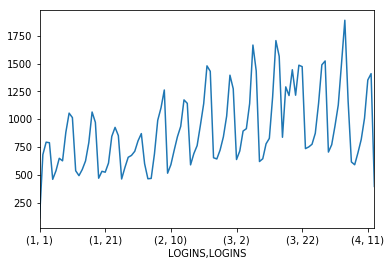

In [24]:
df_login.groupby([df_login.LOGINS.dt.month,df_login.LOGINS.dt.day]).Minute.count().plot()

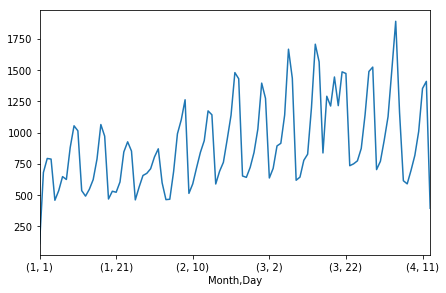

In [25]:
df_login.groupby([df_login.Month,df_login.Day]).LOGINS.count().plot(figsize =(7,4.5))

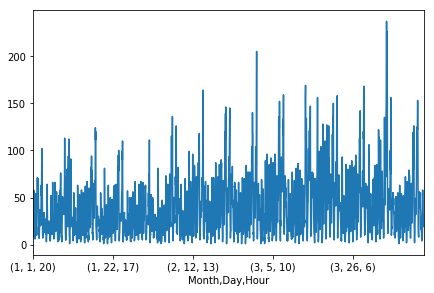

In [26]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour]).LOGINS.count().plot(figsize =(7,4.5))

## There is an average of 38 logins per hour 

In [27]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour]).LOGINS.size().mean()

38.09488752556237

In [28]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour]).LOGINS.count().mean()

38.09488752556237

## An average of 9.9 logins per quarter of hour

In [29]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.size().mean()

9.920332303759718

## An average of 23,286 logins per month

In [30]:
df_login.groupby([df_login.Month]).LOGINS.size().mean()

23285.5

In [31]:
df_login_March = df_login[df_login.Month ==3]


df_login_March.Month.value_counts()

3    33723
Name: Month, dtype: int64

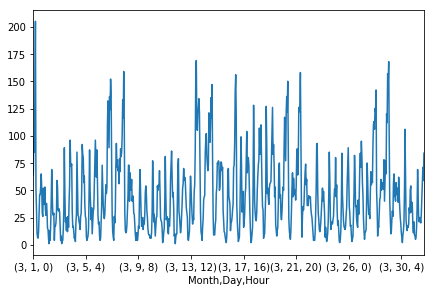

In [32]:
df_login_March.groupby([df_login_March.Month,df_login_March.Day,df_login_March.Hour]).LOGINS.count().plot(figsize =(7,4.5))

In [33]:
# study data for 1 week in March
df_March_wk = df_login[(df_login.Month ==3) & (df_login.Day <8)]

df_March_wk.head()

,LOGINS,Year,Month,Day,Hour,Minute,Quarter
45910,1970-03-01 00:09:22,1970,3,1,0,9,1
45913,1970-03-01 00:03:03,1970,3,1,0,3,1
45914,1970-03-01 00:04:45,1970,3,1,0,4,1
45915,1970-03-01 00:05:47,1970,3,1,0,5,1
45916,1970-03-01 00:07:22,1970,3,1,0,7,1


In [34]:
# study data for 1 day in March
#df_March_day = df_login[(df_login.Month ==3) & (df_login.Day ==5)]
df_March_day = df_login[(df_login.Month ==3) & (df_login.Day == 12)]

df_March_day.head()

,LOGINS,Year,Month,Day,Hour,Minute,Quarter
56609,1970-03-12 00:00:57,1970,3,12,0,0,1
56616,1970-03-12 00:00:25,1970,3,12,0,0,1
56622,1970-03-12 00:06:18,1970,3,12,0,6,1
56627,1970-03-12 00:05:10,1970,3,12,0,5,1
56628,1970-03-12 00:11:29,1970,3,12,0,11,1


In [35]:
df_March_wk.Day.value_counts()

7    1666
1    1273
6    1140
5     914
4     893
3     714
2     637
Name: Day, dtype: int64

## One Week in March

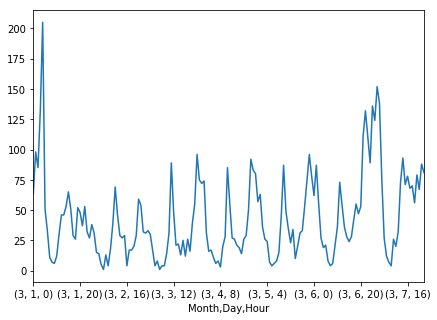

In [36]:
df_March_wk.groupby([df_March_wk.Month,df_March_wk.Day,df_March_wk.Hour]).LOGINS.count().plot(figsize =(7,5))

## One Day in March

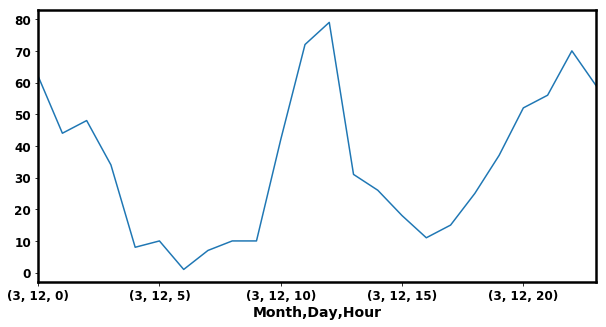

In [37]:
#df_March_day.groupby([df_March_day.Month,df_March_day.Day,df_March_day.Hour]).LOGINS.count().plot(figsize =(7,5))
fig, ax = plt.subplots(figsize=(10, 5))
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.5)
    
plt.xticks(fontsize=12,fontweight='bold')
plt.yticks(fontsize=12,fontweight='bold')

plt.xlabel('Hour of the Day',fontsize=14,fontweight='bold')
df_March_day.groupby([df_March_day.Month,df_March_day.Day,df_March_day.Hour]).LOGINS.count().plot(figsize =(10,5))
plt.savefig('Ultimate_LoginsPerHour_OneDay_EDA.png')

## Logins per hour & quarter of hours for one day in March

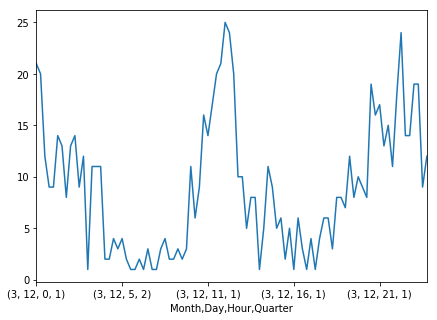

In [38]:
df_March_day.groupby([df_March_day.Month,df_March_day.Day,df_March_day.Hour,df_March_day.Quarter]).LOGINS.count().plot(figsize =(7,5))

In [39]:
#plt.plot(df_login.LOGINS,df_login.groupby([df_login.Month,df_login.Day]).LOGINS.count())
#plt.show()

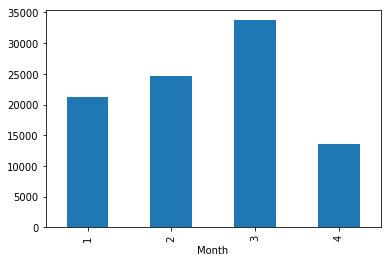

In [40]:
df_login.groupby([df_login.Month]).Minute.count().plot(kind='bar')

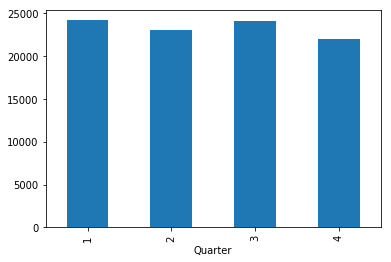

In [41]:
df_login.groupby([df_login.Quarter]).Hour.count().plot(kind='bar')

## All Data grouped by Hour of the Day: Number of Logins Per Hour

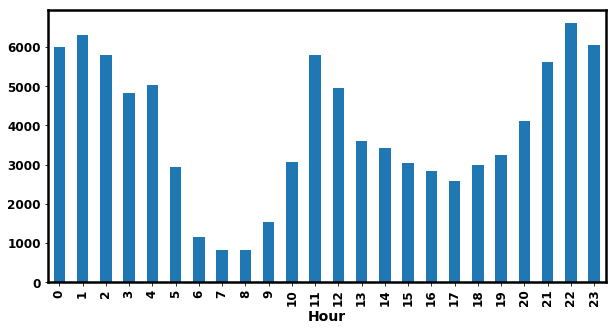

In [42]:
fig, ax = plt.subplots(figsize=(10,5))
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(2.5)
    
plt.xticks(fontsize=12,fontweight='bold')
plt.yticks(fontsize=12,fontweight='bold')
plt.xlabel('Hour of the Day',fontsize=14,fontweight='bold')
df_login.groupby([df_login.Hour]).LOGINS.count().plot(kind='bar',figsize =(10,5))

plt.savefig('Ultimate_LoginsPerHour_AllData_EDA.png')

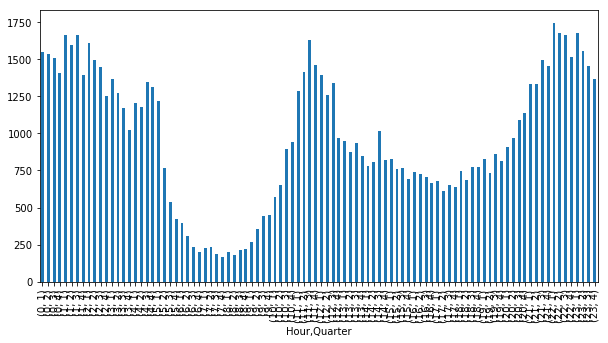

In [43]:
df_login.groupby([df_login.Hour,df_login.Quarter]).LOGINS.count().plot(kind='bar',figsize =(10,5))

## The peak hours for Ultimate service use are: 1 AM, 11 AM & 10 PM 

In [44]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour]).Minute.count()

Month  Day  Hour
1      1    20      24
            21       9
            22      21
            23      58
       2    0       53
            1       33
            2       43
            3       28
            4        9
            5       11
            6        7
            7        6
            8        8
            9       12
            10      28
            11      53
            12      54
            13      20
            14      25
            15      16
            16      19
            17      17
            18      10
            19      24
            20      42
            21      41
            22      71
            23      51
       3    0       39
            1       54
                    ..
4      12   13      47
            14      56
            15      54
            16      51
            17      51
            18      45
            19      48
            20      48
            21      55
            22      38
            23      36
       13   0    

In [45]:
df_login.Minute.value_counts()

41    1671
49    1662
40    1653
39    1646
37    1627
21    1627
44    1620
55    1613
42    1609
43    1601
33    1600
36    1596
16    1593
45    1591
50    1590
48    1590
46    1584
10    1583
35    1582
52    1579
17    1577
20    1576
32    1573
12    1569
27    1568
54    1562
34    1560
31    1557
22    1556
51    1556
59    1555
38    1551
47    1547
56    1545
13    1543
11    1540
0     1539
58    1535
5     1534
53    1527
28    1525
14    1516
30    1516
18    1515
57    1509
19    1504
15    1502
6     1499
25    1497
24    1497
29    1493
3     1492
2     1491
8     1484
26    1482
9     1471
4     1471
7     1467
23    1463
1     1461
Name: Minute, dtype: int64

In [46]:
df_login.Quarter.value_counts()

1    24162
3    24037
2    22989
4    21954
Name: Quarter, dtype: int64

In [47]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.count()

Month  Day  Hour  Quarter
1      1    20    1           2
                  2           6
                  3           9
                  4           7
            21    1           2
                  2           3
                  4           4
            22    1           9
                  2           8
                  3           1
                  4           3
            23    1          16
                  2          15
                  3          16
                  4          11
       2    0     1          11
                  2          19
                  3          14
                  4           9
            1     1           9
                  2           8
                  3          10
                  4           6
            2     1           7
                  2          18
                  3          12
                  4           6
            3     1          13
                  2           4
                  3           6
              

In [48]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.size().sort_values(ascending=False)

Month  Day  Hour  Quarter
3      1    4     3          73
4      4    5     3          65
                  1          63
            1     3          63
                  2          62
            5     2          60
            1     1          59
       1    23    3          58
3      13   22    2          55
4      4    4     4          54
            0     3          54
            1     4          53
3      17   1     3          51
       28   4     3          51
4      4    3     1          51
3      8    4     4          50
            5     1          50
2      15   4     4          50
3      29   2     2          50
       22   4     1          50
       29   4     4          49
       7    3     1          49
4      4    4     3          49
       3    22    4          48
       4    0     4          47
3      13   22    1          47
4      3    23    2          46
3      22   1     3          46
            4     3          46
       13   21    3          46
              

In [49]:
df_login.groupby([df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.size().sort_values(ascending=False)

Day  Hour  Quarter
4    1     3          109
1    4     3          109
4    1     2          109
6    22    1          102
8    2     1          100
4    5     1           98
     1     4           97
3    23    2           96
7    4     3           96
4    0     3           96
6    22    2           95
4    1     1           94
6    21    4           93
8    4     4           93
1    23    3           93
13   23    1           91
6    22    3           91
8    5     1           90
3    22    4           90
15   4     1           89
28   4     3           89
7    3     1           86
     1     1           86
4    4     4           86
22   3     3           86
8    3     2           86
28   2     2           85
     4     4           84
8    2     3           84
22   4     2           84
                     ... 
19   8     2            2
25   8     4            2
20   7     4            2
14   8     3            2
15   9     2            2
30   5     2            2
     6     1       

In [50]:
df_login.groupby([df_login.Hour,df_login.Quarter]).LOGINS.size().sort_values(ascending=False)

Hour  Quarter
22    1          1746
23    1          1677
22    2          1677
      3          1666
1     3          1665
      1          1662
11    3          1633
2     1          1607
1     2          1596
23    2          1557
0     1          1547
      2          1533
22    4          1518
0     3          1508
21    3          1498
2     2          1496
11    4          1463
21    4          1456
23    3          1454
2     3          1446
11    2          1416
0     4          1405
1     4          1394
12    1          1393
3     1          1370
23    4          1370
4     3          1344
12    3          1343
21    1          1335
      2          1334
                 ... 
19    2           731
16    2           725
      3           703
15    4           691
18    2           688
17    1           679
16    4           664
10    2           654
17    3           653
      4           639
      2           613
10    1           569
5     3           537
9     4           

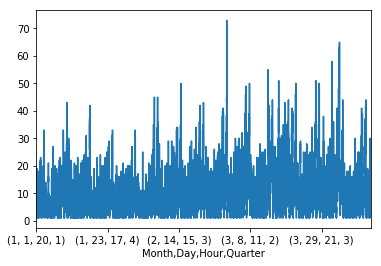

In [51]:
df_login.groupby([df_login.Month,df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.count().plot()

In [52]:
logins_gb = df_login.groupby([df_login.Month,df_login.Day,df_login.Hour,df_login.Quarter]).LOGINS.count()

In [53]:
logins_us = logins_gb.unstack()

logins_us

Quarter            1     2     3     4
Month Day Hour                        
1     1   20     2.0   6.0   9.0   7.0
          21     2.0   3.0   NaN   4.0
          22     9.0   8.0   1.0   3.0
          23    16.0  15.0  16.0  11.0
      2   0     11.0  19.0  14.0   9.0
          1      9.0   8.0  10.0   6.0
          2      7.0  18.0  12.0   6.0
          3     13.0   4.0   6.0   5.0
          4      2.0   NaN   6.0   1.0
          5      6.0   3.0   1.0   1.0
          6      1.0   NaN   2.0   4.0
          7      3.0   1.0   1.0   1.0
          8      3.0   1.0   3.0   1.0
          9      3.0   1.0   6.0   2.0
          10     9.0   7.0   7.0   5.0
          11    10.0  12.0  17.0  14.0
          12    15.0  18.0  14.0   7.0
          13     4.0   5.0   9.0   2.0
          14     7.0   6.0   5.0   7.0
          15     5.0   5.0   2.0   4.0
          16     7.0   3.0   4.0   5.0
          17     6.0   6.0   1.0   4.0
          18     NaN   3.0   3.0   4.0
          19     9.0   6.0   4.0   5.0
          20     8.0   8.0  14.0  12.0
          21     6.0  11.0  11.0  13.0
          22    18.0  17.0  21.0  15.0
          23    13.0  13.0  10.0  15.0
      3   0      7.0   9.0   6.0  17.0
          1     13.0  14.0  18.0   9.0
...              ...   ...   ...   ...
4     12  13    14.0  12.0  17.0   4.0
          14    12.0  19.0  13.0  12.0
          15    15.0  12.0  17.0  10.0
          16     7.0  15.0  10.0  19.0
          17    17.0  11.0  12.0  11.0
          18    12.0  12.0  10.0  11.0
          19    14.0   9.0  14.0  11.0
          20    12.0  10.0  12.0  14.0
          21    12.0  12.0  18.0  13.0
          22    11.0   7.0  10.0  10.0
          23     8.0  11.0   9.0   8.0
      13  0     12.0  10.0   7.0   3.0
          1      7.0   3.0   2.0   4.0
          2     11.0   8.0   6.0   5.0
          3      2.0   4.0   3.0   6.0
          4      1.0   4.0   1.0   6.0
          5      1.0   2.0   NaN   1.0
          6      NaN   2.0   NaN   2.0
          7      NaN   3.0   1.0   4.0
          8      4.0   1.0   3.0   1.0
          9      2.0   5.0   NaN   1.0
          10     5.0   5.0  10.0   8.0
          11    30.0   8.0  13.0   7.0
          12     7.0  10.0   9.0  10.0
          13     5.0   4.0   7.0   4.0
          14     4.0   9.0   9.0  10.0
          15    10.0   4.0   3.0   2.0
          16     7.0   8.0   5.0   2.0
          17     5.0   3.0  10.0   4.0
          18     5.0   2.0   7.0   6.0

[2445 rows x 4 columns]

In [54]:
# test function quarter_of_hour(min)

my_mins = [0,12,15,16,18,25,30,35,44,45,50,55,59]

for minute in my_mins:
    print(minute, quarter_of_hour(minute))
    print
    
print('All Done!')

(0, 1)

(12, 1)

(15, 1)

(16, 2)

(18, 2)

(25, 2)

(30, 2)

(35, 3)

(44, 3)

(45, 3)

(50, 4)

(55, 4)

(59, 4)

All Done!


In [55]:
type(logins_us)

pandas.core.frame.DataFrame

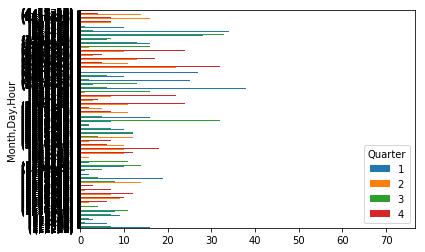

In [56]:
logins_us.plot(kind='barh')

In [57]:
# Determine which hour of the day is the busiest in terms of number of logins!
df_login.groupby([df_login.Hour]).LOGINS.count().sort_values(ascending = False)

Hour
22    6607
1     6317
23    6058
0     5993
2     5800
11    5799
21    5623
4     5034
12    4964
3     4831
20    4103
13    3611
14    3426
19    3235
10    3064
15    3038
18    2980
5     2945
16    2832
17    2584
9     1527
6     1138
8      818
7      815
Name: LOGINS, dtype: int64

## The early hours of the day are the busiest: 10 PM to 4 AM is the peak period for number of logins.

In [58]:
# Determine which hour & quarter of hour of the day is the busiest in terms of number of logins!
# More granular!
df_login.groupby([df_login.Hour,df_login.Quarter]).LOGINS.count().sort_values(ascending = False)

Hour  Quarter
22    1          1746
23    1          1677
22    2          1677
      3          1666
1     3          1665
      1          1662
11    3          1633
2     1          1607
1     2          1596
23    2          1557
0     1          1547
      2          1533
22    4          1518
0     3          1508
21    3          1498
2     2          1496
11    4          1463
21    4          1456
23    3          1454
2     3          1446
11    2          1416
0     4          1405
1     4          1394
12    1          1393
3     1          1370
23    4          1370
4     3          1344
12    3          1343
21    1          1335
      2          1334
                 ... 
19    2           731
16    2           725
      3           703
15    4           691
18    2           688
17    1           679
16    4           664
10    2           654
17    3           653
      4           639
      2           613
10    1           569
5     3           537
9     4           

In [59]:
# Determine which day of the month is the busiest in terms of number of logins!
df_login.groupby([df_login.Day]).LOGINS.count().sort_values(ascending = False)

Day
4     4037
8     4019
7     4006
11    3863
12    3614
28    3540
22    3507
21    3487
3     3475
14    3426
15    3331
10    3297
6     3281
5     3223
1     3194
17    3044
2     3044
13    3021
18    2945
20    2885
19    2859
9     2832
27    2735
25    2348
24    2318
23    2233
16    2215
29    2197
26    2176
31    1575
30    1415
Name: LOGINS, dtype: int64

## Days 4,8, & 7 have the most logins. 

In [60]:
df_login.groupby([df_login.Month]).LOGINS.count().sort_values(ascending = False)

Month
3    33723
2    24673
1    21239
4    13507
Name: LOGINS, dtype: int64

## March is the busiest month in terms of number of logins